In [4]:
import os
import sys
#import hic
#import utilities
import pandas as pd
import numpy as np
import xarray as xr
#import plasma
#import plasma_interaction as pi
#import jets
#import config
import matplotlib.pyplot as plt
import scipy.stats as stats
import scipy.interpolate as interpolate
import numpy.random as rn
from scipy import integrate
from scipy.interpolate import RegularGridInterpolator
from scipy.special import expi

import scipy.optimize as optimize
import fnmatch
# import lhapdf

%matplotlib inline
%config InlineBackend.figure_format='png'
import matplotlib.pyplot as plt
#plt.rcParams['font.family'] = 'Helvetica'

In [2]:
def reduce_mem_usage(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

# Load Data

In [4]:
#####################
# Load CMS RAA data #
#####################

# File path for data files

#C:\Users\Hasan's PC\OneDrive - New Mexico State University\Desktop\HEP\QCD_Jo

CMS_mb_file_path = '/fs1/project/sievert_nt/exp_data/LHC_PbPb_5.02TeV_RAA_HEPData-ins1496050-v2-csv/Table15.csv'
CMS_0_5_file_path = '/fs1/project/sievert_nt/exp_data/LHC_PbPb_5.02TeV_RAA_HEPData-ins1496050-v2-csv/Table8.csv'
CMS_30_50_file_path = '/fs1/project/sievert_nt/exp_data/LHC_PbPb_5.02TeV_RAA_HEPData-ins1496050-v2-csv/Table11.csv'
CMS_50_70_file_path = '/fs1/project/sievert_nt/exp_data/LHC_PbPb_5.02TeV_RAA_HEPData-ins1496050-v2-csv/Table12.csv'

cent_bins = np.array(['0-5', '5-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90'])
RAA_cent_bins = np.array(['0-5', '5-10', '10-20', '20-40', '40-60', '60-80','20-30', '30-40', '40-50', '50-60', '60-70', '70-80'])



CMS_mb_data = pd.read_table(CMS_mb_file_path, header=None, delimiter=',', dtype=np.float64,
                        names=['pt', 'bin_edge_0', 'bin_edge_1', 'RAA', 'stat+', 'stat-', 'syst+', 'syst-', 
                               "sys,TAA +","sys,TAA -","sys,lumi +","sys,lumi -"],
                               skiprows=14)
CMS_0_5_data = pd.read_table(CMS_0_5_file_path, header=None, delimiter=',', dtype=np.float64,
                        names=['pt', 'bin_edge_0', 'bin_edge_1', 'RAA', 'stat+', 'stat-', 'syst+', 'syst-', 
                               "sys,TAA +","sys,TAA -","sys,lumi +","sys,lumi -"],
                               skiprows=14)
CMS_30_50_data = pd.read_table(CMS_30_50_file_path, header=None, delimiter=',', dtype=np.float64,
                        names=['pt', 'bin_edge_0', 'bin_edge_1', 'RAA', 'stat+', 'stat-', 'syst+', 'syst-', 
                               "sys,TAA +","sys,TAA -","sys,lumi +","sys,lumi -"],
                               skiprows=14)
CMS_50_70_data = pd.read_table(CMS_50_70_file_path, header=None, delimiter=',', dtype=np.float64,
                        names=['pt', 'bin_edge_0', 'bin_edge_1', 'RAA', 'stat+', 'stat-', 'syst+', 'syst-', 
                               "sys,TAA +","sys,TAA -","sys,lumi +","sys,lumi -"],
                               skiprows=14)

# if cent_choice == '0-100':
#     p_err = (CMS_mb_data['stat+'] + CMS_mb_data['syst+'] + CMS_mb_data["sys,TAA +"] + CMS_mb_data["sys,lumi +"]).to_numpy()
#     n_err = (CMS_mb_data['stat-'] + CMS_mb_data['syst-'] + CMS_mb_data["sys,TAA -"] + CMS_mb_data["sys,lumi -"]).to_numpy()
#     CMS_raa_pt_array = CMS_mb_data['pt'].to_numpy()
#     CMS_raa_RAA_array = CMS_mb_data['RAA'].to_numpy()
# elif cent_choice == '30-50':
#     p_err = (CMS_30_50_data['stat+'] + CMS_30_50_data['syst+'] + CMS_30_50_data["sys,TAA +"] + CMS_30_50_data["sys,lumi +"]).to_numpy()
#     n_err = (CMS_30_50_data['stat-'] + CMS_30_50_data['syst-'] + CMS_30_50_data["sys,TAA -"] + CMS_30_50_data["sys,lumi -"]).to_numpy()
#     CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
#     CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
# elif cent_choice == '30-50_log':
#     p_err = (CMS_30_50_data['stat+'] + CMS_30_50_data['syst+'] + CMS_30_50_data["sys,TAA +"] + CMS_30_50_data["sys,lumi +"]).to_numpy()
#     n_err = (CMS_30_50_data['stat-'] + CMS_30_50_data['syst-'] + CMS_30_50_data["sys,TAA -"] + CMS_30_50_data["sys,lumi -"]).to_numpy()
#     CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
#     CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()


# fig, axis = plt.subplots()
# axis.set_xlabel(r'$p_T$')
# axis.set_ylabel(r'$R_{AA}$')
# axis.set_title(r'FF Pions')
# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
# i = 0
# for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
#     # Make centrality cut
#     # p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['cent'] == cent)

#     # # Bin pions
#     # pion_counts_pp, pion_bins_pp = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['weight'], bins=200)
#     # #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
#     # pion_counts_AA, pion_bins_AA = np.histogram(partons[p_mask]['pion_pt_f'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)

#     # # Compute R_AA
#     # pion_aa_pp = pion_counts_AA / pion_counts_pp

#     # Get ALICE R_AA
#     alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
#     alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

#     # Plot
#     # axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
#     axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
#     i += 1


# axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent_choice), color=colors[i])  #, linestyle='--'

# axis.legend()
# axis.set_xlim(0, 50)

# #np.savetxt('data_alice.csv', np.stack((alice_raa_pt_array, alice_raa_RAA_array), axis=-1))

In [ ]:
######################################
# Load pp pion yield from ALICE data #
######################################

# File path for data files
pp_file_path =   '/fs1/project/sievert_nt/exp_data/ALICE_data/HEPData-ins1759506-v1-Table_2.csv'
PbPb_file_path =   '/fs1/project/sievert_nt/exp_data/ALICE_data/HEPData-ins1759506-v1-Table_1.csv'
RAA_file_path =   '/fs1/project/sievert_nt/exp_data/ALICE_data/HEPData-ins1759506-v1-Table_15.csv'

cent_bins = np.array(['0-5', '5-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90'])
RAA_cent_bins = np.array(['0-5', '5-10', '10-20', '20-40', '40-60', '60-80','20-30', '30-40', '40-50', '50-60', '60-70', '70-80'])


# Load cross-section data for interpolation
pp_data = pd.read_table(pp_file_path, header=None, delimiter=',', dtype=np.float64,
                            names=['pt', 'bin_edge_0', 'bin_edge_1', 'dN', 'stat+', 'stat-', 'syst+', 'syst-'], skiprows=12)
dNpp = interpolate.interp1d(pp_data['pt'], pp_data['dN'], bounds_error=False, fill_value='extrapolate')

PbPb_data = pd.DataFrame({})
i = 0
for cent in cent_bins:
    # Read relevant centrality section
    PbPb_data_cent = pd.read_table(PbPb_file_path, header=None, delimiter=',', dtype=np.float64,
                            names=['pt', 'bin_edge_0', 'bin_edge_1', 'dN', 'stat+', 'stat-', 'syst+', 'syst-', 'uncsyst+', 'uncsyst-'],
                                   skiprows=13+(i*64), nrows=58)
    
    # Make centrality series
    PbPb_data_cent['cent'] = np.full_like(PbPb_data_cent['pt'].to_numpy(), cent, dtype=object)
    
    # Append to dataframes
    PbPb_data = pd.concat([PbPb_data, PbPb_data_cent])
    
    i += 1

RAA_data = pd.DataFrame({})
i = 0
for cent in RAA_cent_bins:
    # Read relevant centrality section
    RAA_data_cent = pd.read_table(RAA_file_path, header=None, delimiter=',', dtype=np.float64,
                            names=['pt', 'bin_edge_0', 'bin_edge_1', 'RAA', 'stat+', 'stat-', 'syst+', 'syst-'],
                                   skiprows=14+(i*65), nrows=58)
    
    # Make centrality series
    RAA_data_cent['cent'] = np.full_like(RAA_data_cent['pt'].to_numpy(), cent, dtype=object)
    
    # Append to dataframes
    RAA_data = pd.concat([RAA_data, RAA_data_cent])
    
    i += 1
    # PbPb_data = pd.read_table(pp_file_path, header=None, delimiter=',', dtype=np.float64,
    #                         names=['pt', 'bin_edge_0', 'bin_edge_1', 'dN', 'stat+', 'stat-', 'syst+', 'syst-'], skiprows=12)

In [8]:
# Add these to partons!



# old_p_cols = ['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el', 'drift', 'fg', 'cel',
#           'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el', 'q_drift', 'e2',
#           'Tmax_event', 'b', 'rmax', 'time_total_plasma', 'jetNo', 'x_0', 'process_run', 'seed', 'fgqhat', 
#           'q_fg_utau_qhat',  'q_fg_uperp_qhat', 'Tavg_qgp_parton', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
#           'npart']

# For general things
# p_cols = ['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el', 'drift', 'fg', 'cel',
#           'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el', 'q_drift', 'e2', 'AA_weight', 'hadron_pt_0', 'hadron_pt_f',
#           'Tmax_event', 'b', 'rmax', 'time_total_plasma', 'partonNo', 'x_0', 'y_0', 'process_run', 'seed', 'fgqhat', 
#           'q_fg_utau_qhat',  'q_fg_uperp_qhat', 'Tavg_qgp_parton', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
#           'urqmd_re_q_3', 'urqmd_im_q_3', 'urqmd_re_q_4', 'urqmd_im_q_4', 'npart', 'K_F_DRIFT']

# For v_n
# p_cols = ['pt_f', 'mult', 'drift', 'cel', 'seed', 'pt_0', 'e2', 'e3', 'e4', 'psi_e2', 'psi_e3', 'psi_e4', 'weight',
#           'phi_0', 'phi_f', 'psi_2', 'AA_weight', 'hadron_pt_0', 'hadron_pt_f', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
#           'urqmd_re_q_3', 'urqmd_im_q_3', 'urqmd_re_q_4', 'urqmd_im_q_4', 'K_F_DRIFT']
#p_cols = ['seed', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N']
p_cols = ['pt_f', 'mult', 'drift', 'cel', 'seed', 'pt_0', 'e2', 'e3', 'e4', 'psi_e2', 'psi_e3', 'psi_e4', 'weight',
          'phi_0', 'phi_f', 'psi_2', 'AA_weight', 'hadron_pt_0', 'hadron_pt_f', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
          'urqmd_re_q_3', 'urqmd_im_q_3', 'urqmd_re_q_4', 'urqmd_im_q_4', 'K_F_DRIFT', 'Tmax_event', 'process', 'process_run']

partons = pd.DataFrame({})
# all = ['jetNo', 'tag', 'weight', 'id', 'pt', 'pt_f', 'q_el', 'q_drift',
#        'q_drift_abs', 'q_grad', 'q_grad_abs', 'q_fg', 'q_fg_abs',
#        'extinguished', 'x0', 'y0', 'phi_0', 'phi_f', 't_qgp', 't_hrg',
#        't_unhydro', 'time_total_plasma', 'time_total_hrg',
#        'time_total_unhydro', 'Tmax_jet', 'initial_time', 'final_time', 'tau',
#        'Tmax_event', 'drift', 'grad', 'el', 'fg', 'exit', 'process', 'b',
#        'npart', 'ncoll', 'mult', 'e2_re', 'e2_im', 'psi_e2', 'e3_re', 'e3_im',
#        'psi_e3', 'e4_re', 'e4_im', 'psi_e4', 'e5_re', 'e5_im', 'psi_e5',
#        'seed', 'rmax', 'e2', 'e3', 'e4', 'e5', 'q_2_re', 'q_2_im', 'psi_2',
#        'q_3_re', 'q_3_im', 'psi_3', 'v_2', 'v_3', 'z', 'pp_z', 'pion_pt']

# dir_list = np.array(['/fs1/project/sievert_nt/jma_data/raa-v2/g2.0_cel',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_0',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_1',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_2',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_3',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_4'])
dir_list = np.array(["C:\\Users\\Hasan\'s PC\\OneDrive - New Mexico State University\\Desktop\\HEP\\QCD_Jo\\2024.08.03_partons"])

for i in np.arange(0, len(dir_list)):
    dir =  str(dir_list[i])
    data_files = np.array(os.listdir(dir))
    p_files = fnmatch.filter(data_files, '*partons*.parquet')
    
    print(dir)
    
    #load_events = 100000
    print('{} parton files'.format(len(p_files)))
    
    # k=0
    # try:
    #     if k < len(p_files):
    #         loaded_df = pd.read_parquet(dir + '/' + p_files[k])
    #         #loaded_df = reduce_mem_usage(loaded_df)
    #         print('Available columns:')
    #         print(loaded_df.columns.to_numpy())
            
    # except ValueError:
    #     print('empty file')
    #     k += 1
    
    i = 0
    try:
        for file in p_files[0:1]:
            print('loading files ... {}%'.format(i*100/len(p_files)))
            try:
                loaded_df = pd.read_parquet(dir + '/' + file, columns=p_cols)
                #loaded_df = reduce_mem_usage(loaded_df)
                partons = pd.concat([partons, loaded_df], axis=0)
            except ValueError:
                print('empty file')
            try:
                loaded_events = int(len(partons['seed'].value_counts()))
                print('Loaded ~{} events'.format(loaded_events))
                # if loaded_events > load_events:
                #     break
            except:
                pass
            i += 1
    except Exception as error:
        # handle the exception
        print("An exception occurred:", type(error).__name__, "–", error)
    print('Loaded {} files'.format(i))
    #print('{}% loaded'.format(i*100/len(p_files)))

C:\Users\Hasan's PC\OneDrive - New Mexico State University\Desktop\HEP\QCD_Jo\2024.08.03_partons
2 parton files
Available columns:
['partonNo' 'tag' 'weight' 'AA_weight' 'id' 'pt_0' 'pt_f' 'q_el' 'q_cel'
 'q_drift' 'q_drift_abs' 'q_fg_utau' 'q_fg_utau_abs' 'q_fg_uperp'
 'q_fg_uperp_abs' 'q_fg_utau_qhat' 'q_fg_utau_qhat_abs' 'q_fg_uperp_qhat'
 'q_fg_uperp_qhat_abs' 'extinguished' 'x_0' 'y_0' 'phi_0' 'phi_f' 't_qgp'
 't_hrg' 't_unhydro' 'time_total_plasma' 'time_total_hrg'
 'time_total_unhydro' 'Tmax_parton' 'Tavg_qgp_parton' 'initial_time'
 'final_time' 'dtau' 'Tmax_event' 'drift' 'el' 'cel' 'el_num' 'fg'
 'fgqhat' 'exit' 'g' 'K_F_DRIFT' 'K_FG_DRIFT' 'process' 'b' 'npart'
 'ncoll' 'mult' 'e2_re' 'e2_im' 'psi_e2' 'e3_re' 'e3_im' 'psi_e3' 'e4_re'
 'e4_im' 'psi_e4' 'e5_re' 'e5_im' 'psi_e5' 'seed' 'rmax' 'e2' 'e3' 'e4'
 'e5' 'urqmd_re_q_1' 'urqmd_im_q_1' 'urqmd_re_q_2' 'urqmd_im_q_2'
 'urqmd_re_q_3' 'urqmd_im_q_3' 'urqmd_re_q_4' 'urqmd_im_q_4'
 'urqmd_re_q_5' 'urqmd_im_q_5' 'urqmd_re_q_6' '

In [30]:
flow_N = partons['urqmd_flow_N'][0]
event_soft_psi2 = np.angle(partons['urqmd_re_q_2'][0]
                                                + 1j * partons['urqmd_im_q_2'][0])
event_soft_v2 = np.abs(partons['urqmd_re_q_2'][0]
                                + 1j * partons['urqmd_im_q_2'][0]) / flow_N

##### Export phi points

In [ ]:
# Add these to partons!



# old_p_cols = ['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el', 'drift', 'fg', 'cel',
#           'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el', 'q_drift', 'e2',
#           'Tmax_event', 'b', 'rmax', 'time_total_plasma', 'jetNo', 'x_0', 'process_run', 'seed', 'fgqhat', 
#           'q_fg_utau_qhat',  'q_fg_uperp_qhat', 'Tavg_qgp_parton', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
#           'npart']

# For general things
# p_cols = ['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el', 'drift', 'fg', 'cel',
#           'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el', 'q_drift', 'e2', 'AA_weight', 'hadron_pt_0', 'hadron_pt_f',
#           'Tmax_event', 'b', 'rmax', 'time_total_plasma', 'partonNo', 'x_0', 'y_0', 'process_run', 'seed', 'fgqhat', 
#           'q_fg_utau_qhat',  'q_fg_uperp_qhat', 'Tavg_qgp_parton', 'urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_flow_N',
#           'urqmd_re_q_3', 'urqmd_im_q_3', 'urqmd_re_q_4', 'urqmd_im_q_4', 'npart', 'K_F_DRIFT']

# For v_n
p_cols = ['urqmd_re_q_2', 'urqmd_im_q_2', 'urqmd_re_q_3', 'urqmd_im_q_3', 'urqmd_re_q_4', 'urqmd_im_q_4']

partons = pd.DataFrame({})
# all = ['jetNo', 'tag', 'weight', 'id', 'pt', 'pt_f', 'q_el', 'q_drift',
#        'q_drift_abs', 'q_grad', 'q_grad_abs', 'q_fg', 'q_fg_abs',
#        'extinguished', 'x0', 'y0', 'phi_0', 'phi_f', 't_qgp', 't_hrg',
#        't_unhydro', 'time_total_plasma', 'time_total_hrg',
#        'time_total_unhydro', 'Tmax_jet', 'initial_time', 'final_time', 'tau',
#        'Tmax_event', 'drift', 'grad', 'el', 'fg', 'exit', 'process', 'b',
#        'npart', 'ncoll', 'mult', 'e2_re', 'e2_im', 'psi_e2', 'e3_re', 'e3_im',
#        'psi_e3', 'e4_re', 'e4_im', 'psi_e4', 'e5_re', 'e5_im', 'psi_e5',
#        'seed', 'rmax', 'e2', 'e3', 'e4', 'e5', 'q_2_re', 'q_2_im', 'psi_2',
#        'q_3_re', 'q_3_im', 'psi_3', 'v_2', 'v_3', 'z', 'pp_z', 'pion_pt']

# dir_list = np.array(['/fs1/project/sievert_nt/jma_data/raa-v2/g2.0_cel',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_0',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_1',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_2',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_3',
#                      '/fs1/project/sievert_nt/jma_data/raa-v2/lanl05_set_4'])
dir_list = np.array(['/fs1/project/sievert_nt/ape_data/drift_letter/2024.08.03'])

for i in np.arange(0, len(dir_list)):
    dir =  str(dir_list[i])
    data_files = np.array(os.listdir(dir))
    p_files = fnmatch.filter(data_files, '*hadrons*.parquet')
    
    print(dir)
    
    #load_events = 100000
    print('{} parton files'.format(len(p_files)))
    
    # k=0
    # try:
    #     if k < len(p_files):
    #         loaded_df = pd.read_parquet(dir + '/' + p_files[k])
    #         #loaded_df = reduce_mem_usage(loaded_df)
    #         print('Available columns:')
    #         print(loaded_df.columns.to_numpy())
            
    # except ValueError:
    #     print('empty file')
    #     k += 1
    
    i = 0
    try:
        for file in p_files[1:2]:
            print('loading files ... {}%'.format(i*100/len(p_files)))
            try:
                loaded_df = pd.read_parquet(dir + '/' + file, columns=p_cols)
                #loaded_df = reduce_mem_usage(loaded_df)
                partons = pd.concat([partons, loaded_df], axis=0)
            except ValueError:
                print('empty file')
            try:
                loaded_events = int(len(partons['seed'].value_counts()))
                print('Loaded ~{} events'.format(loaded_events))
                # if loaded_events > load_events:
                #     break
            except:
                pass
            i += 1
    except Exception as error:
        # handle the exception
        print("An exception occurred:", type(error).__name__, "–", error)
    print('Loaded {} files'.format(i))
    #print('{}% loaded'.format(i*100/len(p_files)))

/fs1/project/sievert_nt/ape_data/drift_letter/2024.08.03
20 parton files
loading files ... 0.0%


In [6]:
partons['seed'].value_counts()

KeyError: 'seed'

In [31]:
mask = ((partons['drift'] == True) 
        & (partons['cel'] == False) 
        & (partons['K_F_DRIFT'] == 1)
        & (partons['seed'] == 9374911952142496)
        & (partons['hadron_pt'] > 1)
        & (partons['hadron_pt'] < 3))

In [32]:
phis = partons[mask]['phi_f'].to_numpy()
weights = partons[mask]['AA_weight'].to_numpy()

Text(0, 0.5, '$N$')

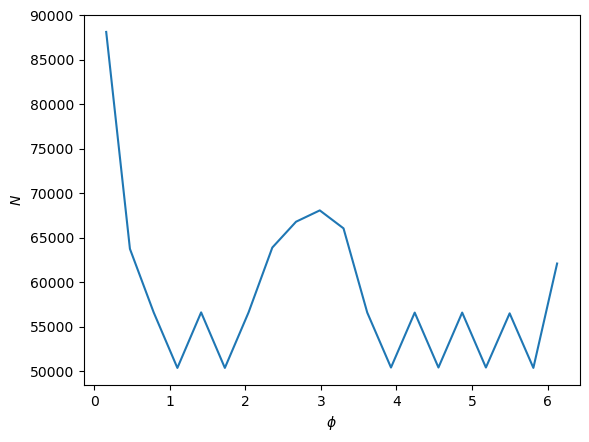

In [39]:
counts, bins = np.histogram(phis, weights=weights, bins=20)
plt.plot((bins[0:-1]+bins[1:])/2, counts)
plt.xlabel(r'$\phi$')
plt.ylabel(r'$N$')

Text(0, 0.5, '$N$')

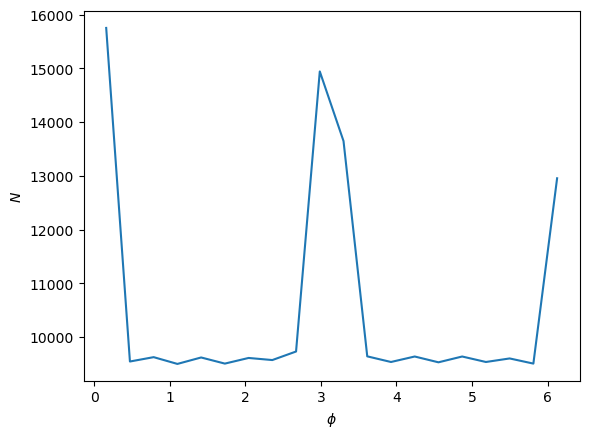

In [40]:
counts, bins = np.histogram(phis, bins=20)
plt.plot((bins[0:-1]+bins[1:])/2, counts)
plt.xlabel(r'$\phi$')
plt.ylabel(r'$N$')

In [41]:
np.savetxt("phis.csv", phis, delimiter = ",")
np.savetxt("weights.csv", weights, delimiter = ",")

In [ ]:
counts, bins = np.histogram(partons['id'], weights=partons['AA_weight'])


<BarContainer object of 10 artists>

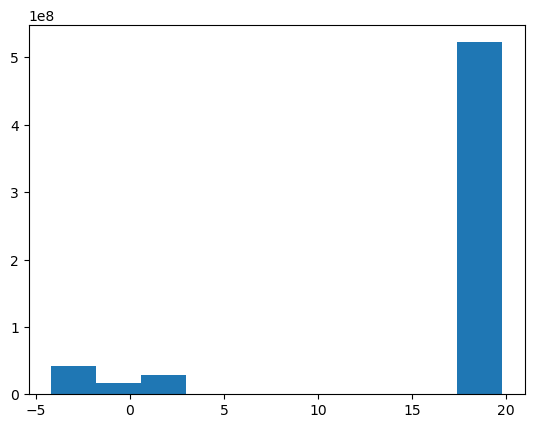

In [10]:
plt.bar(bins[0:-1], counts, width=bins[1:]-bins[0:-1])

# Inspect raw data

In [9]:
print('min pp weight: {}'.format(np.amin(partons['weight'])))
print('max pp weight: {}'.format(np.amax(partons['weight'])))
print('min AA weight: {}'.format(np.amin(partons['AA_weight'])))
print('max AA weight: {}'.format(np.amax(partons['AA_weight'])))

min pp weight: 0.00010009680704533632
max pp weight: 8961.87144171654
min AA weight: 8.58105735496141e-05
max AA weight: 8961.87144171654


# Process Data

In [20]:
# Create pion momentum series
# partons['pion_pt_f'] = partons['z']*partons['pt_f']
# partons['pion_pt'] = partons['pp_z']*partons['pt']

partons = partons.replace([np.nan, -np.inf], 0)
partons = partons.replace([np.inf], np.nan)
partons = partons.dropna()

# partons['pt'] = partons['pt_0']
# partons['hadron_pt_f'] = partons['z']*partons['pt_f']
# partons['hadron_pt_0'] = partons['pp_z']*partons['pt']

# partons_c['pt'] = partons_c['pt_0']
# partons_c['pion_pt_f'] = partons_c['z']*partons_c['pt_f']
# partons_c['pion_pt'] = partons_c['pp_z']*partons_c['pt']

# partons_d['pt'] = partons_d['pt_0']
# partons_d['pion_pt_f'] = partons_d['z']*partons_d['pt_f']
# partons_d['pion_pt'] = partons_d['pp_z']*partons_d['pt']


In [9]:
######################
# Centrality Binning #
######################
'''
Binning the data according to multiplicity bins to mimic experimental "centrality".
'''
# print('Plotting multiplicity distribution')
# fig, axis = plt.subplots()
# axis.set_xlabel(r'$mult.$')
# axis.set_ylabel(r'$N$')#, rotation=0)
# df = partons

# avg_array = np.array([])
# for seed in df['seed'].value_counts().index.to_numpy():
#     # bin data
#     mask = (df['seed'] == seed)

#     # average
#     avg = np.mean(df[mask]['mult'])
#     avg_array = np.append(avg_array, avg)

# axis.hist(avg_array, bins=250)#, marker='+')

# axis.legend()
#avg_array = np.load('mult_list.npz')['arr_0.npy']


    #0603010


print('Binning by centrality')
# Bin by centrality using percentile bounds on multiplicity
# Create percentile bounds using partonic data
# -- partonic data should have constant number of entries per event, so
# -- no need for craziness
# Apply label series to each entry
cent_bins = np.array(['90-100', '80-90', '70-80', '50-70',
                      '30-50', '20-30', '0-20'])#np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
                      #'30-40', '20-30', '10-20', '5-10', '0-5'])
q_bins = np.array([0, 0.1, 0.2, 0.3, 0.5, 0.7, 0.8, 1])#np.array([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1])

# # Bin g=2
#parton_cents, mult_bins = pd.qcut(avg_array, q=q_bins, labels=cent_bins, retbins=True)
# #hadron_cents = pd.cut(hadrons['mult'], bins=mult_bins, labels=cent_bins)
# partons['cent'] = parton_cents

# Bin according to saved mult bins:
#saved_bins = np.load('/fs1/project/sievert_nt/ape_data/raa-v2/lanl05_g2.1_set_0/mult_bins.npy')

# Bin g=2.2
#parton_cents_b, mult_bins_b = pd.cut(partons['mult'], bins=saved_bins, labels=cent_bins, retbins=True)
parton_cents_b, mult_bins_b = pd.qcut(partons['mult'], q=q_bins, labels=cent_bins, retbins=True)
#parton_cents_b, mult_bins_b = pd.qcut(partons['mult'], q=q_bins, labels=cent_bins, retbins=True)#, bins=mult_bins)
#hadron_cents = pd.cut(hadrons['mult'], bins=mult_bins, labels=cent_bins)
partons['cent'] = parton_cents_b

# parton_cents_c, mult_bins_c = pd.cut(partons_c['mult'], bins=mult_bins_b, labels=cent_bins, retbins=True)
# partons_c['cent'] = parton_cents_c

# parton_cents_d, mult_bins_d = pd.cut(partons_d['mult'], bins=mult_bins_b, labels=cent_bins, retbins=True)
# partons_d['cent'] = parton_cents_d
#hadrons['cent'] = hadron_cents
print('done')

Binning by centrality
ERROR! Session/line number was not unique in database. History logging moved to new session 48
done


In [30]:
mult_bins_b

array([1.75815258e-01, 6.71416081e+00, 2.70752026e+01, 7.47497935e+01,
       3.35245056e+02, 9.61834280e+02, 1.52528980e+03, 4.05629346e+03])

In [28]:
np.array([1.75815258e-01, 6.71416081e+00, 2.70752026e+01, 7.47497935e+01,
       1.68345023e+02, 3.35245056e+02, 5.84230219e+02, 9.61834280e+02,
       1.52528980e+03, 2.33902211e+03, 2.89275723e+03, 4.05629346e+03])[-1]

np.float64(4056.29346)

In [14]:
# partons['hadron_pt_f'] = partons['z']*partons['pt_f']
# partons['hadron_pt_0'] = partons['pp_z']*partons['pt_0']
partons['psi_3'] = np.angle(partons['urqmd_re_q_3'] + 1j * partons['urqmd_im_q_3'])
partons['psi_4'] = np.angle(partons['urqmd_re_q_4'] + 1j * partons['urqmd_im_q_4'])

partons['v2'] = np.abs(partons['urqmd_re_q_2']
                     + 1j * partons['urqmd_im_q_2']) / partons['urqmd_flow_N']

In [10]:
partons['defl'] = np.abs(np.mod(partons['phi_f'] - partons['phi_0'] + np.pi, 2*np.pi) - np.pi)

In [11]:
partons[(partons['cel'] == True) & (partons['drift'] == True)].loc[:, ['defl', 'weight', 'AA_weight', 'pt_0', 'pt_f', 'hadron_pt_0', 'hadron_pt_f', 'cent', 'K_F_DRIFT']].to_parquet('deflections_CELTrue_2024.08.03.parquet')

In [12]:
partons[(partons['cel'] == False) & (partons['drift'] == True)].loc[:, ['defl', 'weight', 'AA_weight', 'pt_0', 'pt_f', 'hadron_pt_0', 'hadron_pt_f', 'cent', 'K_F_DRIFT']].to_parquet('deflections_CELFalse_2024.08.03.parquet')

## Continuous Fragmentation?

In [9]:
ff = lhapdf.mkPDF("JAM20-SIDIS_FF_hadron_nlo")

LHAPDF 6.5.4 loading /fs1/home/jbahder/.conda/envs/ape_run/share/LHAPDF/JAM20-SIDIS_FF_hadron_nlo/JAM20-SIDIS_FF_hadron_nlo_0000.dat
JAM20-SIDIS_FF_hadron_nlo PDF set, member #0, version 2; LHAPDF ID = 2052500


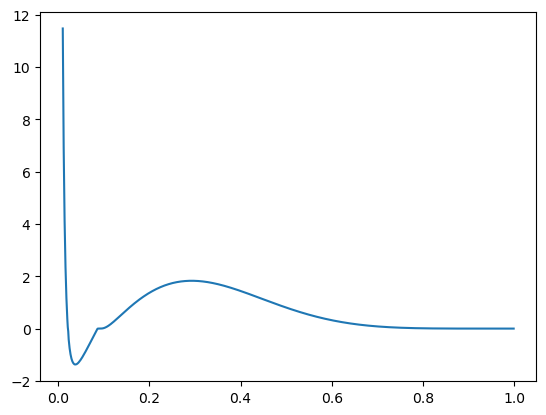

In [34]:
z_array = np.arange(0.01, 1, 0.001)
p_z_arr = np.array([])
Q = 1
for z in z_array:
    Q2 = Q ** 2
    p_z = (1/z) * ff.xfxQ2(21, z, Q2)
    p_z_arr = np.append(p_z_arr, p_z)

plt.plot(z_array, p_z_arr)

def d_z(Q):
    Q2 = Q **2
    return lambda z : z*  ff.xfxQ2(21, z, Q2)

/tmp/jbahder-tmpdir-wfrQaO/ipykernel_2680054/2183190102.py:3: RuntimeWarning: divide by zero encountered in divide
  p_dist = lambda E : 1/E**(4)
/tmp/jbahder-tmpdir-wfrQaO/ipykernel_2680054/2183190102.py:7: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  plt.plot(E_vals, integrate.quad(d_z(Q), 0.01, 1)[0] *  p_dist(E_vals))


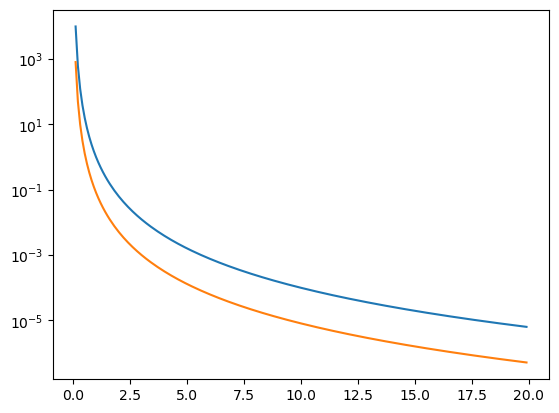

In [36]:
import scipy.integrate as integrate
E_vals = np.arange(0, 20, 0.1)
p_dist = lambda E : 1/E**(4)
h_dist = p_dist

plt.plot(E_vals, p_dist(E_vals))
plt.plot(E_vals, integrate.quad(d_z(Q), 0.01, 1)[0] *  p_dist(E_vals))
plt.yscale('log')

In [ ]:
mask = (partons['cel'] == False) & (partons['drift'] == True) & (partons['K_F_DRIFT'] == 1)



## Acoplanarity Selection Cuts

In [23]:
partons

,pt_f,mult,drift,cel,seed,pt_0,e2,e3,e4,psi_e2,...,urqmd_im_q_3,urqmd_re_q_4,urqmd_im_q_4,K_F_DRIFT,Tmax_event,process,process_run,cent,psi_3,psi_4
0,11.034237,100.457417,False,False,2203518025324095,11.284318,0.550496,0.261238,0.407405,0.108179,...,238.309301,-35.884618,-127.19494,1.0,0.369324,359903930000,0,50-70,2.450178,-1.845773
0,9.244637,100.457417,False,False,2203518025324095,11.284318,0.550496,0.261238,0.407405,0.108179,...,238.309301,-35.884618,-127.19494,1.0,0.369324,359903930000,0,50-70,2.450178,-1.845773
0,11.034311,100.457417,True,False,2203518025324095,11.284318,0.550496,0.261238,0.407405,0.108179,...,238.309301,-35.884618,-127.19494,1.0,0.369324,359903930000,1,50-70,2.450178,-1.845773
0,9.24461,100.457417,True,False,2203518025324095,11.284318,0.550496,0.261238,0.407405,0.108179,...,238.309301,-35.884618,-127.19494,1.0,0.369324,359903930000,1,50-70,2.450178,-1.845773
0,11.034331,100.457417,True,False,2203518025324095,11.284318,0.550496,0.261238,0.407405,0.108179,...,238.309301,-35.884618,-127.19494,1.25,0.369324,359903930000,2,50-70,2.450178,-1.845773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,11.420699,1636.048736,True,True,98900595207915,25.138064,0.241534,0.136018,0.129222,0.132165,...,186.245079,-369.479073,6.487024,0.75,0.546608,49790855182,87,0-20,1.501959,3.124037
0,13.583086,1636.048736,True,True,98900595207915,25.138064,0.241534,0.136018,0.129222,0.132165,...,186.245079,-369.479073,6.487024,1.25,0.546608,49790855182,86,0-20,1.501959,3.124037
0,11.420888,1636.048736,True,True,98900595207915,25.138064,0.241534,0.136018,0.129222,0.132165,...,186.245079,-369.479073,6.487024,1.25,0.546608,49790855182,86,0-20,1.501959,3.124037
0,13.584479,1636.048736,True,True,98900595207915,25.138064,0.241534,0.136018,0.129222,0.132165,...,186.245079,-369.479073,6.487024,1.0,0.546608,49790855182,85,0-20,1.501959,3.124037


In [39]:


# Dataframe choices
df = partons[(partons['drift'] == True) & (partons['cel'] == False)]
phi_series = 'phi_f'
pt_series = 'hadron_pt_f'
weight_choice = 'weight'
AA_weight_choice = 'AA_weight'

# Create results dataframe
dictionary = {'pt_1': [], 'pt_2': [], 'weight': [], 'cent': [], 'aco': [], 'AA_weight_1': [], 'AA_weight_2': [], 'e2': [], 'Tmax_event': [], 'v2': []}
results = pd.DataFrame(data=dictionary)

# Get list of all process codes
process_list = df['process'].value_counts().index.to_numpy()
num_processes = len(process_list)

num_processes

# Shuffle the array
rng = np.random.default_rng()
rng.shuffle(process_list)

In [40]:
print('Computing acoplanarities')
number_compute = 1000
# Iterate through process codes
for i in np.arange(0, number_compute):
    if i % 100 == 0:
        print('{:0.1f}% Complete'.format(100*i/number_compute))
    # Cut dataframe to process
    process = process_list[i]
    proc = (df['process'] == process)
    process_df = df[proc]

    # Get list of dijet pairs
    pair_list = process_df['process_run'].value_counts().index.to_numpy()

    # Iterate through dijet pairs in process list
    for pair in pair_list:
        # Cut dataframe to single pair, sorted by descending particle pt
        pair_mask = (process_df['process_run'] == pair)
        pair_df = process_df[pair_mask].sort_values(by=pt_series, ascending=False)

        # Compute acoplanarities & info
        angles = pair_df[phi_series].to_numpy()
        pts = pair_df[pt_series].to_numpy()
        aco = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2 * np.pi) - np.pi) - np.pi)
        weight = pair_df[weight_choice].to_numpy()[0]
        cent = pair_df['cent'].to_numpy()[0]
        AA_weights = pair_df[AA_weight_choice].to_numpy()
        e2 = pair_df['e2'].to_numpy()[0]
        Tmax = pair_df['Tmax_event'].to_numpy()[0]
        v2 = pair_df['v2'].to_numpy()[0]

        # Append to dataframe
        results = pd.concat([pd.DataFrame([[pts[0], pts[1], weight, cent, aco, AA_weights[0], AA_weights[1], e2, Tmax, v2]], columns=results.columns), results],
                            ignore_index=True)

Computing acoplanarities
0.0% Complete
10.0% Complete
20.0% Complete
30.0% Complete
40.0% Complete
50.0% Complete
60.0% Complete
70.0% Complete
80.0% Complete
90.0% Complete


In [41]:
#results.to_parquet('1000_processes_aco.parquet')

In [5]:
results = pd.read_parquet('2024.08.03_acoplanarities\\acoplanarities_2024.08.03_0.parquet')

In [6]:
os.listdir('2024.08.03_acoplanarities')

['acoplanarities_2024.08.03_0.parquet',
 'acoplanarities_2024.08.03_1.parquet',
 'acoplanarities_2024.08.03_10.parquet',
 'acoplanarities_2024.08.03_11.parquet',
 'acoplanarities_2024.08.03_12.parquet',
 'acoplanarities_2024.08.03_13.parquet',
 'acoplanarities_2024.08.03_14.parquet',
 'acoplanarities_2024.08.03_15.parquet',
 'acoplanarities_2024.08.03_16.parquet',
 'acoplanarities_2024.08.03_17.parquet',
 'acoplanarities_2024.08.03_18.parquet',
 'acoplanarities_2024.08.03_19.parquet',
 'acoplanarities_2024.08.03_2.parquet',
 'acoplanarities_2024.08.03_3.parquet',
 'acoplanarities_2024.08.03_4.parquet',
 'acoplanarities_2024.08.03_5.parquet',
 'acoplanarities_2024.08.03_6.parquet',
 'acoplanarities_2024.08.03_8.parquet',
 'acoplanarities_2024.08.03_9.parquet']

In [7]:

direc = '2024.08.03_acoplanarities'
filelist = os.listdir(direc)

results = pd.DataFrame({})
for file in filelist:
    print(file)
    currentfile = pd.read_parquet(direc + '\\' + file)
    results = pd.concat([results, currentfile])


acoplanarities_2024.08.03_0.parquet
acoplanarities_2024.08.03_1.parquet
acoplanarities_2024.08.03_10.parquet
acoplanarities_2024.08.03_11.parquet
acoplanarities_2024.08.03_12.parquet
acoplanarities_2024.08.03_13.parquet
acoplanarities_2024.08.03_14.parquet
acoplanarities_2024.08.03_15.parquet
acoplanarities_2024.08.03_16.parquet
acoplanarities_2024.08.03_17.parquet
acoplanarities_2024.08.03_18.parquet
acoplanarities_2024.08.03_19.parquet
acoplanarities_2024.08.03_2.parquet
acoplanarities_2024.08.03_3.parquet
acoplanarities_2024.08.03_4.parquet
acoplanarities_2024.08.03_5.parquet
acoplanarities_2024.08.03_6.parquet
acoplanarities_2024.08.03_8.parquet
acoplanarities_2024.08.03_9.parquet


In [8]:
results

,pt_1,pt_2,weight,cent,aco,AA_weight_1,AA_weight_2,K_F_DRIFT,Tmax_event,v2,e2,b
0,1.217189,0.415302,20.342727,60-70,0.058357,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895
1,0.773042,0.209207,20.342727,60-70,0.115670,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895
2,1.025987,0.438818,20.342727,60-70,0.076930,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895
3,0.440243,0.160506,20.342727,60-70,0.147424,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895
4,0.368352,0.115300,20.342727,60-70,0.036350,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895
...,...,...,...,...,...,...,...,...,...,...,...,...
2640061,12.526597,12.526597,0.000236,40-50,3.141593,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533
2640062,27.231091,27.231091,0.000236,40-50,3.141593,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533
2640063,2.200330,2.200330,0.000236,40-50,3.141593,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533
2640064,23.358597,23.358597,0.000236,40-50,3.141593,0.000245,0.000245,1.00,0.492084,0.105628,0.455272,11.766533


In [9]:
results.to_parquet('2024.08.03_acoplanarities.parquet')

In [56]:
results['old_aco'] = results['aco']
results['aco'] = np.mod(results['aco'], np.pi)

In [57]:
results

,pt_1,pt_2,weight,cent,aco,AA_weight_1,AA_weight_2,K_F_DRIFT,Tmax_event,v2,e2,b,old_aco,old_v2
0,1.217189,0.415302,20.342727,60-70,0.058357,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895,0.058357,0.091376
1,0.773042,0.209207,20.342727,60-70,0.115670,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895,0.115670,0.091376
2,1.025987,0.438818,20.342727,60-70,0.076930,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895,0.076930,0.091376
3,0.440243,0.160506,20.342727,60-70,0.147424,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895,0.147424,0.091376
4,0.368352,0.115300,20.342727,60-70,0.036350,26.666303,26.666303,0.75,0.409413,0.091376,0.551225,14.122895,0.036350,0.091376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2640061,12.526597,12.526597,0.000236,40-50,0.000000,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533,0.000000,0.105628
2640062,27.231091,27.231091,0.000236,40-50,0.000000,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533,0.000000,0.105628
2640063,2.200330,2.200330,0.000236,40-50,0.000000,0.000267,0.000267,1.00,0.492084,0.105628,0.455272,11.766533,0.000000,0.105628
2640064,23.358597,23.358597,0.000236,40-50,0.000000,0.000245,0.000245,1.00,0.492084,0.105628,0.455272,11.766533,0.000000,0.105628


Text(0, 0.5, 'dP/d(enh.)')

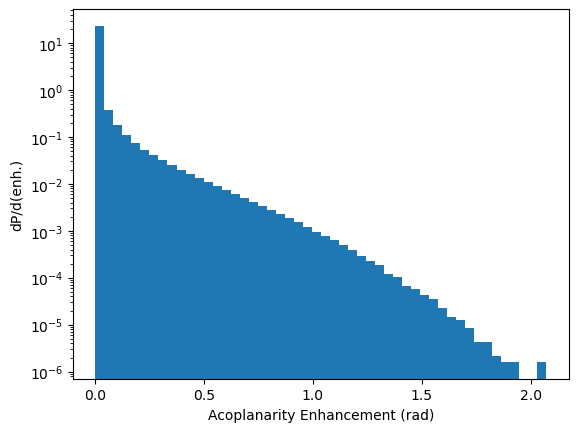

In [11]:
plt.hist(results['aco'], bins=50, density=True)
plt.yscale('log')
plt.xlabel(r'Acoplanarity Enhancement (rad)')
plt.ylabel(r'dP/d(enh.)')

Text(0, 0.5, '$dP/dT$')

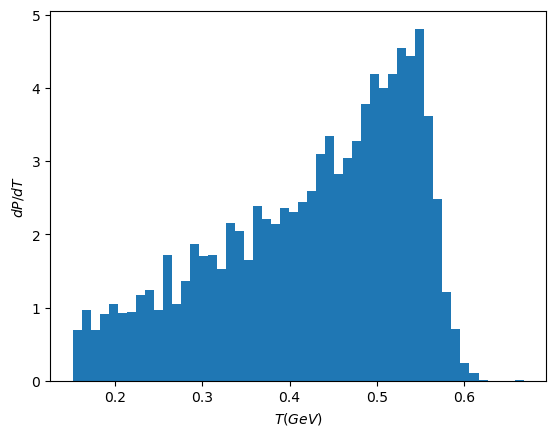

In [22]:
plt.hist(results['Tmax_event'], bins=50, density=True)
plt.xlabel(r'$T (GeV)$')
plt.ylabel(r'$dP/dT$')

Text(0, 0.5, '$dP/d\\epsilon_2$')

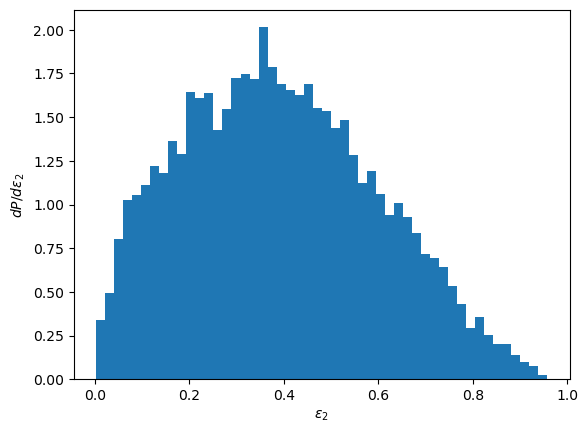

In [23]:
plt.hist(results['e2'], bins=50, density=True)
plt.xlabel(r'$\epsilon_2$')
plt.ylabel(r'$dP/d\epsilon_2$')

(0.0, 0.25)

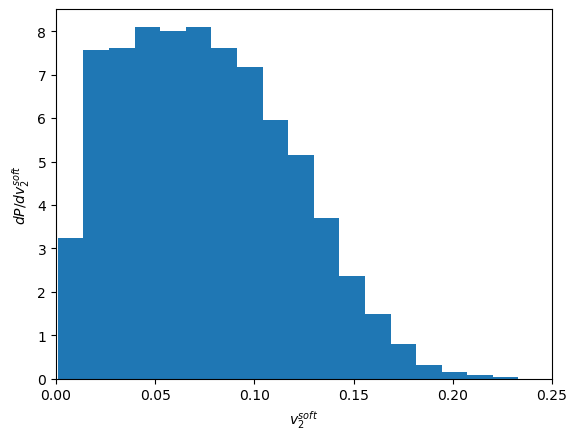

In [60]:
plt.hist(results['v2'], bins=50, density=True)
plt.xlabel(r'$v_2^{soft}$')
plt.ylabel(r'$dP/dv_2^{soft}$')
plt.xlim(0,0.25)

Text(0, 0.5, '$dP/d\\%cent$')

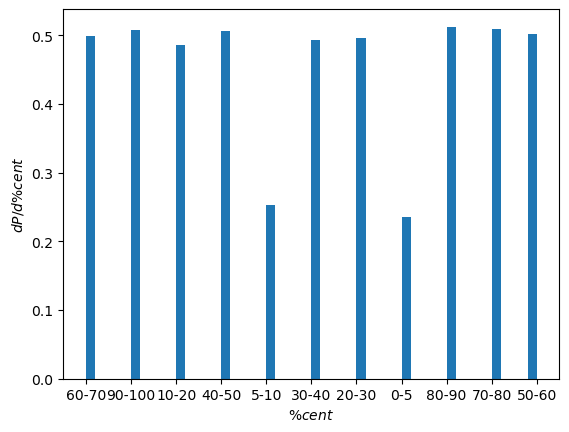

In [24]:
plt.hist(results['cent'], bins=50, density=True)
plt.xlabel(r'$\%cent$')
plt.ylabel(r'$dP/d\%cent$')

Text(0, 0.5, '$dP/db$')

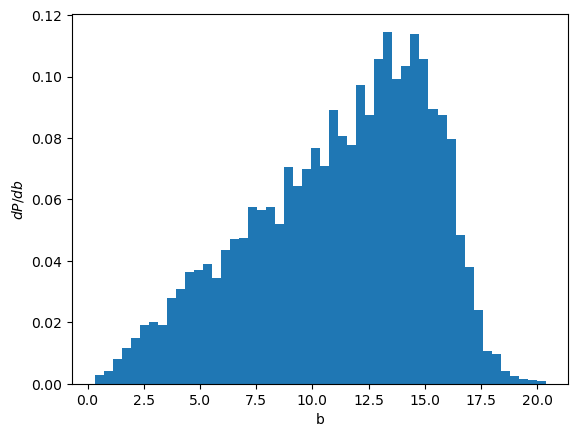

In [14]:
plt.hist(results['b'], bins=50, density=True)
plt.xlabel(r'b')
plt.ylabel(r'$dP/db$')

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

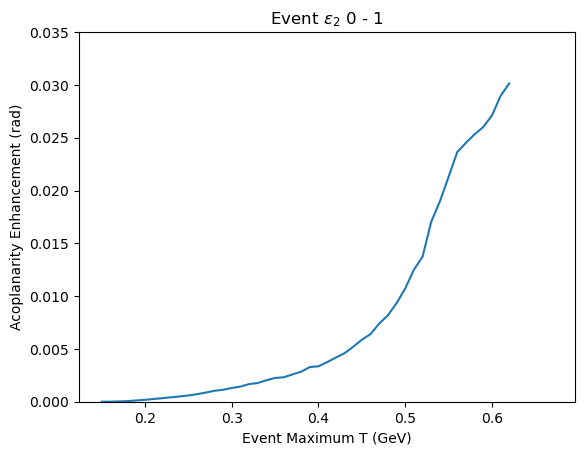

In [12]:
#Acoplanarities as a function of T
e_min = 0
e_max = 1

e2_cut = (results['e2'] < e_max) & (results['e2'] > e_min)
bin_width = 0.01
values = np.array([])
T_bins = np.arange(0, 1, bin_width)
for T in T_bins:
    T_cut = (results['Tmax_event'] < T + bin_width/2) & (results['Tmax_event'] > T - bin_width/2)
    # print("begin")
    val = np.mean(results[e2_cut & T_cut]['aco'])
    # print(results[e2_cut & T_cut]['aco'])
    # print("end")
    values = np.append(values, val)

fig, axis = plt.subplots(1)
axis.plot(T_bins, values)


plt.ylim(0,0.035)
axis.set_title(r'Event $\epsilon_2$ {} - {}'.format(e_min, e_max))
axis.set_xlabel('Event Maximum T (GeV)')
axis.set_ylabel('Acoplanarity Enhancement (rad)')
# print(T_bins, values)

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

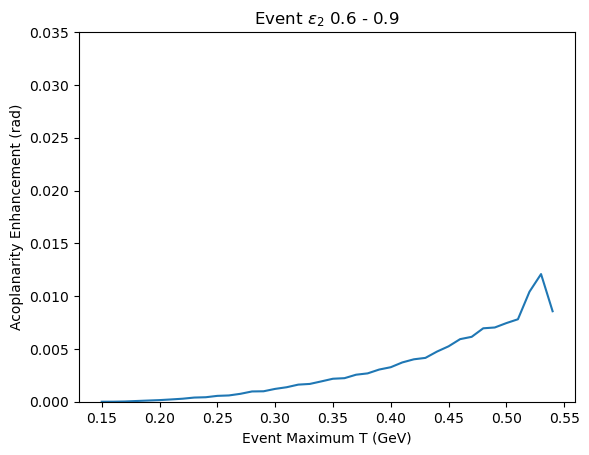

In [13]:
#Acoplanarities as a function of T
e_min = 0.6
e_max = 0.9

e2_cut = (results['e2'] < e_max) & (results['e2'] > e_min)
bin_width = 0.01
values = np.array([])
T_bins = np.arange(0, 1, bin_width)
for T in T_bins:
    T_cut = (results['Tmax_event'] < T + bin_width/2) & (results['Tmax_event'] > T - bin_width/2)
    # print("begin")
    val = np.mean(results[e2_cut & T_cut]['aco'])
    # print(results[e2_cut & T_cut]['aco'])
    # print("end")
    values = np.append(values, val)

fig, axis = plt.subplots(1)
axis.plot(T_bins, values)


plt.ylim(0,0.035)
axis.set_title(r'Event $\epsilon_2$ {} - {}'.format(e_min, e_max))
axis.set_xlabel('Event Maximum T (GeV)')
axis.set_ylabel('Acoplanarity Enhancement (rad)')
# print(T_bins, values)

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

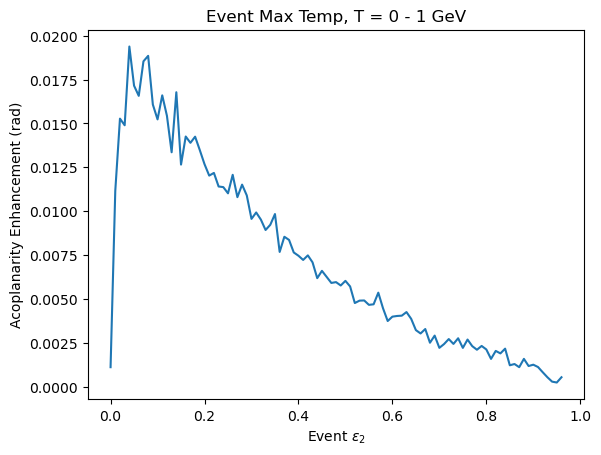

In [43]:
#Aco = func(e_2)

T_cut = (results['Tmax_event'] > 0) & (results['Tmax_event'] < 1)
bin_width = 0.01
values = np.array([])
e2_bins = np.arange(0, 1, bin_width)

for e2 in e2_bins:
    e2_cut = (results['e2'] < e2 + bin_width/2) & (results['e2'] > e2 - bin_width/2)
    val = np.mean(results[e2_cut & T_cut]['aco'])
    values = np.append(values, val)


fig, axis = plt.subplots(1)
axis.plot(e2_bins, values)

# plt.ylim(0,0.045)
axis.set_title('Event Max Temp, T = 0 - 1 GeV')
axis.set_xlabel(r'Event $\epsilon_2$')
axis.set_ylabel('Acoplanarity Enhancement (rad)')

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

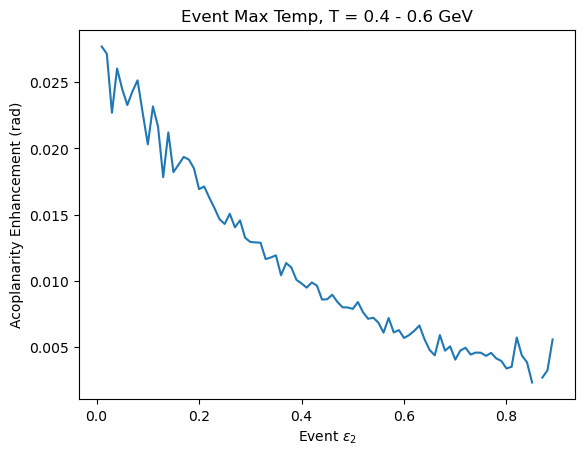

In [22]:
t_min = 0.4 #GeV
t_max = 0.6 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)
bin_width = 0.01

values = np.array([])
e2_bins = np.arange(0, 1, bin_width)
for e2 in e2_bins:
    e2_cut = (results['e2'] < e2 + bin_width/2) & (results['e2'] > e2 - bin_width/2)
    val = np.mean(results[e2_cut & T_cut]['aco'])
    values = np.append(values, val)


fig, axis = plt.subplots(1)
axis.plot(e2_bins, values)

# plt.ylim(0,0.0200)
axis.set_title(r'Event Max Temp, T = {} - {} GeV'.format(t_min, t_max)) 
axis.set_xlabel(r'Event $\epsilon_2$')
axis.set_ylabel('Acoplanarity Enhancement (rad)')

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

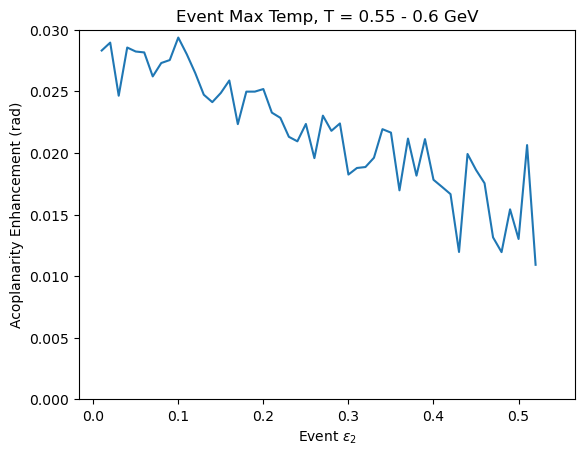

In [27]:
t_min = 0.55 #GeV
t_max = 0.60 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)
bin_width = 0.01

values = np.array([])
e2_bins = np.arange(0, 1, bin_width)
for e2 in e2_bins:
    e2_cut = (results['e2'] < e2 + bin_width/2) & (results['e2'] > e2 - bin_width/2)
    val = np.mean(results[e2_cut & T_cut]['aco'])
    values = np.append(values, val)


fig, axis = plt.subplots(1)
axis.plot(e2_bins, values)

plt.ylim(0,0.030)
axis.set_title(r'Event Max Temp, T = {} - {} GeV'.format(t_min, t_max)) 
axis.set_xlabel(r'Event $\epsilon_2$')
axis.set_ylabel('Acoplanarity Enhancement (rad)')

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

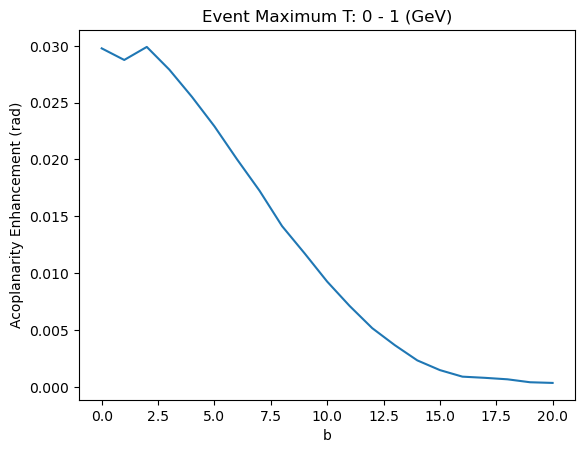

In [45]:
#Acoplanarities as a function of b
# e_min = 0
# e_max = 1
# e2_cut = (results['e2'] < e_max) & (results['e2'] > e_min)

t_min = 0 #GeV
t_max = 1 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)


bin_width = 1

values = np.array([])
b_bins = np.arange(0, 25, bin_width)

for b in b_bins:
    b_cut = (results['b'] < b + bin_width/2) & (results['b'] > b - bin_width/2)
    # print("begin")
    val = np.mean(results[b_cut & T_cut]['aco'])
    # print(results[e2_cut & T_cut]['aco'])
    # print("end")
    values = np.append(values, val)

fig, axis = plt.subplots(1)
axis.plot(b_bins, values)


# plt.ylim(0,0.035)
axis.set_title(r'Event Maximum T: {} - {} (GeV)'.format(t_min, t_max))
axis.set_xlabel('b')
axis.set_ylabel('Acoplanarity Enhancement (rad)')
# print(b_bins, values)

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

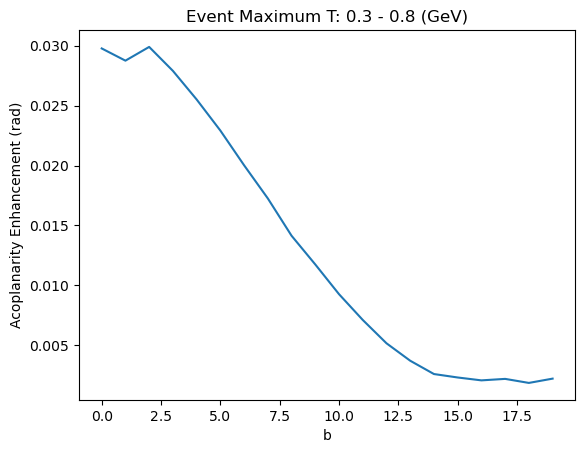

In [37]:
#Acoplanarities as a function of b
# e_min = 0
# e_max = 0.5
# e2_cut = (results['e2'] < e_max) & (results['e2'] > e_min)

t_min = 0.3 #GeV
t_max = 0.8 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)

bin_width = 1

values = np.array([])
b_bins = np.arange(0, 25, bin_width)

for b in b_bins:
    b_cut = (results['b'] < b + bin_width/2) & (results['b'] > b - bin_width/2)
    # print("begin")
    val = np.mean(results[b_cut & T_cut]['aco'])
    # print(results[e2_cut & T_cut]['aco'])
    # print("end")
    values = np.append(values, val)

fig, axis = plt.subplots(1)
axis.plot(b_bins, values)


# plt.ylim(0,0.030)
axis.set_title(r'Event Maximum T: {} - {} (GeV)'.format(t_min, t_max))
axis.set_xlabel('b')
axis.set_ylabel('Acoplanarity Enhancement (rad)')
# print(b_bins, values)

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

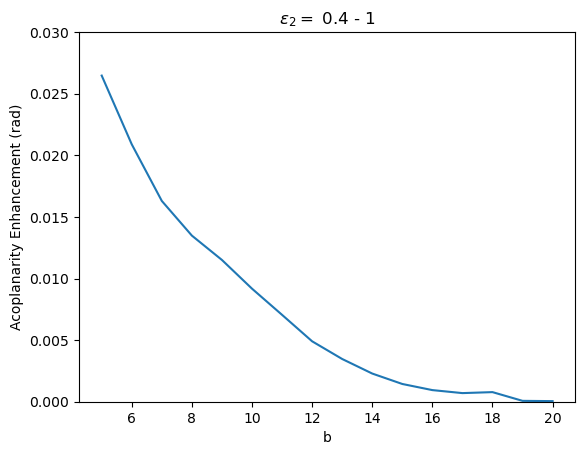

In [42]:
#Acoplanarities as a function of b
e_min = 0.4
e_max = 1
e2_cut = (results['e2'] < e_max) & (results['e2'] > e_min)

# t_min = 0.3 #GeV
# t_max = 0.8 #GeV
# T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)

bin_width = 1

values = np.array([])
b_bins = np.arange(0, 25, bin_width)

for b in b_bins:
    b_cut = (results['b'] < b + bin_width/2) & (results['b'] > b - bin_width/2)
    # print("begin")
    val = np.mean(results[e2_cut & b_cut]['aco'])
    # print(results[e2_cut & T_cut]['aco'])
    # print("end")
    values = np.append(values, val)

fig, axis = plt.subplots(1)
axis.plot(b_bins, values)


plt.ylim(0,0.030)
axis.set_title(r'$\epsilon_2= $ {} - {}'.format(e_min, e_max))
axis.set_xlabel('b')
axis.set_ylabel('Acoplanarity Enhancement (rad)')
# print(b_bins, values)

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

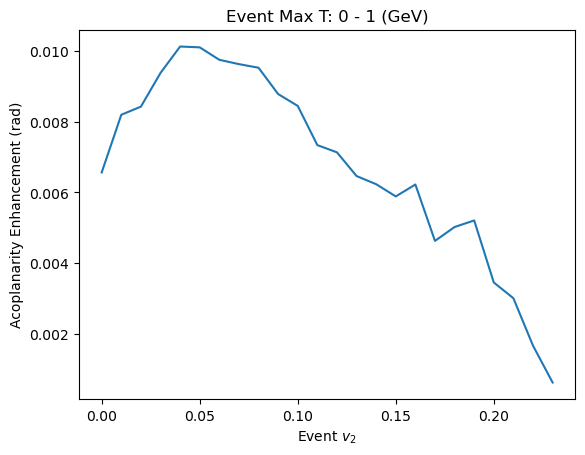

In [48]:
#Acoplanarities as a function of v2
t_min = 0 #GeV
t_max = 1 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)

bin_width = 0.01

values = np.array([])
v2_bins = np.arange(0, 0.25, bin_width)
for v2 in v2_bins:
    v2_cut = (results['v2'] < v2 + bin_width/2) & (results['v2'] > v2 - bin_width/2)
    val = np.mean(results[T_cut & v2_cut]['aco'])
    values = np.append(values, val)


fig, axis = plt.subplots(1)
axis.plot(v2_bins, values)
axis.set_title(r'Event Max T: {} - {} (GeV)'.format(t_min, t_max))
axis.set_xlabel(r'Event $v_2$')
axis.set_ylabel('Acoplanarity Enhancement (rad)')

Text(0, 0.5, 'Acoplanarity Enhancement (rad)')

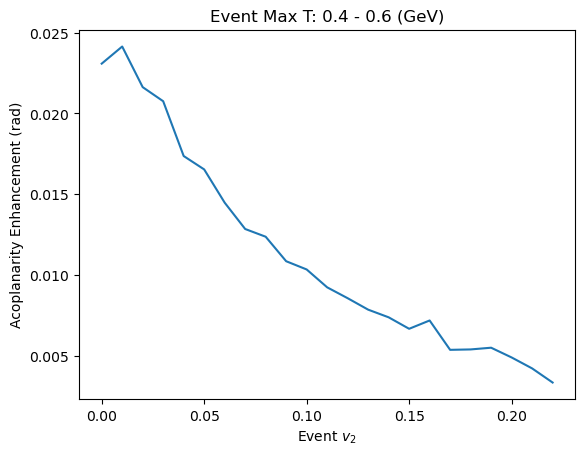

In [61]:
#Acoplanarities as a function of v2
t_min = 0.4 #GeV
t_max = 0.6 #GeV
T_cut = (results['Tmax_event'] > t_min) & (results['Tmax_event'] < t_max)

bin_width = 0.01

values = np.array([])
v2_bins = np.arange(0, 0.25, bin_width)
for v2 in v2_bins:
    v2_cut = (results['v2'] < v2 + bin_width/2) & (results['v2'] > v2 - bin_width/2)
    val = np.mean(results[T_cut & v2_cut]['aco'])
    values = np.append(values, val)


fig, axis = plt.subplots(1)
axis.plot(v2_bins, values)
axis.set_title(r'Event Max T: {} - {} (GeV)'.format(t_min, t_max))
axis.set_xlabel(r'Event $v_2$')
axis.set_ylabel('Acoplanarity Enhancement (rad)')

## Contrast with v_2 

Text(0, 0.5, '$dP/dT$')

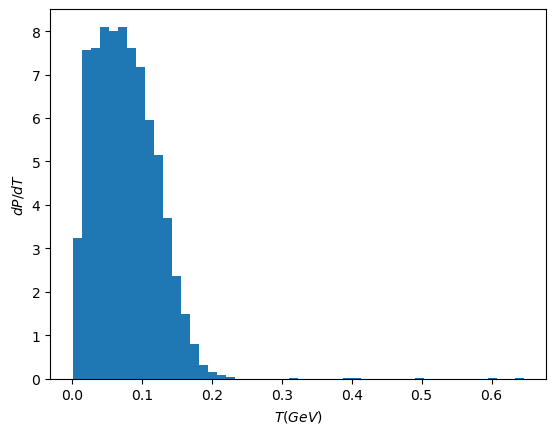

In [54]:
results['old_v2'] = results['v2']
results['v2'] = np.mod(results['v2'], 1)

plt.hist(results['v2'], bins=50, density=True)
plt.xlabel(r'$T (GeV)$')
plt.ylabel(r'$dP/dT$')

## Average Events

In [ ]:
# Histogram production points
H, xedges, yedges = np.histogram2d(partons['x_0'], partons['y_0'], bins=50, range=None, density=True, weights=partons['AA_weight'])

# Histogram does not follow Cartesian convention (see Notes),
# therefore transpose H for visualization purposes.
H = H.T

# Plot
box_width = 4
fig = plt.figure(figsize=(7, 3))
ax = fig.add_subplot(131)
colors = ax.imshow(H**(1/6), interpolation='nearest', origin='lower', extent=[-box_width, box_width, -box_width, box_width])
plt.colorbar(colors, label='Temp Grad (GeV / fm)')

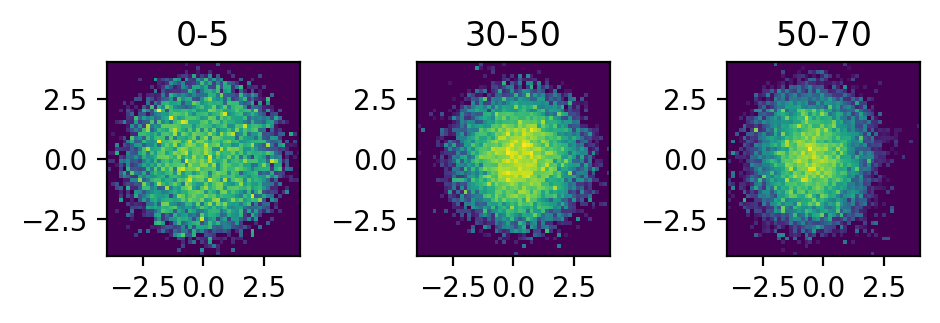

In [38]:
from matplotlib.gridspec import GridSpec

# Options
df = partons
plot_cents = ['0-5', '30-50', '50-70']
dpi = 200
aspect = 1
width_inches = 4.8

# Make figure
fig = plt.figure(layout="tight", dpi=dpi, figsize=(width_inches, aspect*width_inches))
gs = GridSpec(1, 3, figure=fig)

for i in np.arange(0, len(plot_cents)):
    # Get centrality mask
    cent = plot_cents[i]
    if cent == '0-5':
        cent_mask = (df['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (df['cent'] == '0-5') | (df['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (df['cent'] == '30-40') | (df['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (df['cent'] == '50-60') | (df['cent'] == '60-70')
        
    # Histogram production points
    H, xedges, yedges = np.histogram2d(df[cent_mask]['x_0'], df[cent_mask]['y_0'], bins=50, range=None, density=False, weights=df[cent_mask]['AA_weight'])
    
    # Histogram does not follow Cartesian convention (see Notes),
    # therefore transpose H for visualization purposes.
    H = H.T
    
    # Plot
    box_width = 4
    
    ax = fig.add_subplot(gs[i])
    ax.set_title(cent)
    colors = ax.imshow(H**(1/6), interpolation='nearest', extent=[-box_width, box_width, -box_width, box_width])

#plt.colorbar(colors, label='Temp Grad (GeV / fm)')

In [36]:
np.average(df[cent_mask]['y_0'], weights=df[cent_mask]['AA_weight'])

0.07803567576775065

In [37]:
np.average(df[cent_mask]['x_0'], weights=df[cent_mask]['AA_weight'])

-0.004120777465879631

## Spectra

In [8]:
from scipy.interpolate import CubicSpline

#np.interp(np.array([1, 2, 3]), bin_cents, 1/counts)

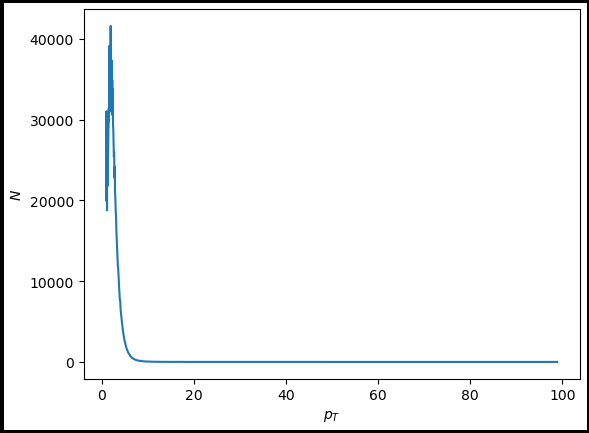

In [50]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$N$')
#axis.set_xlim(0,20)

pt_bins = np.logspace(0, 2, 200)
bin_cents = (pt_bins[0:-1] + pt_bins[1:])/2

# Get Ivan spectra
vitev_data = pd.read_table('rhic_calc.aa_cen_cron1_eloss0.5100GeV.out', sep="\s+")
g_vitev = CubicSpline(vitev_data['pt'].to_numpy(), vitev_data['g'].to_numpy())

# Compute weights to reach uniform distribution
counts, bins = np.histogram(partons['pt_0'], bins=pt_bins)
unity_weight = CubicSpline(bin_cents, 1/counts)

# New weight function
new_weight = lambda pt: 10000*g_vitev(pt) * unity_weight(pt)

# Histogram 
counts, bins = np.histogram(partons['pt_0'].to_numpy(), bins=bins, weights=new_weight(partons['pt_0'].to_numpy()))


axis.plot(bin_cents, counts)

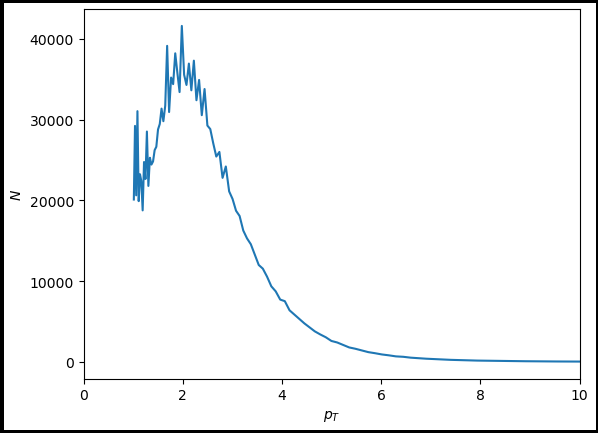

In [51]:
axis.set_xlim(0,10)
fig

## CNM Envelope

#### Vitev

In [20]:
vitev_30_50_data = pd.read_table('/fs1/project/sievert_nt/jo/raa-v2_paper_tools/CNM_tables/RallPbPb_3050_OO_cron1_eloss0.5.02TeV.Y0.SLRMn', sep="\s+")
vitev_0_10_data = pd.read_table('/fs1/project/sievert_nt/jo/raa-v2_paper_tools/CNM_tables/RallPbPb_010_OO_cron1_eloss0.5.02TeV.Y0.SLRMn', sep="\s+")

def interp_raa(parton):
    print('Parton: {}'.format(parton))
    # Get data
    pt_0_10 = vitev_0_10_data['pt'][vitev_0_10_data['pt'] < 110]
    raa_0_10 = vitev_0_10_data[parton][vitev_0_10_data['pt'] < 110]
    npart_0_10 = np.full_like(raa_0_10, 365)
    
    pt_30_50 = vitev_30_50_data['pt'][vitev_30_50_data['pt'] < 110]
    raa_30_50 = vitev_30_50_data[parton][vitev_30_50_data['pt'] < 110]
    npart_30_50 = np.full_like(raa_30_50, 111)

    # Set RAA to 1 at npart=2
    pt_2 = pt_0_10
    npart_2 = np.full_like(pt_2, 2)  # Just beyond 2, so 2 is acceptable
    raa_2 = np.full_like(pt_2, 1)
    
    pt_coords = pt_0_10
    npart_coords = np.array([2, 111, 365])**(1/3)
    
    raa_vals = np.transpose([raa_2, raa_30_50, raa_0_10])
    
    raa = interpolate.RegularGridInterpolator((pt_coords, npart_coords), raa_vals, bounds_error=False, fill_value=None)

    return raa

class RAA_interp:
    def __init__(self):
        self.g = interp_raa('g')
        self.d = interp_raa('d')
        self.dbar = interp_raa('dbar')
        self.u = interp_raa('u')
        self.ubar = interp_raa('ubar')
        self.s = interp_raa('s')
        self.sbar = interp_raa('sbar')

    def weight(self, pt, npart, id):
        if id == 21:
            return self.g(np.array([pt, npart]))
        elif id == 1:
            return self.d(np.array([pt, npart]))
        elif id == -1:
            return self.dbar(np.array([pt, npart]))
        elif id == 2:
            return self.u(np.array([pt, npart]))
        elif id == -2:
            return self.ubar(np.array([pt, npart]))
        elif id == 3:
            return self.s(np.array([pt, npart]))
        elif id == -3:
            return self.sbar(np.array([pt, npart]))

In [21]:
RAA_interp = RAA_interp()

Parton: g
Parton: d
Parton: dbar
Parton: u
Parton: ubar
Parton: s
Parton: sbar


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


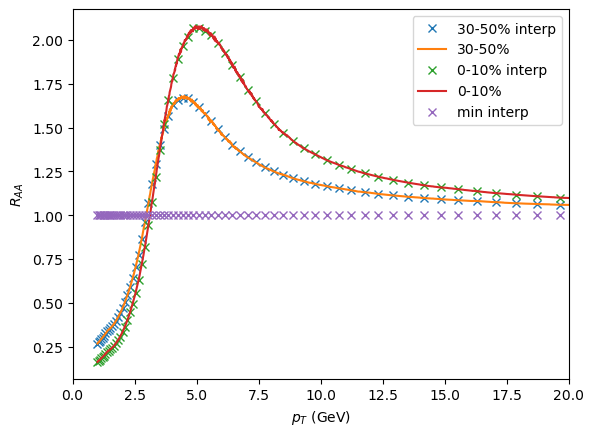

In [11]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$ (GeV)')
axis.set_ylabel(r'$R_{AA}$')
pt_points = np.logspace(0, 2, 100)

raa_30_50 = vitev_30_50_data['g']
axis.plot(pt_points, np.vectorize(RAA_interp.weight)(pt_points, 111**(1/3), 21), label='30-50% interp', ls='None', marker='x')
axis.plot(vitev_30_50_data['pt'], raa_30_50, label='30-50%')#, ls='--')

raa_0_10 = vitev_0_10_data['g']

axis.plot(pt_points, np.vectorize(RAA_interp.weight)(pt_points, 365**(1/3), 21), label='0-10% interp', ls='None', marker='x')
axis.plot(vitev_0_10_data['pt'], raa_0_10, label='0-10%')#, ls='--')


axis.plot(pt_points, np.vectorize(RAA_interp.weight)(pt_points, np.amin(partons['npart'].to_numpy().astype(float))**(1/3), 21), label='min interp', ls='None', marker='x')
#axis.plot(pt_points, np.vectorize(RAA_interp.weight)(pt_points, np.amax(partons['npart'].to_numpy().astype(float))**(1/3), 21), label='max interp', ls='None', marker='x')
axis.set_xlim(0,20)
axis.legend()

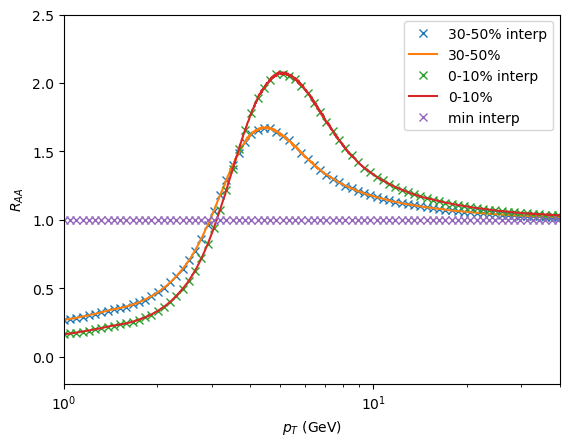

In [12]:
axis.set_xlim(1,40)
axis.set_ylim(-0.2, 2.5)
axis.set_xscale('log')
fig

In [13]:
partons['pA_weight'] = np.vectorize(RAA_interp.weight)(partons['pt_0'].to_numpy().astype(float),
                                                        partons['npart'].to_numpy().astype(float)**(1/3),
                                                        partons['id'].to_numpy().astype(float)) * partons['weight'].to_numpy().astype(float)

In [ ]:
partons['weight'].hist(bins=250)
plt.yscale('log')

In [ ]:
(partons['pA_weight']/partons['weight']).hist(bins=250)
plt.yscale('log')

#### Old

/tmp/jbahder-tmpdir-Mn9Ka5/ipykernel_1395858/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-Mn9Ka5/ipykernel_1395858/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-Mn9Ka5/ipykernel_1395858/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-Mn9Ka5/ipykernel_1395858/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-Mn9Ka5/ipykernel_1395858/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2)

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


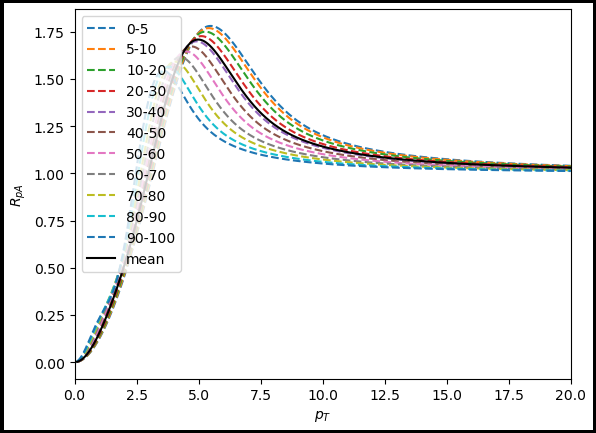

In [8]:
# Set new Cronin Envelope parameters
# Q E [0.5, 5]
# Lambda E [0.1*Q, 2*Q]
# Plot Cronin envelopte
fig2, axis2 = plt.subplots(edgecolor='black', linewidth=5)
axis2.set_xlabel(r'$p_T$')
axis2.set_ylabel(r'$R_{pA}$')
axis2.set_xlim(0,20)


Q_val = 1.47  #1.51  # Q_{s0} for N_{coll} = 1
lam_val = 0.84  #0.1*Q_val
pt_tester = np.arange(0.1, 60, 0.01)
mean_ncoll = partons['ncoll'].mean()

# Define nuclear modification factor for p-Pb collisions from theory
# Eq. 219 - https://inspirehep.net/literature/682187
def RpA(pt, Q0, lam, ncoll):
    # Here Q is  Q_{s0}, the saturation scale
    Q = Q0 * (ncoll) ** (1/12)  # see Eq.166
    rppb_array = ( (pt**4 / Q **2) * ( - (1/pt**2) + (2/pt**2)*np.exp(-pt**2/Q**2) 
                  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) ) 
    rppb_array[rppb_array == np.inf] = 1
    rppb_array[np.isnan(rppb_array)] = 1
    return rppb_array 

# Plot R_{pA}

cent_bins = np.flip(np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
                      '30-40', '20-30', '10-20', '5-10', '0-5']))
for cent in cent_bins:
    cent_mean_ncoll = partons.loc[partons['cent'] == cent]['ncoll'].mean()
    rpa_array = RpA(pt_tester, Q0=Q_val, lam=lam_val, ncoll=cent_mean_ncoll)
    #print('{}% Cent. Yield Enhancement: {}'.format(cent, integrate.trapezoid(y=rpa_array, x=pt_tester)))
    # max_rpa = np.amax(rpa_array)
    # max_i = np.where(rpa_array==max_rpa)[0][0]
    
    axis2.plot(pt_tester, rpa_array, label=cent, linestyle='--')

rpa_mean_array = RpA(pt_tester, Q0=Q_val, lam=lam_val, ncoll=mean_ncoll)
axis2.plot(pt_tester, rpa_mean_array, label='mean', color='black')
axis2.legend()

In [19]:
################################
# Cold Nuclear Matter Envelope #
################################

# Define new weights in terms of pp weight and R_{pA}
def pA_weights(pt, Q0, lam, ncoll, pp_weight):
    return RpA(pt, Q0, lam, ncoll=ncoll) * pp_weight


# # Create new weights
# partons['pA_weight'] = pA_weights(pt=partons['pt'].to_numpy().astype(float),
#                                   Q=np.full_like(partons['pt'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(partons['pt'].to_numpy(), lam_val).astype(float),
#                                   ncoll=partons['ncoll'].to_numpy().astype(float),
#                                   pp_weight=partons['weight'].to_numpy().astype(float))

# partons['pA_weight'] = pA_weights(pt=partons['pt'].to_numpy().astype(float),
#                                   Q=np.full_like(partons['pt'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(partons['pt'].to_numpy(), lam_val).astype(float),
#                                   ncoll=partons['ncoll'].to_numpy().astype(float),
#                                   pp_weight=partons['weight'].to_numpy().astype(float))

partons['pA_weight'] = pA_weights(pt=partons['pt_0'].to_numpy().astype(float),
                                  Q0=np.full_like(partons['pt_0'].to_numpy(), Q_val).astype(float),
                                  lam=np.full_like(partons['pt_0'].to_numpy(), lam_val).astype(float),
                                  ncoll=partons['ncoll'].to_numpy().astype(float),
                                  pp_weight=partons['weight'].to_numpy().astype(float))

# partons_c['pA_weight'] = pA_weights(pt=partons_c['pt_0'].to_numpy().astype(float),
#                                   Q=np.full_like(partons_c['pt_0'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(partons_c['pt_0'].to_numpy(), lam_val).astype(float),
#                                   ncoll=partons_c['ncoll'].to_numpy().astype(float),
#                                   pp_weight=partons_c['weight'].to_numpy().astype(float))

# partons_d['pA_weight'] = pA_weights(pt=partons_d['pt_0'].to_numpy().astype(float),
#                                   Q=np.full_like(partons_d['pt_0'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(partons_d['pt_0'].to_numpy(), lam_val).astype(float),
#                                   ncoll=partons_d['ncoll'].to_numpy().astype(float),
#                                   pp_weight=partons_d['weight'].to_numpy().astype(float))


# hadrons['pA_weight'] = pA_weights(pt=hadrons['parent_pt'].to_numpy().astype(float),
#                                   Q=np.full_like(hadrons['parent_pt'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(hadrons['parent_pt'].to_numpy(), lam_val).astype(float),
#                                   ncoll=hadrons['ncoll'].to_numpy().astype(float),
#                                   pp_weight=hadrons['weight'].to_numpy().astype(float))
# pp_hadrons['pA_weight'] = pA_weights(pt=pp_hadrons['parent_pt'].to_numpy().astype(float),
#                                   Q=np.full_like(pp_hadrons['parent_pt'].to_numpy(), Q_val).astype(float),
#                                   lam=np.full_like(pp_hadrons['parent_pt'].to_numpy(), lam_val).astype(float),
#                                   ncoll=np.full_like(pp_hadrons['parent_pt'].to_numpy(), 1).astype(float),
#                                   pp_weight=pp_hadrons['weight'].to_numpy().astype(float))

/tmp/jbahder-tmpdir-bet1mV/ipykernel_1092615/600236972.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )


#### CNM Parameter Fits

In [103]:
# Load relevant CMS data - 'bin_edge_0', 'bin_edge_1'
CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()[3:15]
CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()[3:15]
CMS_raa_pt_min_array = CMS_50_70_data['bin_edge_0'].to_numpy()[3:15]
CMS_raa_pt_max_array = CMS_50_70_data['bin_edge_1'].to_numpy()[3:15]
CMS_pt_bins = np.append(CMS_raa_pt_min_array, CMS_raa_pt_max_array[-1])
CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()[3:15]
CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()[3:15]

# Perform centrality and case cuts
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['fgqhat'] == False)
p_mask = p_mask & ((partons['cent'] == '50-60') | (partons['cent'] == '60-70'))
p_mask = p_mask & ((partons['pion_pt_f'] > 1) & (partons['pion_pt_f']  < 6))
df = partons[p_mask].copy(deep=True)

# Make RAA a callable function
def lsq_RAA(Q, lam):
    
    # Define R_pA for these parameters
    def RpA(pt, Q, lam, ncoll):
        # Here Q is  Q_{s0}, the saturation scale
        Q = Q * (ncoll) ** (1/6)  
        rppb_array = ( (pt**4 / Q **2) * ( - (1/pt**2) + scale_factor * (2/pt**2)*np.exp(-pt**2/Q**2) 
                      + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) ) 
        rppb_array[rppb_array == np.inf] = 1
        rppb_array[np.isnan(rppb_array)] = 1
        return rppb_array 

    # Define new weights in terms of pp weight and R_{pA}

    def fit_weights(pt, ncoll, pp_weight):
        return RpA(pt, Q, lam, ncoll=ncoll) * pp_weight

    # Apply new weighting
    df['fit_weight'] = fit_weights(pt=df['pt_0'].to_numpy().astype(float),
                                      ncoll=df['ncoll'].to_numpy().astype(float),
                                      pp_weight=df['weight'].to_numpy().astype(float))

    #########################
    # Compute least squares #
    #########################

    # Compute RAA for given pt bins
    pp_yield, pp_bins = np.histogram(df['pion_pt'].to_numpy(), weights=df['weight'].to_numpy(), bins=CMS_pt_bins)
    AA_yield, AA_bins = np.histogram(df['pion_pt_f'].to_numpy(), weights=df['fit_weight'].to_numpy(), bins=CMS_pt_bins)
    RAA = AA_yield / pp_yield.astype(np.float64)

    # Create masks for AA and pp yields
    AA_mask = ((df['pion_pt_f'] > (pt - pt_res/2)) & (df['pion_pt_f']  < (pt + pt_res/2)))
    pp_mask = ((df['pion_pt'] > (pt - pt_res/2)) & (df['pion_pt']  < (pt + pt_res/2)))
    AA_df = df[AA_mask].copy(deep=True)  # Make deep copy so we can set values

    # Compute yields and RAA
    pp_yield = np.sum(df[pp_mask]['weight'])
    AA_yield = np.sum(AA_df['fit_weight'])
    R_AA = AA_yield.astype(np.float64) / pp_yield.astype(np.float64)

    # Compute reduced chi^2 for these parameter choices
    diff = (CMS_raa_RAA_array - R_AA)**2
    var = (CMS_raa_perr_array)**2
    chisq = np.sum(diff / var)
    #rchisq = chisq/
    

    return chisq
    # Compute R_AA for this datapoint
    # 1. pp yield : find number of particles with 'pion_pt' in the pt bin, counting by 'weight'
    # 2. AA yield : find number of particles with 'pion_pt_f' in the pt bin, counting by 'fit_weight'
    # 3. take ratio : RAA = AA yield / pp yield   # Noting that ncoll is already embedded in the "pp yield" object

    # Return R_AA value


# Use scipy.optimize.curve_fit to optimize Q and Lambda
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html

# Q_guess = 1.5
# lam_guess = 0.3*Q_guess
# p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
# optimal_values, pcov = sp.optimize.curve_fit(f=RAA, xdata=CMS_x_data, ydata=CMS_y_d

In [108]:
lsq_RAA(0.5, 0.15)

/tmp/jbahder-tmpdir-MH70sj/ipykernel_51494/4153899882.py:24: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )


19987.452886295163

In [98]:
(CMS_raa_RAA_array - CMS_raa_pt_min_array)**2

array([ 0.14929182,  0.22139848,  0.30925166,  0.54722267,  0.8758302 ,
        1.28713563,  1.784896  ,  2.40296502,  3.1420044 ,  6.82918009,
       11.86740491, 18.05434092])

In [96]:
CMS_raa_pt_min_array

array([1. , 1.1, 1.2, 1.4, 1.6, 1.8, 2. , 2.2, 2.4, 3.2, 4. , 4.8])

In [36]:
CMS_50_70_data['pt'].to_numpy()[3:20]

array([ 1.05,  1.15,  1.3 ,  1.5 ,  1.7 ,  1.9 ,  2.1 ,  2.3 ,  2.8 ,
        3.6 ,  4.4 ,  5.2 ,  6.  ,  6.8 ,  8.4 , 10.8 , 13.2 ])

In [37]:
# Perform centrality and case cuts
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['fgqhat'] == False)
p_mask = p_mask & ((partons['cent'] == '50-60') | (partons['cent'] == '60-70'))
df = partons[p_mask].copy(deep=True)

# Make RAA a callable function
def RAA(pt, Q, lam):
    pt_res = 1  # Whatever resolution you like...
    
    # Define R_pA for these parameters
    def RpA(pt, Q, lam, ncoll):
        # Here Q is  Q_{s0}, the saturation scale
        Q = Q * (ncoll) ** (1/12)  
        rppb_array = ( (pt**4 / Q **2) * ( - (1/pt**2) + (2/pt**2)*np.exp(-pt**2/Q**2) 
                      + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) ) 
        rppb_array[rppb_array == np.inf] = 1
        rppb_array[np.isnan(rppb_array)] = 1
        return rppb_array 

    # Define new weights in terms of pp weight and R_{pA}

    def fit_weights(pt, ncoll, pp_weight):
        return RpA(pt, Q, lam, ncoll=ncoll) * pp_weight

    # Create masks for AA and pp yields
    AA_mask = ((df['pion_pt_f'] > (pt - pt_res/2)) & (df['pion_pt_f']  < (pt + pt_res/2)))
    pp_mask = ((df['pion_pt'] > (pt - pt_res/2)) & (df['pion_pt']  < (pt + pt_res/2)))
    AA_df = df[AA_mask].copy(deep=True)  # Make deep copy so we can set values

    # Apply new weighting
    AA_df['fit_weight'] = fit_weights(pt=AA_df['pt_0'].to_numpy().astype(float),
                                      ncoll=AA_df['ncoll'].to_numpy().astype(float),
                                      pp_weight=AA_df['weight'].to_numpy().astype(float))

    
    # Compute yields and RAA
    pp_yield = np.sum(df[pp_mask]['weight'])
    AA_yield = np.sum(AA_df['fit_weight'])
    R_AA = AA_yield / pp_yield

    return R_AA
    # Compute R_AA for this datapoint
    # 1. pp yield : find number of particles with 'pion_pt' in the pt bin, counting by 'weight'
    # 2. AA yield : find number of particles with 'pion_pt_f' in the pt bin, counting by 'fit_weight'
    # 3. take ratio : RAA = AA yield / pp yield   # Noting that ncoll is already embedded in the "pp yield" object

    # Return R_AA value


# Use scipy.optimize.curve_fit to optimize Q and Lambda
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html

# Q_guess = 1.5
# lam_guess = 0.3*Q_guess
# p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
# optimal_values, pcov = sp.optimize.curve_fit(f=RAA, xdata=CMS_x_data, ydata=CMS_y_d

CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()[3:20]
CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()[3:20]
CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()[3:20]
CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()[3:20]

vec_RAA = np.vectorize(RAA)

Q_guess = 1
lam_guess = 0.1*Q_guess
p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
optimal_values, pcov = optimize.curve_fit(f=vec_RAA, xdata=CMS_raa_pt_array, ydata=CMS_raa_RAA_array, p0=p0, sigma=CMS_raa_perr_array, bounds=([0.1, 0.001], [5, 0.5]))
print(optimal_values)
print(pcov)

/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2)

[0.1       0.4892502]
[[0.1764927 0.       ]
 [0.        0.       ]]


/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3648379364.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )


In [38]:
# Perform centrality and case cuts
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['fgqhat'] == False)
p_mask = p_mask & (partons['cent'] == '0-5')
df = partons[p_mask].copy(deep=True)

# Make RAA a callable function
def RAA(pt, Q, lam):
    pt_res = 1  # Whatever resolution you like...
    
    # Define R_pA for these parameters
    def RpA(pt, Q, lam, ncoll):
        # Here Q is  Q_{s0}, the saturation scale
        Q = Q * (ncoll) ** (1/12)  
        rppb_array = ( (pt**4 / Q **2) * ( - (1/pt**2) + (2/pt**2)*np.exp(-pt**2/Q**2) 
                      + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) ) 
        rppb_array[rppb_array == np.inf] = 1
        rppb_array[np.isnan(rppb_array)] = 1
        return rppb_array 

    # Define new weights in terms of pp weight and R_{pA}

    def fit_weights(pt, ncoll, pp_weight):
        return RpA(pt, Q, lam, ncoll=ncoll) * pp_weight

    # Create masks for AA and pp yields
    AA_mask = ((df['pion_pt_f'] > (pt - pt_res/2)) & (df['pion_pt_f']  < (pt + pt_res/2)))
    pp_mask = ((df['pion_pt'] > (pt - pt_res/2)) & (df['pion_pt']  < (pt + pt_res/2)))
    AA_df = df[AA_mask].copy(deep=True)  # Make deep copy so we can set values

    # Apply new weighting
    AA_df['fit_weight'] = fit_weights(pt=AA_df['pt_0'].to_numpy().astype(float),
                                      ncoll=AA_df['ncoll'].to_numpy().astype(float),
                                      pp_weight=AA_df['weight'].to_numpy().astype(float))

    
    # Compute yields and RAA
    pp_yield = np.sum(df[pp_mask]['weight'])
    AA_yield = np.sum(AA_df['fit_weight'])
    R_AA = AA_yield / pp_yield

    return R_AA
    # Compute R_AA for this datapoint
    # 1. pp yield : find number of particles with 'pion_pt' in the pt bin, counting by 'weight'
    # 2. AA yield : find number of particles with 'pion_pt_f' in the pt bin, counting by 'fit_weight'
    # 3. take ratio : RAA = AA yield / pp yield   # Noting that ncoll is already embedded in the "pp yield" object

    # Return R_AA value


# Use scipy.optimize.curve_fit to optimize Q and Lambda
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html

# Q_guess = 1.5
# lam_guess = 0.3*Q_guess
# p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
# optimal_values, pcov = sp.optimize.curve_fit(f=RAA, xdata=CMS_x_data, ydata=CMS_y_d

CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()[3:20]
CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()[3:20]
CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()[3:20]
CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()[3:20]

vec_RAA = np.vectorize(RAA)

Q_guess = 1
lam_guess = 0.1*Q_guess
p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
optimal_values, pcov = optimize.curve_fit(f=vec_RAA, xdata=CMS_raa_pt_array, ydata=CMS_raa_RAA_array, p0=p0, sigma=CMS_raa_perr_array, bounds=([0.1, 0.001], [5, 0.5]))
print(optimal_values)
print(pcov)

/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (n

[1.69948006 0.26313538]
[[ 0.07107696 -0.0230461 ]
 [-0.0230461   0.0155271 ]]


/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/441844229.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (n

In [39]:
# Perform centrality and case cuts
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['fgqhat'] == False)
p_mask = p_mask & ((partons['cent'] == '30-40') | (partons['cent'] == '40-50'))
df = partons[p_mask].copy(deep=True)

# Make RAA a callable function
def RAA(pt, Q, lam):
    pt_res = 1  # Whatever resolution you like...
    
    # Define R_pA for these parameters
    def RpA(pt, Q, lam, ncoll):
        # Here Q is  Q_{s0}, the saturation scale
        Q = Q * (ncoll) ** (1/12)  
        rppb_array = ( (pt**4 / Q **2) * ( - (1/pt**2) +  (2/pt**2)*np.exp(-pt**2/Q**2) 
                      + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) ) 
        rppb_array[rppb_array == np.inf] = 1
        rppb_array[np.isnan(rppb_array)] = 1
        return rppb_array 

    # Define new weights in terms of pp weight and R_{pA}

    def fit_weights(pt, ncoll, pp_weight):
        return RpA(pt, Q, lam, ncoll=ncoll) * pp_weight

    # Create masks for AA and pp yields
    AA_mask = ((df['pion_pt_f'] > (pt - pt_res/2)) & (df['pion_pt_f']  < (pt + pt_res/2)))
    pp_mask = ((df['pion_pt'] > (pt - pt_res/2)) & (df['pion_pt']  < (pt + pt_res/2)))
    AA_df = df[AA_mask].copy(deep=True)  # Make deep copy so we can set values

    # Apply new weighting
    AA_df['fit_weight'] = fit_weights(pt=AA_df['pt_0'].to_numpy().astype(float),
                                      ncoll=AA_df['ncoll'].to_numpy().astype(float),
                                      pp_weight=AA_df['weight'].to_numpy().astype(float))

    
    # Compute yields and RAA
    pp_yield = np.sum(df[pp_mask]['weight'])
    AA_yield = np.sum(AA_df['fit_weight'])
    R_AA = AA_yield / pp_yield

    return R_AA
    # Compute R_AA for this datapoint
    # 1. pp yield : find number of particles with 'pion_pt' in the pt bin, counting by 'weight'
    # 2. AA yield : find number of particles with 'pion_pt_f' in the pt bin, counting by 'fit_weight'
    # 3. take ratio : RAA = AA yield / pp yield   # Noting that ncoll is already embedded in the "pp yield" object

    # Return R_AA value


# Use scipy.optimize.curve_fit to optimize Q and Lambda
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html

# Q_guess = 1.5
# lam_guess = 0.3*Q_guess
# p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
# optimal_values, pcov = sp.optimize.curve_fit(f=RAA, xdata=CMS_x_data, ydata=CMS_y_d

CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()[3:20]
CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()[3:20]
CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()[3:20]
CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()[3:20]

vec_RAA = np.vectorize(RAA)

Q_guess = 1
lam_guess = 0.1*Q_guess
p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
optimal_values, pcov = optimize.curve_fit(f=vec_RAA, xdata=CMS_raa_pt_array, ydata=CMS_raa_RAA_array, p0=p0, sigma=CMS_raa_perr_array, bounds=([0.1, 0.001], [5, 1]))
print(optimal_values)
print(pcov)

/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2)

[1.47325271 0.83638272]
[[ 0.06949133 -0.01507831]
 [-0.01507831  0.00878146]]


/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-4P7W6t/ipykernel_926429/3579754937.py:15: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )


In [32]:
df['fit_weight'] = df['pA_weight']
df = partons
def RAA(pt=2, Q=1.5, lam=0.1*1.5):
    pt_res = 1
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['fgqhat'] == False)
    p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    
    AA_mask = p_mask & ((df['pion_pt_f'] > (pt - pt_res/2)) & (df['pion_pt_f']  < (pt + pt_res/2)))
    pp_mask = p_mask & ((df['pion_pt'] > (pt - pt_res/2)) & (df['pion_pt']  < (pt + pt_res/2)))
    
    pp_yield = np.sum(df[pp_mask]['weight'])
    AA_yield = np.sum(df[AA_mask]['fit_weight'])
    
    R_AA = AA_yield / pp_yield
    
    print(R_AA)

In [33]:
RAA(3, 1.5, 0.1*1.5)

0.7639761304122579


# Stuff

## Medium properties

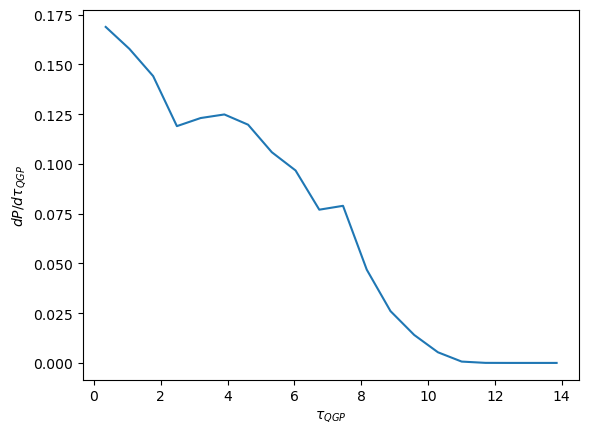

In [16]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/d\tau_{QGP}$')
axis.set_xlabel(r'$\tau_{QGP}$')#, rotation=0)


df = partons
counts, bins = np.histogram(df['time_total_plasma'], weights=df['weight'], bins=20)
bin_centers = (bins[1:] + bins[0:-1])/2
bin_widths = bins[1:] - bins[0:-1]
axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')
#axis.set_xlim(0.1, 0.65)

#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

(0.1, 0.65)

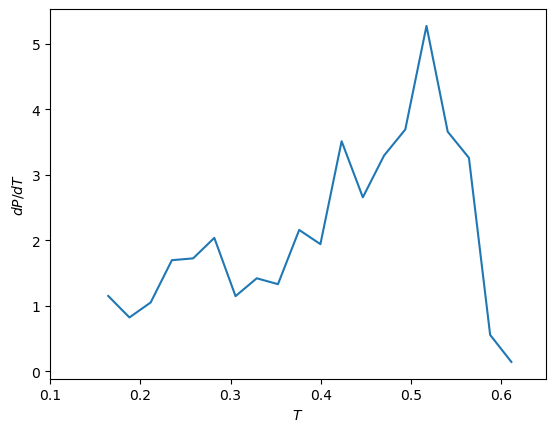

In [17]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/dT$')
axis.set_xlabel(r'$T$')#, rotation=0)


df = partons
counts, bins = np.histogram(df['Tmax_event'], weights=df['weight'], bins=20)
bin_centers = (bins[1:] + bins[0:-1])/2
bin_widths = bins[1:] - bins[0:-1]
axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')
axis.set_xlim(0.1, 0.65)

#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/numpy/lib/histograms.py:858: RuntimeWarning: overflow encountered in cast
  n += np.bincount(indices, weights=tmp_w,
/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/numpy/lib/histograms.py:858: RuntimeWarning: overflow encountered in add
  n += np.bincount(indices, weights=tmp_w,
/tmp/jbahder-tmpdir-OCeF2i/ipykernel_464062/2826926369.py:10: RuntimeWarning: invalid value encountered in divide
  axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')


(1.0, 23.0)

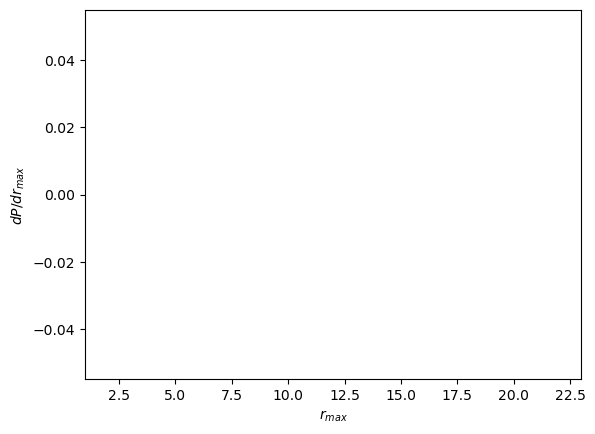

In [16]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/dr_{max}$')
axis.set_xlabel(r'$r_{max}$')#, rotation=0)


df = partons.dropna()
counts, bins = np.histogram(df['rmax'].to_numpy().astype(float), weights=df['weight'], bins=20)
bin_centers = (bins[1:] + bins[0:-1])/2
bin_widths = bins[1:] - bins[0:-1]
axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')
axis.set_xlim(1, 23)

#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/numpy/lib/histograms.py:858: RuntimeWarning: overflow encountered in cast
  n += np.bincount(indices, weights=tmp_w,
/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/numpy/lib/histograms.py:858: RuntimeWarning: overflow encountered in add
  n += np.bincount(indices, weights=tmp_w,
/tmp/jbahder-tmpdir-OCeF2i/ipykernel_464062/907426310.py:10: RuntimeWarning: invalid value encountered in divide
  axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')


(-0.05, 0.25)

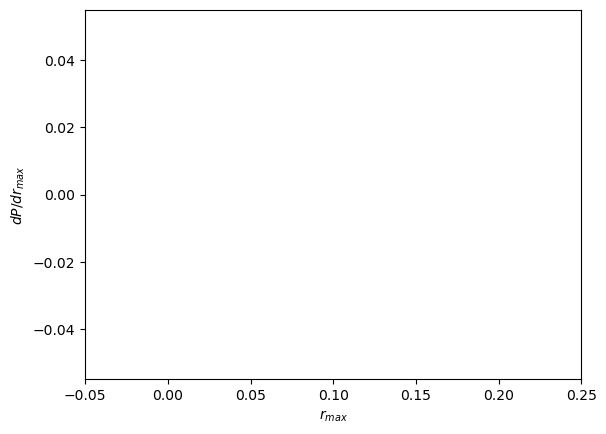

In [17]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/dr_{max}$')
axis.set_xlabel(r'$r_{max}$')#, rotation=0)


df = partons.dropna()
counts, bins = np.histogram(df['v_2'].to_numpy().astype(float), weights=df['weight'], bins=20)
bin_centers = (bins[1:] + bins[0:-1])/2
bin_widths = bins[1:] - bins[0:-1]
axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths))#, marker='+')
axis.set_xlim(-0.05, 0.25)

#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

In [18]:
print('Mean T: {}'.format(np.mean(df['Tmax_event'])))
print('Mean r_max: {}'.format(np.mean(df['rmax'])))
print('Mean v_2: {}'.format(np.mean(df['v_2'])))

Mean T: nan
Mean r_max: nan
Mean v_2: 0.054740806481066585


## Comparisons of statistical distributions

No handles with labels found to put in legend.


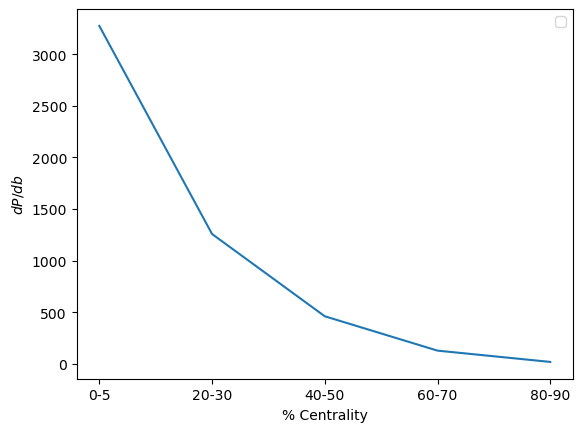

In [24]:
fig, axis = plt.subplots()
axis.set_ylabel(r'N')
axis.set_xlabel(r'% Centrality')#, rotation=0)

mult_array = np.array([])
label_list = ['Full Set']
for cent in cent_bins:
    mult = df[df['cent'] == cent]['mult'].mean()
    mult_array = np.append(mult_array, mult)
    
axis.plot(cent_bins, mult_array)
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

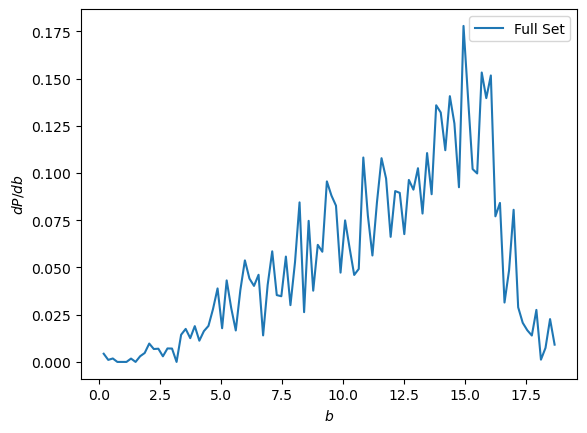

In [17]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/db$')
axis.set_xlabel(r'$b$')#, rotation=0)

i=0
label_list = ['Full Set']
for df in [partons]:
    counts, bins = np.histogram(df['b'], bins=100, weights=df['pA_weight'])
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df['pA_weight'])*bin_widths), label=label_list[i])#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

pA
AA (EL)
AA (EL + Drift)


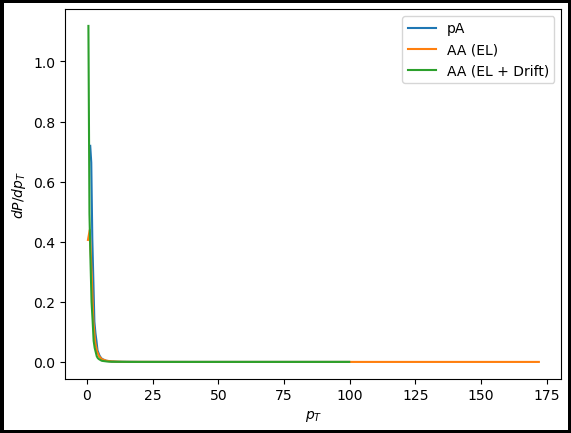

In [19]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_ylabel(r'$dP/dp_T$')
axis.set_xlabel(r'$p_T$')#, rotation=0)

i=0

df = partons
df['fix_phi_0'] = np.mod(df['phi_0'] - df['psi_2'], 2*np.pi)
df['fix_phi_f'] = np.mod(df['phi_f'] - df['psi_2'], 2*np.pi)

for case in ['pA', 'AA (EL)', 'AA (EL + Drift)']:
    if case == 'pA':
        case_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
        phi_series = 'pt_0'
    elif case == 'AA (EL)':
        case_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
        phi_series = 'pt_f'
    elif case == 'AA (EL + Drift)':
        case_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)
        phi_series = 'pt_f'

    print(case)
    
    counts, bins = np.histogram(df[case_mask][phi_series], weights=df[case_mask]['weight'], bins=250)
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df[case_mask]['weight'])*bin_widths), label=case)#, lw=2.5)#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
#fig.savefig('cos2phi_mod.png')

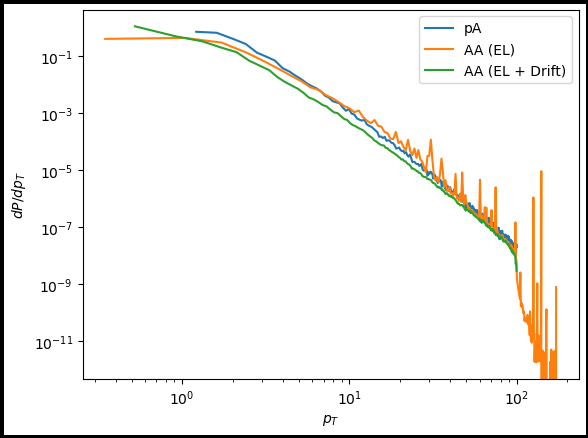

In [21]:
axis.set_xscale('log')
axis.set_yscale('log')
fig

AA (EL)
AA (EL + Drift)


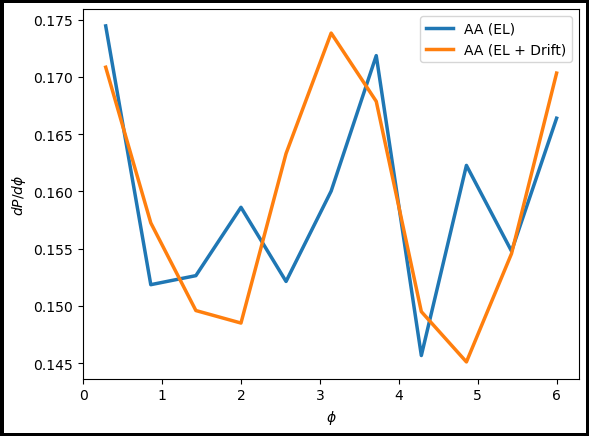

In [18]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_ylabel(r'$dP/d\phi$')
axis.set_xlabel(r'$\phi$')#, rotation=0)

i=0

df = partons
df['fix_phi_0'] = np.mod(df['phi_0'] - df['psi_2'], 2*np.pi)
df['fix_phi_f'] = np.mod(df['phi_f'] - df['psi_2'], 2*np.pi)

for case in ['AA (EL)', 'AA (EL + Drift)']:
    if case == 'pA':
        case_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
        phi_series = 'fix_phi_0'
    elif case == 'AA (EL)':
        case_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
        phi_series = 'fix_phi_f'
    elif case == 'AA (EL + Drift)':
        case_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)
        phi_series = 'fix_phi_f'

    print(case)
    
    counts, bins = np.histogram(df[case_mask][phi_series], weights=df[case_mask]['weight'], bins=11)
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df[case_mask]['weight'])*bin_widths), label=case, lw=2.5)#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
fig.savefig('cos2phi_mod.png')

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


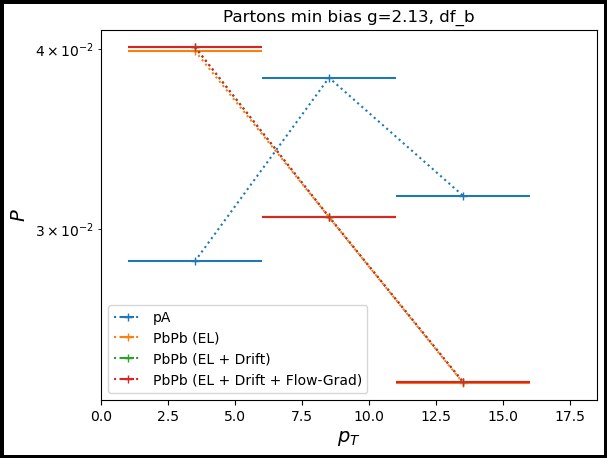

In [42]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$P$', fontsize=14)
axis.set_title('Partons min bias g=2.13, df_b')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2



# Create pt bins
pt_res = 5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
        # angles_run = 11
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        # p_mask = p_mask & (total['jetNo'] == 0)
        # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
        
        
        # comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        # comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # # Get bin centers
        # #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # # Do v0        
        # # # Compute complex harmonic for each jet
        # # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # # Get real and imaginary parts
        # # real_harm_array_0 = np.real(comp_harm_array_0)
        # # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # # sum real and imaginary parts separately
        # # mean_real_harm_0 = np.sum(real_harm_array_0)
        # # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # # Compute magnitude
        # # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # # Do vn
        # # Compute complex harmonic for each jet
        # comp_harm = comp_harm_p + comp_harm_n

        
        # # Get real and imaginary parts
        # real_harm = np.real(comp_harm)
        # imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = len(total.loc[p_mask])/len(total)#np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
axis.set_yscale('log')

## Effect Strength

No handles with labels found to put in legend.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


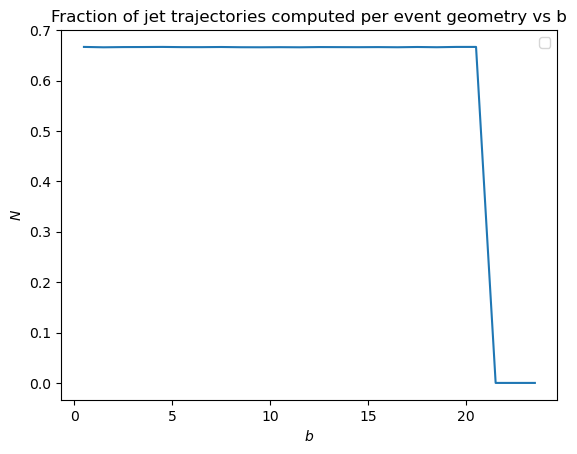

In [11]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$b$')
axis.set_ylabel(r'$N$')#, rotation=0)
axis.set_title('Fraction of jet trajectories computed per event geometry vs b')

pt_bin_edges = np.arange(0, 25)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

avg_array = np.array([])
for i in np.arange(0, len(pt_bin_centers)):
    # bin data
    pt_min = pt_bin_edges[i]
    pt_max = pt_bin_edges[i+1]
    mask = (df['b'] > pt_min) & (df['b'] < pt_max)

    # average
    avg = np.mean(df[mask]['seed'].value_counts())/(11*100*3*2)
    try:
        float(avg)
    except:
        avg = 0
    avg_array = np.append(avg_array, avg)

axis.plot(pt_bin_centers, avg_array)#, marker='+')

axis.legend()

b_weight = lambda b : np.interp(b, pt_bin_centers, avg_array)
partons['b_weight'] = 1/b_weight(partons['b'])

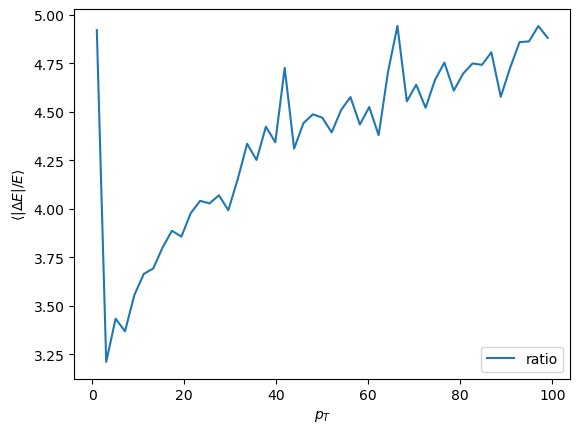

In [18]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$')#, rotation=0)
#axis.set_title('Mean Energy Loss, JMA, g=2.13')

pt_bin_edges = np.linspace(0, 100, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

for case in ['gluons', 'light quarks']:

    p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False) & (df['fgqhat'] == False) 
    
    if case == 'gluons':
        id_mask = (df['id'] == 21)
    else:
        id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    
    p_mask = p_mask & id_mask

    weight_choice = 'weight'
    
    avg_array = np.array([])
    
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(df[t_mask]['q_el'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
        
    
    #axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')
    if case == 'gluons':
        gluon_array = avg_array
    else:
        quark_array = avg_array

axis.plot(pt_bin_centers, gluon_array/quark_array, label='ratio')#, marker='+')
axis.legend()

    #0603010
#fig.savefig('eloss.png')

In [ ]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$\tau$')
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$')#, rotation=0)
#axis.set_title('Mean Energy Loss, JMA, g=2.13')

pt_bin_edges = np.linspace(0, 15, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

for case in ['gluons', 'light quarks']:

    p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False) & (df['fgqhat'] == False) 
    
    if case == 'gluons':
        id_mask = (df['id'] == 21)
    else:
        id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    
    p_mask = p_mask & id_mask

    weight_choice = 'weight'
    
    avg_array = np.array([])
    
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['time_total_plasma'] > pt_min) & (df['time_total_plasma'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(df[t_mask]['q_el'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')

axis.legend()

    #0603010
#fig.savefig('eloss.png')

In [ ]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$')#, rotation=0)
#axis.set_title('Mean Energy Loss, JMA, g=2.13')

pt_bin_edges = np.linspace(0, 20, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

for case in ['gluons', 'light quarks']:

    p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False) & (df['fgqhat'] == False) 
    
    if case == 'gluons':
        id_mask = (df['id'] == 21)
    else:
        id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    
    p_mask = p_mask & id_mask

    weight_choice = 'weight'
    
    avg_array = np.array([])
    
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(df[t_mask]['q_el'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')

axis.legend()

    #0603010
#fig.savefig('eloss.png')

In [ ]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$')#, rotation=0)
#axis.set_title('Mean Energy Loss, JMA, g=2.13')

pt_bin_edges = np.linspace(0, 20, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

for case in ['gluons', 'light quarks']:

    p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False) & (df['fgqhat'] == False) 
    
    if case == 'gluons':
        id_mask = (df['id'] == 21)
    else:
        id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    
    p_mask = p_mask & id_mask

    weight_choice = 'weight'
    
    avg_array = np.array([])
    
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(df[t_mask]['q_el']), weights=df[t_mask][weight_choice])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')

axis.legend()

    #0603010
#fig.savefig('eloss.png')

In [ ]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$\langle \left| q_{drift} \right| / E \rangle$')#, rotation=0)
#axis.set_title('Mean Energy Loss, JMA, g=2.13')

pt_bin_edges = np.linspace(0, 20, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df = partons

for case in ['gluons', 'light quarks']:

    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & (df['fgqhat'] == False)
    
    if case == 'gluons':
        id_mask = (df['id'] == 21)
    else:
        id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    
    p_mask = p_mask & id_mask

    weight_choice = 'weight'
    
    avg_array = np.array([])
    
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(df[t_mask]['q_drift'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')

axis.legend()

    #0603010
#fig.savefig('.png')

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta E/E$', fontsize=14)
#axis.set_title('CMS vs JMA Ch. Hadrons 40-50%')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'weight'

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['80-90', '60-70', '40-50', '20-30', '0-5']))

for cent in cent_bins:
    # if cent == '0-5':
    #     CMS_v2 = CMS_0_5_v2
    #     cent_mask = (total['cent'] == '0-5')
    # elif cent == '30-40':
    #     CMS_v2 = CMS_30_40_v2
    #     cent_mask = (total['cent'] == '30-40')
    # elif cent == '50-60':
    #     CMS_v2 = CMS_50_60_v2
    #     cent_mask = (total['cent'] == '50-60')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    cent_mask = (total['cent'] == cent)
    

    
    # Create pt bins
    pt_res = 2.5
    num_pt_points = 8
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL + Drift + Flow-Grad)']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)  & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
                
            elif case == 'pA':
                phi_series = 'phi_0'
                pt_series = 'pt_0'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            mean_harm = np.average((total.loc[p_mask, 'q_fg_utau_qhat'] + total.loc[p_mask, 'q_fg_uperp_qhat'] + total.loc[p_mask, 'q_el'])/total.loc[p_mask, 'pt'], weights=total.loc[p_mask, 'pA_weight'])
            
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    axis.errorbar(pt_domain, drift_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    j += 1
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta E/E$', fontsize=14)
#axis.set_title('CMS vs JMA Ch. Hadrons 40-50%')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'weight'

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['80-90']))

for cent in cent_bins:
    # if cent == '0-5':
    #     CMS_v2 = CMS_0_5_v2
    #     cent_mask = (total['cent'] == '0-5')
    # elif cent == '30-40':
    #     CMS_v2 = CMS_30_40_v2
    #     cent_mask = (total['cent'] == '30-40')
    # elif cent == '50-60':
    #     CMS_v2 = CMS_50_60_v2
    #     cent_mask = (total['cent'] == '50-60')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    cent_mask = (total['cent'] == cent)
    

    
    # Create pt bins
    pt_res = 2.5
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL + Drift + Flow-Grad)']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)  & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
                
            elif case == 'pA':
                phi_series = 'phi_0'
                pt_series = 'pt_0'
                p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            mean_harm = np.average((total.loc[p_mask, 'q_fgqhat']+total.loc[p_mask, 'q_el'])/total.loc[p_mask, 'pt'], weights=total.loc[p_mask, 'pA_weight'])
            
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    axis.errorbar(pt_domain, drift_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    j += 1
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

## $R_{AA}$

### Partonic

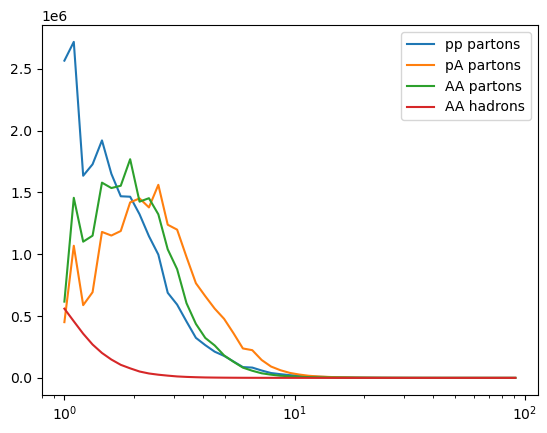

In [22]:
df = partons
p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & (df['fgqhat'] == False)
pt_bins = np.logspace(start=0, stop=2, num = 50)
pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'].to_numpy().astype(float), weights=df[p_mask]['weight'].to_numpy().astype(float), bins=pt_bins)
pion_counts_pA, pion_bins_pA = np.histogram(df[p_mask]['pt'].to_numpy().astype(float), weights=df[p_mask]['pA_weight'].to_numpy().astype(float), bins=pt_bins)
pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'].to_numpy().astype(float), weights=df[p_mask]['pA_weight'].to_numpy().astype(float), bins=pt_bins)
pion_counts_AA_pion, pion_bins_AA_pion = np.histogram(df[p_mask]['pion_pt_f'].to_numpy().astype(float), weights=df[p_mask]['pA_weight'].to_numpy().astype(float), bins=pt_bins)

plt.plot(pion_bins_pp[0:-1], pion_counts_pp, label='pp partons')
plt.plot(pion_bins_pA[0:-1], pion_counts_pA, label='pA partons')
plt.plot(pion_bins_AA[0:-1], pion_counts_AA, label='AA partons')
plt.plot(pion_bins_AA_pion[0:-1], pion_counts_AA_pion, label='AA hadrons')
plt.xscale('log')
plt.legend()

In [19]:
partons.columns

Index(['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el',
       'drift', 'fg', 'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el',
       'q_drift', 'q_fg_utau', 'q_fg_uperp', 'e2', 'Tmax_event', 'b', 'rmax',
       'time_total_plasma', 'jetNo', 'x_0', 'process_run', 'seed', 'fgqhat',
       'q_fg_utau_qhat', 'q_fg_uperp_qhat', 'pt', 'pion_pt_f', 'pion_pt',
       'cent', 'pA_weight'],
      dtype='object')

(0.0, 30.0)

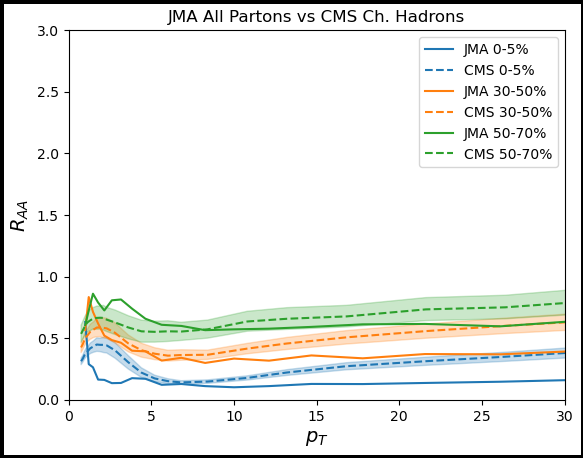

In [74]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA All Partons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['fgqhat'] == False)
    if cent == '0-5':
        cent_mask = (df['cent'] == cent)
    elif cent == '30-50':
        cent_mask = (df['cent'] == '30-40') | (df['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (df['cent'] == '50-60') | (df['cent'] == '60-70')

    p_mask = p_mask & cent_mask

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt_0'].to_numpy().astype(float), weights=df[p_mask]['weight'].to_numpy().astype(float), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'].to_numpy().astype(float), weights=df[p_mask]['pA_weight'].to_numpy().astype(float), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()


    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 3)
axis.set_xlim(0, 30)
#fig.savefig('raa_hadrons_g2.png')

(0.0, 30.0)

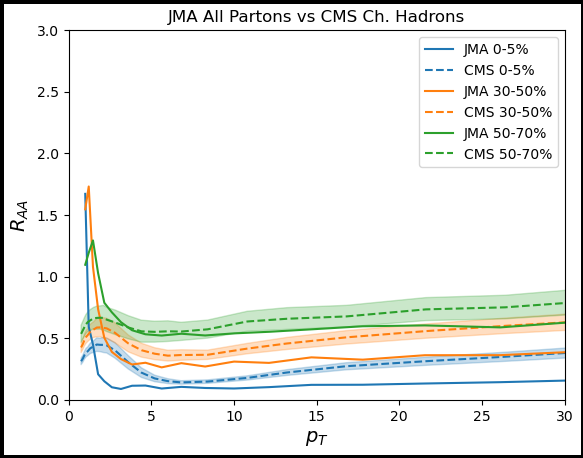

In [73]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA All Partons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['fgqhat'] == False)
    if cent == '0-5':
        cent_mask = (df['cent'] == cent)
    elif cent == '30-50':
        cent_mask = (df['cent'] == '30-40') | (df['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (df['cent'] == '50-60') | (df['cent'] == '60-70')

    p_mask = p_mask & cent_mask

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt_0'].to_numpy().astype(float), weights=1000*df[p_mask]['weight'].to_numpy().astype(float), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'].to_numpy().astype(float), weights=1000*df[p_mask]['weight'].to_numpy().astype(float), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()


    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 3)
axis.set_xlim(0, 30)
#fig.savefig('raa_hadrons_g2.png')

(0.0, 100.0)

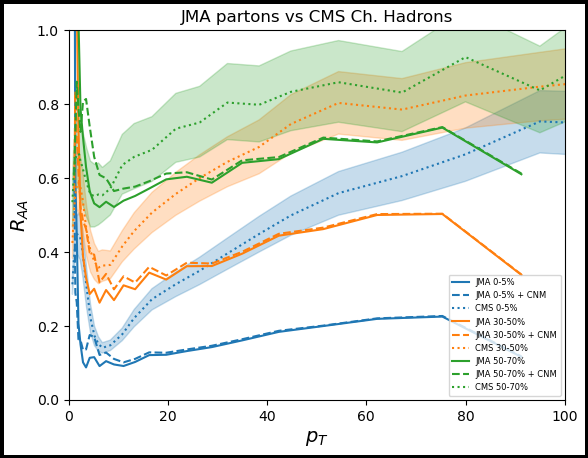

In [75]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA partons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    ls = ['solid', '--']
    weight_ops = ['weight', 'pA_weight']
    CNM_label = ['', '+ CNM']
    for k in np.arange(0, len(weight_ops)):
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend(prop={'size': 6})
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

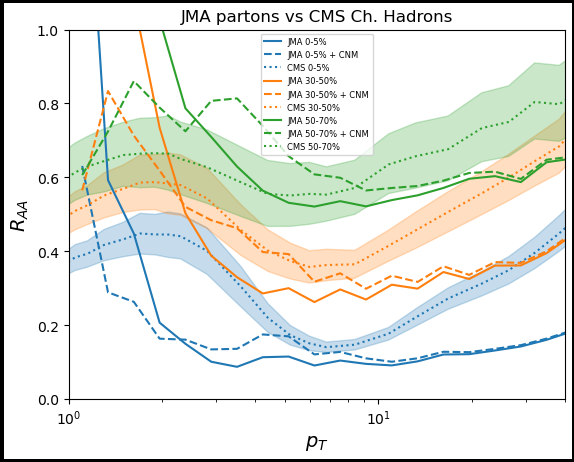

In [76]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
#fig.set_size_inches(18.5, 10.5)
fig

### Hadronic

NameError: name 'unity_weight' is not defined

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


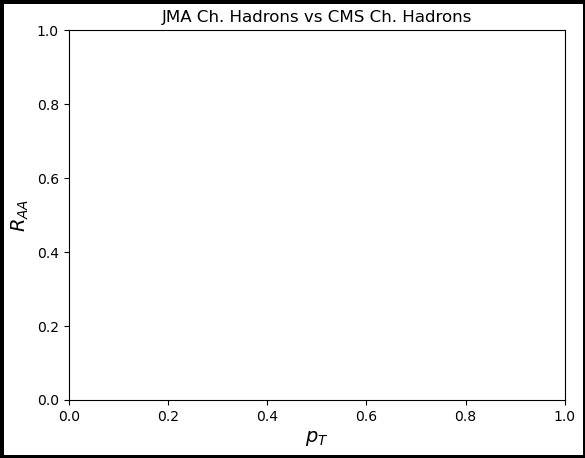

In [12]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=unity_weight(df[p_mask]['pt_0'].to_numpy()), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=unity_weight(df[p_mask]['pt_0'].to_numpy()), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()

    # Plot
    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

NameError: name 'new_weight' is not defined

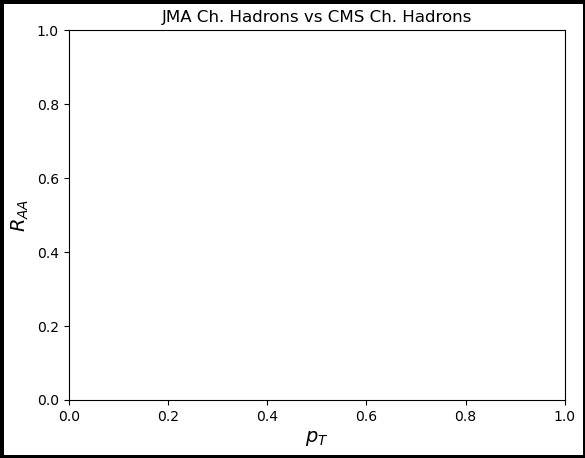

In [13]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=new_weight(df[p_mask]['pt_0'].to_numpy()), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=new_weight(df[p_mask]['pt_0'].to_numpy()), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()

    # Plot
    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

In [19]:
np.mean(partons[(partons['cent'] == '0-5') | (partons['cent'] == '5-10')]['npart'])

365.05950288213893

In [20]:
np.mean(partons[(partons['cent'] == '30-40') | (partons['cent'] == '40-50')]['npart'])

110.51837545919489

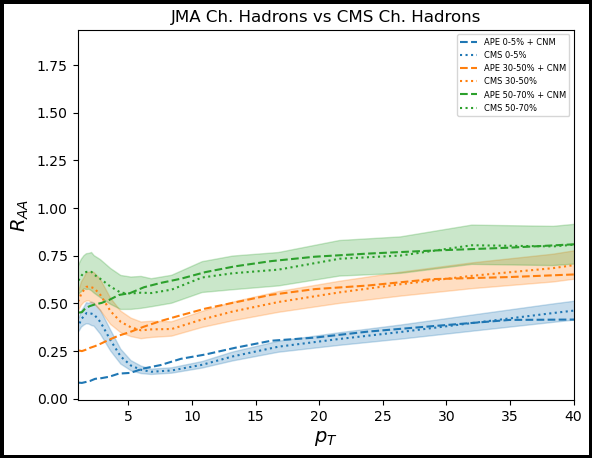

In [9]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == True)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    ls = ['solid', '--']
    weight_ops = ['weight', 'AA_weight']
    CNM_label = ['', '+ CNM']
    for k in [1]:#np.arange(0, len(weight_ops)):
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='APE {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    np.savez('hadronic_RAA_{}.npz'.format(cent), pt=((pt_bins[0:-1] + pt_bins[1:])/2), raa=pion_aa_pp)
    i += 1

axis.legend(prop={'size': 6})
axis.set_xlim(1, 40)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png

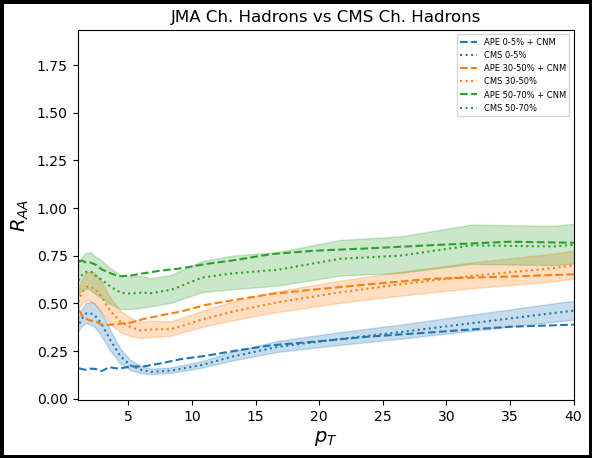

In [10]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    ls = ['solid', '--']
    weight_ops = ['weight', 'AA_weight']
    CNM_label = ['', '+ CNM']
    for k in [1]:#np.arange(0, len(weight_ops)):
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='APE {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    np.savez('hadronic_RAA_{}_CELFalse.npz'.format(cent), pt=((pt_bins[0:-1] + pt_bins[1:])/2), raa=pion_aa_pp)
    i += 1

axis.legend(prop={'size': 6})
axis.set_xlim(1, 40)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


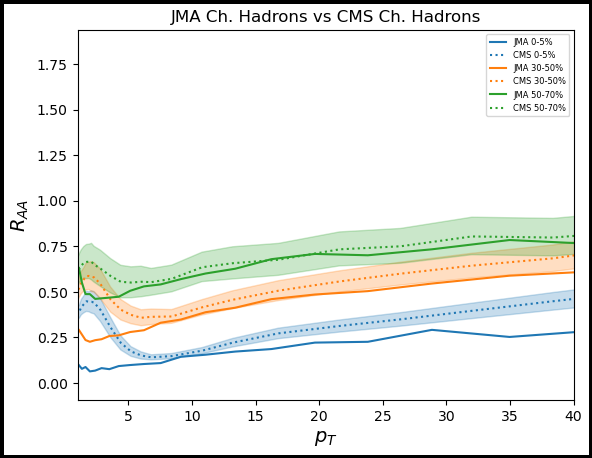

In [9]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    ls = ['solid', '--']
    weight_ops = ['weight', 'pA_weight']
    CNM_label = ['', '+ CNM']
    for k in [0]:#np.arange(0, len(weight_ops)):
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend(prop={'size': 6})
axis.set_xlim(1, 40)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png

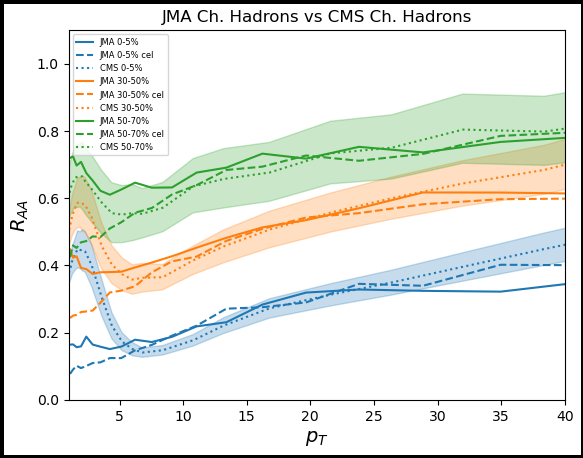

In [19]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)

df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:

    ls = ['solid', '--']
    weight_ops = ['AA_weight', 'AA_weight']
    cel_bool = [False, True]
    CNM_label = ['', 'cel']
        
    for k in [0, 1]:#np.arange(0, len(weight_ops)):
         # Make centrality cut
        p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == cel_bool[k])
        if cent == '0-5':
            p_mask = p_mask & (df['cent'] == cent)
        elif cent == '30-50':
            p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
        elif cent == '50-70':
            p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
        else:
            raise Exception
        
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])

        # Save R_AA and pt
        np.savez('raa_data/2024.07.14/hadronic_RAA_{}_{}.npz'.format(CNM_label[k], cent), pt=((pt_bins[0:-1] + pt_bins[1:])/2), raa=pion_aa_pp)
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend(prop={'size': 6})
axis.set_xlim(1, 40)
axis.set_ylim(0, 1.1)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png

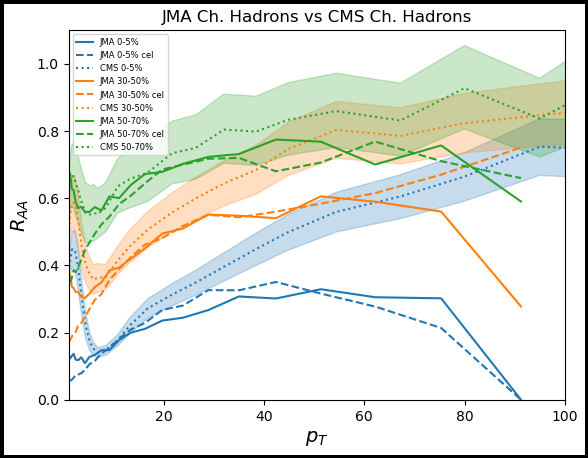

In [22]:
axis.set_xlim(1, 100)
fig

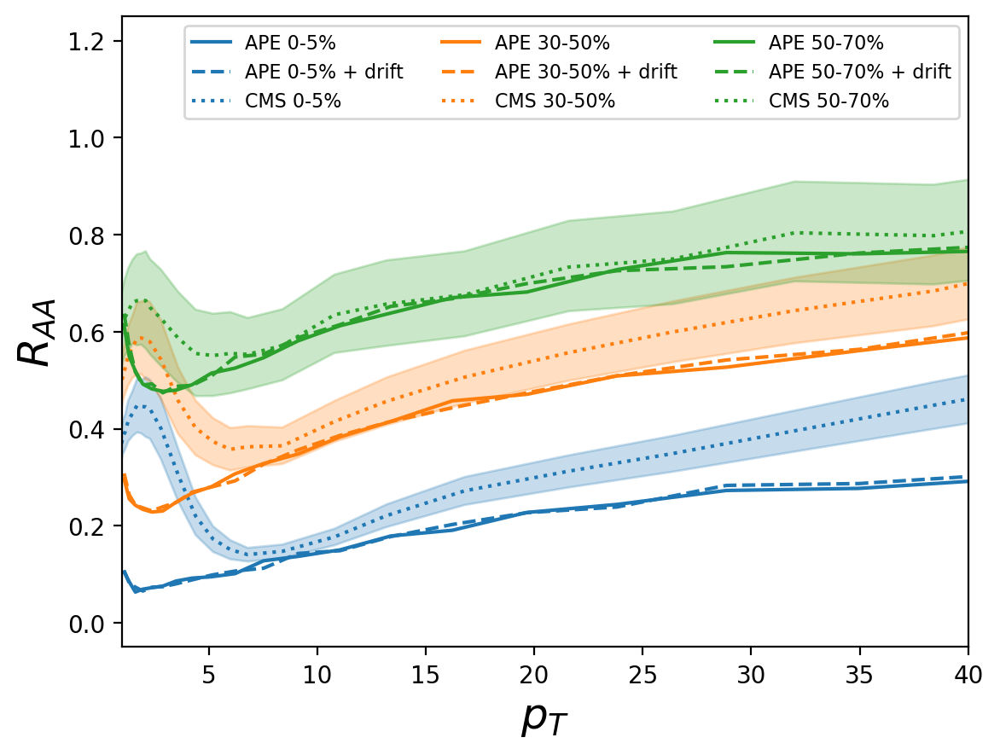

In [19]:
fig, axis = plt.subplots(dpi=200)
axis.set_xlabel(r'$p_T$', fontsize=18)
axis.set_ylabel(r'$R_{AA}$', fontsize=18)
#axis.set_title(r'APE Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:

    ls = ['solid', '--']
    weight_ops = ['weight', 'weight']
    drift_bool = [False, True]
    CNM_label = ['', '+ drift']
        
    for k in [0, 1]:#np.arange(0, len(weight_ops)):
         # Make centrality cut
        p_mask = (df['el'] == True) & (df['drift'] == drift_bool[k]) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == False)
        if cent == '0-5':
            p_mask = p_mask & (df['cent'] == cent)
        elif cent == '30-50':
            p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
        elif cent == '50-70':
            p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
        else:
            raise Exception
        
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='APE {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend(prop={'size': 8}, ncol=3)
axis.set_xlim(1, 40)
axis.set_ylim(-0.05, 1.25)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png
fig.savefig('raa_drift_rad_plot.png', bbox_inches='tight')

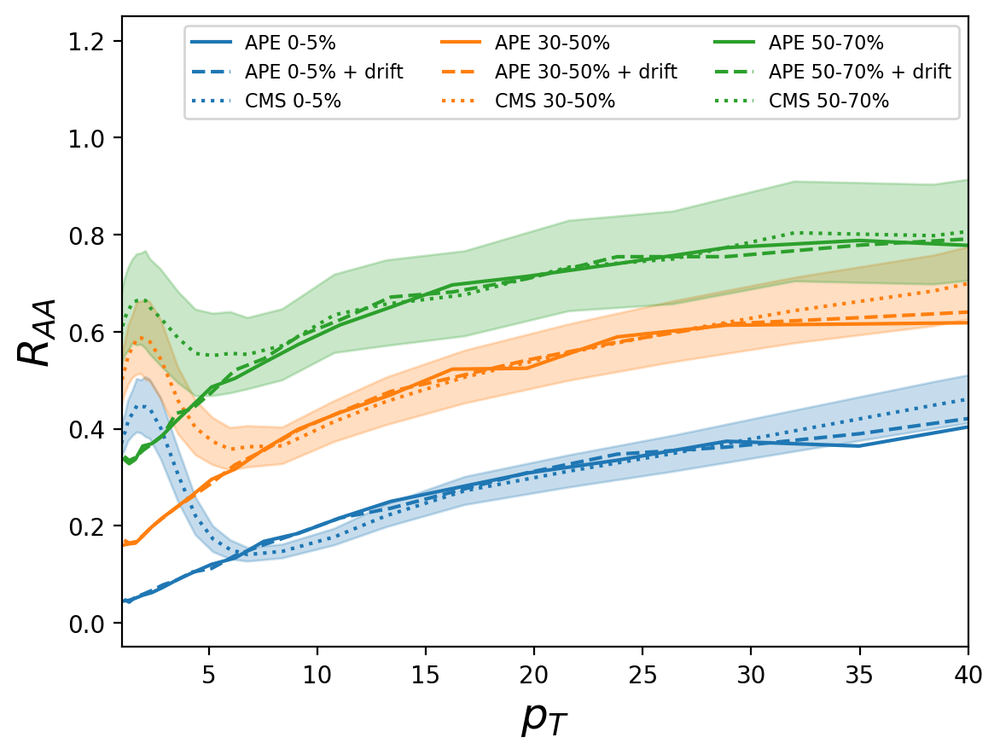

In [18]:
fig, axis = plt.subplots(dpi=200)
axis.set_xlabel(r'$p_T$', fontsize=18)
axis.set_ylabel(r'$R_{AA}$', fontsize=18)
#axis.set_title(r'APE Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:

    ls = ['solid', '--']
    weight_ops = ['weight', 'weight']
    drift_bool = [False, True]
    CNM_label = ['', '+ drift']
        
    for k in [0, 1]:#np.arange(0, len(weight_ops)):
         # Make centrality cut
        p_mask = (df['el'] == True) & (df['drift'] == drift_bool[k]) & (df['fg'] == False)  & (df['fgqhat'] == False) & (df['cel'] == True)
        if cent == '0-5':
            p_mask = p_mask & (df['cent'] == cent)
        elif cent == '30-50':
            p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
        elif cent == '50-70':
            p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
        else:
            raise Exception
        
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask][weight_ops[k]].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

        # Plot
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='APE {}% {}'.format(cent, CNM_label[k]), color=colors[i], ls=ls[k])
    
    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle=':', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend(prop={'size': 8}, ncol=3)
axis.set_xlim(1, 40)
axis.set_ylim(-0.05, 1.25)
axis.set_xscale('linear')
#fig.savefig('raa_hadrons_g2.png
fig.savefig('raa_drift_rad_cel_plot.png', bbox_inches='tight')

(0.0, 100.0)

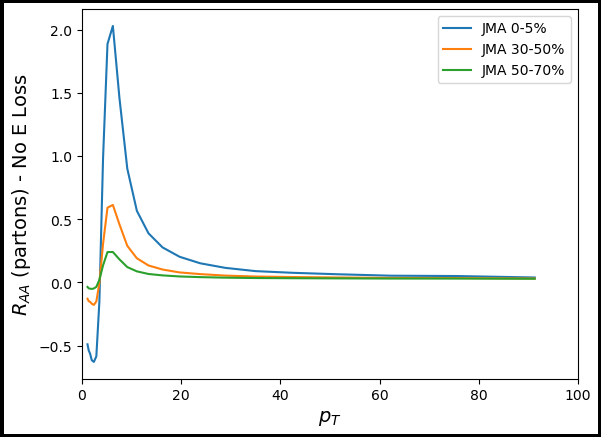

In [19]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$ (partons) - No E Loss', fontsize=14)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception


    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt_0'].to_numpy(), weights=df[p_mask]['weight'].to_numpy(), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_0'].to_numpy(), weights=(2/70)*df[p_mask]['new_weight'].to_numpy(), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    i+= 1

axis.legend()
#axis.set_ylim(0, 1.5)
axis.set_xlim(0, 100)

In [80]:
1.6/4

0.4

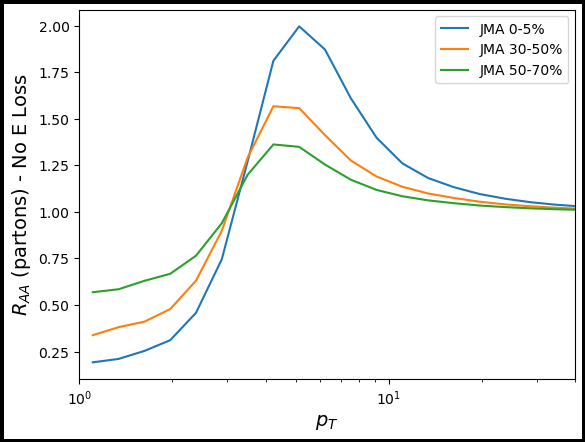

In [78]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
#fig.set_size_inches(18.5, 10.5)
fig

(0.0, 100.0)

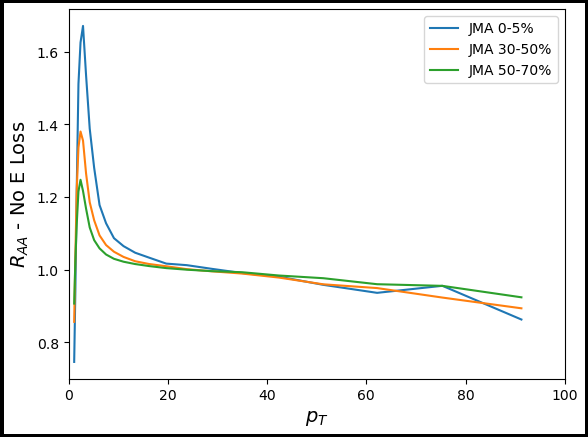

In [42]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$ - No E Loss', fontsize=14)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception


    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['pA_weight'].to_numpy(), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    i+= 1

axis.legend()
#axis.set_ylim(0, 1.5)
axis.set_xlim(0, 100)

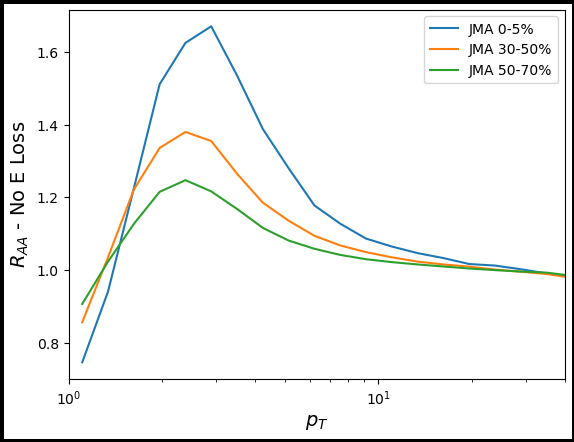

In [43]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
#fig.set_size_inches(18.5, 10.5)
fig

(0.0, 100.0)

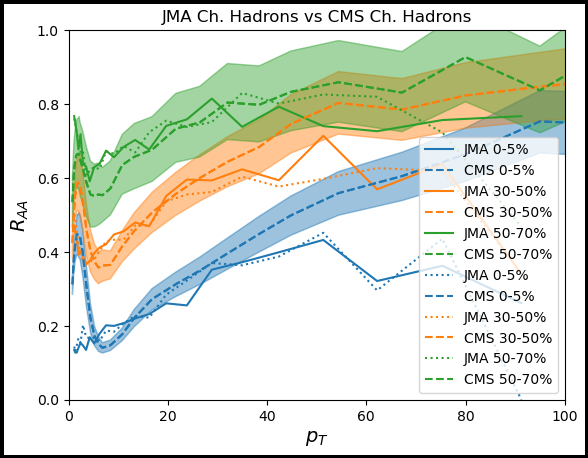

In [86]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for drift in [False, True]:
    i = 0
    for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
        # Make centrality cut
        p_mask = (df['el'] == True) & (df['drift'] == drift) & (df['fg'] == False)  & (df['fgqhat'] == False)
        if cent == '0-5':
            p_mask = p_mask & (df['cent'] == cent)
        elif cent == '30-50':
            p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
        elif cent == '50-70':
            p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
        else:
            raise Exception
    
        # Bin pions
        pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
        #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask]['pA_weight'].to_numpy(), bins=pt_bins)
    
        # Compute R_AA
        pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
    
        # Get CMS R_AA
        if cent == '0-5':
            CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
            CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
            CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
            CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
        elif cent == '30-50':
            CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
            CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
            CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
            CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
        elif cent == '50-70':
            CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
            CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
            CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
            CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()
    
        # Plot
        if drift:
            ls = ':'
        else:
            ls = 'solid'
        axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i], ls=ls)
        axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
        axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
        i += 1

axis.legend()
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

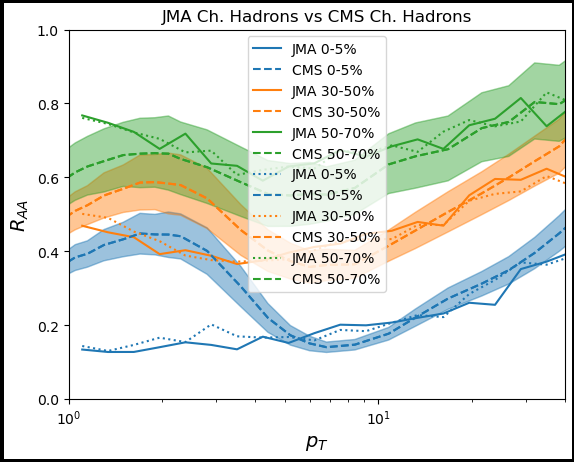

In [87]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
#fig.set_size_inches(18.5, 10.5)
fig

(0.0, 100.0)

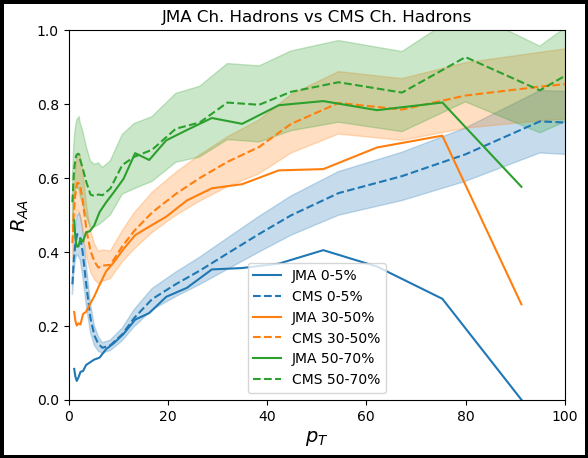

In [14]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()

    # Plot
    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

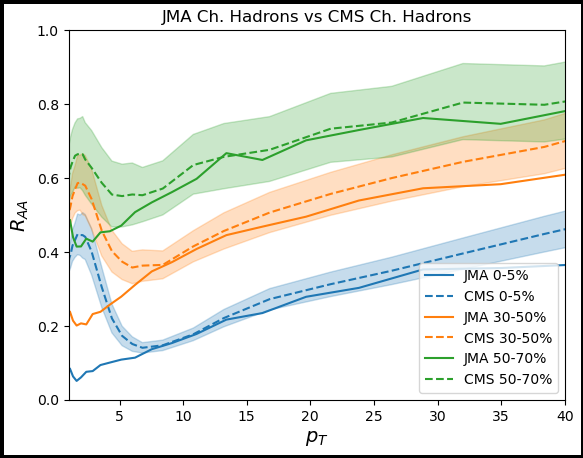

In [15]:
axis.set_xlim(1, 40)
axis.set_xscale('linear')
fig

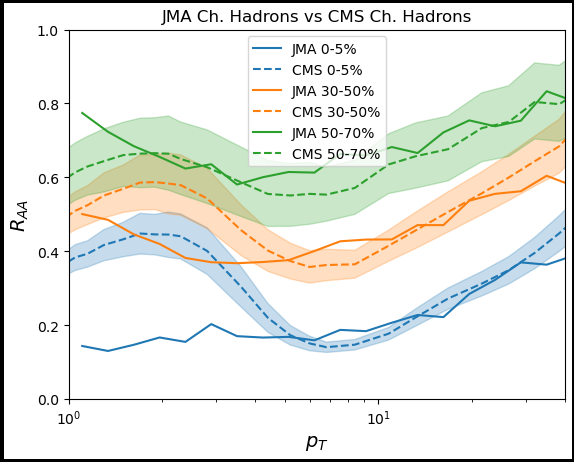

In [77]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
fig

(0.0, 100.0)

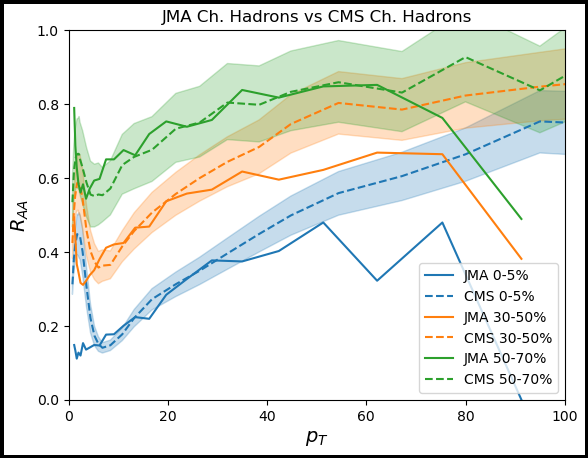

In [81]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Hadrons')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()
for cent in ['0-5', '30-50', '50-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
    if cent == '0-5':
        p_mask = p_mask & (df['cent'] == cent)
    elif cent == '30-50':
        p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
    elif cent == '50-70':
        p_mask = p_mask & ((df['cent'] == '50-60') | (df['cent'] == '60-70'))
    else:
        raise Exception

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['hadron_pt_0'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['hadron_pt_f'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get CMS R_AA
    if cent == '0-5':
        CMS_raa_perr_array = np.sqrt(CMS_0_5_data['stat+']**2 + CMS_0_5_data['syst+']**2 + CMS_0_5_data["sys,TAA +"]**2 + CMS_0_5_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_0_5_data['stat-']**2 + CMS_0_5_data['syst-']**2 + CMS_0_5_data["sys,TAA -"]**2 + CMS_0_5_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_0_5_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_0_5_data['RAA'].to_numpy()
    elif cent == '30-50':
        CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()
    elif cent == '50-70':
        CMS_raa_perr_array = np.sqrt(CMS_50_70_data['stat+']**2 + CMS_50_70_data['syst+']**2 + CMS_50_70_data["sys,TAA +"]**2 + CMS_50_70_data["sys,lumi +"]**2).to_numpy()
        CMS_raa_nerr_array = np.sqrt(CMS_50_70_data['stat-']**2 + CMS_50_70_data['syst-']**2 + CMS_50_70_data["sys,TAA -"]**2 + CMS_50_70_data["sys,lumi -"]**2).to_numpy()
        CMS_raa_pt_array = CMS_50_70_data['pt'].to_numpy()
        CMS_raa_RAA_array = CMS_50_70_data['RAA'].to_numpy()

    # Plot
    axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[i])
    axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
    i += 1

axis.legend()
axis.set_ylim(0, 1)
axis.set_xlim(0, 100)
#fig.savefig('raa_hadrons_g2.png

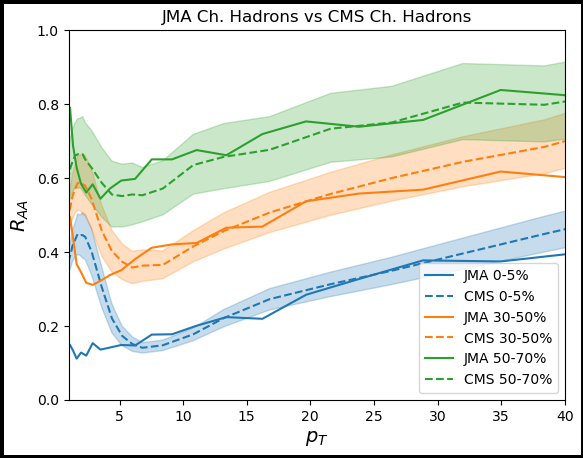

In [82]:
axis.set_xlim(1, 40)
axis.set_xscale('linear')
fig

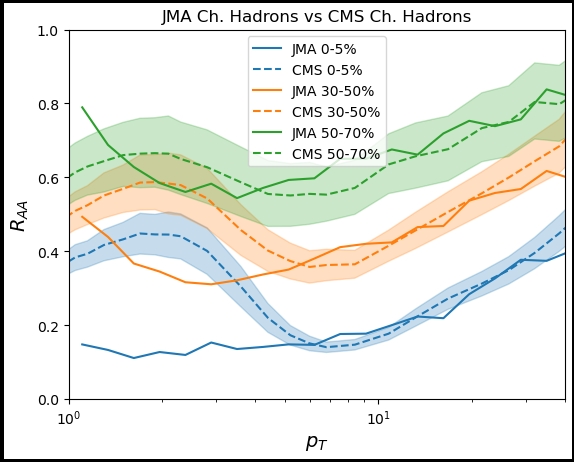

In [83]:
axis.set_xlim(1, 40)
axis.set_xscale('log')
fig

In [35]:
pt_bins[3:31]

array([  1. ,   1.1,   1.2,   1.4,   1.6,   1.8,   2. ,   2.2,   2.4,
         3.2,   4. ,   4.8,   5.6,   6.4,   7.2,   9.6,  12. ,  14.4,
        19.2,  24. ,  28.8,  35.2,  41.6,  48. ,  60.8,  73.6,  86.4,
       103.6])

In [41]:
np.transpose(np.array([[1, 2, 3]]))

array([[1],
       [2],
       [3]])

In [46]:
pts = np.array([1, 2, 3])
z_vals = np.array([0.1, 0.5, 1])
had_pts = (np.transpose(np.array([pts]))*z_vals)

In [56]:
(np.array([1, 2, 3]) > 1) & (np.array([1, 2, 3]) < 3)

array([False,  True, False])

/tmp/jbahder-tmpdir-qHzcnf/ipykernel_1664251/2349957493.py:33: RuntimeWarning: invalid value encountered in divide
  RAA = AA_counts / pp_counts
/tmp/jbahder-tmpdir-qHzcnf/ipykernel_1664251/2349957493.py:34: RuntimeWarning: invalid value encountered in divide
  RAA_CNM = AA_counts_CNM / pp_counts
/tmp/jbahder-tmpdir-qHzcnf/ipykernel_1664251/2349957493.py:36: RuntimeWarning: invalid value encountered in divide
  RAA = AA_counts / pp_counts
/tmp/jbahder-tmpdir-qHzcnf/ipykernel_1664251/2349957493.py:37: RuntimeWarning: invalid value encountered in divide
  RAA_CNM = AA_counts_CNM / pp_counts


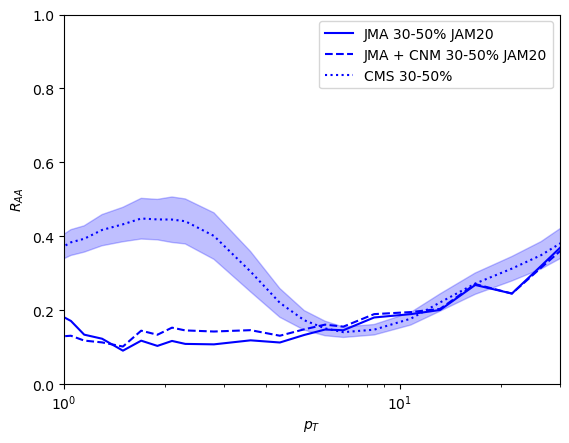

In [62]:
z_xr = xr.open_dataarray('/fs1/project/sievert_nt/jma_data/raa-v2/z_JAM20-SIDIS_FF_hadron_nlo.nc')
num_frags = 100

CMS_df = CMS_0_5_data
CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()

pt_bins = np.append(CMS_df['bin_edge_0'].to_numpy(), CMS_df['bin_edge_1'].to_numpy()[-1])
pt_labels = CMS_df['pt'].to_numpy()
pp_counts = np.zeros_like(pt_labels)
AA_counts = np.zeros_like(pt_labels)
AA_counts_CNM = np.zeros_like(pt_labels)
df = partons.dropna()

p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
p_mask = p_mask & (df['cent'] == '0-5')
for index, parton in df[p_mask].iterrows():
    z_vals = z_xr.sel(pt=parton['pt'], method='Nearest').sel(pid=parton['id']).to_numpy()[0:num_frags]
    new_pp_pts = parton['pt'] * z_vals
    new_AA_pts = parton['pt_f'] * z_vals
    new_pp_counts, bins = np.histogram(new_pp_pts, bins=pt_bins)
    new_AA_counts, bins = np.histogram(new_AA_pts, bins=pt_bins)

    # Perform counting for no CNM
    pp_counts = pp_counts + parton['weight']*new_pp_counts
    AA_counts = AA_counts + parton['weight']*new_AA_counts

    # Perform counting for with CNM
    AA_counts_CNM = AA_counts_CNM + parton['pA_weight']*new_AA_counts
    
RAA = AA_counts / pp_counts
RAA_CNM = AA_counts_CNM / pp_counts

RAA = AA_counts / pp_counts
RAA_CNM = AA_counts_CNM / pp_counts

fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_xlim(1,30)
axis.set_ylim(0,1)
axis.plot(pt_labels, RAA, color='blue', label='JMA 30-50% JAM20')
axis.plot(pt_labels, RAA_CNM, color='blue', label='JMA + CNM 30-50% JAM20', ls='--')
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS 30-50%'.format(cent), linestyle=':', color='blue')
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color='blue', alpha=0.25)
axis.set_xscale('log')
axis.legend()

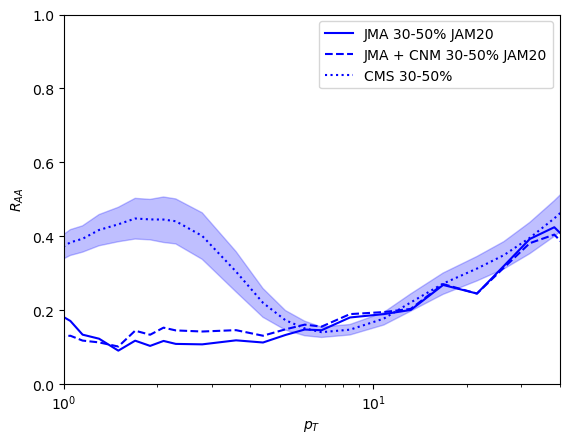

In [64]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_xlim(1,40)
axis.set_ylim(0,1)
axis.plot(pt_labels, RAA, color='blue', label='JMA 30-50% JAM20')
axis.plot(pt_labels, RAA_CNM, color='blue', label='JMA + CNM 30-50% JAM20', ls='--')
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS 30-50%'.format(cent), linestyle=':', color='blue')
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color='blue', alpha=0.25)
axis.set_xscale('log')
axis.legend()

In [ ]:
# Selections
z_xr = xr.open_dataarray('/fs1/project/sievert_nt/jma_data/raa-v2/z_JAM20-SIDIS_FF_hadron_nlo.nc')
num_frags = 10
df = partons
df['fix_phi_0'] = np.mod(df['phi_0'] - df['psi_2'], 2*np.pi)
df['fix_phi_f'] = np.mod(df['phi_f'] - df['psi_2'], 2*np.pi)


pt_series = 'pt_f'
phi_series = 'fix_phi_f'
weight_series = 'weight'
v2_pt_res = 2.5
v2_num_pt_points = 8
v2_pt_domain = np.array([1+((point+0.5)*v2_pt_res) for point in np.arange(0, v2_num_pt_points)])
v2_array = np.zeros_like(v2_pt_domain, dtype=type(1+1j))
v2_weight_array = np.zeros_like(v2_pt_domain)

# Make centrality cut
cent = '30-50'
cent_mask = ((df['cent'] == '30-40') | (df['cent'] == '40-50'))

# Load proper CMS data
if cent == '0-5':
    CMS_df = CMS_0_5_data
elif cent == '30-50':
    CMS_df = CMS_30_50_data
elif cent == '50-70':
    CMS_df = CMS_50_70_data

CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()
CMS_pt_bins = np.append(CMS_df['bin_edge_0'].to_numpy()[0:-1], CMS_df['bin_edge_1'].to_numpy()[-1])

# Get pt bins
pt_bins = np.linspace(1, 100, 100)#CMS_pt_bins[0:31]  # 1 - 103.6 GeV
pt_bin_centers = (pt_bins[:-1] + pt_bins[1:]) / 2

# Iterate over pt and id bins
for id in [21]:
    print('Analyzing PID: {}'.format(id))
    for i in np.arange(0, len(pt_bin_centers)):
        
        # Find pt bin
        pt = pt_bin_centers[i]
        pt_min = pt_bins[i]
        pt_max = pt_bins[i+1]
        print('pT = {} GeV'.format(pt))

        # Create dataframe mask
        mask = cent_mask & (df['id'] == id)
        mask = (mask & (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) 
                & (df['cel'] == False) )
        mask = mask & (df[pt_series] > pt_min) & (df[pt_series] <= pt_max)

        # Get z array
        z_vals = z_xr.sel(pt=pt, method='Nearest').sel(pid=id).to_numpy()[0:num_frags]

        # Get pt and phi arrays
        pt_parts = df[mask][pt_series].to_numpy()
        weights = df[mask][weight_series].to_numpy()
        phis = df[mask][phi_series].to_numpy().astype(np.float64)

        # Create array of hadron pts
        pt_hads = (np.transpose(np.array([pt_parts]))*z_vals)

        # Compute v2 contribution for each hadron
        phase_factors = np.exp(- 2 * 1j * phis)

        for j in np.arange(0, len(pt_parts)):
            current_pts = pt_hads[j]
            current_phase = phase_factors[j]
            current_weight = weights[j]

            for k in np.arange(0, len(v2_pt_domain)):
                v2_bin_min = v2_pt_domain[k] - (v2_pt_res/2)
                v2_bin_max = v2_pt_domain[k] + (v2_pt_res/2)
                num_binned = np.count_nonzero((current_pts > v2_bin_min) & (current_pts < v2_bin_max))

                v2_array[k] += num_binned * current_weight * current_phase
                v2_weight_array[k] += num_binned * current_weight

print(np.abs(v2_array))
print(np.abs(v2_array)/v2_weight_array)

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.plot(v2_pt_domain, np.abs(v2_array)/v2_weight_array)

/tmp/jbahder-tmpdir-bet1mV/ipykernel_1092615/1994512772.py:26: RuntimeWarning: invalid value encountered in divide
  RAA = AA_counts / pp_counts


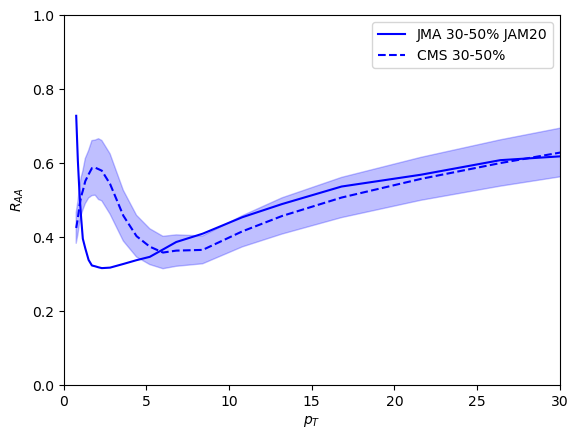

In [26]:
z_xr = xr.open_dataarray('/fs1/project/sievert_nt/jma_data/raa-v2/z_JAM20-SIDIS_FF_hadron_nlo.nc')
num_frags = 100

CMS_df = CMS_30_50_data
CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()

pt_bins = np.append(CMS_df['bin_edge_0'].to_numpy(), CMS_df['bin_edge_1'].to_numpy()[-1])
pt_labels = CMS_df['pt'].to_numpy()
pp_counts = np.zeros_like(pt_labels)
AA_counts = np.zeros_like(pt_labels)
AA_counts_CNM = np.zeros_like(pt_labels)
df = partons.dropna()

p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
for index, parton in df[p_mask].iterrows():
    z_vals = z_xr.sel(pt=parton['pt'], method='Nearest').sel(pid=parton['id']).to_numpy()[0:num_frags]
    new_pp_pts = parton['pt'] * z_vals
    new_AA_pts = parton['pt_f'] * z_vals
    new_pp_counts, bins = np.histogram(new_pp_pts, bins=pt_bins)
    new_AA_counts, bins = np.histogram(new_AA_pts, bins=pt_bins)

    # Perform counting for no CNM
    pp_counts = pp_counts + parton['weight']*new_pp_counts
    AA_counts = AA_counts + parton['weight']*new_AA_counts

    # Perform counting for with CNM
    AA_counts_CNM = AA_counts + parton['pA_weight']*new_AA_counts
    
RAA = AA_counts / pp_counts


fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_xlim(0,30)
axis.set_ylim(0,1)
axis.plot(pt_labels, RAA, color='blue', label='JMA 30-50% JAM20')
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS 30-50%'.format(cent), linestyle='--', color='blue')
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color='green', alpha=0.25)
axis.legend()

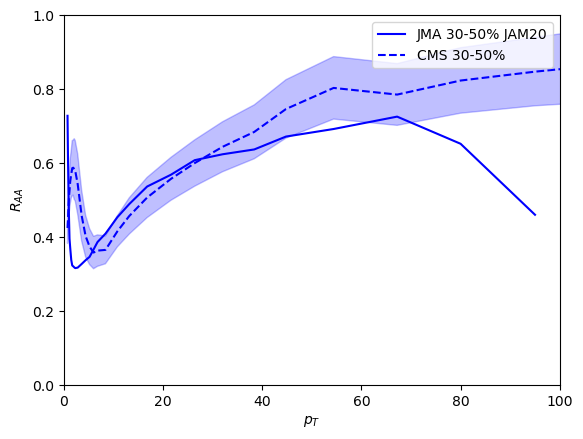

In [27]:
axis.set_xlim(0,100)
fig

/tmp/jbahder-tmpdir-bet1mV/ipykernel_1092615/217091401.py:27: RuntimeWarning: invalid value encountered in divide
  RAA = AA_counts / pp_counts


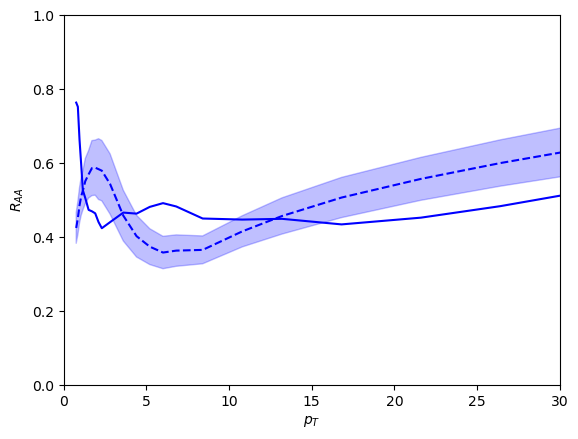

In [24]:
import xarray as xr
z_xr = xr.open_dataarray('/fs1/project/sievert_nt/jma_data/raa-v2/z_JAM22-FF_hadron_nlo.nc')

CMS_raa_perr_array = np.sqrt(CMS_30_50_data['stat+']**2 + CMS_30_50_data['syst+']**2 + CMS_30_50_data["sys,TAA +"]**2 + CMS_30_50_data["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_30_50_data['stat-']**2 + CMS_30_50_data['syst-']**2 + CMS_30_50_data["sys,TAA -"]**2 + CMS_30_50_data["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_30_50_data['pt'].to_numpy()
CMS_raa_RAA_array = CMS_30_50_data['RAA'].to_numpy()

pt_bins = np.append(CMS_30_50_data['bin_edge_0'].to_numpy(), CMS_30_50_data['bin_edge_1'].to_numpy()[-1])
pt_labels = CMS_30_50_data['pt'].to_numpy()
pp_counts = np.zeros_like(pt_labels)
AA_counts = np.zeros_like(pt_labels)
df = partons.dropna()

p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))
for index, parton in df[p_mask].iterrows():
    z_vals = z_xr.sel(pt=parton['pt'], method='Nearest').sel(pid=parton['id']).to_numpy()
    new_pp_pts = parton['pt'] * z_vals
    new_AA_pts = parton['pt_f'] * z_vals
    new_pp_counts, bins = np.histogram(new_pp_pts, bins=pt_bins)
    new_AA_counts, bins = np.histogram(new_AA_pts, bins=pt_bins)

    pp_counts = pp_counts + parton['weight']*new_pp_counts
    AA_counts = AA_counts + parton['weight']*new_AA_counts
    
RAA = AA_counts / pp_counts


fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_xlim(0,30)
axis.set_ylim(0,1)
axis.plot(pt_labels, RAA, color='blue', label='JMA 30-50% JAM22')
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS 30-50%'.format(cent), linestyle='--', color='blue')
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color='blue', alpha=0.25)

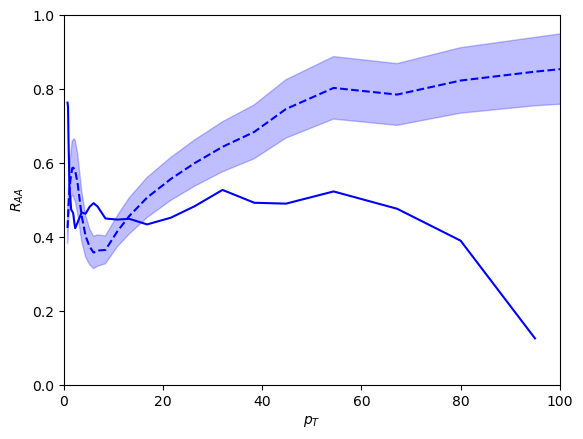

In [25]:
axis.set_xlim(0, 100)
fig

(0.0, 30.0)

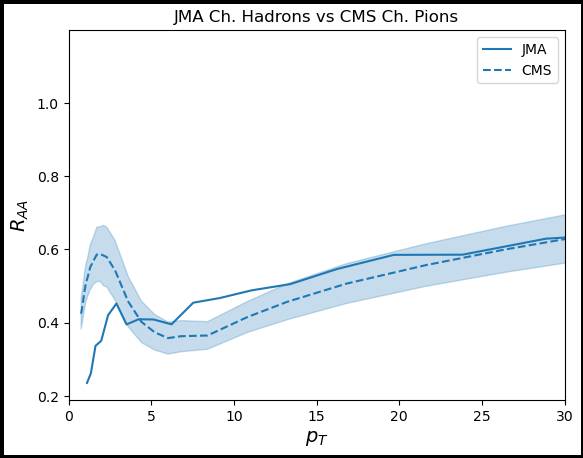

In [20]:
###############
# 30-50% R_AA #
###############

fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Pions')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()

# Make centrality cut
p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)
p_mask = p_mask & ((df['cent'] == '30-40') | (df['cent'] == '40-50'))

# Bin pions
pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pion_pt'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
#pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pion_pt_f'].to_numpy(), weights=10000*df[p_mask]['pA_weight'].to_numpy(), bins=pt_bins)

# Compute R_AA
pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

# Get CMS R_AA
CMS_df = CMS_30_50_data  # Select which CMS data table to use -- here we're selecting 30-50% centrality
CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()


# Plot
axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA', color=colors[i])
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS', linestyle='--', color=colors[i])
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
i += 1

axis.legend()
#axis.set_ylim(0, 7)
axis.set_xlim(0, 30)
#fig.savefig('raa_hadrons_g2.png')

(0.0, 30.0)

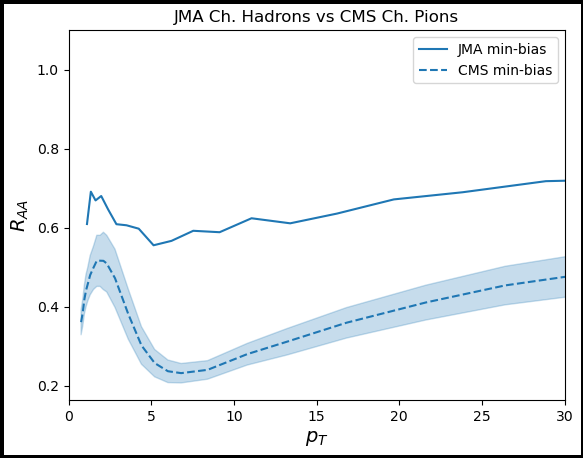

In [21]:
#####################
# Minimum bias R_AA #
#####################

fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Hadrons vs CMS Ch. Pions')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 25)
df = partons.dropna()

# Make centrality cut
p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)  & (df['fgqhat'] == False)

# Bin pions
pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pion_pt'].to_numpy(), weights=10000*df[p_mask]['weight'].to_numpy(), bins=pt_bins)
#pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pion_pt_f'].to_numpy(), weights=10000*df[p_mask]['pA_weight'].to_numpy(), bins=pt_bins)

# Compute R_AA
pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

# Get CMS R_AA
CMS_df = CMS_mb_data  # Select which CMS data table to use -- here we're selecting minimum bias: all centrality bins
CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()


# Plot
axis.plot(((pt_bins[0:-1] + pt_bins[1:])/2), pion_aa_pp, label='JMA min-bias', color=colors[i])
axis.plot(CMS_raa_pt_array, CMS_raa_RAA_array, label='CMS min-bias', linestyle='--', color=colors[i])
axis.fill_between(CMS_raa_pt_array, CMS_raa_RAA_array-CMS_raa_nerr_array, CMS_raa_RAA_array+CMS_raa_perr_array, color=colors[i], alpha=0.25)
i += 1

axis.legend()
#axis.set_ylim(0, 7)
axis.set_xlim(0, 30)
#fig.savefig('raa_hadrons_g2.png')

In [ ]:
# Import curve fit
#...

# Load CMS data
# The R_AA here is like the "y data" trying to be fit in your sine function example
# The pt axis here is like the "x data" from the example
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html
# https://www.geeksforgeeks.org/scipy-curve-fitting/

# Make RAA a callable function
def RAA(pt, Q, lam):
    pt_res = 1  # Whatever resolution you like...
    
    # First define R_pA for these parameters
    # Here we define the R_pA function like in Jo's example notebooks

    # Apply R_pA to dataset to get a new series of weights
    # e.g. partons['fit_weight'] = Rpa(pt, ncoll, Q, lam) sort of thing

    # Cut dataset for centrality and el & drift choices

    # Compute R_AA for this datapoint
    # 1. pp yield : find number of particles with 'pion_pt' in the pt bin, counting by 'weight'
    # 2. AA yield : find number of particles with 'pion_pt_f' in the pt bin, counting by 'fit_weight'
    # 3. take ratio : RAA = AA yield / pp yield   # Noting that ncoll is already embedded in the "pp yield" object

    # Return R_AA value


# Use scipy.optimize.curve_fit to optimize Q and Lambda
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.curve_fit.html
Q_guess = 1.5
lam_guess = 0.3*Q_guess
p0 = [Q_guess, lam_guess]  # Some guesses for the cnm parameters
optimal_values, pcov = sp.optimize.curve_fit(f=RAA, xdata=CMS_x_data, ydata=CMS_y_d aa, p0=guess, sigma=CMS_error)
print(optimal_values)
print(pcov)

In [26]:
len(partons['seed'].value_counts())

978

## $v_2$

### Partonic

In [13]:
partons['seed'].value_counts()

seed
5220017882036745    30800
2203518025324095    30800
431581865588526     30800
8936152676867551    30800
4319593371845006    30800
                    ...  
6654520430152706    30800
8986642478640970    30800
7874670207152041    30800
6990996548517664    30800
8709868607647276      716
Name: count, Length: 9517, dtype: Int64

<Axes: >

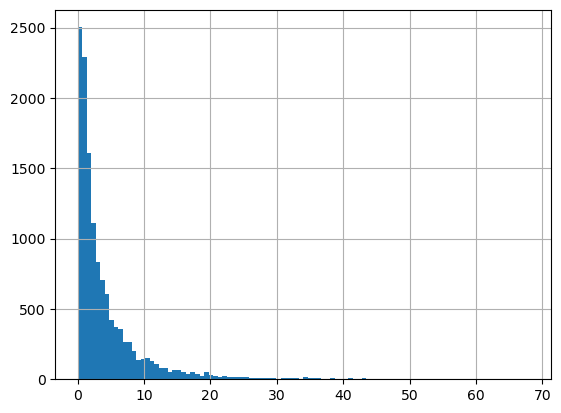

In [15]:
partons[(partons['seed'] == 5220017882036745) & (partons['cel'] == False) & (partons['drift'] == True)]['hadron_pt_f'].hist(bins=100)

<Axes: >

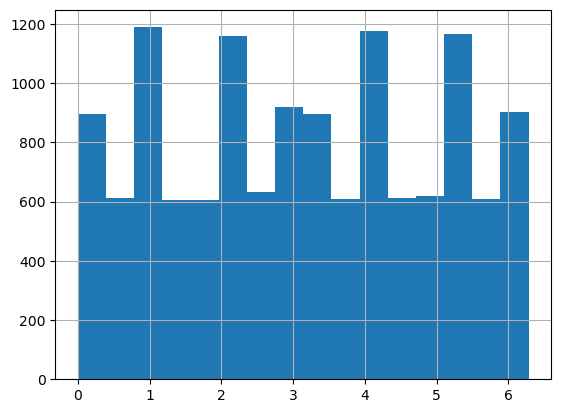

In [19]:
partons[(partons['seed'] == 5220017882036745) & (partons['cel'] == False) & (partons['drift'] == True)]['phi_f'].hist(bins=16)

##### Do we want to correct to event plane or reaction plane?

Computing harmonics for psi_en
Computing harmonics for psi_n


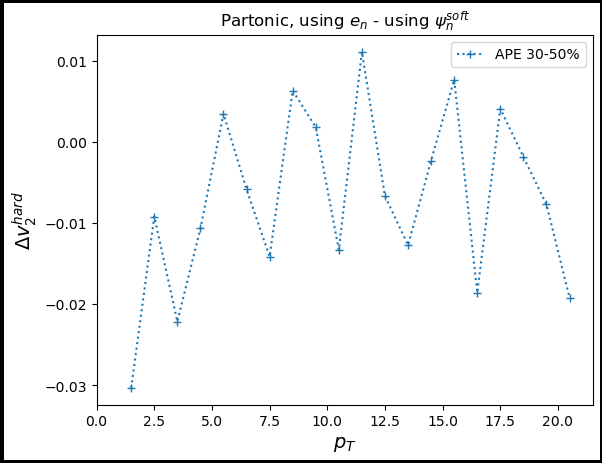

In [14]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
axis.set_title(r'Partonic, using $e_n$ - using $\psi_n^{soft}$')

n = 2
weight_choice = 'AA_weight'
CEL_option = False

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons  #.iloc[0:1000000]
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)



# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['30-50']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '0-20':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10') | (total['cent'] == '10-20')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['psi_en', 'psi_n']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            pt = pt_domain[i]
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'psi_en':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_e{}'.format(n)], 2*np.pi)
                p_mask = ((total['drift'] == True) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'psi_n':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
                p_mask = ((total['drift'] == True) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
                
            p_mask = p_mask & cent_mask

            # num = np.sum(np.mod(np.sin(n*total.loc[p_mask, 'fix_phi_f']) + np.pi, 2*np.pi))
            # den = np.sum(np.mod(np.cos(n*total.loc[p_mask, 'fix_phi_f']) + np.pi, 2*np.pi))
            
            # psi_n_hard = 0.5*np.arctan2(num, den)

            # Compute vn
            mean_harm = np.sum(np.cos( n * (total.loc[p_mask, 'fix_phi_f'])) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'psi_en':
            psi_en_arr = mean_harm_array
        elif case == 'psi_n':
            psi_n_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, psi_en_arr - psi_n_arr, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    #np.savez('partonic_v2_hard_{}_CEL{}_K{}.npz'.format(cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

This is kind of strange. Not really sure what to make of it. There appears to be some systematic modulation in pT. Maybe this is because drift v2 is maximized by using $\psi_n^{soft}$ over $e_n^{soft}$.

##### Compute v_n within one event, with $\psi_n^{hard}$ correction

In [33]:
0.3*len(event_list)

120.0

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
axis.set_title('Partonic')

n = 2
weight_choice = 'AA_weight'
CEL_option = False

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)

total = partons  #.iloc[0:1000000]

cent_bins = np.flip(np.array(['30-50']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '0-20':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10') | (total['cent'] == '10-20')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)

    # Find all the events in this centrality
    event_list = total[cent_mask]['seed'].value_counts().index
    mean_harm_array = np.array([[]])
    first = True
    print('Computing harmonics')
    for k in np.arange(120, len(event_list)):
        event = event_list[k]
        print(k/len(event_list))
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
        event_harm_array = np.array([])
        
        for i in np.arange(0, len(pt_domain)):
            pt = pt_domain[i]
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
        
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            k_f_drift = 1
            
            p_mask = ((total['seed'] == event) & (total['drift'] == True) & (total['cel'] == CEL_option) 
                      & (total[pt_series] > binmin) & (total[pt_series] < binmax) 
                      & (total['K_F_DRIFT'] == k_f_drift))
                
            p_mask = p_mask & cent_mask

            num = np.sum(np.mod(np.sin(n*total.loc[p_mask, 'phi_f']) + np.pi, 2*np.pi))
            den = np.sum(np.mod(np.cos(n*total.loc[p_mask, 'phi_f']) + np.pi, 2*np.pi))
            
            psi_n_hard = 0.5*np.arctan2(num, den)

            total['fix_phi_f'] = np.mod(total['phi_f'] - psi_n_hard, 2*np.pi)
            
            # Compute vn
            event_harm = np.sum(np.cos( n * (total.loc[p_mask, 'fix_phi_f'])) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            event_harm_array = np.append(event_harm_array, event_harm)

        if first:
            mean_harm_array = np.array([event_harm_array])
        else:
            mean_harm_array = np.concat((mean_harm_array, np.array([event_harm_array])), axis=0)
        first = False
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    plot_harm_array = np.mean(mean_harm_array, axis=0)
    axis.plot(pt_domain, plot_harm_array, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    #np.savez('partonic_v2_hard_{}_CEL{}_K{}.npz'.format(cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics
0.3
0.3025
0.305
0.3075
0.31
0.3125
0.315
0.3175
0.32
0.3225
0.325
0.3275
0.33
0.3325
0.335
0.3375
0.34
0.3425
0.345
0.3475
0.35
0.3525
0.355
0.3575
0.36
0.3625
0.365
0.3675
0.37
0.3725
0.375
0.3775
0.38
0.3825
0.385
0.3875
0.39
0.3925
0.395
0.3975
0.4
0.4025
0.405
0.4075
0.41
0.4125


In [29]:
first_mean_harm

array([[ 0.20904155,  0.11414472, -0.05742243, ..., -0.15895848,
         0.06844631, -0.02404851],
       [-0.01105268,  0.16343655, -0.20775604, ...,  0.06263929,
        -0.02410735,  0.26484214],
       [ 0.1527645 ,  0.05484087,  0.05769018, ..., -0.03733681,
         0.03678064, -0.04435564],
       ...,
       [ 0.14799294,  0.05745201, -0.06942978, ...,  0.15179871,
        -0.09641733, -0.10364613],
       [ 0.09349156,  0.08171264,  0.13210548, ...,  0.01058038,
        -0.33760141,  0.10674656],
       [ 0.00838282, -0.0922369 ,  0.16221992, ...,  0.12177099,
         0.0786791 , -0.08033634]])

In [31]:
second_mean_harm

array([[ 0.21729693, -0.00946576,  0.02570105, ...,  0.36698043,
        -0.23573552,  0.24127578],
       [ 0.14914787, -0.06350335,  0.09195097, ...,  0.01240872,
         0.11256916,  0.11669015],
       [ 0.11852138,  0.02653448, -0.06230332, ...,  0.02677132,
         0.00445782, -0.11632682],
       ...,
       [ 0.12908752, -0.07023301,  0.41442259, ..., -0.00464314,
        -0.13706226,  0.01706736],
       [-0.05256428,  0.06191835,  0.27410193, ..., -0.22145686,
         0.23335144, -0.01268657],
       [ 0.0114755 ,  0.18029863, -0.13126014, ..., -0.26955534,
         0.01275725, -0.48037164]])

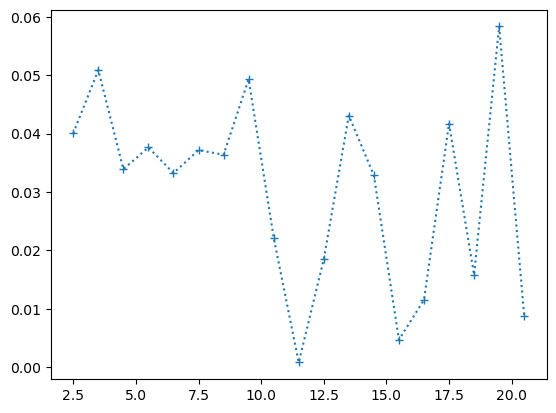

In [32]:
plot_harm_array = np.mean(np.concat((first_mean_harm, second_mean_harm), axis=0), axis=0)
plt.plot(pt_domain, plot_harm_array, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])

In [19]:
np.array([np.array([5,23,4])])

array([[ 5, 23,  4]])

In [20]:
new = np.concat((np.array([[1,6,2], [48,23,1]]), np.array([np.array([5,23,4])])), axis=0)
print(new)
np.mean(new, axis=0)

[[ 1  6  2]
 [48 23  1]
 [ 5 23  4]]


array([18.        , 17.33333333,  2.33333333])

##### $\Delta v_2$

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift) 1.25


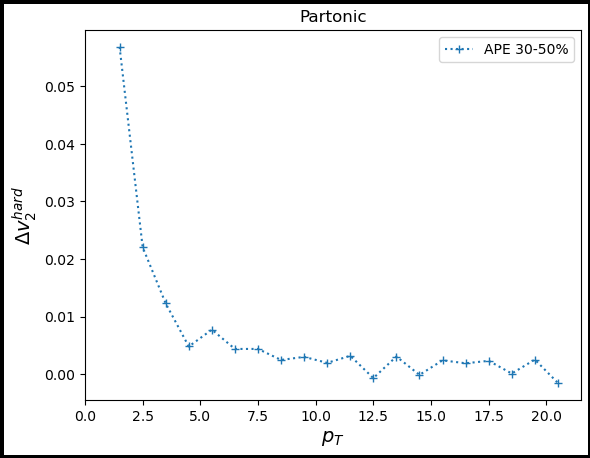

In [48]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
axis.set_title('Partonic')

n = 2
weight_choice = 'AA_weight'
CEL_option = True

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.iloc[0:1000000]
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
#total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_e{}'.format(n)], 2*np.pi)


# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['30-50']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '0-20':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10') | (total['cent'] == '10-20')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift) 1.25']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 0.75':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0.75
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 1.25':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1.25
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask

            # num = np.sum(np.mod(np.sin(n*total.loc[p_mask, 'fix_phi_f']) + np.pi, 2*np.pi))
            # den = np.sum(np.mod(np.cos(n*total.loc[p_mask, 'fix_phi_f']) + np.pi, 2*np.pi))
            
            # psi_n_hard = 0.5*np.arctan2(num, den)
            
            if case != 'pA':
                comp_harm_p = np.sum(np.cos( n * (total.loc[p_mask, 'fix_phi_f'])) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = 0 #np.sum(np.exp(-1j * n * (total.loc[p_mask, 'fix_phi_f'])) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, drift_arr - el_arr, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    #np.savez('partonic_v2_hard_{}_CEL{}_K{}.npz'.format(cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

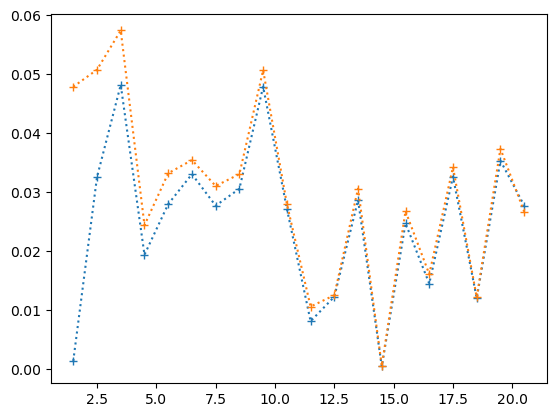

In [47]:
plt.plot(pt_domain, el_arr, label='APE '+ cent + '%', linestyle=':', marker='+')
plt.plot(pt_domain, drift_arr, label='APE '+ cent + '%', linestyle=':', marker='+')

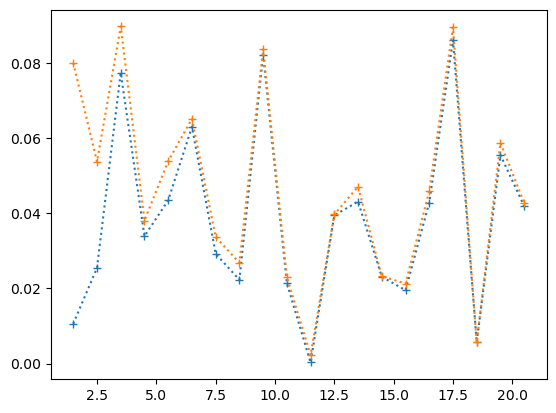

In [44]:
plt.plot(pt_domain, el_arr, label='APE '+ cent + '%', linestyle=':', marker='+')
plt.plot(pt_domain, drift_arr, label='APE '+ cent + '%', linestyle=':', marker='+')

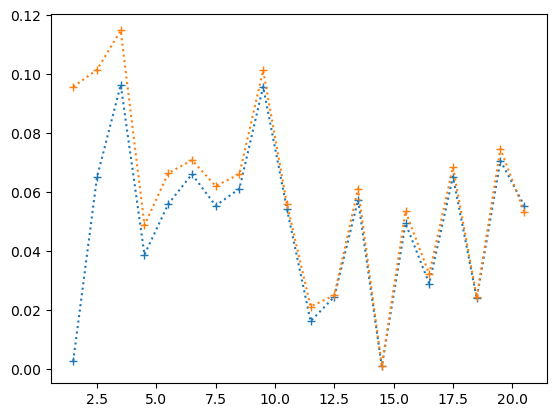

In [42]:
plt.plot(pt_domain, el_arr, label='APE '+ cent + '%', linestyle=':', marker='+')
plt.plot(pt_domain, drift_arr, label='APE '+ cent + '%', linestyle=':', marker='+')

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbP

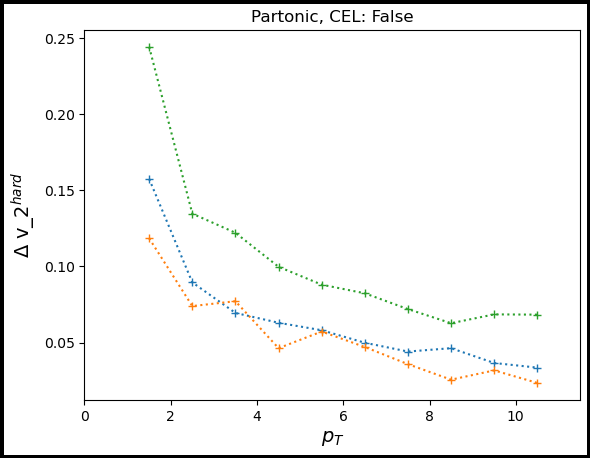

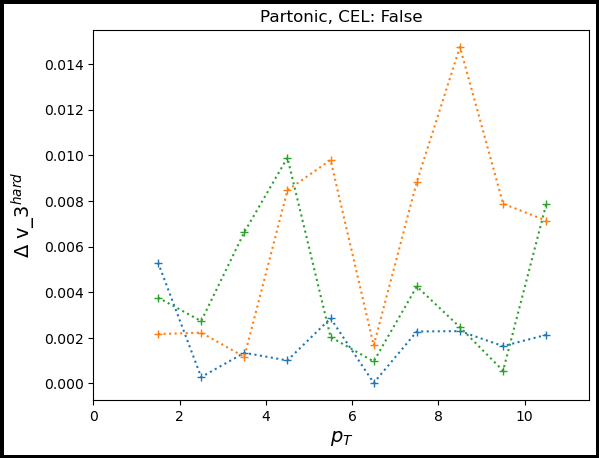

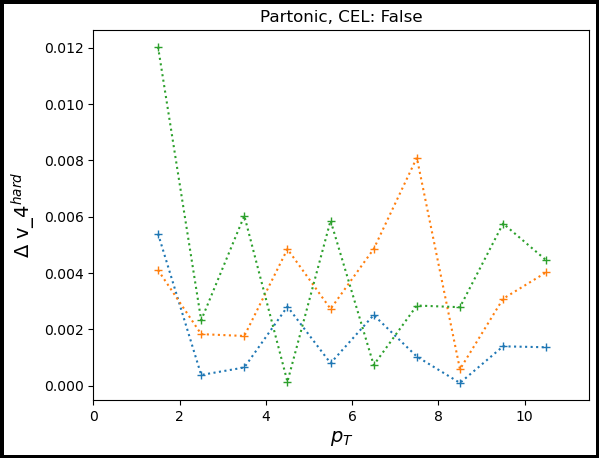

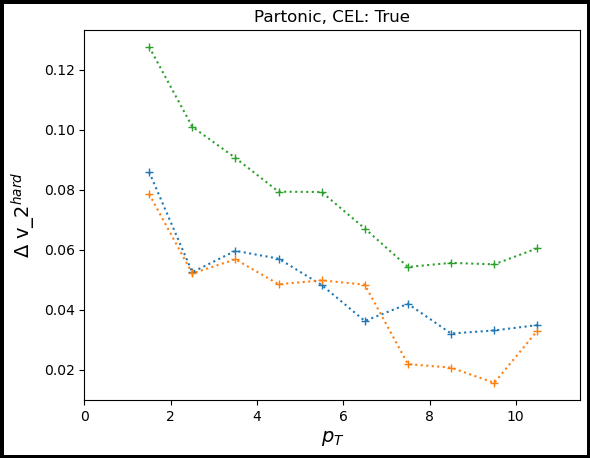

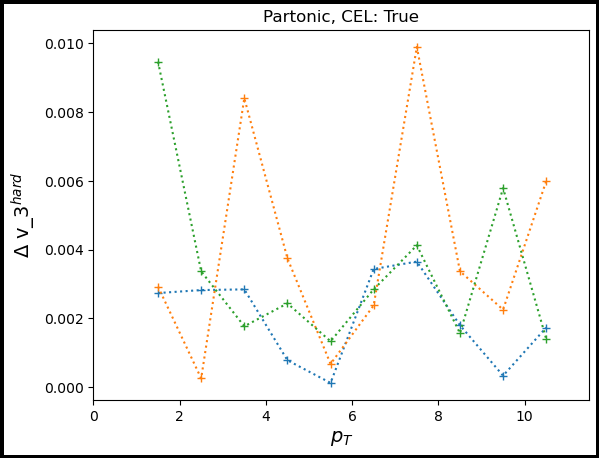

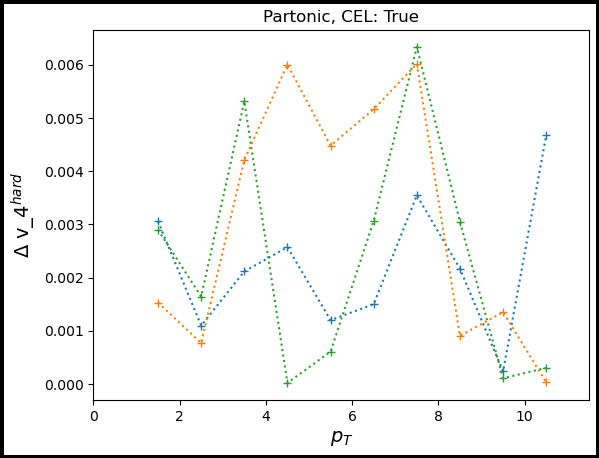

In [25]:


colors = plt.rcParams['axes.prop_cycle'].by_key()['color']


#total = partons.dropna()
#df = partons

for CEL_option in [False, True]:
    for n in [2, 3, 4]:
        j = 0
        
        #total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
        total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
        weight_choice = 'AA_weight'
        
        
        
        fig, axis = plt.subplots(edgecolor='black', linewidth=5)
        axis.set_title('Partonic, CEL: {}'.format(CEL_option))
        axis.set_xlabel(r'$p_T$', fontsize=14)
        axis.set_ylabel(r'$\Delta$ v_'+ str(n) + r'$^{hard}$', fontsize=14)
        
        # Make centrality cut
        #p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)
        
        # # Bin pions
        # pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
        # #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        # pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)
        
        # # Compute R_AA
        # pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
        # cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
        #                       '30-40', '20-30', '10-20', '5-10', '0-5'])
        
        cent_bins = np.flip(np.array(['30-50', '0-20', '50-70']))
        
        for cent in cent_bins:
            if cent == '0-5':
                cent_mask = (total['cent'] == '0-5')
            elif cent == '0-10':
                cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
            elif cent == '0-20':
                cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10') | (total['cent'] == '10-20')
            elif cent == '30-50':
                cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
            elif cent == '50-70':
                cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')
        
            # # Get ALICE R_AA
            # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
            # alice_v2_val_array = CMS_v2['v2'].to_numpy()
            # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
            # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
            # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
            # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
            
            # Plot
            #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
            # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
            # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
            #j += 1
            
            # Create pt bins
            pt_res = 1
            num_pt_points = 10
            pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
            
            # Create phi bins
            
            axis.set_xlim(0, pt_domain[-1]+pt_res)
            
            for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift) 0.75', 'PbPb (EL + Drift) 1.25']):
                # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
                # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
                # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
                
            
            
                
                mean_harm_array = np.array([])
                print('Computing harmonics for {}'.format(case))
                
                for i in np.arange(0, len(pt_domain)):
                    # pt = alice_pbpb_pt_array[i]
                    # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
                    pt = pt_domain[i]
                    # Determine current p_T bin bounds
                    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
                    # Probably not good
                    binmin = pt - (pt_res/2)
                    binmax = pt + (pt_res/2)
                    
            
                    if case == 'PbPb (EL)':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 0
                        p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
                    
                    elif case == 'PbPb (EL + Drift)':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 1
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
        
                    elif case == 'PbPb (EL + Drift) 0.75':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 0.75
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
        
                    elif case == 'PbPb (EL + Drift) 1.25':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 1.25
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
            
                    # #p_mask = p_mask & (total['jetNo'] == 1)
                    # angles_run = 11
                    
                    p_mask = p_mask & cent_mask
                    
                    if case != 'pA':
                        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            
                    else:
                        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            
                    # Get bin centers
                    #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
                    
                    # # Do v0        
                    # # Compute complex harmonic for each jet
                    # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
                    # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
                    # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
            
                    
                    # # Get real and imaginary parts
                    # real_harm_array_0 = np.real(comp_harm_array_0)
                    # imag_harm_array_0 = np.imag(comp_harm_array_0)
                    
                    # # sum real and imaginary parts separately
                    # mean_real_harm_0 = np.sum(real_harm_array_0)
                    # mean_imag_harm_0 = np.sum(imag_harm_array_0)
            
                    # # Compute magnitude
                    # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
            
            
                    # Do vn
                    # Compute complex harmonic for each jet
                    comp_harm = comp_harm_p + comp_harm_n
            
                    
                    # Get real and imaginary parts
                    real_harm = np.real(comp_harm)
                    imag_harm = np.imag(comp_harm)
                
                    # Compute magnitude
                    mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
            
                    mean_harm_array = np.append(mean_harm_array, mean_harm)
        
                if case == 'PbPb (EL)':
                    el_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift)':
                    drift_100_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift) 0.75':
                    drift_075_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift) 1.25':
                    drift_125_arr = mean_harm_array
            # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
            axis.plot(pt_domain, mean_harm_array, label='APE '+ cent + '% ' + case, linestyle=':', marker='+', color=colors[j])
            j += 1
            np.savez('partonic_v{}_hard_{}_CEL{}.npz'.format(n, cent, CEL_option), pt=pt_domain, el_vn=el_arr, drift_100_vn=drift_100_arr,
                    drift_075_vn=drift_075_arr, drift_125_vn=drift_125_arr)
        #xis.legend()
        #fig.savefig('v2_hadrons_g2.png')

In [ ]:


colors = plt.rcParams['axes.prop_cycle'].by_key()['color']


#total = partons.dropna()
#df = partons

for CEL_option in [False, True]:
    for n in [3, 4]:
        j = 0
        
        #total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
        total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
        weight_choice = 'AA_weight'
        
        
        
        fig, axis = plt.subplots(edgecolor='black', linewidth=5)
        axis.set_title('Partonic, CEL: {}'.format(CEL_option))
        axis.set_xlabel(r'$p_T$', fontsize=14)
        axis.set_ylabel(r'$\Delta$ v_'+ str(n) + r'$^{hard}$', fontsize=14)
        
        # Make centrality cut
        #p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)
        
        # # Bin pions
        # pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
        # #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
        # pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)
        
        # # Compute R_AA
        # pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
        # cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
        #                       '30-40', '20-30', '10-20', '5-10', '0-5'])
        
        cent_bins = np.flip(np.array(['30-50', '0-20', '50-70']))
        
        for cent in cent_bins:
            if cent == '0-5':
                cent_mask = (total['cent'] == '0-5')
            elif cent == '0-10':
                cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
            elif cent == '0-20':
                cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10') | (total['cent'] == '10-20')
            elif cent == '30-50':
                cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
            elif cent == '50-70':
                cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')
        
            # # Get ALICE R_AA
            # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
            # alice_v2_val_array = CMS_v2['v2'].to_numpy()
            # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
            # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
            # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
            # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
            
            # Plot
            #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
            # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
            # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
            #j += 1
            
            # Create pt bins
            pt_res = 1
            num_pt_points = 10
            pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
            
            # Create phi bins
            
            axis.set_xlim(0, pt_domain[-1]+pt_res)
            
            for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift) 0.75', 'PbPb (EL + Drift) 1.25']):
                # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
                # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
                # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
                
            
            
                
                mean_harm_array = np.array([])
                print('Computing harmonics for {}'.format(case))
                
                for i in np.arange(0, len(pt_domain)):
                    # pt = alice_pbpb_pt_array[i]
                    # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
                    pt = pt_domain[i]
                    # Determine current p_T bin bounds
                    # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
                    # Probably not good
                    binmin = pt - (pt_res/2)
                    binmax = pt + (pt_res/2)
                    
            
                    if case == 'PbPb (EL)':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 0
                        p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
                    
                    elif case == 'PbPb (EL + Drift)':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 1
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
        
                    elif case == 'PbPb (EL + Drift) 0.75':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 0.75
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
        
                    elif case == 'PbPb (EL + Drift) 1.25':
                        phi_series = 'phi_f'
                        pt_series = 'pt_f'
                        k_f_drift = 1.25
                        p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                                  & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
            
                    # #p_mask = p_mask & (total['jetNo'] == 1)
                    # angles_run = 11
                    
                    p_mask = p_mask & cent_mask
                    
                    if case != 'pA':
                        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            
                    else:
                        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            
                    # Get bin centers
                    #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
                    
                    # # Do v0        
                    # # Compute complex harmonic for each jet
                    # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
                    # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
                    # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
            
                    
                    # # Get real and imaginary parts
                    # real_harm_array_0 = np.real(comp_harm_array_0)
                    # imag_harm_array_0 = np.imag(comp_harm_array_0)
                    
                    # # sum real and imaginary parts separately
                    # mean_real_harm_0 = np.sum(real_harm_array_0)
                    # mean_imag_harm_0 = np.sum(imag_harm_array_0)
            
                    # # Compute magnitude
                    # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
            
            
                    # Do vn
                    # Compute complex harmonic for each jet
                    comp_harm = comp_harm_p + comp_harm_n
            
                    
                    # Get real and imaginary parts
                    real_harm = np.real(comp_harm)
                    imag_harm = np.imag(comp_harm)
                
                    # Compute magnitude
                    mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
            
                    mean_harm_array = np.append(mean_harm_array, mean_harm)
        
                if case == 'PbPb (EL)':
                    el_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift)':
                    drift_100_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift) 0.75':
                    drift_075_arr = mean_harm_array
                elif case == 'PbPb (EL + Drift) 1.25':
                    drift_125_arr = mean_harm_array
            # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
            axis.plot(pt_domain, mean_harm_array, label='APE '+ cent + '% ' + case, linestyle=':', marker='+', color=colors[j])
            j += 1
            np.savez('partonic_v{}_hard_psi2planed_{}_CEL{}.npz'.format(n, cent, CEL_option), pt=pt_domain, el_vn=el_arr, drift_100_vn=drift_100_arr,
                    drift_075_vn=drift_075_arr, drift_125_vn=drift_125_arr)
        #xis.legend()
        #fig.savefig('v2_hadrons_g2.png')

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift) 0.75
Computing harmonics for PbPb (EL + Drift) 1.25
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)


In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)

axis.set_title('Partonic')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

#total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
n = 4
weight_choice = 'AA_weight'
CEL_option = False

axis.set_ylabel(r'$\Delta v_'+ n +'^{hard}$', fontsize=14)

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['50-70', '30-50', '0-5']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift) 0.75', 'PbPb (EL + Drift) 1.25']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 0.75':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0.75
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 1.25':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1.25
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
            if case != 'pA':
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, drift_arr - el_arr, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    np.savez('partonic_v{}_hard_{}_CEL{}_K{}.npz'.format(n, cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)

axis.set_title('Partonic')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
n = 3
weight_choice = 'AA_weight'
CEL_option = True

axis.set_ylabel(r'$\Delta v_'+ n +'^{hard}$', fontsize=14)

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['50-70', '30-50', '0-5']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift) 0.75', 'PbPb (EL + Drift) 1.25']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 0.75':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0.75
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 1.25':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1.25
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
            if case != 'pA':
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, drift_arr - el_arr, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    np.savez('partonic_v{}_hard_{}_CEL{}_K{}.npz'.format(n, cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)

axis.set_title('Partonic')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_{}'.format(n)], 2*np.pi)
n = 4
weight_choice = 'AA_weight'
CEL_option = True

axis.set_ylabel(r'$\Delta v_'+ n +'^{hard}$', fontsize=14)

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['50-70', '30-50', '0-5']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift) 0.75', 'PbPb (EL + Drift) 1.25']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 0.75':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 0.75
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))

            elif case == 'PbPb (EL + Drift) 1.25':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                k_f_drift = 1.25
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == CEL_option) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax) & (total['K_F_DRIFT'] == k_f_drift))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
            if case != 'pA':
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, drift_arr - el_arr, label='APE '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    np.savez('partonic_v{}_hard_{}_CEL{}_K{}.npz'.format(n, cent, CEL_option, k_f_drift), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)


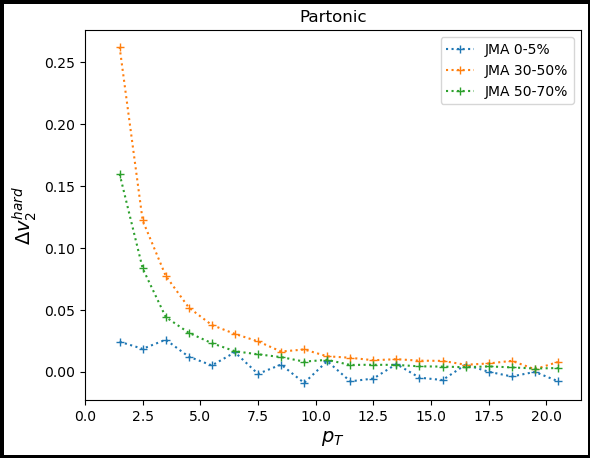

In [23]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
axis.set_title('Partonic')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'weight'

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['50-70', '30-50', '0-5']))

for cent in cent_bins:
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    # Create pt bins
    pt_res = 1
    num_pt_points = 20
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'phi_f'
                pt_series = 'pt_f'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
                
            elif case == 'pA':
                phi_series = 'phi_0'
                pt_series = 'pt_0'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
            if case != 'pA':
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    # axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    axis.plot(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', color=colors[j])
    j += 1
    #np.savez('partonic_v2_hard_{}.npz'.format(cent), pt=pt_domain, dv2=drift_arr - el_arr, el_v2=el_arr, drift_v2=drift_arr)
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

In [13]:
np.abs(comp_harm_p) + np.abs(comp_harm_n)

0.1829085127608536

In [14]:
np.abs(comp_harm_p + comp_harm_n)

0.16192873498110047

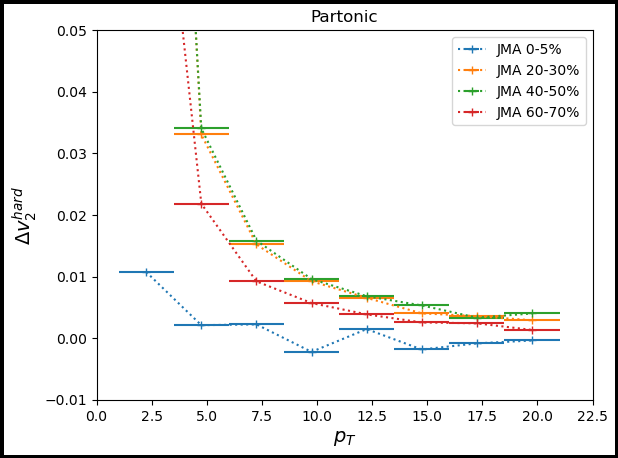

In [23]:
axis.set_xlim(0, 22.5)
axis.set_ylim(-0.01, 0.05)
fig

#### $v_2^{exp}$

WRONG $v_2^{exp} = \langle v_2^{soft} v_2^{hard} \rangle / \sqrt{\langle (v_2^{soft})^2 \rangle}$

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)


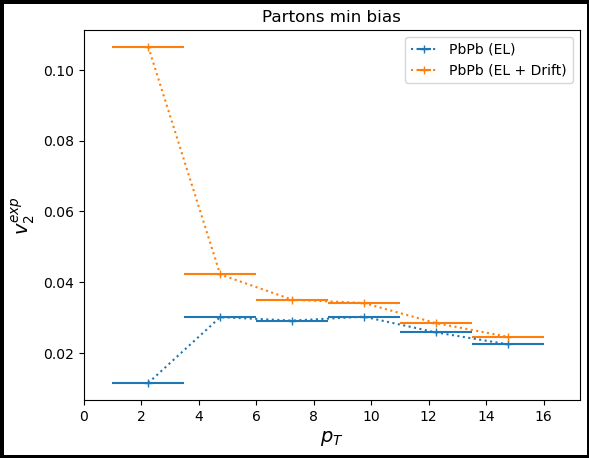

In [22]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{exp}$', fontsize=14)
axis.set_title('Partons min bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

weight_choice = 'weight'
vn_choice = 'v_2'
#pp_weight_choise = 'weight'

# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False) 
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False) 


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
        # angles_run = 11
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        # p_mask = p_mask & (total['jetNo'] == 0)
        # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
        
        
        comp_harm_p = (np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]
                             * total.loc[p_mask, vn_choice]) 
                       / (np.sum(total.loc[p_mask, weight_choice])
                          * np.sqrt(np.average(total.loc[p_mask, vn_choice]**2, weights=total.loc[p_mask, weight_choice]))))
        comp_harm_n = (np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]
                             * total.loc[p_mask, vn_choice]) 
                       / (np.sum(total.loc[p_mask, weight_choice]) 
                          * np.sqrt(np.average(total.loc[p_mask, vn_choice]**2, weights=total.loc[p_mask, weight_choice]))))

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

$v_2^{exp} = \langle v_2^{soft} v_2^{hard} \cos(2 (\psi_2^{soft} - \psi_2^{hard}))\rangle / \sqrt{\langle (v_2^{soft})^2 \rangle}$

###### Here we need to compute the v_2^{hard} for each event, then average over events... Very annoying.

In [9]:
partons['seed'].value_counts().index

Index([  94227120240565, 7235947185394863, 5907008033153662, 1988616146515945,
        370060034787935,  222907239661079, 3157320992852912,  329942885764160,
       9526878992776204, 1371091692886764,
       ...
        624016499867808, 9783181320250668, 8628043726798192, 5792843747957648,
        490070540775792, 2311497914290410, 8628625038839534, 2902241119927315,
       1826929190819820, 1425056936934352],
      dtype='Int64', length=2500)

In [10]:
partons[partons['seed'] == 9526878992776204]['v_2']

0    0.127597
0    0.127597
0    0.127597
0    0.127597
0    0.127597
       ...   
0    0.127597
0    0.127597
0    0.127597
0    0.127597
0    0.127597
Name: v_2, Length: 8800, dtype: Float64

Computing harmonics for PbPb (EL)


KeyboardInterrupt: 

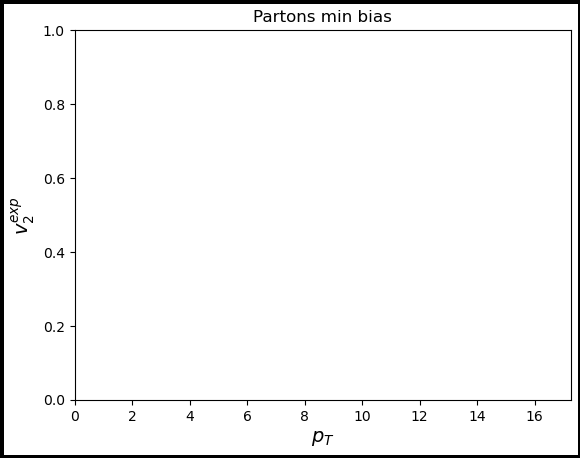

In [11]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{exp}$', fontsize=14)
axis.set_title('Partons min bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

weight_choice = 'weight'
vn_choice = 'v_2'
psin_choice = 'psi_2'
#pp_weight_choise = 'weight'

# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False) 
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False) 
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False) 


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
        # angles_run = 11
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        # p_mask = p_mask & (total['jetNo'] == 0)
        # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))

        # Compute v_n^{hard}, psi_n^{hard}, and get v_n^{soft} and psi_n^{soft} for each event, and add them to arrays.
        seed_list = total.loc[p_mask, 'seed'].value_counts().index
        v_n_soft_array = np.array([])
        psi_n_soft_array = np.array([])
        v_n_hard_array = np.array([])
        psi_n_hard_array = np.array([])
        for seed in seed_list:
            seed_mask = p_mask & (total['seed'] == seed)

            # Get soft values -- always the same for all entries in the event
            v_n_soft = total.loc[seed_mask, vn_choice].to_numpy()[0]
            psi_n_soft = total.loc[seed_mask, psin_choice].to_numpy()[0]

            # Get hard values
            comp_harm = np.sum((np.exp(1j * n * total.loc[p_mask, phi_series]) + np.exp(-1j * n * total.loc[p_mask, phi_series])) * total.loc[p_mask, weight_choice]
                             * total.loc[p_mask, vn_choice]) / (np.sum(total.loc[p_mask, weight_choice]))
            v_n_hard = np.abs(comp_harm)
            psi_n_hard = np.angle(comp_harm)

            # Populate arrays
            v_n_soft_array = np.append(v_n_soft_array, v_n_soft)
            psi_n_soft_array = np.append(psi_n_soft_array, psi_n_soft)
            v_n_hard_array = np.append(v_n_hard_array, v_n_hard)
            psi_n_hard_array = np.append(psi_n_hard_array, psi_n_hard)
        
    
        # Compute magnitude
        num_avg = np.nanmean(v_n_hard_array * v_n_soft_array * np.cos(n * (psi_n_soft_array - psi_n_hard_array)))
        rms_v_n_soft = np.nanmean(np.sqrt(v_n_soft_array**2))
        
        mean_harm = num_avg / rms_v_n_soft

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

#### Minimum Bias

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + CEL + Drift)


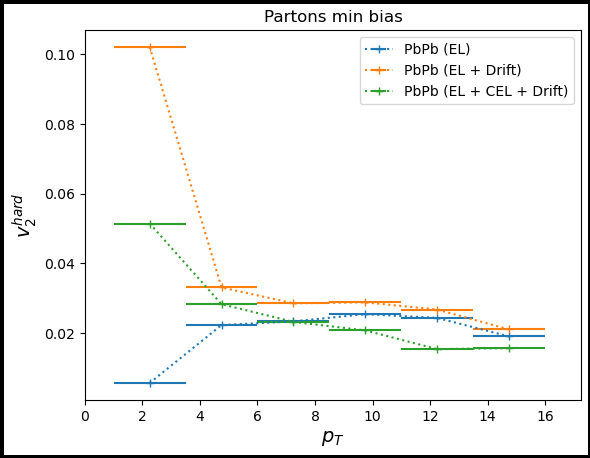

In [23]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Partons min bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

weight_choice = 'weight'
#pp_weight_choise = 'weight'

# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + CEL + Drift)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False)

        elif case == 'PbPb (EL + CEL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == True)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False) & (total['cel'] == False)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False) & (total['cel'] == False)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
        # angles_run = 11
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        # p_mask = p_mask & (total['jetNo'] == 0)
        # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
        
        
        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

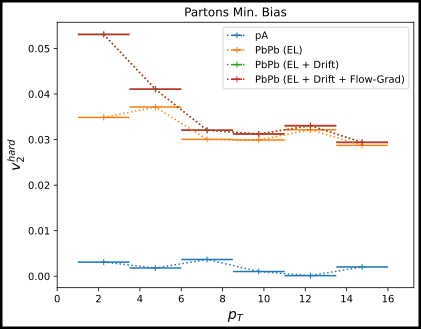

In [105]:
axis.set_title('Partons Min. Bias')
fig

In [ ]:
##############################
# Jack-Knife Resampling Test #
##############################





# Compute v_2 with error estimation

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('JK - Partons min bias g=2.13, df_b')


# Shuffle dataframe & compute new series
print('Shuffling Dataframe')
total_all = partons.sample(frac=1).reset_index(drop=True)
total_all['fix_phi_0'] = np.mod(total_all['phi_0'] - total_all['psi_2'], 2*np.pi)
total_all['fix_phi_f'] = np.mod(total_all['phi_f'] - total_all['psi_2'], 2*np.pi)
n = 2

# Find 1/num_replicas fractional length of dataframe - this will be the size of each replica
# We lose order num_replicas data lines using this method.
num_replicas = 20
r_length = int(len(total_all)/num_replicas)
# rng = np.random.default_rng()
# process_list = total_all['process'].value_counts().index.to_numpy().astype(int)

# Create pt bins
pt_res = 5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)']):  #['pA']:
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    harm_error_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)

        replica_harms = np.array([])
        for k in np.arange(0, num_replicas):

            
            # hard_processes = rng.choice(process_list, int(len(process_list)/num_replicas))
            # total = total_all[total_all['process'].isin(hard_processes)]
            
            #total = total_all.iloc[k*r_length:(k+1)*r_length]
            
            #total = total_all.sample(frac=1/num_replicas)

            # Jack-knife
            inv_mask = total_all.index.isin(np.arange(k*r_length, (k+1)*r_length))
            total = total_all[~inv_mask]
            
    
            if case == 'PbPb (EL)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'weight'
                case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False)
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False)
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['cel'] == False)
                
            
    
    
            p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
            # angles_run = 11
            # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
            #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
            # p_mask = p_mask & (total['jetNo'] == 0)
            # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
            
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            r_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
            replica_harms = np.append(replica_harms, r_harm)

        # Compute datapoint & error estimate
        mean_harm = np.mean(replica_harms)
        harm_error = 2*np.std(replica_harms)  # Twice the standard deviation between replicas
        mean_harm_array = np.append(mean_harm_array, mean_harm)
        harm_error_array = np.append(harm_error_array, harm_error)
    
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='x', ms=10, yerr=harm_error_array, capsize=20)#, xerr=(pt_res/2)
axis.legend()
#fig.savefig('v2_partons_g2.png')

Shuffling Dataframe


In [13]:
len(partons)

40757034

#### 40-50%

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


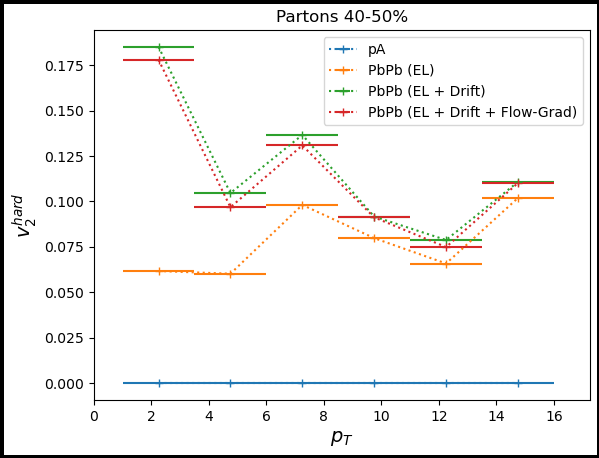

In [31]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)


cent_choice = '40-50'
axis.set_title('Partons {}%'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2



# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)            
        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        
        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

#### 20-30%

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


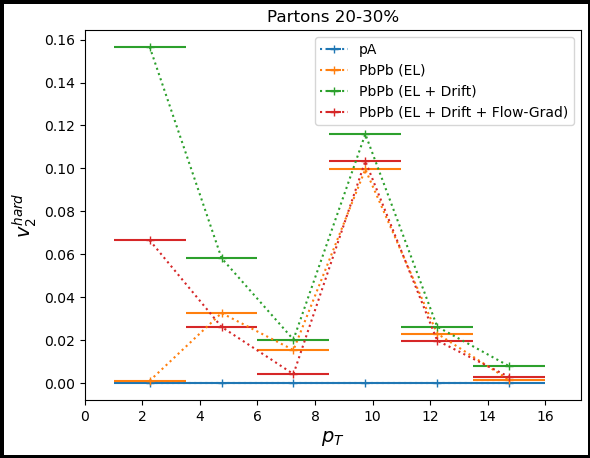

In [27]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)


cent_choice = '20-30'
axis.set_title('Partons {}%'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2



# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['fgqhat'] == False)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['fgqhat'] == False)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)            
        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        
        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

#### Drift Enhancement vs centrality

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


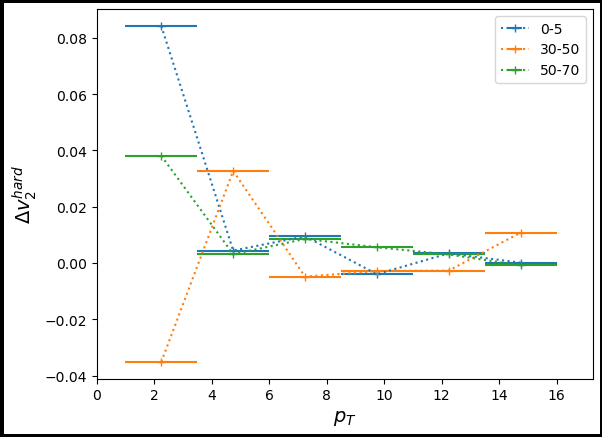

In [55]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

for cent_choice in ['0-5', '30-50', '50-70']:
    
    #axis.set_title('Partons {}%'.format(cent_choice))

    if cent_choice == '0-5':
        cent_mask = (total['cent'] == cent)
    elif cent_choice == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent_choice == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')
    
    
    

    
    
    
    # Create pt bins
    pt_res = 2.5
    num_pt_points = int(15/pt_res)
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift + Flow-Grad)']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'fix_phi_f'
                pt_series = 'pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pA':
                phi_series = 'fix_phi_0'
                pt_series = 'pt'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pp':
                phi_series = 'fix_phi_0'
                pt_series = 'pt'
                weight_choice = 'weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
    
    
            p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)            
            p_mask = p_mask & cent_mask
            #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
            
            try:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            except:
                comp_harm_p 
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

            mean_harm_array = np.append(mean_harm_array, mean_harm)

            if case == 'PbPb (EL)':
                el_arr = mean_harm_array
            else:
                drift_arr = mean_harm_array
    axis.errorbar(pt_domain, drift_arr - el_arr, label=cent_choice, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

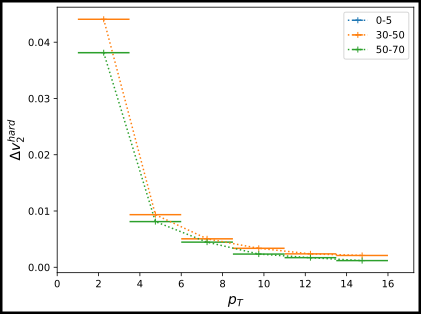

In [108]:
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
fig

### Hadronic

No handles with labels found to put in legend.


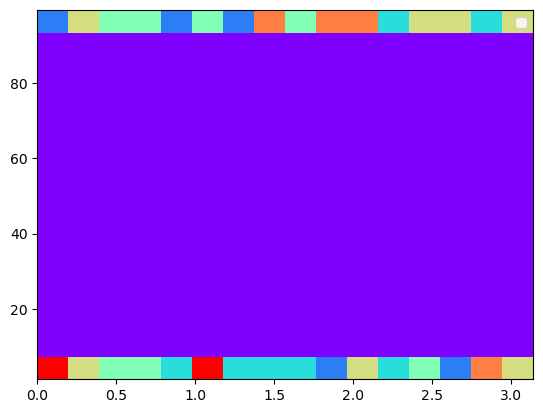

In [112]:
pts = np.random.uniform(1, 100, 100)
phis = np.append(np.full(50, 0), np.full(50, np.pi))
H, xedges, yedges = np.histogram2d(phis, pts, bins=16)

X, Y = np.meshgrid(xedges, yedges)
plt.pcolormesh(xedges, yedges, H, cmap='rainbow')
plt.legend()

In [72]:
CMS_pt_bins[0:31]

array([  0.7,   0.8,   0.9,   1. ,   1.1,   1.2,   1.4,   1.6,   1.8,
         2. ,   2.2,   2.4,   3.2,   4. ,   4.8,   5.6,   6.4,   7.2,
         9.6,  12. ,  14.4,  19.2,  24. ,  28.8,  35.2,  41.6,  48. ,
        60.8,  73.6,  86.4, 103.6])

Analyzing PID: 21
pT = 1.5 GeV
pT = 2.5 GeV
pT = 3.5 GeV
pT = 4.5 GeV
pT = 5.5 GeV
pT = 6.5 GeV
pT = 7.5 GeV
pT = 8.5 GeV
pT = 9.5 GeV
pT = 10.5 GeV
pT = 11.5 GeV
pT = 12.5 GeV
pT = 13.5 GeV
pT = 14.5 GeV
pT = 15.5 GeV
pT = 16.5 GeV
pT = 17.5 GeV
pT = 18.5 GeV
pT = 19.5 GeV
pT = 20.5 GeV
pT = 21.5 GeV
pT = 22.5 GeV
pT = 23.5 GeV
pT = 24.5 GeV
pT = 25.5 GeV
pT = 26.5 GeV
pT = 27.5 GeV
pT = 28.5 GeV
pT = 29.5 GeV
pT = 30.5 GeV
pT = 31.5 GeV
pT = 32.5 GeV
pT = 33.5 GeV
pT = 34.5 GeV
pT = 35.5 GeV
pT = 36.5 GeV
pT = 37.5 GeV
pT = 38.5 GeV
pT = 39.5 GeV
pT = 40.5 GeV
pT = 41.5 GeV
pT = 42.5 GeV
pT = 43.5 GeV
pT = 44.5 GeV
pT = 45.5 GeV
pT = 46.5 GeV
pT = 47.5 GeV
pT = 48.5 GeV
pT = 49.5 GeV
pT = 50.5 GeV
pT = 51.5 GeV
pT = 52.5 GeV
pT = 53.5 GeV
pT = 54.5 GeV
pT = 55.5 GeV
pT = 56.5 GeV
pT = 57.5 GeV
pT = 58.5 GeV
pT = 59.5 GeV
pT = 60.5 GeV
pT = 61.5 GeV
pT = 62.5 GeV
pT = 63.5 GeV
pT = 64.5 GeV
pT = 65.5 GeV
pT = 66.5 GeV
pT = 67.5 GeV
pT = 68.5 GeV
pT = 69.5 GeV
pT = 70.5 GeV
pT = 71.5 G

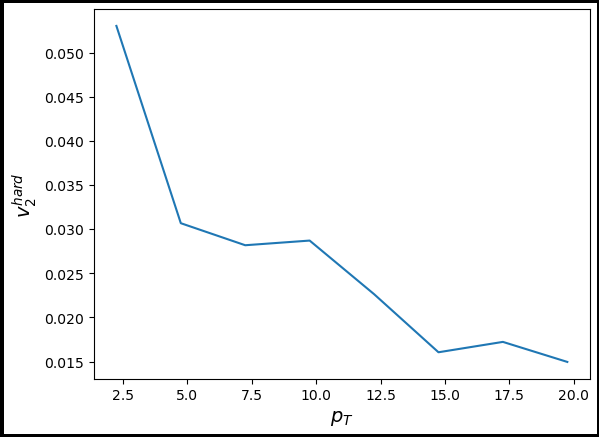

In [78]:
# Selections
z_xr = xr.open_dataarray('/fs1/project/sievert_nt/jma_data/raa-v2/z_JAM20-SIDIS_FF_hadron_nlo.nc')
num_frags = 10
df = partons
df['fix_phi_0'] = np.mod(df['phi_0'] - df['psi_2'], 2*np.pi)
df['fix_phi_f'] = np.mod(df['phi_f'] - df['psi_2'], 2*np.pi)


pt_series = 'pt_f'
phi_series = 'fix_phi_f'
weight_series = 'weight'
v2_pt_res = 2.5
v2_num_pt_points = 8
v2_pt_domain = np.array([1+((point+0.5)*v2_pt_res) for point in np.arange(0, v2_num_pt_points)])
v2_array = np.zeros_like(v2_pt_domain, dtype=type(1+1j))
v2_weight_array = np.zeros_like(v2_pt_domain)

# Make centrality cut
cent = '30-50'
cent_mask = ((df['cent'] == '30-40') | (df['cent'] == '40-50'))

# Load proper CMS data
if cent == '0-5':
    CMS_df = CMS_0_5_data
elif cent == '30-50':
    CMS_df = CMS_30_50_data
elif cent == '50-70':
    CMS_df = CMS_50_70_data

CMS_raa_perr_array = np.sqrt(CMS_df['stat+']**2 + CMS_df['syst+']**2 + CMS_df["sys,TAA +"]**2 + CMS_df["sys,lumi +"]**2).to_numpy()
CMS_raa_nerr_array = np.sqrt(CMS_df['stat-']**2 + CMS_df['syst-']**2 + CMS_df["sys,TAA -"]**2 + CMS_df["sys,lumi -"]**2).to_numpy()
CMS_raa_pt_array = CMS_df['pt'].to_numpy()
CMS_raa_RAA_array = CMS_df['RAA'].to_numpy()
CMS_pt_bins = np.append(CMS_df['bin_edge_0'].to_numpy()[0:-1], CMS_df['bin_edge_1'].to_numpy()[-1])

# Get pt bins
pt_bins = np.linspace(1, 100, 100)#CMS_pt_bins[0:31]  # 1 - 103.6 GeV
pt_bin_centers = (pt_bins[:-1] + pt_bins[1:]) / 2

# Iterate over pt and id bins
for id in [21]:
    print('Analyzing PID: {}'.format(id))
    for i in np.arange(0, len(pt_bin_centers)):
        
        # Find pt bin
        pt = pt_bin_centers[i]
        pt_min = pt_bins[i]
        pt_max = pt_bins[i+1]
        print('pT = {} GeV'.format(pt))

        # Create dataframe mask
        mask = cent_mask & (df['id'] == id)
        mask = (mask & (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) 
                & (df['cel'] == False) )
        mask = mask & (df[pt_series] > pt_min) & (df[pt_series] <= pt_max)

        # Get z array
        z_vals = z_xr.sel(pt=pt, method='Nearest').sel(pid=id).to_numpy()[0:num_frags]

        # Get pt and phi arrays
        pt_parts = df[mask][pt_series].to_numpy()
        weights = df[mask][weight_series].to_numpy()
        phis = df[mask][phi_series].to_numpy().astype(np.float64)

        # Create array of hadron pts
        pt_hads = (np.transpose(np.array([pt_parts]))*z_vals)

        # Compute v2 contribution for each hadron
        phase_factors = np.exp(- 2 * 1j * phis)

        for j in np.arange(0, len(pt_parts)):
            current_pts = pt_hads[j]
            current_phase = phase_factors[j]
            current_weight = weights[j]

            for k in np.arange(0, len(v2_pt_domain)):
                v2_bin_min = v2_pt_domain[k] - (v2_pt_res/2)
                v2_bin_max = v2_pt_domain[k] + (v2_pt_res/2)
                num_binned = np.count_nonzero((current_pts > v2_bin_min) & (current_pts < v2_bin_max))

                v2_array[k] += num_binned * current_weight * current_phase
                v2_weight_array[k] += num_binned * current_weight

print(np.abs(v2_array))
print(np.abs(v2_array)/v2_weight_array)

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.plot(v2_pt_domain, np.abs(v2_array)/v2_weight_array)

#### $\Delta v_2$

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)


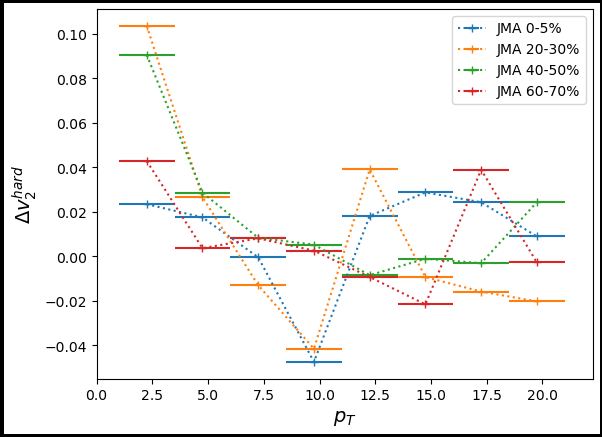

In [24]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\Delta v_2^{hard}$', fontsize=14)
#axis.set_title('CMS vs JMA Ch. Hadrons 40-50%')

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
j = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
#df = partons

total = partons.dropna()
#total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'weight'

# Make centrality cut
#p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

# # Bin pions
# pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
# #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
# pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

# # Compute R_AA
# pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
# cent_bins = np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
#                       '30-40', '20-30', '10-20', '5-10', '0-5'])

cent_bins = np.flip(np.array(['60-70', '40-50', '20-30', '0-5']))

for cent in cent_bins:
    # if cent == '0-5':
    #     CMS_v2 = CMS_0_5_v2
    #     cent_mask = (total['cent'] == '0-5')
    # elif cent == '30-40':
    #     CMS_v2 = CMS_30_40_v2
    #     cent_mask = (total['cent'] == '30-40')
    # elif cent == '50-60':
    #     CMS_v2 = CMS_50_60_v2
    #     cent_mask = (total['cent'] == '50-60')

    # # Get ALICE R_AA
    # alice_v2_pt_array = CMS_v2['pt'].to_numpy()
    # alice_v2_val_array = CMS_v2['v2'].to_numpy()
    # # error series: ['stat+', 'stat-', 'syst+', 'syst-']
    # alice_v2_perr_array = (CMS_v2['stat+'].to_numpy() + CMS_v2['syst+'].to_numpy())
    # alice_v2_nerr_array = (CMS_v2['stat-'].to_numpy() + CMS_v2['syst-'].to_numpy())
    # alice_v2_err_array = np.array([alice_v2_nerr_array, alice_v2_perr_array])
    
    # Plot
    #axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    # axis.plot(alice_v2_pt_array, alice_v2_val_array, label='CMS {}%'.format(cent), linestyle='--', color=colors[j])
    # axis.fill_between(alice_v2_pt_array, alice_v2_val_array+alice_v2_nerr_array, alice_v2_val_array+alice_v2_perr_array, color=colors[j], alpha=0.25)
    #j += 1
    
    cent_mask = (total['cent'] == cent)
    

    
    # Create pt bins
    pt_res = 2.5
    num_pt_points = 8
    pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
    
    # Create phi bins
    
    axis.set_xlim(0, pt_domain[-1]+pt_res)
    
    for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)']):
        # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
        # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
        # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
        
    
    
        
        mean_harm_array = np.array([])
        print('Computing harmonics for {}'.format(case))
        
        for i in np.arange(0, len(pt_domain)):
            # pt = alice_pbpb_pt_array[i]
            # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
            pt = pt_domain[i]
            # Determine current p_T bin bounds
            # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
            # Probably not good
            binmin = pt - (pt_res/2)
            binmax = pt + (pt_res/2)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'phi_f'
                pt_series = 'hadron_pt_f'
                p_mask = ((total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))  # & (total['grad'] == False) 
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'phi_f'
                pt_series = 'hadron_pt_f'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'phi_f'
                pt_series = 'hadron_pt_f'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
                
            elif case == 'pA':
                phi_series = 'phi_0'
                pt_series = 'hadron_pt_0'
                p_mask = ((total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total['cel'] == False) 
                          & (total['fgqhat'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax))
    
            # #p_mask = p_mask & (total['jetNo'] == 1)
            # angles_run = 11
            
            p_mask = p_mask & cent_mask
            
            if case != 'pA':
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            else:
                comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
                comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
    
            mean_harm_array = np.append(mean_harm_array, mean_harm)

        if case == 'PbPb (EL)':
            el_arr = mean_harm_array
        else:
            drift_arr = mean_harm_array
    axis.errorbar(pt_domain, drift_arr - el_arr, label='JMA '+ cent + '%', linestyle=':', marker='+', xerr=(pt_res/2), color=colors[j])
    j += 1
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

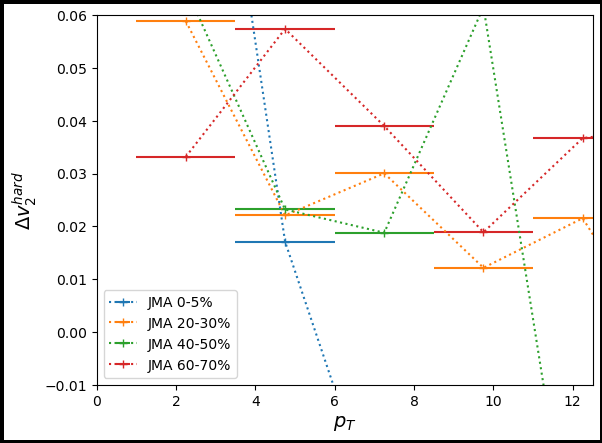

In [27]:
axis.set_xlim(0, 12.5)
axis.set_ylim(-0.01, 0.06)
fig

#### Minimum Bias

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


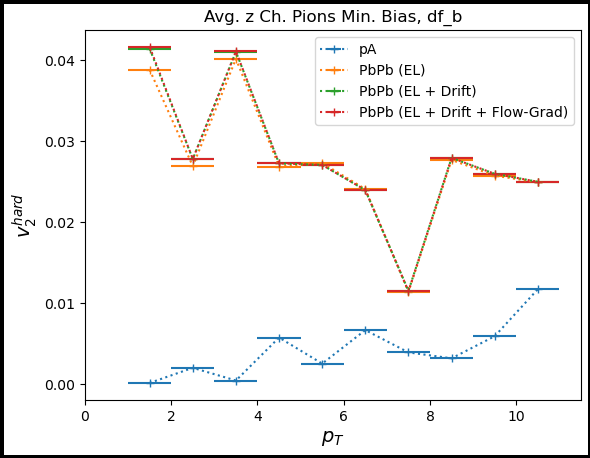

In [13]:


fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Avg. z Ch. Pions Min. Bias, df_b')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 1
num_pt_points = 10
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & (total['jetNo'] == 1)
        angles_run = 11
        p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


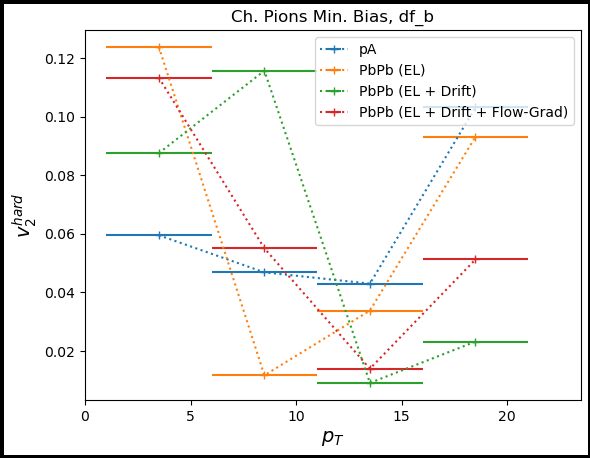

In [24]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Ch. Pions Min. Bias, df_b')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & (total['jetNo'] == 1)
        angles_run = 11
        p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Shuffling Dataframe
Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


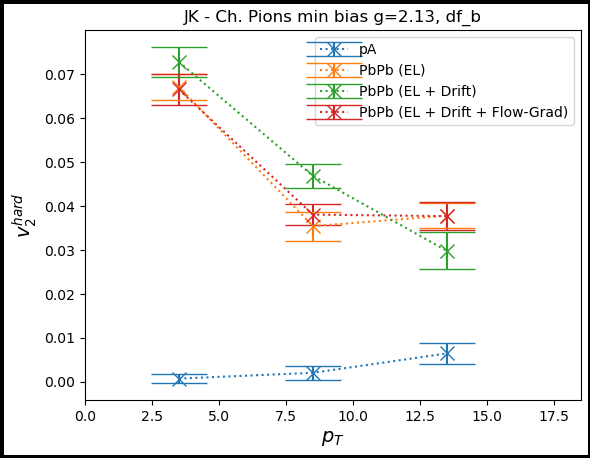

In [17]:
##############################
# Jack-Knife Resampling Test #
##############################





# Compute v_2 with error estimation

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('JK - Ch. Pions min bias g=2.13, df_b')


# Shuffle dataframe & compute new series
print('Shuffling Dataframe')
total_all = partons.sample(frac=1).reset_index(drop=True)
total_all['fix_phi_0'] = np.mod(total_all['phi_0'] - total_all['psi_2'], 2*np.pi)
total_all['fix_phi_f'] = np.mod(total_all['phi_f'] - total_all['psi_2'], 2*np.pi)
n = 2

# Find 1/num_replicas fractional length of dataframe - this will be the size of each replica
# We lose order num_replicas data lines using this method.
num_replicas = 20
r_length = int(len(total_all)/num_replicas)
# rng = np.random.default_rng()
# process_list = total_all['process'].value_counts().index.to_numpy().astype(int)

# Create pt bins
pt_res = 5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):  #['pA']:
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    harm_error_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)

        replica_harms = np.array([])
        for k in np.arange(0, num_replicas):

            
            # hard_processes = rng.choice(process_list, int(len(process_list)/num_replicas))
            # total = total_all[total_all['process'].isin(hard_processes)]
            
            #total = total_all.iloc[k*r_length:(k+1)*r_length]
            
            #total = total_all.sample(frac=1/num_replicas)

            # Jack-knife
            inv_mask = total_all.index.isin(np.arange(k*r_length, (k+1)*r_length))
            total = total_all[~inv_mask]
            
    
            if case == 'PbPb (EL)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pA':
                phi_series = 'fix_phi_0'
                pt_series = 'pion_pt'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pp':
                phi_series = 'fix_phi_0'
                pt_series = 'pion_pt'
                weight_choice = 'weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
    
    
            p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
            # angles_run = 11
            # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
            #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
            # p_mask = p_mask & (total['jetNo'] == 0)
            # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
            
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            r_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
            replica_harms = np.append(replica_harms, r_harm)

        # Compute datapoint & error estimate
        mean_harm = np.mean(replica_harms)
        harm_error = 2*np.std(replica_harms)  # Twice the standard deviation between replicas
        mean_harm_array = np.append(mean_harm_array, mean_harm)
        harm_error_array = np.append(harm_error_array, harm_error)
    
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='x', ms=10, yerr=harm_error_array, capsize=20)#, xerr=(pt_res/2)
axis.legend()
#fig.savefig('v2_partons_g2.png')

#### 40-50%

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


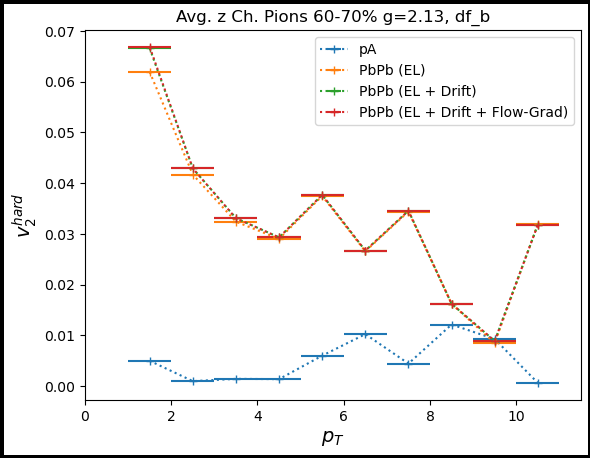

In [48]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)

cent_choice = '60-70'
axis.set_title('Avg. z Ch. Pions {}% g=2.13, df_b'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 1
num_pt_points = 10
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    Sx
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt_avg'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


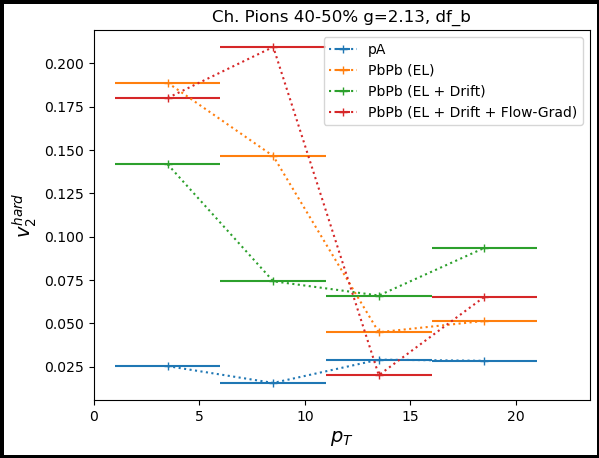

In [20]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)

cent_choice = '40-50'
axis.set_title('Ch. Pions {}% g=2.13, df_b'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


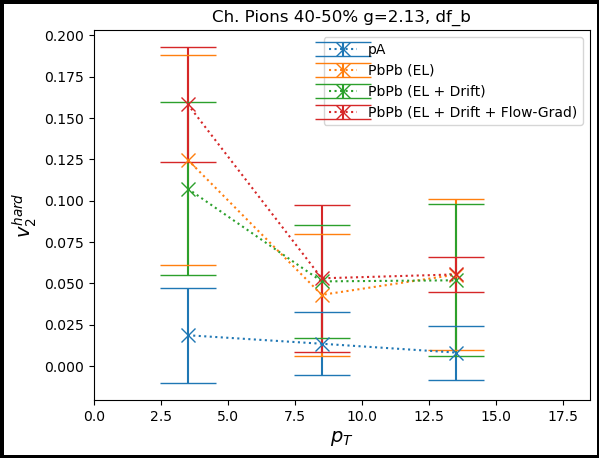

In [53]:
############################
# JK Error estimation test #
############################



# Compute v_2 with error estimation

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)

cent_choice = '40-50'
axis.set_title('JK - Ch. Pions {}% g=2.13, df_b'.format(cent_choice))



# Shuffle dataframe & compute new series
print('Shuffling Dataframe')
total_all = partons.sample(frac=1).reset_index(drop=True)
total_all['fix_phi_0'] = np.mod(total_all['phi_0'] - total_all['psi_2'], 2*np.pi)
total_all['fix_phi_f'] = np.mod(total_all['phi_f'] - total_all['psi_2'], 2*np.pi)
n = 2

# Find 1/num_replicas fractional length of dataframe - this will be the size of each replica
# We lose order num_replicas data lines using this method.
num_replicas = 20
r_length = int(len(total_all)/num_replicas)
# rng = np.random.default_rng()
# process_list = total_all['process'].value_counts().index.to_numpy().astype(int)

# Create pt bins
pt_res = 5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):  #['pA']:
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    harm_error_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)

        replica_harms = np.array([])
        for k in np.arange(0, num_replicas):

            
            hard_processes = rng.choice(process_list, int(len(process_list)/num_replicas))
            total = total_all[total_all['process'].isin(hard_processes)]
            
            #total = total_all.iloc[k*r_length:(k+1)*r_length]
            
            #total = total_all.sample(frac=1/num_replicas)
            
    
            if case == 'PbPb (EL)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
            
            elif case == 'PbPb (EL + Drift)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)
    
            elif case == 'PbPb (EL + Drift + Flow-Grad)':
                phi_series = 'fix_phi_f'
                pt_series = 'pion_pt_f'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pA':
                phi_series = 'fix_phi_0'
                pt_series = 'pion_pt'
                weight_choice = 'pA_weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
                
            elif case == 'pp':
                phi_series = 'fix_phi_0'
                pt_series = 'pion_pt'
                weight_choice = 'weight'
                case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
    
    
            p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
            p_mask = p_mask & (total['cent'] == cent_choice)
            # angles_run = 11
            # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
            #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
            # p_mask = p_mask & (total['jetNo'] == 0)
            # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
            
            
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
    
            
    
            # Get bin centers
            #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
            
            # # Do v0        
            # # Compute complex harmonic for each jet
            # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
            # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0
    
            
            # # Get real and imaginary parts
            # real_harm_array_0 = np.real(comp_harm_array_0)
            # imag_harm_array_0 = np.imag(comp_harm_array_0)
            
            # # sum real and imaginary parts separately
            # mean_real_harm_0 = np.sum(real_harm_array_0)
            # mean_imag_harm_0 = np.sum(imag_harm_array_0)
    
            # # Compute magnitude
            # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)
    
    
            # Do vn
            # Compute complex harmonic for each jet
            comp_harm = comp_harm_p + comp_harm_n
    
            
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
        
            # Compute magnitude
            r_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0
            replica_harms = np.append(replica_harms, r_harm)

        # Compute datapoint & error estimate
        mean_harm = np.mean(replica_harms)
        harm_error = 2*np.std(replica_harms)  # Twice the standard deviation between replicas
        mean_harm_array = np.append(mean_harm_array, mean_harm)
        harm_error_array = np.append(harm_error_array, harm_error)
    
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='x', ms=10, yerr=harm_error_array, capsize=20)#, xerr=(pt_res/2)
axis.legend()
#fig.savefig('v2_partons_g2.png')

## Deflection Measurements

In [57]:
partons[(partons['process'] == 947208827699) & (partons['process_run'] == 0)]

,process,pt_0,pt_f,weight,ncoll,mult,z,pp_z,el,drift,...,Tavg_qgp_parton,urqmd_re_q_2,urqmd_im_q_2,urqmd_flow_N,pt,pion_pt_f,pion_pt,cent,new_psi_2,new_v_2
0,947208827699,15.109317,10.277057,0.191876,473,1273.128951,0.076682,0.046199,True,False,...,0.215168,2184.676803,-1277.616402,27975,15.109317,0.78806,0.698035,20-30,-0.529174,0.090468
0,947208827699,15.109317,11.433919,0.191876,473,1273.128951,0.110505,0.333504,True,False,...,0.197835,2184.676803,-1277.616402,27975,15.109317,1.263505,5.039017,20-30,-0.529174,0.090468


In [16]:
len(partons['process'].value_counts().index.to_numpy())

98136

Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift False: 1.9459181740702743e-16
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884
Mean Angle Off-Axis, Drift True: 0.11560089844290884


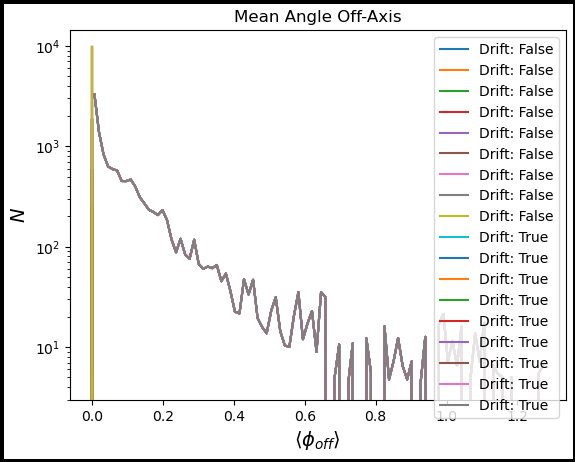

In [12]:
# Dataframe choices
df = partons
phi_series = 'phi_f'
pt_series = 'pt'
weight_choice = 'weight'

# Pick bins
pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_ylabel(r'$N$', fontsize=14)
axis.set_xlabel(r'$\langle \phi_{off} \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')

for drift in [False, True]:
    for pt in pt_bin_centers:
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['drift'] == drift) & (df[pt_series] > pt_min) & (df[pt_series] < pt_max)
        
        # Start list of off-axis measures
        off_axis_array = np.array([])
        weight_array = np.array([])
        
        # Get list of all process codes
        process_list = df[mask]['process'].value_counts().index.to_numpy()
        # Iterate through process codes
        for process in process_list[0:100]:
            # Cut dataframe to process
            proc = (df['process'] == process)
            process_df = df[mask & proc]
        
            # Get list of dijet pairs
            pair_list = process_df['process_run'].value_counts().index.to_numpy()
            
            # Iterate through dijet pairs in process list
            for pair in pair_list:
                angles = process_df[process_df['process_run'] == pair][phi_series].to_numpy()
                off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
                weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
                
                off_axis_array = np.append(off_axis_array, off_axis)
                weight_array = np.append(weight_array, weight)
        
        
        print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, np.mean(off_axis_array)))
        
    
        
        counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=100)
        
    axis.plot((bins[0:-1] + bins[1:])/2, counts, label='Drift: {}'.format(drift))
axis.set_yscale('log')
axis.legend()

In [ ]:
label_list = ['gluons', 'light quarks']
for case in label_list:

    if case == 'gluons':
        id_mask =  (df['id'] == 21)
    elif case == 'light quarks':
        id_mask =  (np.abs(df['id'] == 1)) | (np.abs(df['id'] == 2)) | (np.abs(df['id'] == 3))

Mean Angle Off-Axis, Drift True: 0.3867057852611678
Mean Angle Off-Axis, Drift True: 0.34432595139427563
Mean Angle Off-Axis, Drift True: 0.27568999342530615
Mean Angle Off-Axis, Drift True: 0.2518009132321786
Mean Angle Off-Axis, Drift True: 0.16923928247618994
Mean Angle Off-Axis, Drift True: 0.11703749483042654
Mean Angle Off-Axis, Drift True: 0.11794459537853051
Mean Angle Off-Axis, Drift True: 0.07204619267420961
Mean Angle Off-Axis, Drift True: 0.0909491641073559


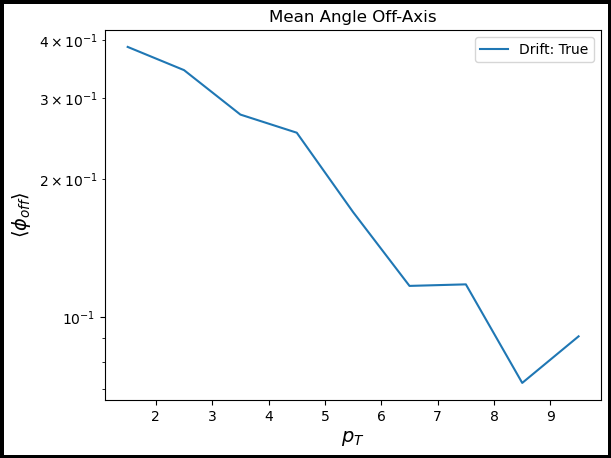

In [15]:
# Dataframe choices
df = partons
phi_series = 'phi_f'
pt_series = 'pt'
weight_choice = 'weight'

# Pick bins
pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2
avg_array = np.array([])

# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \phi_{off} \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')

for drift in [True]:
    for i in np.arange(0, len(pt_bin_centers)):
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['drift'] == drift) & (df[pt_series] > pt_min) & (df[pt_series] < pt_max)
        
        # Start list of off-axis measures
        off_axis_array = np.array([])
        weight_array = np.array([])
        
        # Get list of all process codes
        process_list = df[mask]['process'].value_counts().index.to_numpy()
        # Iterate through process codes
        for process in process_list[0:100]:
            # Cut dataframe to process
            proc = (df['process'] == process)
            process_df = df[mask & proc]
        
            # Get list of dijet pairs
            pair_list = process_df['process_run'].value_counts().index.to_numpy()
            
            # Iterate through dijet pairs in process list
            for pair in pair_list:
                angles = process_df[process_df['process_run'] == pair][phi_series].to_numpy()
                off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
                weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
                
                off_axis_array = np.append(off_axis_array, off_axis)
                weight_array = np.append(weight_array, weight)
        

        avg = np.average(off_axis_array, weights=weight_array)
        avg_array = np.append(avg_array, avg)
        print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, avg))
        
    
        
        #counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=100)
        
    axis.plot(pt_bin_centers, avg_array, label='Drift: {}'.format(drift))
axis.set_yscale('log')
axis.legend()

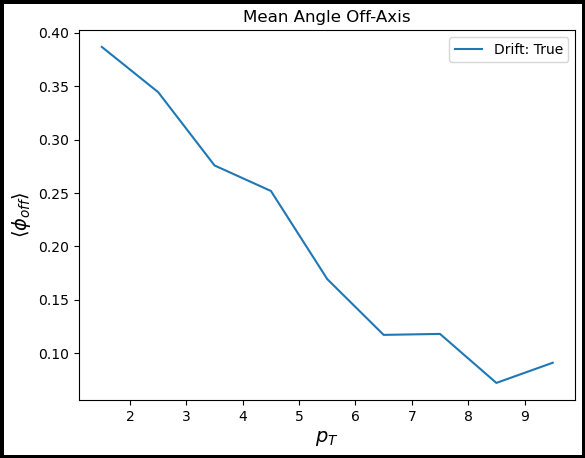

In [16]:
axis.set_yscale('linear')
fig

0-5
Mean Angle Off-Axis, Drift True: 0.37644319094776224
20-30
Mean Angle Off-Axis, Drift True: 0.267223851838664
40-50
Mean Angle Off-Axis, Drift True: 0.2363688868799628
60-70
Mean Angle Off-Axis, Drift True: 0.20578006020913792


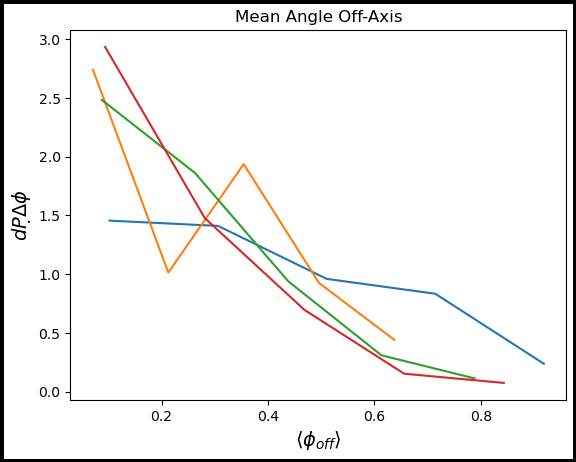

In [29]:
# Dataframe choices
df = partons
phi_series = 'phi_f'
pt_series = 'pt_f'
weight_choice = 'weight'

# Pick bins
pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2


# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$\langle \phi_{off} \rangle$', fontsize=14)
axis.set_ylabel(r'$dP\d\Delta\phi$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')
drift = True

for cent in ['0-5', '20-30', '40-50', '60-70']:
    print(cent)
    pt_min = 1
    pt_max = 10
    mask = (df['drift'] == drift) & (df[pt_series] > pt_min) & (df[pt_series] < pt_max) & (df['cel'] == False) & (df['cent'] == cent)
    
    # Start list of off-axis measures
    off_axis_array = np.array([])
    weight_array = np.array([])
    
    # Get list of all process codes
    process_list = df[mask]['process'].value_counts().index.to_numpy()
    # Iterate through process codes
    i = 0
    for process in process_list:
        # Cut dataframe to process
        proc = (df['process'] == process)
        process_df = df[mask & proc]
    
        # Get list of dijet pairs
        pair_list = process_df['process_run'].value_counts().index.to_numpy()
        
        # Iterate through dijet pairs in process list
        for pair in pair_list:
            if len(angles) != 2:
                # Do not count if both particles aren't in the pT bin
                continue
            angles = process_df[process_df['process_run'] == pair][phi_series].to_numpy()
            off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
            weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
            
            off_axis_array = np.append(off_axis_array, off_axis)
            weight_array = np.append(weight_array, weight)
    

        i += 1
        if i > 250:
            break
    avg = np.average(off_axis_array, weights=weight_array)
    avg_array = np.append(avg_array, avg)
    print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, avg))

    counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=5, density=True)

    bin_centers = (bins[0:-1] + bins[1:])/2
    
        

        
    axis.plot(bin_centers, counts, label='{}%'.format(cent))
    np.savez('aco_small_ish_noCNM_hist_{}.npz'.format(cent), aco=bin_centers, dpddelphi=counts)
#axis.set_yscale('log')
#axis.legend()

0-5
Mean Angle Off-Axis, Drift True: 0.9273890144258141
Mean Angle Off-Axis, Drift True: 0.8961725911632411
Mean Angle Off-Axis, Drift True: 0.76780555699639
Mean Angle Off-Axis, Drift True: 0.684429710089742
Mean Angle Off-Axis, Drift True: 0.6444113247954185
Mean Angle Off-Axis, Drift True: 0.5813206293909883
Mean Angle Off-Axis, Drift True: 0.5306261437046605
Mean Angle Off-Axis, Drift True: 0.474883628679148
Mean Angle Off-Axis, Drift True: 0.4314349938066645
30-50
Mean Angle Off-Axis, Drift True: 0.7277315175292851
Mean Angle Off-Axis, Drift True: 0.5314095656007997
Mean Angle Off-Axis, Drift True: 0.38501328168611454
Mean Angle Off-Axis, Drift True: 0.2965926771678655
Mean Angle Off-Axis, Drift True: 0.23833794946455744
Mean Angle Off-Axis, Drift True: 0.1791285003619927
Mean Angle Off-Axis, Drift True: 0.1578544282110214
Mean Angle Off-Axis, Drift True: 0.13301303028436146
Mean Angle Off-Axis, Drift True: 0.10990205890729941
50-70
Mean Angle Off-Axis, Drift True: 0.4541627593554

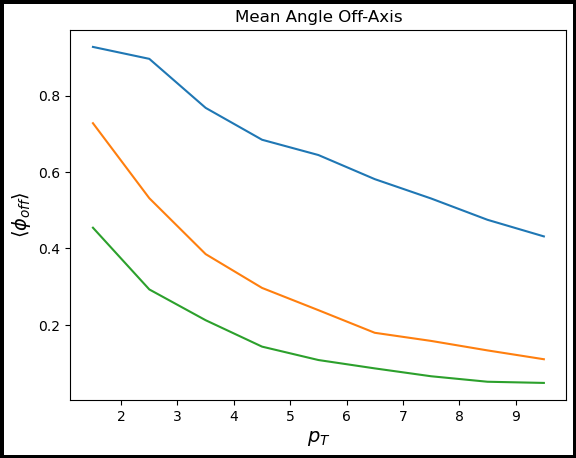

In [32]:
# Dataframe choices
df = partons
phi_series = 'phi_f'
pt_series = 'pt'
weight_choice = 'weight'

# Pick bins
pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2


# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \phi_{off} \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')
drift = True

for cent in ['0-5', '30-50', '50-70']:
    print(cent)
    if cent == '0-5':
        cent_mask = (total['cent'] == '0-5')
    elif cent == '0-10':
        cent_mask = (total['cent'] == '0-5') | (total['cent'] == '5-10')
    elif cent == '30-50':
        cent_mask = (total['cent'] == '30-40') | (total['cent'] == '40-50')
    elif cent == '50-70':
        cent_mask = (total['cent'] == '50-60') | (total['cent'] == '60-70')
    else:
        cent_mask = (total['cent'] == cent)
        
    avg_array = np.array([])
    for i in np.arange(0, len(pt_bin_centers)):
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['drift'] == drift) & (df[pt_series] > pt_min) & (df[pt_series] < pt_max) & (df['cel'] == False) & cent_mask
        
        # Start list of off-axis measures
        off_axis_array = np.array([])
        weight_array = np.array([])
        
        # Get list of all process codes
        process_list = df[mask]['process'].value_counts().index.to_numpy()
        # Iterate through process codes
        for process in process_list[0:250]:
            # Cut dataframe to process
            proc = (df['process'] == process)
            process_df = df[mask & proc]
        
            # Get list of dijet pairs
            pair_list = process_df['process_run'].value_counts().index.to_numpy()
            
            # Iterate through dijet pairs in process list
            for pair in pair_list:
                angles = process_df[process_df['process_run'] == pair][phi_series].to_numpy()
                off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
                weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
                
                off_axis_array = np.append(off_axis_array, off_axis)
                weight_array = np.append(weight_array, weight)
        

        avg = np.average(off_axis_array, weights=weight_array)
        avg_array = np.append(avg_array, avg)
        print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, avg))
        
    
        
        #counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=100)
        
    axis.plot(pt_bin_centers, avg_array, label='{}%'.format(cent))
    #np.savez('aco_small_ish_noCNM_{}.npz'.format(cent), pt=pt_bin_centers, aco=avg_array)
#axis.set_yscale('log')
#axis.legend()

In [ ]:
# Dataframe choices
df = partons
phi_series = 'phi_f'
pt_series = 'pt'
weight_choice = 'weight'

# Pick bins
pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2
avg_array = np.array([])

# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \phi_{off} \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')
drift = True

for drift in [True]:
    for i in np.arange(0, len(pt_bin_centers)):
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['drift'] == drift) & (df[pt_series] > pt_min) & (df[pt_series] < pt_max)
        
        # Start list of off-axis measures
        off_axis_array = np.array([])
        weight_array = np.array([])
        
        # Get list of all process codes
        process_list = df[mask]['process'].value_counts().index.to_numpy()
        # Iterate through process codes
        for process in process_list[0:100]:
            # Cut dataframe to process
            proc = (df['process'] == process)
            process_df = df[mask & proc]
        
            # Get list of dijet pairs
            pair_list = process_df['process_run'].value_counts().index.to_numpy()
            
            # Iterate through dijet pairs in process list
            for pair in pair_list:
                angles = process_df[process_df['process_run'] == pair][phi_series].to_numpy()
                off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
                weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
                
                off_axis_array = np.append(off_axis_array, off_axis)
                weight_array = np.append(weight_array, weight)
        

        avg = np.average(off_axis_array, weights=weight_array)
        avg_array = np.append(avg_array, avg)
        print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, avg))
        
    
        
        #counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=100)
        
    axis.plot(pt_bin_centers, avg_array, label='Drift: {}'.format(drift))
axis.set_yscale('log')
axis.legend()

Mean Angle Off-Axis, Drift False: 1.6835018227952374e-16


KeyboardInterrupt: 

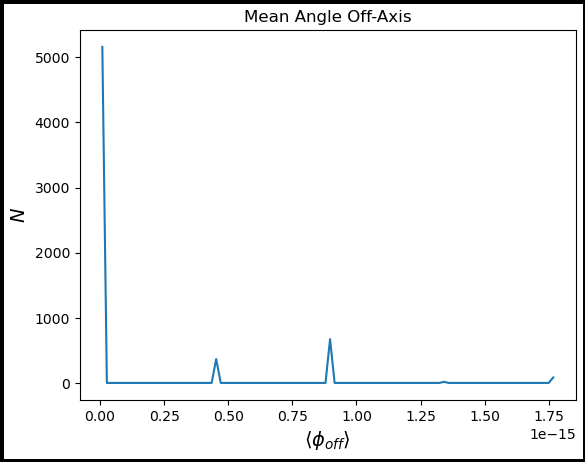

In [17]:
# Dataframe choices
df = partons
phi_label = 'phi_f'
weight_choice = 'weight'

# Create figure
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_ylabel(r'$N$', fontsize=14)
axis.set_xlabel(r'$\langle \phi_{off} \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Angle Off-Axis')

for drift in [False, True]:
    mask = (df['drift'] == drift)
    
    # Start list of off-axis measures
    off_axis_array = np.array([])
    weight_array = np.array([])
    
    # Get list of all process codes
    process_list = df[mask]['process'].value_counts().index.to_numpy()
    # Iterate through process codes
    for process in process_list[0:100]:
        # Cut dataframe to process
        proc = (df['process'] == process)
        process_df = df[mask & proc]
    
        # Get list of dijet pairs
        pair_list = process_df['process_run'].value_counts().index.to_numpy()
        
        # Iterate through dijet pairs in process list
        for pair in pair_list:
            angles = process_df[process_df['process_run'] == pair][phi_label].to_numpy()
            off_axis = np.abs(np.abs(np.mod(angles[0] - angles[1] + np.pi, 2*np.pi) - np.pi) - np.pi)
            weight = np.mean(process_df[process_df['process_run'] == pair][weight_choice].to_numpy())
            
            off_axis_array = np.append(off_axis_array, off_axis)
            weight_array = np.append(weight_array, weight)
    
    
    print('Mean Angle Off-Axis, Drift {}: {}'.format(drift, np.mean(off_axis_array)))
    

    
    counts, bins = np.histogram(off_axis_array, weights=weight_array, bins=100)
    
    axis.plot((bins[0:-1] + bins[1:])/2, counts, label='Drift: {}'.format(drift))
axis.set_yscale('log')
axis.legend()

KeyboardInterrupt: 

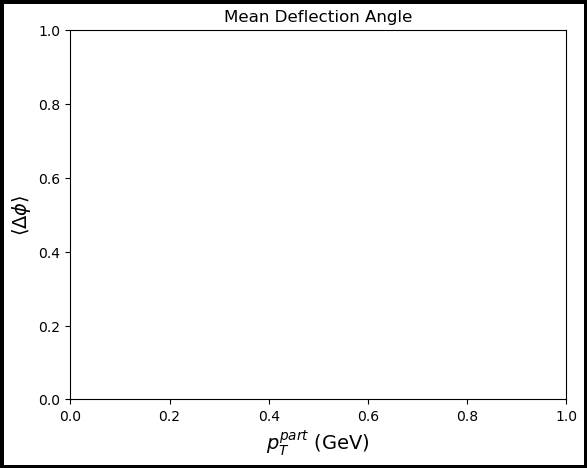

In [25]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T^{part}$ (GeV)', fontsize=14)
axis.set_ylabel(r'$\langle \Delta\phi \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Deflection Angle')

pt_bin_edges = pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

weight_choice = 'weight'

df = partons
label_list = ['gluons', 'light quarks']
for case in label_list:

    if case == 'gluons':
        id_mask =  (df['id'] == 21)
    elif case == 'light quarks':
        id_mask =  (np.abs(df['id'] == 1)) | (np.abs(df['id'] == 2)) | (np.abs(df['id'] == 3)) #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cel'] == False) & id_mask

    avg_array = np.array([])
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(np.mod(df[t_mask]['phi_f'] - df[t_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi), 
                         weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 20)
#axis.set_xscale('log')

#fig.savefig('deflection_g.png')
    #0603010

0-5
Mean deflection, 1.5 GeV: 0.4515539246174041 rad
Mean deflection, 2.5 GeV: 0.4229347292622456 rad
Mean deflection, 3.5 GeV: 0.3841169265868463 rad
Mean deflection, 4.5 GeV: 0.36015283432093637 rad
Mean deflection, 5.5 GeV: 0.3206221808256576 rad
Mean deflection, 6.5 GeV: 0.30977008569463405 rad
Mean deflection, 7.5 GeV: 0.2900017879245297 rad
Mean deflection, 8.5 GeV: 0.26094132332124087 rad
Mean deflection, 9.5 GeV: 0.25213910250086463 rad
20-30
Mean deflection, 1.5 GeV: 0.3953396067513947 rad
Mean deflection, 2.5 GeV: 0.3342616823198566 rad
Mean deflection, 3.5 GeV: 0.2778437554654391 rad
Mean deflection, 4.5 GeV: 0.23662454808521252 rad
Mean deflection, 5.5 GeV: 0.20263492071416037 rad
Mean deflection, 6.5 GeV: 0.17819606018363246 rad
Mean deflection, 7.5 GeV: 0.15328860003284275 rad
Mean deflection, 8.5 GeV: 0.13325955324659716 rad
Mean deflection, 9.5 GeV: 0.11487806721055803 rad
40-50
Mean deflection, 1.5 GeV: 0.307220466061391 rad
Mean deflection, 2.5 GeV: 0.2334732155855813

(0.0, 20.0)

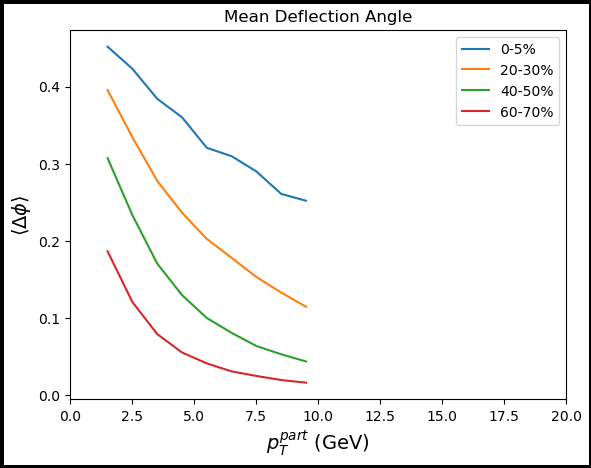

In [26]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T^{part}$ (GeV)', fontsize=14)
axis.set_ylabel(r'$\langle \Delta\phi \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Deflection Angle')

pt_bin_edges = np.linspace(1, 10, 10)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

weight_choice = 'weight'

df = partons
for cent in ['0-5', '20-30', '40-50', '60-70']:
    print(cent)
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cel'] == False) & (df['cent'] == cent)

    avg_array = np.array([])
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(np.mod(df[t_mask]['phi_f'] - df[t_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi), 
                         weights=df[t_mask][weight_choice])
        print('Mean deflection, {} GeV: {} rad'.format(pt_bin_centers[i], avg))
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label='{}%'.format(cent))#, marker='+')#, marker='+')
    np.savez('def_10k_noCNM_{}.npz'.format(cent), pt=pt_bin_centers, deflect=avg_array)
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 20)
#axis.set_xscale('log')

#fig.savefig('deflection_g.png')
    #0603010

(0.0, 20.0)

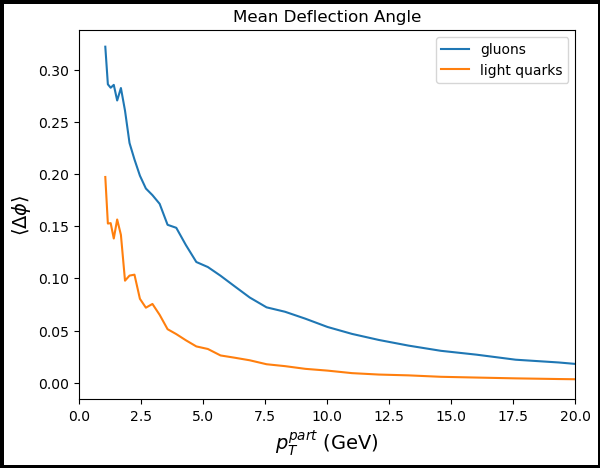

In [18]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T^{part}$ (GeV)', fontsize=14)
axis.set_ylabel(r'$\langle \Delta\phi \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Deflection Angle')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

weight_choice = 'weight'

df = partons
label_list = ['gluons', 'light quarks']
for case in label_list:

    if case == 'gluons':
        id_mask =  (df['id'] == 21)
    elif case == 'light quarks':
        id_mask =  (np.abs(df['id'] == 1)) | (np.abs(df['id'] == 2)) | (np.abs(df['id'] == 3)) #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & id_mask

    avg_array = np.array([])
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(np.mod(df[t_mask]['phi_f'] - df[t_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi), 
                         weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 20)
#axis.set_xscale('log')

#fig.savefig('deflection_g.png')
    #0603010

(0.0, 20.0)

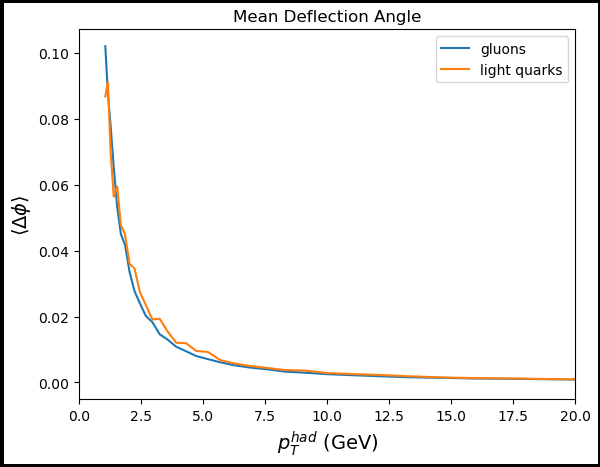

In [20]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T^{had}$ (GeV)', fontsize=14)
axis.set_ylabel(r'$\langle \Delta\phi \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Deflection Angle')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

weight_choice = 'weight'
pt_series = 'hadron_pt_f'

df = partons
label_list = ['gluons', 'light quarks']
for case in label_list:

    if case == 'gluons':
        id_mask =  (df['id'] == 21)
    elif case == 'light quarks':
        id_mask =  (np.abs(df['id'] == 1)) | (np.abs(df['id'] == 2)) | (np.abs(df['id'] == 3)) #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & id_mask

    avg_array = np.array([])
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df[pt_series] > pt_min) & (df[pt_series] < pt_max)
    
        # average
        t_mask = p_mask & mask
        try:
            avg = np.average(np.abs(np.mod(df[t_mask]['phi_f'] - df[t_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi), 
                             weights=df[t_mask][weight_choice])
        except ZeroDivisionError:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=case)#, marker='+')#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 20)
#axis.set_xscale('log')

#fig.savefig('deflection_g.png')
    #0603010

## Harmonic Decomposition

In [37]:
df = pd.DataFrame({'x': [0]})

In [38]:
df['y'] = 1

In [41]:
type(df['y'][0])

numpy.int64

In [26]:
partons.columns

Index(['process', 'pt_0', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el',
       'drift', 'fg', 'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el',
       'q_drift', 'q_fg_utau', 'q_fg_uperp', 'e2', 'Tmax_event', 'b', 'rmax',
       'time_total_plasma', 'jetNo', 'x_0', 'process_run', 'seed', 'fgqhat',
       'q_fg_utau_qhat', 'q_fg_uperp_qhat', 'Tavg_qgp_parton', 'pt',
       'pion_pt_f', 'pion_pt', 'cent', 'fix_phi_0', 'fix_phi_f'],
      dtype='object')

0.41887902047863906
Particles: 92068529.55507651
|v_-8| = 3.375214451901473e-17
v_-8 = (-4.3483073481916436e-10-2.3564227814113455e-10j)
|v_-7| = 5.174590616400542e-17
v_-7 = (-7.532354036174501e-10+8.698292475912862e-11j)
|v_-6| = 5.0064537680437557e-17
v_-6 = (-7.263036923697874e-10-1.0323479724590744e-10j)
|v_-5| = 4.8001153293870356e-17
v_-5 = (-5.525391785245835e-10-4.352331806047444e-10j)
|v_-4| = 1.0983460661724068e-17
v_-4 = (-1.459791197580107e-10-6.776843199290777e-11j)
|v_-3| = 4.907449562198551e-17
v_-3 = (-4.1254602267706716e-10+5.889869060300032e-10j)
|v_-2| = 4.444801223081347e-17
v_-2 = (6.27638504053228e-10-1.7397323120036585e-10j)
|v_-1| = 5.644643481211716e-17
v_-1 = (-8.240137178478781e-10-7.160158067094095e-11j)
|v_0| = 1.0000000000000002
v_0 = (14653161.58189269+0j)
|v_1| = 5.644643481211716e-17
v_1 = (-8.240137178478781e-10+7.160158067094095e-11j)
|v_2| = 4.444801223081347e-17
v_2 = (6.27638504053228e-10+1.7397323120036585e-10j)
|v_3| = 4.907449562198551e-17
v_3 

/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


|v_-8| = 0.001570865020393527
v_-8 = (18170.310345166843+14130.624312897493j)
|v_-7| = 0.0025424788509949355
v_-7 = (9433.839710628416+36041.14352965561j)
|v_-6| = 0.0027718683652223977
v_-6 = (24087.484079661146-32703.274341127602j)
|v_-5| = 0.004977512988477803
v_-5 = (-69814.96486051372-21108.643845208808j)
|v_-4| = 0.013141439917041128
v_-4 = (192563.6358612507-50.65248818943869j)
|v_-3| = 0.0016300026953023393
v_-3 = (-18534.865883511837-15064.438267875774j)
|v_-2| = 0.07017733393721279
v_-2 = (1026634.8694321502-58842.87419410172j)
|v_-1| = 0.007309228472306579
v_-1 = (39917.76318938341+99386.57004143436j)
|v_0| = 1.0000000000000002
v_0 = (14653161.58189269+0j)
|v_1| = 0.007309228472306579
v_1 = (39917.76318938341-99386.57004143436j)
|v_2| = 0.07017733393721279
v_2 = (1026634.8694321502+58842.87419410172j)
|v_3| = 0.0016300026953023393
v_3 = (-18534.865883511837+15064.438267875774j)
|v_4| = 0.013141439917041128
v_4 = (192563.6358612507+50.65248818943869j)
|v_5| = 0.00497751298847

/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
No handles with labels found to put in legend.


|v_8| = 0.001570865020393527
v_8 = (18170.310345166843-14130.624312897493j)
v_2 = 0.14035466787442555


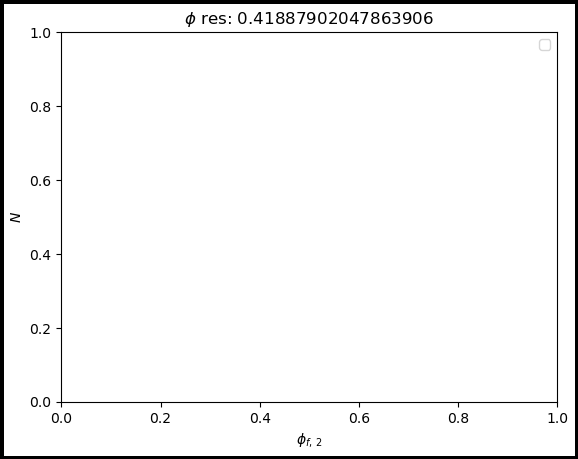

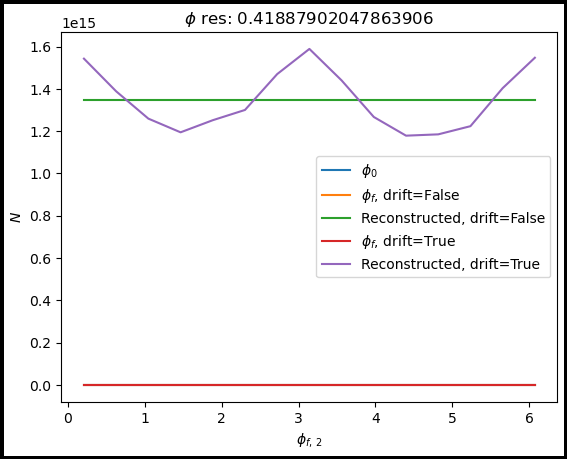

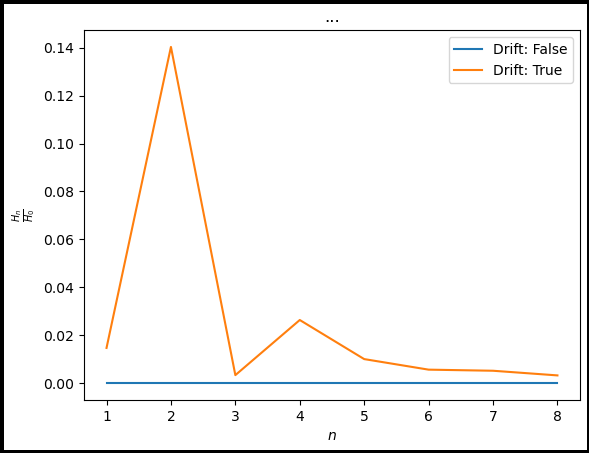

In [10]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$\phi_{f, \, 2}$')
axis.set_ylabel(r'$N$')

fig1, axis1 = plt.subplots(edgecolor='black', linewidth=5)
axis1.set_xlabel(r'$\phi_{f, \, 2}$')
axis1.set_ylabel(r'$N$')
axis1.set_title('...')

fig2, axis2 = plt.subplots(edgecolor='black', linewidth=5)
axis2.set_xlabel(r'$n$')
axis2.set_ylabel(r'$\frac{H_{n}}{H_{0}}$')
axis2.set_title('...')

weight_choice = 'weight'
phi_bins, phi_res = np.linspace(0, 2*np.pi, num=16, retstep=True)
print(phi_res)
bin_labels = phi_bins[0:-1] + (phi_res/2)

axis.set_title(r'$\phi$ res: ' + str(phi_res))
axis1.set_title(r'$\phi$ res: ' + str(phi_res))
total = partons
pt_series = 'hadron_pt_f'

total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)

for drift in [False, True]:
    p_mask = (total['drift'] == drift) & (total['el'] == True) & (total['fg'] == False)# & (total['cel'] == False) #& (total['grad'] == False)
    #p_mask = p_mask & (total[pt_series] > 2) & (total[pt_series] < 5)
    #mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) #& (hadrons['grad'] == False)
    norm = np.sum(total.loc[p_mask, weight_choice])
    print('Particles: {}'.format(norm))
    # Did not inclue  - hadrons.loc[mask, 'psi_2'] for hadron final
    counts_0, bins_0 = np.histogram(total.loc[p_mask, 'fix_phi_0'], bins=phi_bins, weights=total.loc[p_mask, 'weight'])
    counts_f, bins_f = np.histogram(total.loc[p_mask, 'fix_phi_f'], bins=phi_bins, weights=total.loc[p_mask, weight_choice])
    counts_0 = counts_0 # - np.mean(counts_0)
    counts_f = counts_f # - np.mean(counts_f)
    if not drift:
        axis1.plot(bin_labels, counts_0, label=r'$\phi_0$')
    axis1.plot(bin_labels, counts_f, label=r'$\phi_f$, drift={}'.format(drift))
    
    
    
    
    # Compute first five harmonics of distribution
    n_array = np.array([-8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8])
    mean_harm_array = np.zeros(9)
    recon_dist = np.zeros_like(bin_labels)
    for n in n_array:
    
        # Compute complex harmonic for each jet
        #comp_harm = (1/(2*np.pi)) * integrate.trapezoid(y=counts_f * np.exp(- 1j * n * bin_labels), x=bin_labels)
        v_n =  np.sum(((np.exp(- 1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]))) / np.sum(total.loc[p_mask, weight_choice])
        
        mean_harm = np.sqrt(np.real(v_n)**2 + np.imag(v_n)**2)  
        comp_harm = (1/(2*np.pi)) * v_n * np.sum(total.loc[p_mask, weight_choice])
        
        # Add to reconstructed function
        recon_dist = recon_dist + (comp_harm * np.exp(1j * n * bin_labels))
        
        mean_harm_array[int(np.abs(n))] +=  mean_harm
        print('|v_{}| = {}'.format(n, mean_harm))
        print('v_{} = {}'.format(n, comp_harm))
        if n == -2:
            v_2_n = mean_harm
        elif n == 2:
            v_2_p = mean_harm
        elif n == 0:
            v_0 = mean_harm
        
    
    # Plot reconstructed curve
    axis1.plot(bin_labels, norm*recon_dist, label='Reconstructed, drift={}'.format(drift))
    
    # Plot harmonics
    axis2.plot(np.arange(1, 9), mean_harm_array[1:]/v_0, label='Drift: {}'.format(drift))
    
    print('v_2 = {}'.format((v_2_n + v_2_p)/v_0))

axis2.legend()
axis1.legend()
axis.legend()

## Old

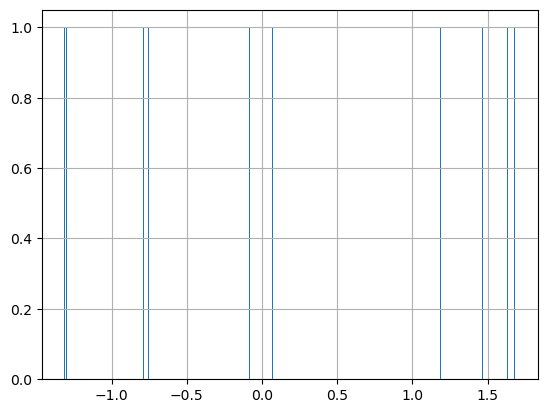

In [12]:
partons[partons['process'] == 547575770489]['x0'].hist(bins=500)

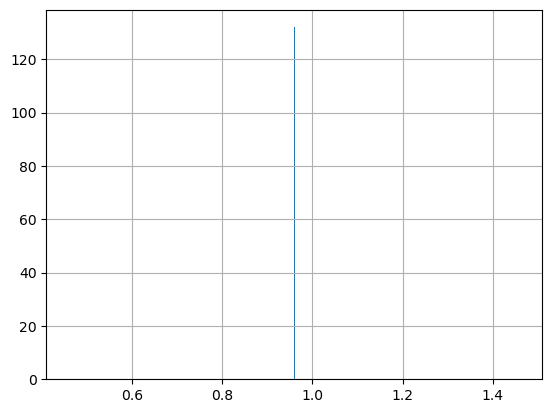

In [11]:
partons[partons['process'] == 474662431478]['x_0'].hist(bins=500)

In [12]:
partons.columns

Index(['process', 'pt', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el',
       'drift', 'fg', 'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el',
       'q_drift', 'q_fg', 'e2', 'Tmax_event', 'b', 'rmax',
       'time_total_plasma'],
      dtype='object')

In [4]:
len(partons)

0

In [13]:
# print('Number of parton files: {}'.format(len(parton_files)))
# print('Number of hadron files: {}'.format(len(hadron_files)))
# print('Empty parton files: {}'.format(num_empty_parts))
# print('Empty hadron files: {}'.format(num_empty_hads))

print('Number of loaded hard processes (partons): {}'.format(len(partons['process'].value_counts())))
print('Number of loaded hard processes (partons): {}'.format(len(partons['process'].value_counts())))
#print('Number of loaded hard processes (hadrons): {}'.format(len(hadrons['process'].value_counts())))

Number of loaded hard processes (partons): 991024
Number of loaded hard processes (partons_b): 492510


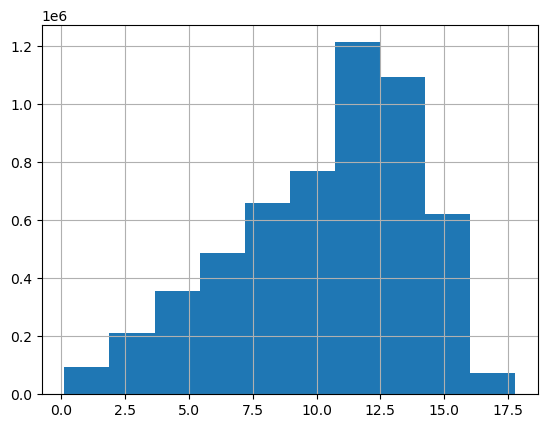

In [22]:
partons['b'].hist()

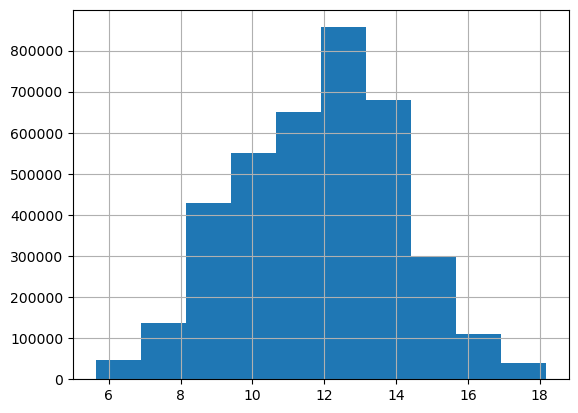

In [21]:
partons['b'].hist()

In [55]:
partons[partons['process'] == partons['process'].to_numpy()[100]]['phi_0'].value_counts()

1.769740    3
4.911332    3
3.974008    3
0.832416    3
5.428669    3
2.287076    3
0.865574    3
4.007167    3
Name: phi_0, dtype: int64

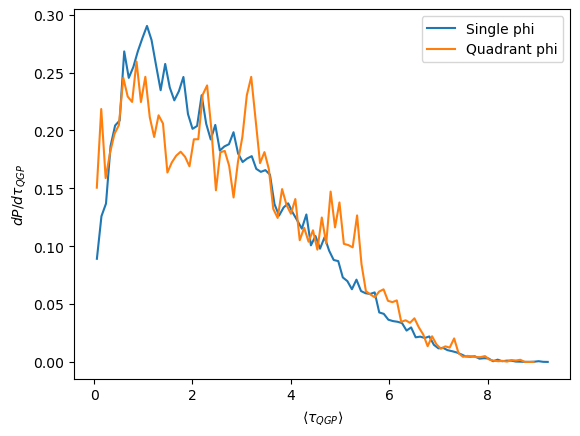

In [15]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/d\tau_{QGP}$')
axis.set_xlabel(r'$\langle\tau_{QGP}\rangle$')#, rotation=0)

i=0
label_list = ['Single phi', 'Quadrant phi']
for df in [partons, partons]:
    counts, bins = np.histogram(df['time_total_plasma'], weights=df['weight'], bins=100)
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths), label=label_list[i])#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

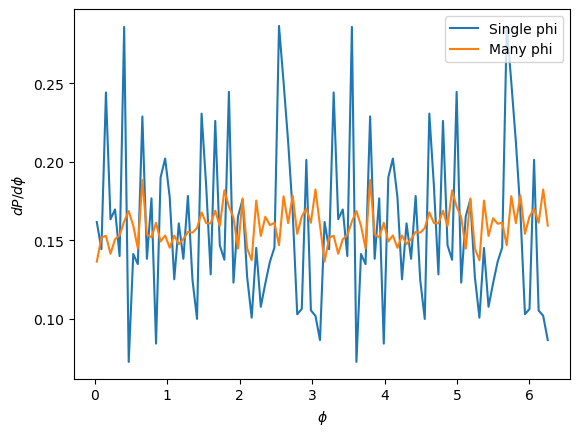

In [17]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/d\phi$')
axis.set_xlabel(r'$\phi$')#, rotation=0)

i=0
label_list = ['Single phi', 'Many phi']
for df in [partons, partons[0:(int(len(partons)))]]:
    counts, bins = np.histogram(df['phi_0'], weights=df['weight'], bins=100)
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths), label=label_list[i])#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

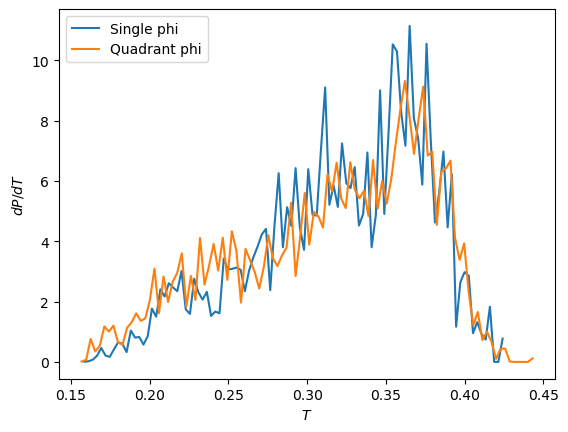

In [11]:
fig, axis = plt.subplots()
axis.set_ylabel(r'$dP/dT$')
axis.set_xlabel(r'$T$')#, rotation=0)


i=0
label_list = ['Single phi', 'Quadrant phi']
for df in [partons, partons]:
    counts, bins = np.histogram(df['Tmax_event'], weights=df['weight'], bins=100)
    bin_centers = (bins[1:] + bins[0:-1])/2
    bin_widths = bins[1:] - bins[0:-1]
    
    axis.plot(bin_centers, counts/(np.sum(df['weight'])*bin_widths), label=label_list[i])#, marker='+')
    i+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

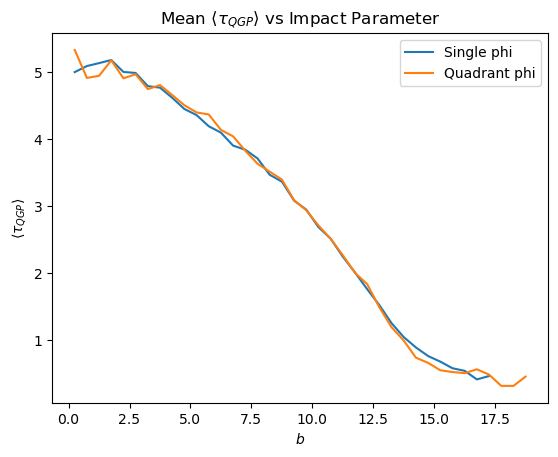

In [12]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$b$')
axis.set_ylabel(r'$\langle\tau_{QGP}\rangle$')#, rotation=0)
axis.set_title(r'Mean $\langle\tau_{QGP}\rangle$ vs Impact Parameter')


j=0
label_list = ['Single phi', 'Quadrant phi']
for df in [partons, partons]:
    b_bin_edges = np.arange(0, np.amax(df['b']), 0.5)
    b_bin_centers = (b_bin_edges[1:] + b_bin_edges[0:-1])/2
    avg_array = np.array([])
    for i in np.arange(0, len(b_bin_centers)):
        # bin data
        b_min = b_bin_edges[i]
        b_max = b_bin_edges[i+1]
        mask = (df['b'] > b_min) & (df['b'] < b_max)
    
        # average
        try:
            avg = np.average(np.abs(df[mask]['time_total_plasma']), weights=df[mask]['weight'])
        except:
            avg = np.nan
        avg_array = np.append(avg_array, avg)
    
    axis.plot(b_bin_centers, avg_array, label=label_list[j])#, marker='+')
    j+=1
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()

    #0603010

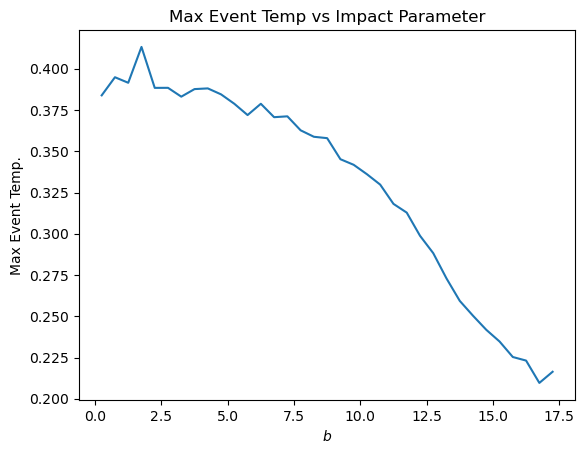

In [8]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$b$')
axis.set_ylabel(r'Max Event Temp.')#, rotation=0)
axis.set_title('Max Event Temp vs Impact Parameter')

b_bin_edges = np.arange(0, np.amax(partons['b']), 0.5)
b_bin_centers = (b_bin_edges[1:] + b_bin_edges[0:-1])/2
avg_array = np.array([])
for i in np.arange(0, len(b_bin_centers)):
    # bin data
    b_min = b_bin_edges[i]
    b_max = b_bin_edges[i+1]
    mask = (partons['b'] > b_min) & (partons['b'] < b_max)

    # average
    t_mask = mask
    avg = np.mean(np.abs(partons[t_mask]['Tmax_event']))
    avg_array = np.append(avg_array, avg)

axis.plot(b_bin_centers, avg_array)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

    #0603010

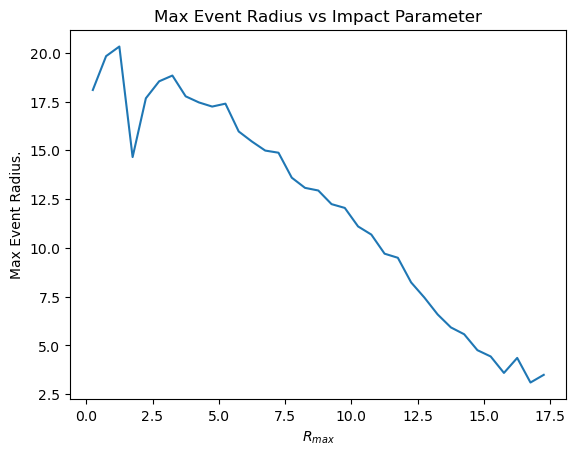

In [9]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$R_{max}$')
axis.set_ylabel(r'Max Event Radius.')#, rotation=0)
axis.set_title('Max Event Radius vs Impact Parameter')

b_bin_edges = np.arange(0, np.amax(partons['b']), 0.5)
b_bin_centers = (b_bin_edges[1:] + b_bin_edges[0:-1])/2
avg_array = np.array([])
for i in np.arange(0, len(b_bin_centers)):
    # bin data
    b_min = b_bin_edges[i]
    b_max = b_bin_edges[i+1]
    mask = (partons['b'] > b_min) & (partons['b'] < b_max)

    # average
    t_mask = mask
    avg = np.mean(np.abs(partons[t_mask]['rmax']))
    avg_array = np.append(avg_array, avg)

axis.plot(b_bin_centers, avg_array)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

#axis.legend()

    #0603010

Binning by centrality
done


/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/

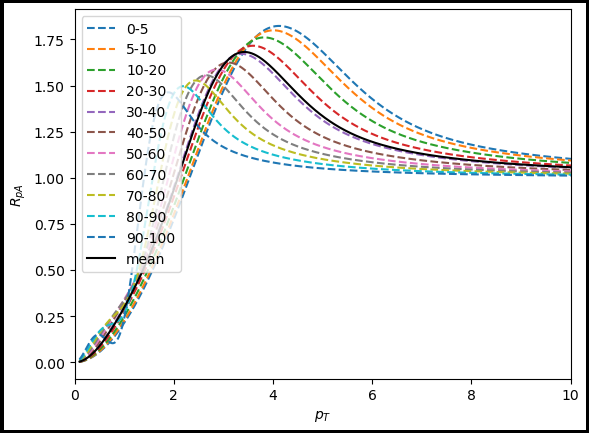

/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2999575189.py:22: RuntimeWarning: invalid value encountered in multiply
  + (1/Q**2)*np.exp(-pt**2/Q**2) * (np.log(Q**4 / (4 * lam**2 * pt**2)) + expi(pt**2 / Q**2))) )


KeyError: 'pt'

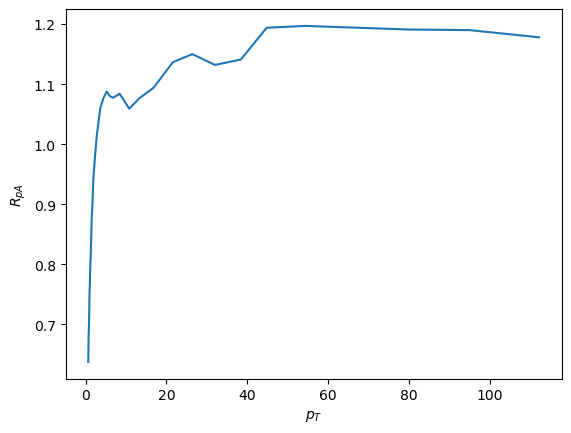

In [ ]:
partons['pt'] = partons['pt_0']

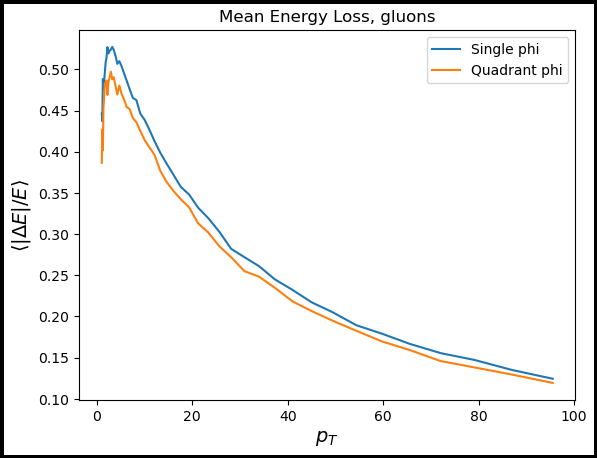

In [21]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Energy Loss, gluons')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask = (np.abs(df['id']) == 21)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_el'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
#fig.savefig('EL_strength_q.png')
    #0603010

In [ ]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| \Delta E \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Energy Loss, light quarks (d, dbar, u, ubar, s, sbar)')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_el'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
#fig.savefig('EL_strength_q.png')
    #0603010

In [ ]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| q_{drift} \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Flow Drift, gluons')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask = (df['id'] == 21)  #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_drift'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0,20)
#fig.savefig('fdrift_strength_g.png')
    #0603010

In [ ]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| q_{drift} \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Flow Drift, light quarks (d, dbar, u, ubar, s, sbar)')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask = (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_drift'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0,20)
#fig.savefig('fdrift_strength_q.png')
    #0603010

ZeroDivisionError: Weights sum to zero, can't be normalized

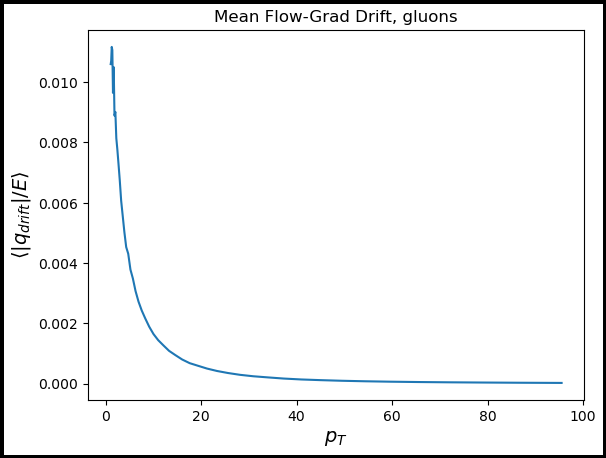

In [17]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| q_{drift} \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Flow-Grad Drift, gluons')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask = (df['id'] == 21)  #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_fg'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0,20)
#fig.savefig('fgdrift_strength_g.png')
    #0603010

In [ ]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$\langle \left| q_{drift} \right| / E \rangle$', fontsize=14)#, rotation=0)
axis.set_title('Mean Flow-Grad Drift,  light quarks (d, dbar, u, ubar, s, sbar)')

pt_bin_edges = np.logspace(0, 2, 50)
pt_bin_centers = (pt_bin_edges[1:] + pt_bin_edges[0:-1])/2

df_list = [partons, partons]
label_list = ['Single phi', 'Quadrant phi']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask =  (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)  #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask
    
    
    
    avg_array = np.array([])
    weight_choice = 'weight'
    for i in np.arange(0, len(pt_bin_centers)):
        # bin data
        pt_min = pt_bin_edges[i]
        pt_max = pt_bin_edges[i+1]
        mask = (df['pt'] > pt_min) & (df['pt'] < pt_max)
    
        # average
        t_mask = p_mask & mask
        avg = np.average(np.abs(df[t_mask]['q_fg'])/(df[t_mask]['pt']), weights=df[t_mask][weight_choice])
        avg_array = np.append(avg_array, avg)
    
    axis.plot(pt_bin_centers, avg_array, label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0,20)
#fig.savefig('fgdrift_strength_q.png')
    #0603010

/tmp/jbahder-tmpdir-GBmWaj/ipykernel_1519208/2539255093.py:1: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  axis.set_xlim(0, 100)


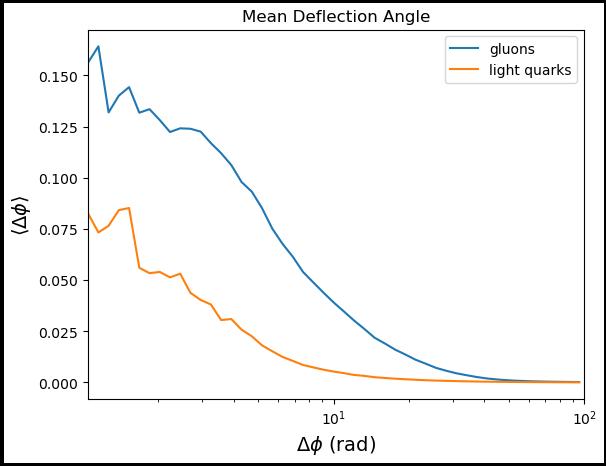

In [37]:
axis.set_xlim(0, 100)
fig

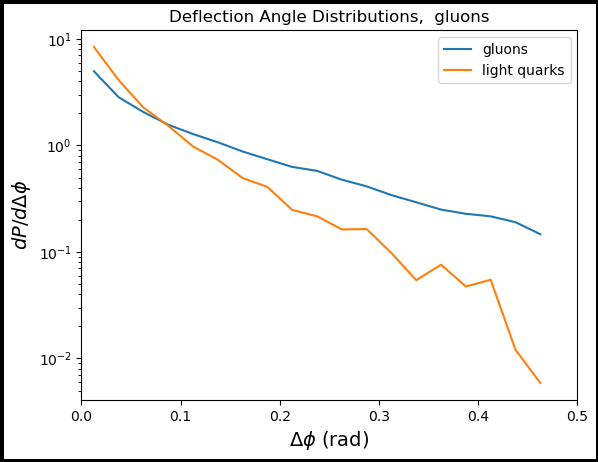

In [35]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$\Delta\phi$ (rad)', fontsize=14)
axis.set_ylabel(r'$dP/d\Delta\phi$', fontsize=14)#, rotation=0)
axis.set_title('Deflection Angle Distributions,  gluons')

phi_bin_edges = np.arange(0, 0.5, 0.025)
phi_bin_centers = (phi_bin_edges[1:] + phi_bin_edges[0:-1])/2
phi_bin_widths = ( phi_bin_edges[1:] - phi_bin_edges[0:-1])

weight_choice = 'pA_weight'

df = partons
label_list = ['gluons', 'light quarks']
for case in label_list:

    if case == 'gluons':
        id_mask =  (df['id'] == 21)
    elif case == 'light quarks':
        id_mask =  (np.abs(df['id'] == 1)) | (np.abs(df['id'] == 2)) | (np.abs(df['id'] == 3)) #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask

    # def diff(angle1, angle2):
    #   res = (angle1-angle2) % 2*np.pi
    #   if res < np.pi:
    #     return res
    #   else:
    #     return (2*np.pi-res)
    counts, bins = np.histogram(np.mod(df[p_mask]['phi_f'] - df[p_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi, weights=df[p_mask][weight_choice],
                               bins=phi_bin_edges)
    
    axis.plot(phi_bin_centers, counts/(phi_bin_widths*np.sum(df[p_mask][weight_choice])), label=case)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 0.5)
axis.set_yscale('log')

#fig.savefig('deflection_g.png')
    #0603010

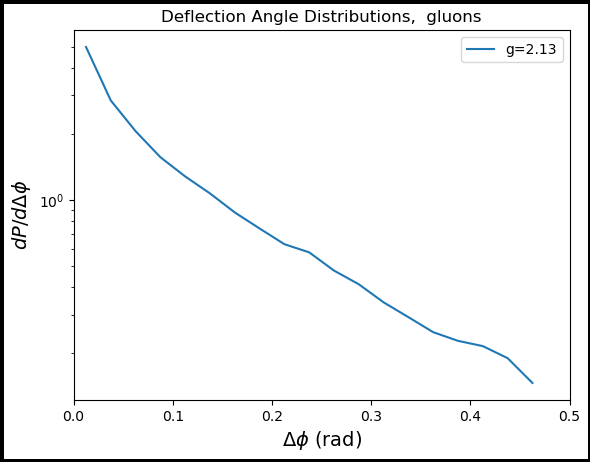

In [27]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$\Delta\phi$ (rad)', fontsize=14)
axis.set_ylabel(r'$dP/d\Delta\phi$', fontsize=14)#, rotation=0)
axis.set_title('Deflection Angle Distributions,  gluons')

phi_bin_edges = np.arange(0, 0.5, 0.025)
phi_bin_centers = (phi_bin_edges[1:] + phi_bin_edges[0:-1])/2
phi_bin_widths = ( phi_bin_edges[1:] - phi_bin_edges[0:-1])

weight_choice = 'pA_weight'

df_list = [partons]
label_list = ['g=2.13']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask =  (df['id'] == 21)  #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask

    # def diff(angle1, angle2):
    #   res = (angle1-angle2) % 2*np.pi
    #   if res < np.pi:
    #     return res
    #   else:
    #     return (2*np.pi-res)
    counts, bins = np.histogram(np.mod(df[p_mask]['phi_f'] - df[p_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi, weights=df[p_mask][weight_choice],
                               bins=phi_bin_edges)
    
    axis.plot(phi_bin_centers, counts/(phi_bin_widths*np.sum(df[p_mask][weight_choice])), label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 0.5)
axis.set_yscale('log')

#fig.savefig('deflection_g.png')
    #0603010

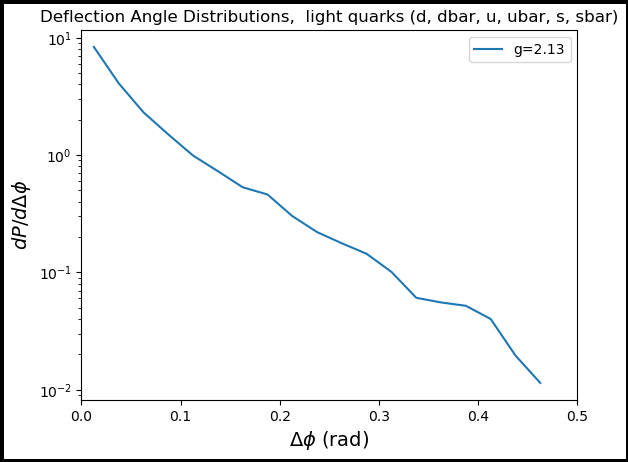

In [28]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$\Delta\phi$ (rad)', fontsize=14)
axis.set_ylabel(r'$dP/d\Delta\phi$', fontsize=14)#, rotation=0)
axis.set_title('Deflection Angle Distributions,  light quarks (d, dbar, u, ubar, s, sbar)')

phi_bin_edges = np.arange(0, 0.5, 0.025)
phi_bin_centers = (phi_bin_edges[1:] + phi_bin_edges[0:-1])/2
phi_bin_widths = ( phi_bin_edges[1:] - phi_bin_edges[0:-1])

weight_choice = 'pA_weight'

df_list = [partons]
label_list = ['g=2.13']
for i in np.arange(0, len(df_list)):
    df = df_list[i]
    label = label_list[i]
    
    id_mask =  (np.abs(df['id']) == 1) | (np.abs(df['id']) == 2) | (np.abs(df['id']) == 3)  #(np.abs(partons['id']) == 1) | (np.abs(partons['id']) == 2) | (np.abs(partons['id']) == 3)
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == True) & id_mask

    # def diff(angle1, angle2):
    #   res = (angle1-angle2) % 2*np.pi
    #   if res < np.pi:
    #     return res
    #   else:
    #     return (2*np.pi-res)
    counts, bins = np.histogram(np.mod(df[p_mask]['phi_f'] - df[p_mask]['phi_0'] + np.pi, 2*np.pi) - np.pi, weights=df[p_mask][weight_choice],
                               bins=phi_bin_edges)
    
    axis.plot(phi_bin_centers, counts/(phi_bin_widths*np.sum(df[p_mask][weight_choice])), label=label)#, marker='+')
#np.savez('mean_energy_loss/g2.5_quarks_EL_deltaE_o_E.npz', pt=pt_bin_centers, el=avg_array)

axis.legend()
axis.set_xlim(0, 0.5)
axis.set_yscale('log')

#fig.savefig('deflection_q.png')
    #0603010

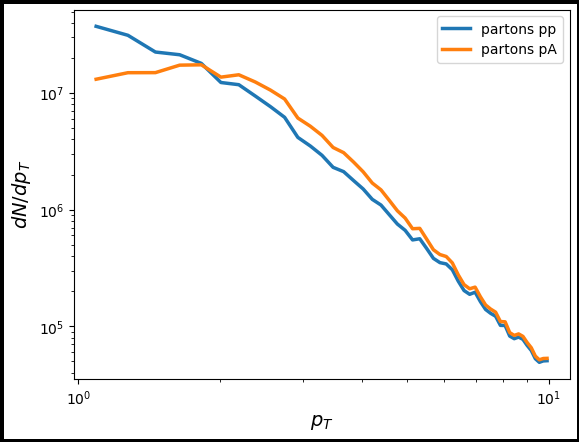

In [31]:
# Plot pion spectra
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$dN/dp_T$', fontsize=14)
axis.set_xscale('log')
axis.set_yscale('log')

# Select Case
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False)

# Bin and plot parton spectra
pt_bins = np.linspace(1, 10, 50)
pt_bin_centers = (pt_bins[0:-1] + pt_bins[1:])/2
pt_bin_widths = (pt_bins[1:] - pt_bins[:-1])
parton_counts_pp, parton_bins_pp = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['weight'], bins=pt_bins)
parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
#parton_counts_AA, parton_bins_AA = np.histogram(partons[p_mask]['pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
axis.plot(pt_bin_centers, parton_counts_pp/pt_bin_widths, label='partons pp', lw=2.5)
axis.plot(pt_bin_centers, parton_counts_pA/pt_bin_widths, label='partons pA', lw=2.5)
#axis.plot(pt_bin_centers, parton_counts_AA/pt_bin_widths, label='part. AA', lw=2.5)

axis.legend()

#fig.savefig('jet_dist.png')

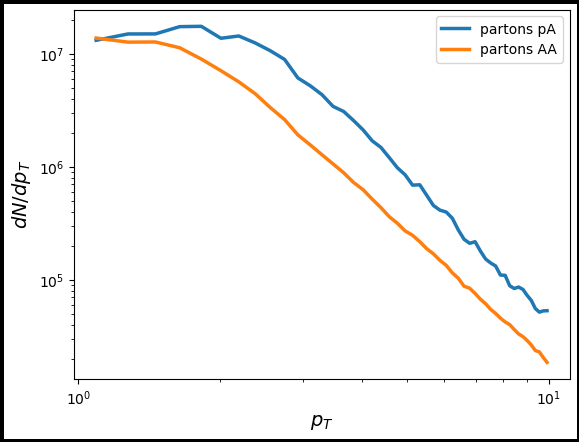

In [32]:
# Plot pion spectra
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$dN/dp_T$', fontsize=14)
axis.set_xscale('log')
axis.set_yscale('log')

# Select Case
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False)

# Bin and plot parton spectra
pt_bins = np.linspace(1, 10, 50)
pt_bin_centers = (pt_bins[0:-1] + pt_bins[1:])/2
pt_bin_widths = (pt_bins[1:] - pt_bins[:-1])
#parton_counts_pp, parton_bins_pp = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['weight'], bins=pt_bins)
parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
parton_counts_AA, parton_bins_AA = np.histogram(partons[p_mask]['pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
#axis.plot(pt_bin_centers, parton_counts_pp/pt_bin_widths, label='partons pp', lw=2.5)
axis.plot(pt_bin_centers, parton_counts_pA/pt_bin_widths, label='partons pA', lw=2.5)
axis.plot(pt_bin_centers, parton_counts_AA/pt_bin_widths, label='partons AA', lw=2.5)

axis.legend()

#fig.savefig('jet_dist_el.png')

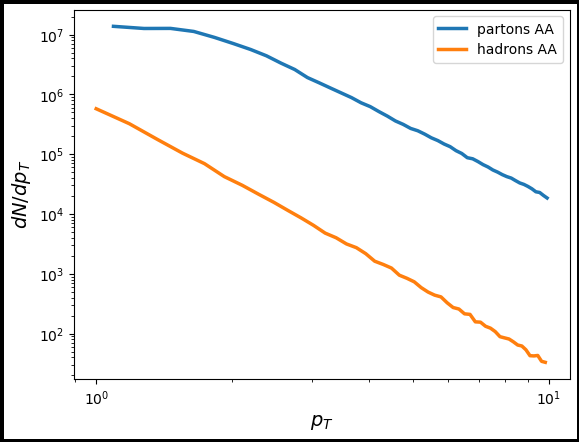

In [33]:
# Plot pion spectra
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$dN/dp_T$', fontsize=14)
axis.set_xscale('log')
axis.set_yscale('log')

# Select Case
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False)

# Bin and plot parton spectra
pt_bins = np.linspace(1, 10, 50)
pt_bin_centers = (pt_bins[0:-1] + pt_bins[1:])/2
pt_bin_widths = (pt_bins[1:] - pt_bins[:-1])
#parton_counts_pp, parton_bins_pp = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['weight'], bins=pt_bins)
#parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
parton_counts_AA, parton_bins_AA = np.histogram(partons[p_mask]['pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
pion_counts_AA, pion_bins_AA = np.histogram(partons[p_mask]['pion_pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)
#axis.plot(pt_bin_centers, parton_counts_pp/pt_bin_widths, label='partons pp', lw=2.5)
#axis.plot(pt_bin_centers, parton_counts_pA/pt_bin_widths, label='partons pA', lw=2.5)
axis.plot(pt_bin_centers, parton_counts_AA/pt_bin_widths, label='partons AA', lw=2.5)
axis.plot(pion_bins_AA[0:-1], pion_counts_AA, label='hadrons AA', lw=2.5)

axis.legend()

#fig.savefig('jet_dist_frag.png')

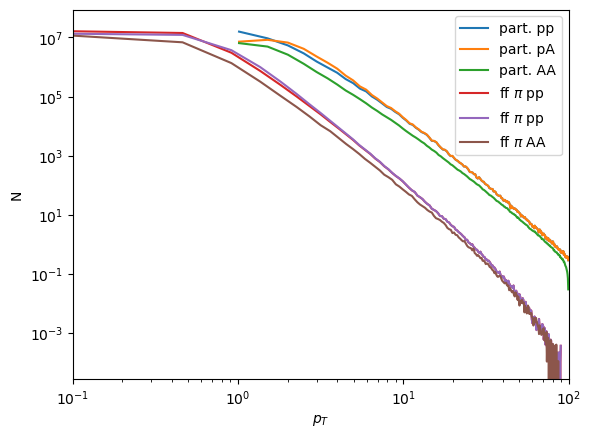

In [34]:


# Plot pion spectra
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel('N')

# Select effect case mask
#h_mask = (hadrons['el'] == True) & (hadrons['drift'] == True) & (hadrons['fg'] == False)  #& (hadrons['grad'] == False)
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False)  #& (partons['grad'] == False)

# Bin and plot parton spectra
parton_counts_pp, parton_bins_pp = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['weight'], bins=200)
parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=parton_bins_pp)
parton_counts_AA, parton_bins_AA = np.histogram(partons[p_mask]['pt_f'], weights=partons[p_mask]['pA_weight'], bins=parton_bins_pp)
axis.plot(parton_bins_pp[0:-1], parton_counts_pp, label='part. pp')
axis.plot(parton_bins_pA[0:-1], parton_counts_pA, label='part. pA')
axis.plot(parton_bins_AA[0:-1], parton_counts_AA, label='part. AA')

# Bin and plot FF pion spectra
pion_counts_pp, pion_bins_pp = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['weight'], bins=200)
pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
pion_counts_AA, pion_bins_AA = np.histogram(partons[p_mask]['pion_pt_f'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
axis.plot(pion_bins_pp[0:-1], pion_counts_pp, label=r'ff $\pi$ pp')
axis.plot(pion_bins_pA[0:-1], pion_counts_pA, label=r'ff $\pi$ pp')
axis.plot(pion_bins_AA[0:-1], pion_counts_AA, label='ff $\pi$ AA')

# # Bin and plot Lund-String pion spectra
# ls_pion_counts_pp, ls_pion_bins_pp = np.histogram(pp_hadrons['pt'], weights=pp_hadrons['weight']/pp_hadrons['num_hrz'], bins=200)
# ls_pion_counts_pA, ls_pion_bins_pA = np.histogram(pp_hadrons['pt'], weights=pp_hadrons['pA_weight']/pp_hadrons['num_hrz'], bins=ls_pion_bins_pp)
# ls_pion_counts_AA, ls_pion_bins_AA = np.histogram(hadrons[h_mask]['pt'], weights=hadrons[h_mask]['pA_weight']/hadrons[h_mask]['num_hrz'], bins=ls_pion_bins_pp)
# axis.plot(ls_pion_bins_pp[0:-1], ls_pion_counts_pp, label=r'ls $\pi$ pp')
# axis.plot(ls_pion_bins_pA[0:-1], ls_pion_counts_pA, label=r'ls $\pi$ pp')
# axis.plot(ls_pion_bins_AA[0:-1], ls_pion_counts_AA, label='ls $\pi$ AA')






axis.set_xlim(0.1, 100)
axis.set_xscale('log')
axis.set_yscale('log')
axis.legend()

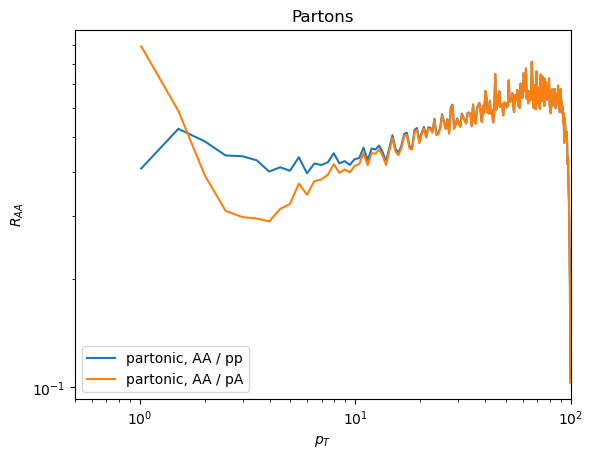

In [35]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_title(r'Partons')

parton_aa_pp = parton_counts_AA / parton_counts_pp
parton_aa_pa = parton_counts_AA / parton_counts_pA
axis.plot(parton_bins_pp[0:-1], parton_aa_pp, label='partonic, AA / pp')
axis.plot(parton_bins_pp[0:-1], parton_aa_pa, label='partonic, AA / pA')
axis.set_xscale('log')
axis.set_yscale('log')
axis.set_xlim(0.5, 100)
#axis.set_ylim(0.35, 1.5)
axis.legend()

/tmp/jbahder-tmpdir-xlZRyg/ipykernel_660722/3162366429.py:6: RuntimeWarning: divide by zero encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-xlZRyg/ipykernel_660722/3162366429.py:6: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-xlZRyg/ipykernel_660722/3162366429.py:7: RuntimeWarning: divide by zero encountered in divide
  pion_aa_pA = pion_counts_AA.astype(np.float64) / pion_counts_pA.astype(np.float64)
/tmp/jbahder-tmpdir-xlZRyg/ipykernel_660722/3162366429.py:7: RuntimeWarning: invalid value encountered in divide
  pion_aa_pA = pion_counts_AA.astype(np.float64) / pion_counts_pA.astype(np.float64)


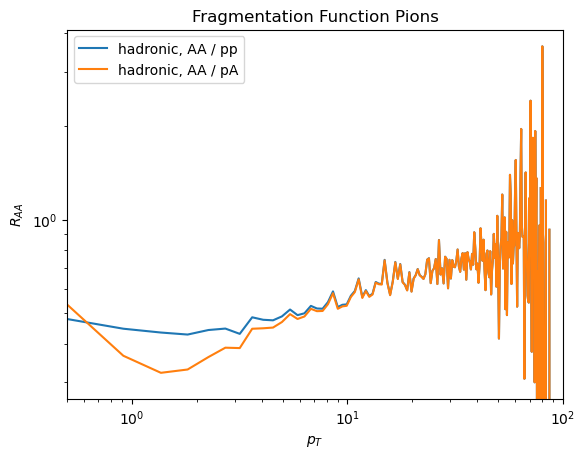

In [36]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_title(r'Fragmentation Function Pions')

pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
pion_aa_pA = pion_counts_AA.astype(np.float64) / pion_counts_pA.astype(np.float64)
axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='hadronic, AA / pp')
axis.plot(pion_bins_pp[0:-1], pion_aa_pA, label='hadronic, AA / pA')
axis.set_xscale('log')
axis.set_yscale('log')
axis.set_xlim(0.5, 100)
#axis.set_ylim(0.5, 1.5)
axis.legend()

/tmp/jbahder-tmpdir-xlZRyg/ipykernel_660722/2355181159.py:23: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)


(0.0, 1.1)

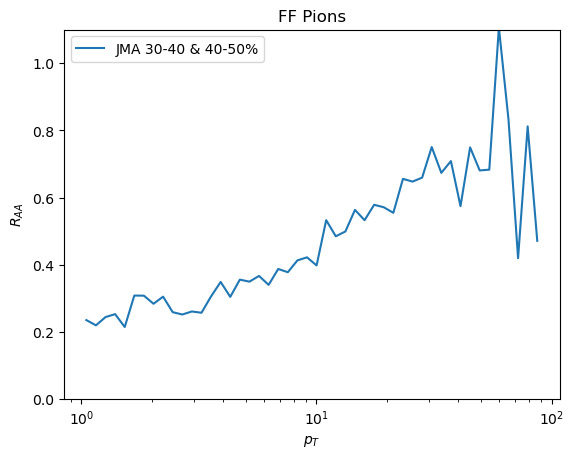

In [37]:
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$R_{AA}$')
axis.set_title(r'FF Pions')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
cent1 = '30-40'
cent2 = '40-50'

# Make centrality cut
p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & ((partons['cent'] == cent1) | (partons['cent'] == cent2))

# Select bins
save_pt_bins = np.logspace(start=0, stop=2, num = 50)

# Bin pions
pion_counts_pp, pion_bins_pp = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['weight'], bins=save_pt_bins)
#pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
pion_counts_AA, pion_bins_AA = np.histogram(partons[p_mask]['pion_pt_f'], weights=partons[p_mask]['pA_weight'], bins=save_pt_bins)

# Compute R_AA
# Using np.float64 type yields nans for division by zero.
pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

# # Get ALICE R_AA
# alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
# alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

# Get bin centers
bin_centers = (pion_bins_pp[:-1] + pion_bins_pp[1:]) / 2

# Plot
axis.plot(bin_centers, pion_aa_pp, label='JMA {} & {}%'.format(cent1, cent2), color=colors[i])
axis.set_xscale('log')
# axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
i += 1

axis.legend()
axis.set_ylim(0, 1.1)

#np.savetxt('30-50_data_log/data_g2.5_jma_pions.csv', np.stack((bin_centers, pion_aa_pp), axis=-1))

(0.0, 20.0)

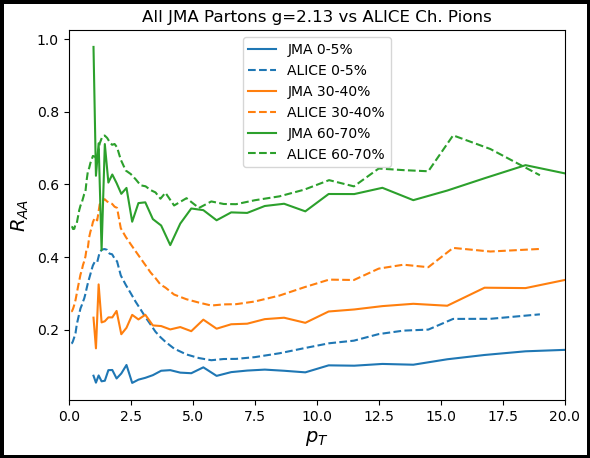

In [11]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'All JMA Partons g=2.13 vs ALICE Ch. Pions')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['cent'] == cent)

    # Bin partons
    parton_counts_pp, parton_bins_pp = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['weight'], bins=pt_bins)
    #parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=parton_bins_pp)
    parton_counts_AA, parton_bins_AA = np.histogram(partons[p_mask]['pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    parton_aa_pp = parton_counts_AA.astype(np.float64) / parton_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(parton_bins_pp[0:-1], parton_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_xlim(0, 20)
#fig.savefig('raa_partons_g2.png')

(0.0, 20.0)

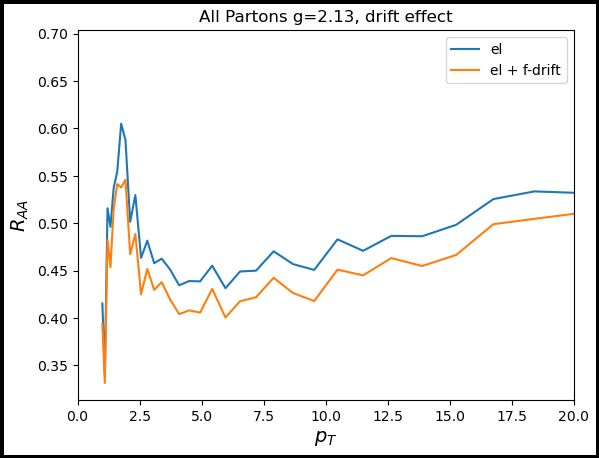

In [40]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'All Partons g=2.13, drift effect')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
df = partons
for case in ['el', 'el + f-drift']:#, 'el+ f-drift + fg-drift']:  #cent_bins:
    # Make centrality cut
    if case == 'el':
        p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
    elif case == 'el + f-drift':
        p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)
    elif case == 'el + f-drift + fg-drift':
        p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)

    # Bin partons
    parton_counts_pp, parton_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
    #parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=parton_bins_pp)
    parton_counts_AA, parton_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    parton_aa_pp = parton_counts_AA.astype(np.float64) / parton_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    #alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    #alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(parton_bins_pp[0:-1], parton_aa_pp, label=case, color=colors[i])
    #axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_xlim(0, 20)
#fig.savefig('raa_partons_g2.2_drift_effect.png')

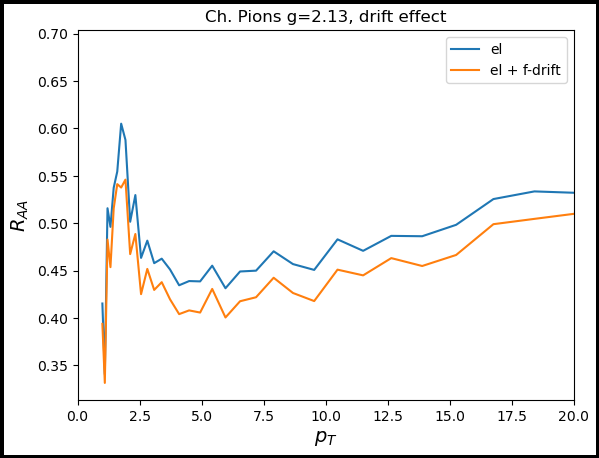

In [41]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'Ch. Pions g=2.13, drift effect')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
df = partons
for case in ['el', 'el + f-drift']:#, 'el+ f-drift + fg-drift']:  #cent_bins:
    # Make centrality cut
    if case == 'el':
        p_mask = (df['el'] == True) & (df['drift'] == False) & (df['fg'] == False)
    elif case == 'el + f-drift':
        p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)
    elif case == 'el + f-drift + fg-drift':
        p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False)

    # Bin partons
    parton_counts_pp, parton_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
    #parton_counts_pA, parton_bins_pA = np.histogram(partons[p_mask]['pt'], weights=partons[p_mask]['pA_weight'], bins=parton_bins_pp)
    parton_counts_AA, parton_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    parton_aa_pp = parton_counts_AA.astype(np.float64) / parton_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    #alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    #alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(parton_bins_pp[0:-1], parton_aa_pp, label=case, color=colors[i])
    #axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_xlim(0, 20)
#fig.savefig('raa_hadrons_g2.2_drift_effect.png')

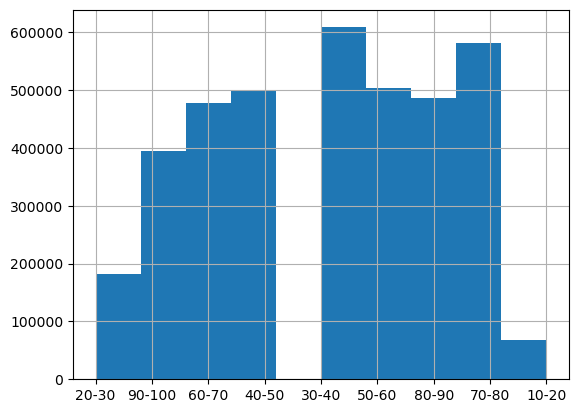

In [48]:
partons['cent'].hist()

(0.0, 20.0)

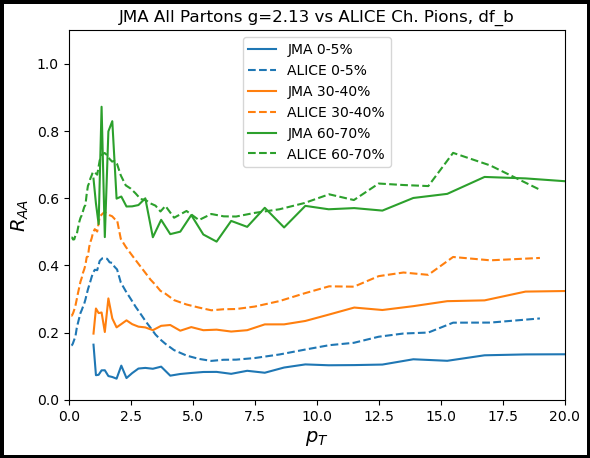

In [272]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA All Partons g=2.13 vs ALICE Ch. Pions, df_b')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
df = partons
for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pt'], weights=df[p_mask]['weight'], bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_ylim(0, 1.1)
axis.set_xlim(0, 20)
#fig.savefig('raa_hadrons_g2.png')

/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2892808031.py:19: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2892808031.py:19: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)


(0.0, 20.0)

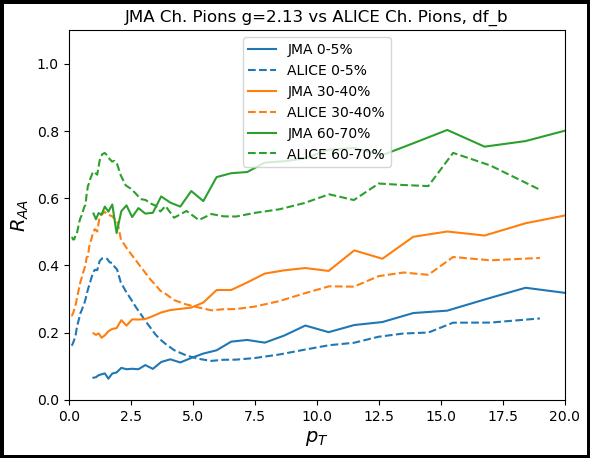

In [296]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Pions g=2.13 vs ALICE Ch. Pions, df_b')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
df = partons
for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pion_pt'], weights=df[p_mask]['weight'], bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pion_pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_ylim(0, 1.1)
axis.set_xlim(0, 20)
#fig.savefig('raa_hadrons_g2.png')

/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2754057960.py:19: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-GZtNSw/ipykernel_3363684/2754057960.py:19: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)


(0.0, 20.0)

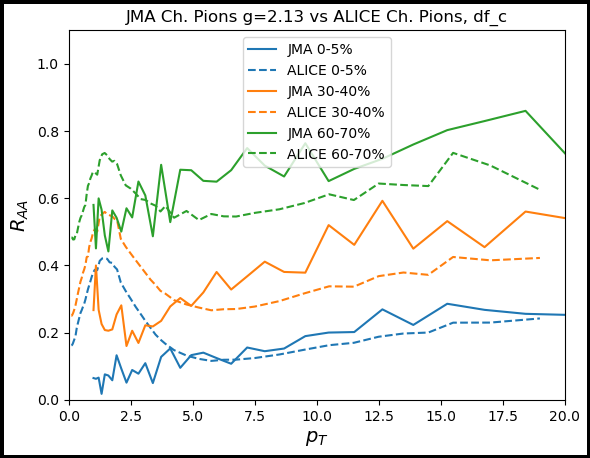

In [17]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Pions g=2.13 vs ALICE Ch. Pions, df_c')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
df = partons_c
for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (df['el'] == True) & (df['drift'] == True) & (df['fg'] == False) & (df['cent'] == cent)

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(df[p_mask]['pion_pt'], weights=df[p_mask]['weight'], bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(df[p_mask]['pion_pt_f'], weights=df[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_ylim(0, 1.1)
axis.set_xlim(0, 20)
#fig.savefig('raa_hadrons_g2.png')

/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/1747566035.py:18: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/1747566035.py:18: RuntimeWarning: divide by zero encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/1747566035.py:18: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/1747566035.py:18: RuntimeWarning: divide by zero encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/1747566035.py:18: RuntimeWarning: invalid value encountered in divide
  pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64

(0.0, 20.0)

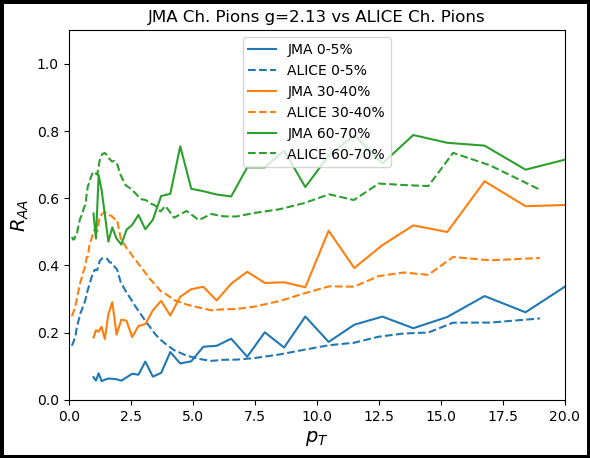

In [297]:
fig, axis = plt.subplots(linewidth=5, edgecolor='black')
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$R_{AA}$', fontsize=14)
axis.set_title(r'JMA Ch. Pions g=2.13 vs ALICE Ch. Pions')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
i = 0
pt_bins = np.logspace(start=0, stop=2, num = 50)
for cent in ['0-5', '30-40', '60-70']:  #cent_bins:
    # Make centrality cut
    p_mask = (partons['el'] == True) & (partons['drift'] == True) & (partons['fg'] == False) & (partons['cent'] == cent)

    # Bin pions
    pion_counts_pp, pion_bins_pp = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['weight'], bins=pt_bins)
    #pion_counts_pA, pion_bins_pA = np.histogram(partons[p_mask]['pion_pt'], weights=partons[p_mask]['pA_weight'], bins=pion_bins_pp)
    pion_counts_AA, pion_bins_AA = np.histogram(partons[p_mask]['pion_pt_f'], weights=partons[p_mask]['pA_weight'], bins=pt_bins)

    # Compute R_AA
    pion_aa_pp = pion_counts_AA.astype(np.float64) / pion_counts_pp.astype(np.float64)

    # Get ALICE R_AA
    alice_raa_pt_array = RAA_data[RAA_data['cent'] == cent]['pt'].to_numpy()
    alice_raa_RAA_array = RAA_data[RAA_data['cent'] == cent]['RAA'].to_numpy()

    # Plot
    axis.plot(pion_bins_pp[0:-1], pion_aa_pp, label='JMA {}%'.format(cent), color=colors[i])
    axis.plot(alice_raa_pt_array, alice_raa_RAA_array, label='ALICE {}%'.format(cent), linestyle='--', color=colors[i])
    i += 1

axis.legend()
axis.set_ylim(0, 1.1)
axis.set_xlim(0, 20)
#fig.savefig('raa_hadrons_g2.png')

In [269]:
# Load CMS v2 of charged particles

v2_0_5_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_5_10_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_10_20_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_20_30_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_30_40_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_40_50_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'
v2_50_60_file_path = '/media/jo/Elements/jo_jma/exp_data/LHC_PbPb_5.02TeV_v2_HEPData-ins1511868-v1-csv/'




In [60]:
partons.columns

Index(['process', 'pt', 'pt_f', 'weight', 'ncoll', 'mult', 'z', 'pp_z', 'el',
       'drift', 'fg', 'phi_0', 'phi_f', 'psi_2', 'v_2', 'id', 'q_el',
       'q_drift', 'q_fg', 'e2', 'Tmax_event', 'b', 'rmax', 'time_total_plasma',
       'cent', 'pA_weight', 'exp_pA_weight', 'pion_pt_f', 'pion_pt',
       'fix_phi_0', 'fix_phi_f'],
      dtype='object')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


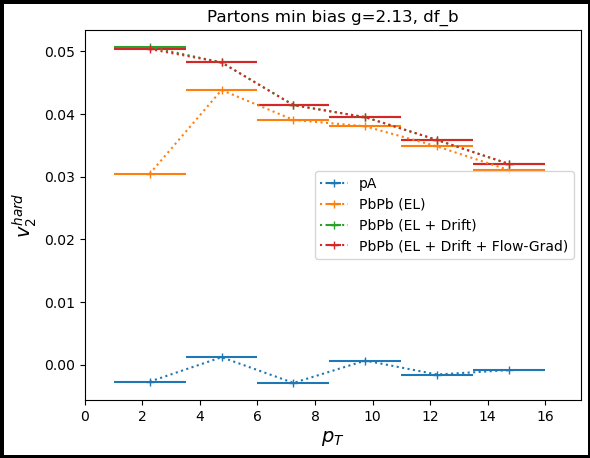

In [275]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Partons min bias g=2.13, df_b')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2



# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)    
        angles_run = 11
        p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        # p_mask = p_mask & (total['jetNo'] == 0)
        # p_mask = p_mask & ((np.abs(total['id']) == 1) | (np.abs(total['id']) == 2) | (np.abs(total['id']) == 3))
        
        
        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  # np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


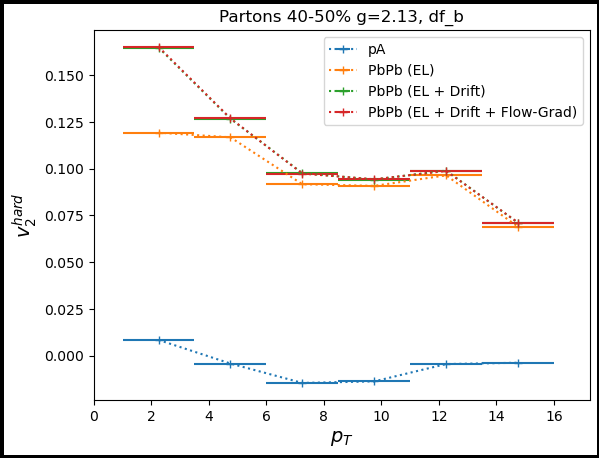

In [277]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)


cent_choice = '40-50'
axis.set_title('Partons {}% g=2.13, df_b'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2



# Create pt bins
pt_res = 2.5
num_pt_points = int(15/pt_res)
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False)

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'fix_phi_f'
            pt_series = 'pt_f'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pA':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'pA_weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)
            
        elif case == 'pp':
            phi_series = 'fix_phi_0'
            pt_series = 'pt'
            weight_choice = 'weight'
            case_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True)


        p_mask = case_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)            
        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        
        comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
        comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, phi_series]) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  # np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

In [53]:
imag_harm

0.0

In [80]:
(partons['phi_0']/(2*np.pi)).max()

0.9999949246487747

In [95]:
np.mod(2.0000000000000000000000001*np.pi+np.pi, 2*np.pi)

3.141592653589793

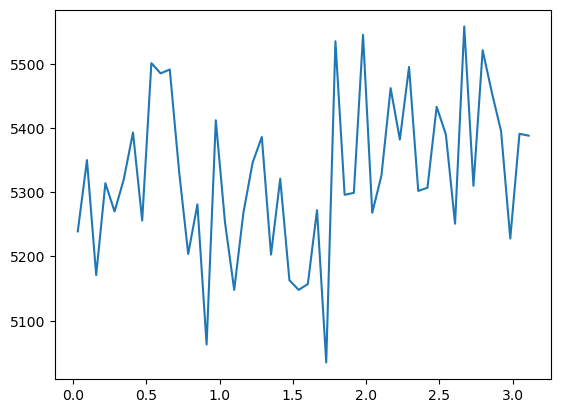

In [107]:
df = partons

counts_lt_pi, bins_lt_pi = np.histogram(df[df['phi_0'] < np.pi]['phi_0'], bins=50)
counts_gt_pi, bins_gt_pi = np.histogram(np.mod(df[df['phi_0'] >= np.pi]['phi_0'], np.pi), bins=bins_lt_pi)
overlap = counts_lt_pi - counts_gt_pi
plt.plot(((bins_lt_pi[0:-1] + bins_lt_pi[1:])/2), counts_gt_pi)

In [88]:
counts_gt_pi

array([57, 69, 48, ..., 36, 45, 54])

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


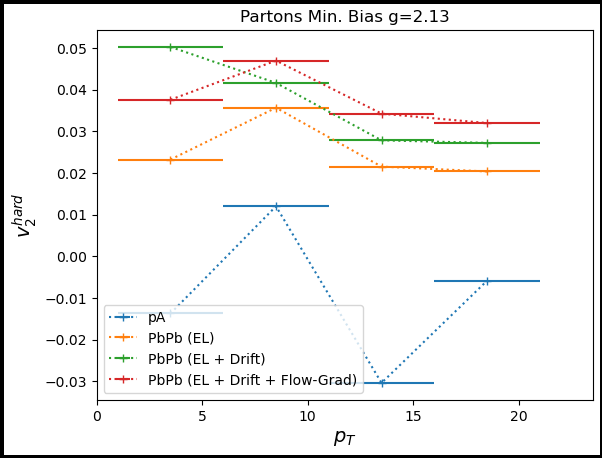

In [46]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Partons Min. Bias g=2.13')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & ((total['cent'] == '10-20'))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


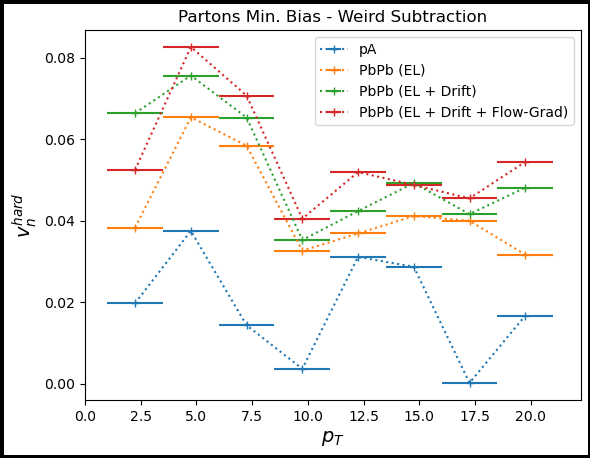

In [51]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_n^{hard}$', fontsize=14)
axis.set_title('Partons Min. Bias - Weird Subtraction')


total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2

weight_choice = 'pA_weight'

# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        if case == 'pA':
            # Get real and imaginary parts
            real_harm = np.real(comp_harm)
            imag_harm = np.imag(comp_harm)
            real_baseline = real_harm
            imag_baseline = imag_harm
        else:
            # Get real and imaginary parts
            real_harm = np.real(comp_harm) - real_baseline
            imag_harm = np.imag(comp_harm) - imag_baseline

        # if case != 'pA':
        #     # Get real and imaginary parts
        #     real_harm = np.real(comp_harm)
        #     imag_harm = np.imag(comp_harm)

        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


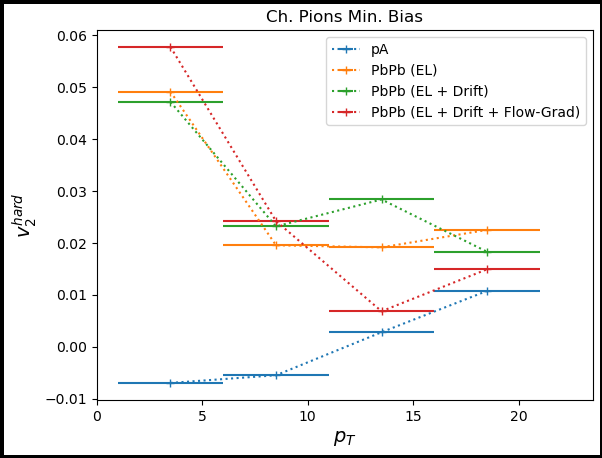

In [276]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Ch. Pions Min. Bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & (total['jetNo'] == 1)
        # angles_run = 1
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


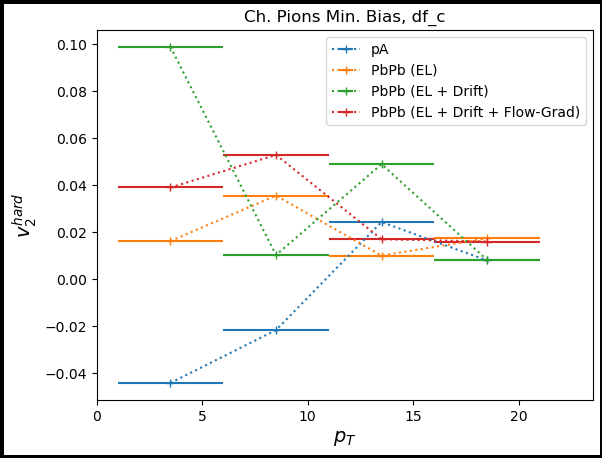

In [20]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Ch. Pions Min. Bias, df_c')



total = partons_c
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & (total['jetNo'] == 1)
        # angles_run = 1
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

In [ ]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Ch. Pions Min. Bias, df_b + df_c')



total = pd.concat([partons, partons_c], axis=0)
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        #p_mask = p_mask & (total['jetNo'] == 1)
        # angles_run = 1
        # p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

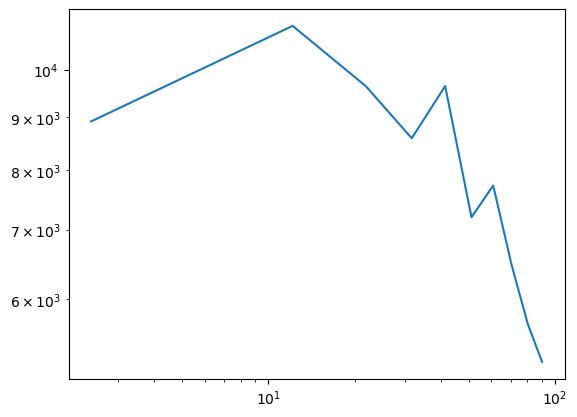

In [290]:
counts, bins = np.histogram(partons_c['pt'])#, weights=partons_c['pA_weight'])
plt.plot(bins[0:-1], counts)
plt.xscale('log')
plt.yscale('log')

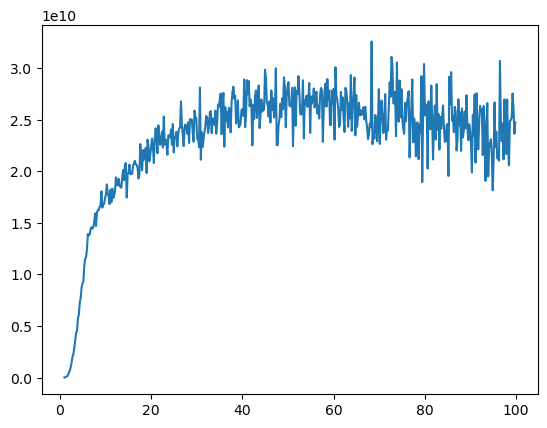

In [182]:
counts, bins = np.histogram(partons['pt'], bins=500, weights=partons['pA_weight'])
plt.plot(bins[0:-1], counts*bins[0:-1]**(5))

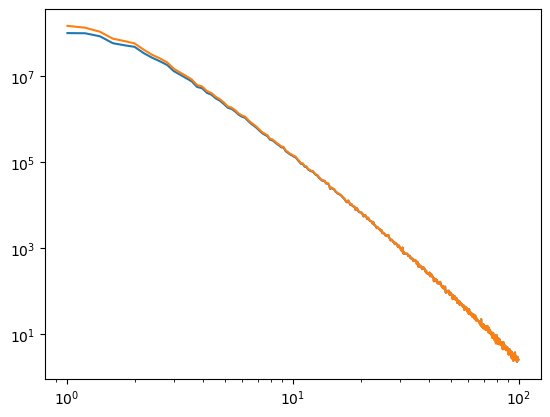

In [218]:
counts, bins = np.histogram(partons['pt'], bins=500, weights=partons['weight'])
pt_ref = 10
pow = 4

counts_raw, bins_raw = np.histogram(partons['pt'], bins=bins)
#counts_new, bins_new = np.histogram(partons['pt'], bins=bins)

fig, axis = plt.subplots()
axis.plot(bins[0:-1], counts)
axis.plot(bins_raw[0:-1], counts_raw*(bins[0:-1]/pt_ref)**(-4))
axis.set_xscale('log')
axis.set_yscale('log')

(0.0, 100.0)

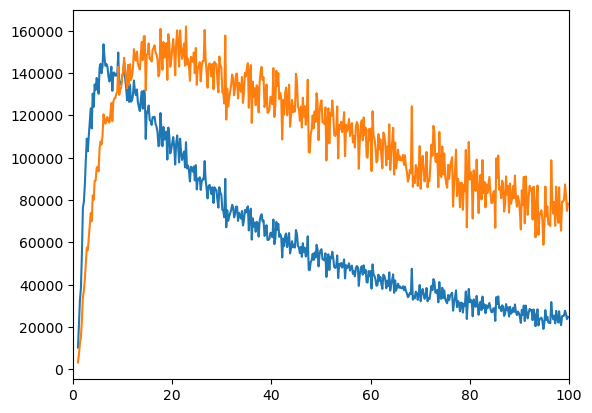

In [248]:
counts, bins = np.histogram(partons['pt'], bins=500, weights=partons['weight'])
pt_ref = 10
pow = 4.5

counts_raw, bins_raw = np.histogram(partons['pt'], bins=bins)
#counts_new, bins_new = np.histogram(partons['pt'], bins=bins)

fig, axis = plt.subplots()
axis.plot(bins[0:-1], counts*(bins[0:-1]/10)**(4))
axis.plot(bins[0:-1], counts*(bins[0:-1]/pt_ref)**(pow))

#axis.set_xscale('log')
#axis.set_yscale('log')
axis.set_xlim(0,100)

/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2191019429.py:2: RuntimeWarning: divide by zero encountered in divide
  plt.plot(pt, (1/(pt**4))*(pt/pt_ref)**(pow))
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2191019429.py:2: RuntimeWarning: invalid value encountered in multiply
  plt.plot(pt, (1/(pt**4))*(pt/pt_ref)**(pow))


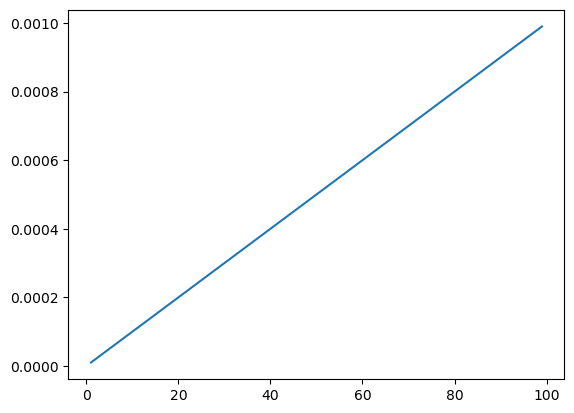

In [233]:
pt = np.arange(0,100)
plt.plot(pt, (1/(pt**4))*(pt/pt_ref)**(pow))

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


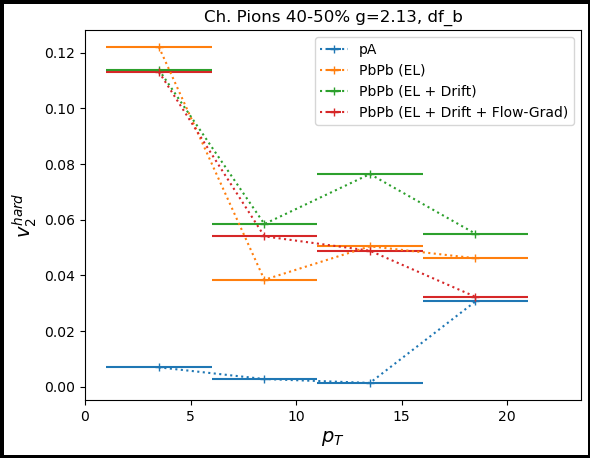

In [278]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)

cent_choice = '40-50'
axis.set_title('Ch. Pions {}% g=2.13, df_b'.format(cent_choice))



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2323407830.py:75: RuntimeWarning: invalid value encountered in scalar divide
  comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2323407830.py:76: RuntimeWarning: invalid value encountered in scalar divide
  comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2323407830.py:75: RuntimeWarning: invalid value encountered in scalar divide
  comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/2323407830.py:76: RuntimeWarning: invalid value encountered in scalar divide
  comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fi

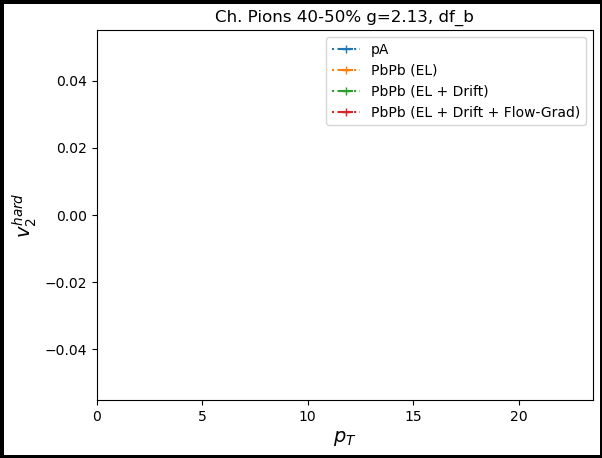

In [291]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)

cent_choice = '40-50'
axis.set_title('Ch. Pions {}% g=2.13, df_b'.format(cent_choice))



total = partons_c
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 5
num_pt_points = 4
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        p_mask = p_mask & (total['cent'] == cent_choice)
        #p_mask = p_mask & ((total['process_run'] == 0) | (total['process_run'] == 1) | (total['process_run'] == 2))
        
        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

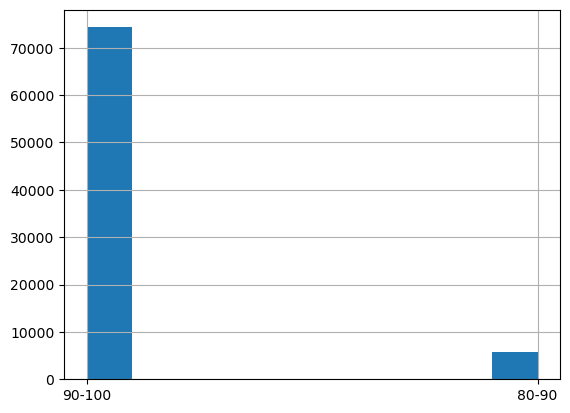

In [293]:
partons_c['cent'].hist()

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


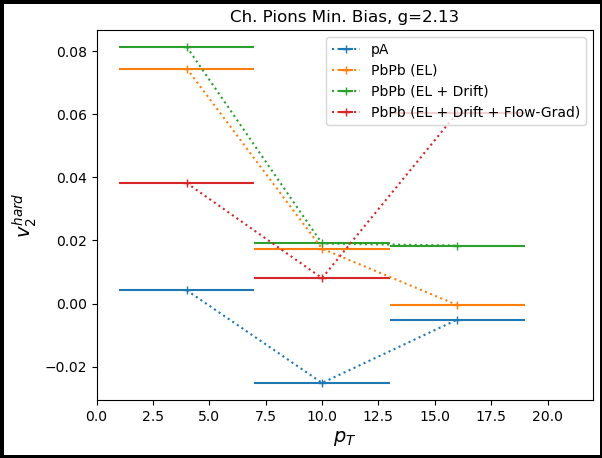

In [34]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_2^{hard}$', fontsize=14)
axis.set_title('Ch. Pions Min. Bias, g=2.13')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2
weight_choice = 'pA_weight'

# Create pt bins
pt_res = 6
num_pt_points = 3
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pA':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])
            comp_harm_n = np.sum(np.exp(-1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, weight_choice]) / np.sum(total.loc[p_mask, weight_choice])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = real_harm  #np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons_g2.png')

Computing harmonics for pp
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


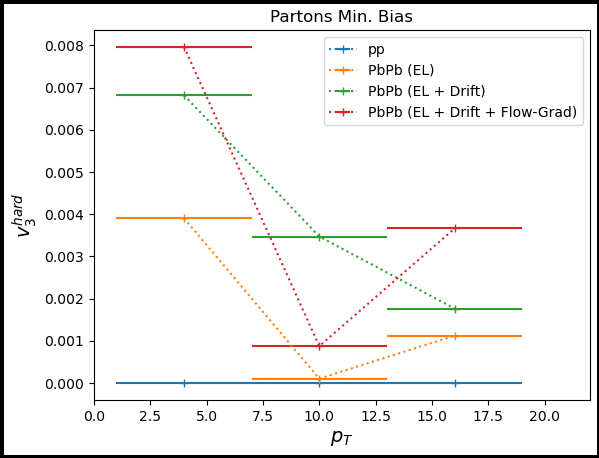

In [46]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_3^{hard}$', fontsize=14)
axis.set_title('Partons Min. Bias')

partons['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
partons['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)

total = partons
n = 3

# Create pt bins
pt_res = 6
num_pt_points = 3
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pp', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pp':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])
            comp_harm_n = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])
            comp_harm_n = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
        
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_partons.png')

Computing harmonics for pp
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


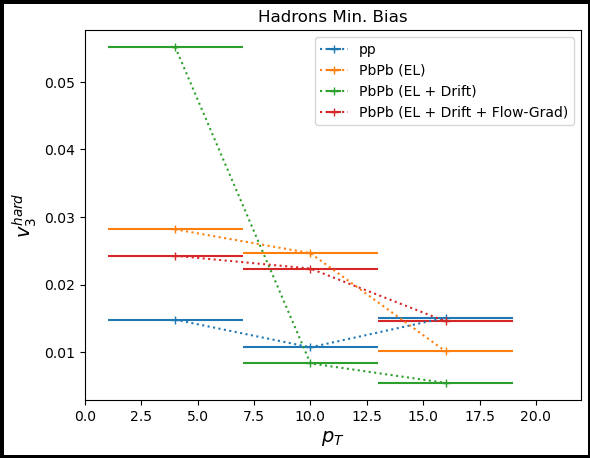

In [47]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$', fontsize=14)
axis.set_ylabel(r'$v_3^{hard}$', fontsize=14)
axis.set_title('Hadrons Min. Bias')

partons['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
partons['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)

total = partons
n = 3

# Create pt bins
pt_res = 6
num_pt_points = 3
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins

axis.set_xlim(0, pt_domain[-1]+pt_res)

for case in np.array(['pp', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pp':
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])
            comp_harm_n =  np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_f']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])

        else:
            comp_harm_p = np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])
            comp_harm_n =  np.sum(np.exp(1j * n * total.loc[p_mask, 'fix_phi_0']) * total.loc[p_mask, 'pA_weight']) / np.sum(total.loc[p_mask, 'pA_weight'])

        # Get bin centers
        #phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm = comp_harm_p + comp_harm_n

        
        # Get real and imaginary parts
        real_harm = np.real(comp_harm)
        imag_harm = np.imag(comp_harm)
    
        # Compute magnitude
        mean_harm = np.sqrt((real_harm)**2 + (imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()
#fig.savefig('v2_hadrons.png')

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


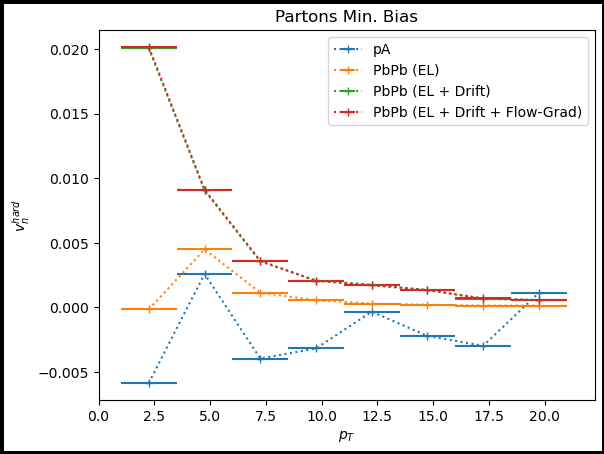

In [55]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$v_n^{hard}$')
axis.set_title('Partons Min. Bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2


# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins
phi_res = 0.25
num_phi = int(np.ceil(2*np.pi/phi_res))

axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pA':
            p_mask = p_mask #& ((total['cent'] == '20-30') | (total['cent'] == '30-40') | (total['cent'] == '40-50'))
            # Compute R_AA(phi) for this pt bin:
            counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'weight'], bins=num_phi)
            counts_f, bins_f = np.histogram(np.mod(total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=phi_bins)
            RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.

        else:
            counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=num_phi)
            RAA = counts_i

        # Get bin centers
        phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # sum real and imaginary parts separately
        mean_real_harm = np.sum(real_harm_array)
        mean_imag_harm = np.sum(imag_harm_array)
    
        # Compute magnitude
        mean_harm = mean_real_harm#np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


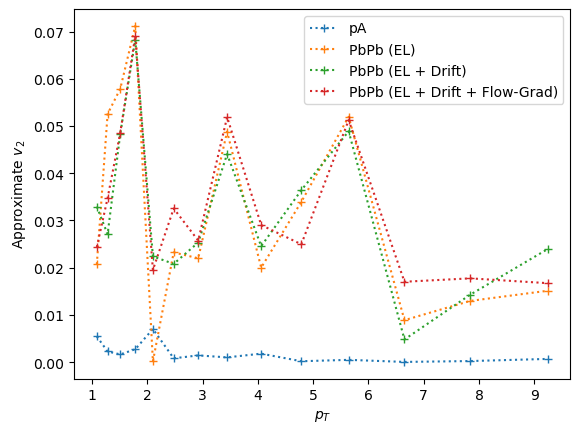

In [20]:
# Compute simple v2 approximation
fig, axis = plt.subplots()
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'Approximate $v_{2}$')

pt_bins = np.logspace(start=0, stop=1, num = 10)
pt_bin_centers = (pt_bins[:-1] + pt_bins[1:])/2
df_list = [partons]


label_list = ['fixed', 'fxy']
for i in np.arange(0, len(df_list)):
    df = df_list[i]

    
    df['fix_phi_0'] = np.mod(df['phi_0'] - df['psi_2'], 2*np.pi)
    df['fix_phi_f'] = np.mod(df['phi_f'] - df['psi_2'], 2*np.pi)

    for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
        print('Computing harmonics for {}'.format(case))
        
    
        
    
        if case == 'PbPb (EL)':
            # phi_series = 'phi_f'
            # pt_series = 'pion_pt_f'
            p_mask = (df['drift'] == False) & (df['el'] == True) & (df['fg'] == False)# & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            # phi_series = 'phi_f'
            # pt_series = 'pion_pt_f'
            p_mask = (df['drift'] == True) & (df['el'] == True) & (df['fg'] == False)# & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
    
        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            # phi_series = 'phi_f'
            # pt_series = 'pion_pt_f'
            p_mask = (df['drift'] == True) & (df['el'] == True) & (df['fg'] == True)# & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            # phi_series = 'phi_0'
            # pt_series = 'pion_pt'
            p_mask = (df['drift'] == True) & (df['el'] == True) & (df['fg'] == True)# & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        angles_run = 1
        p_mask = p_mask & (df['process_run'] <= (3*angles_run - 1))
        mask_0 = (df['fix_phi_f'] < 0 + 0.01) | (df['fix_phi_f'] > 2*np.pi - 0.01) & p_mask
        mask_hpi = (df['fix_phi_f'] < np.pi/2 + 0.01) | (df['fix_phi_f'] > np.pi/2 - 0.01) & p_mask
        
        if case != 'pA':
            # Bin pp and AA counts at 0
            counts_f, bins_f = np.histogram(df[mask_0]['pion_pt_f'], weights=df[mask_0]['pA_weight'], bins=pt_bins)
            counts_0, bins_0 = np.histogram(df[mask_0]['pion_pt'], weights=df[mask_0]['weight'],bins=pt_bins)
    
            # Bin pp and AA counts at pi/2
            counts_hpi_f, bins_hpi_f = np.histogram(df[mask_hpi]['pion_pt_f'], weights=df[mask_hpi]['pA_weight'], bins=pt_bins)
            counts_hpi_0, bins_hpi_0 = np.histogram(df[mask_hpi]['pion_pt'], weights=df[mask_hpi]['weight'],bins=pt_bins)
        else:
            # Bin pp and AA counts at 0
            counts_f, bins_f = np.histogram(df[mask_0]['pion_pt'], weights=df[mask_0]['pA_weight'], bins=pt_bins)
            counts_0, bins_0 = np.histogram(df[mask_0]['pion_pt'], weights=df[mask_0]['weight'],bins=pt_bins)
    
            # Bin pp and AA counts at pi/2
            counts_hpi_f, bins_hpi_f = np.histogram(df[mask_hpi]['pion_pt'], weights=df[mask_hpi]['pA_weight'], bins=pt_bins)
            counts_hpi_0, bins_hpi_0 = np.histogram(df[mask_hpi]['pion_pt'], weights=df[mask_hpi]['weight'],bins=pt_bins)
    
        # Compute R_AA at each phi
        raa_0 = counts_f.astype(np.float64) / counts_0.astype(np.float64)
        raa_hpi = counts_hpi_f.astype(np.float64) / counts_hpi_0.astype(np.float64)
    
        # Compute v2 approx.
        v2 = np.abs(0.5*(raa_0 - raa_hpi) / (raa_hpi + raa_0))
    
        # Plot
        axis.plot(pt_bin_centers, v2, label=case, marker='+', ls=':')

axis.legend()
#axis.set_xlim(0,10)
#axis.set_ylim(-0.01,0.3)

Computing harmonics for pA
Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


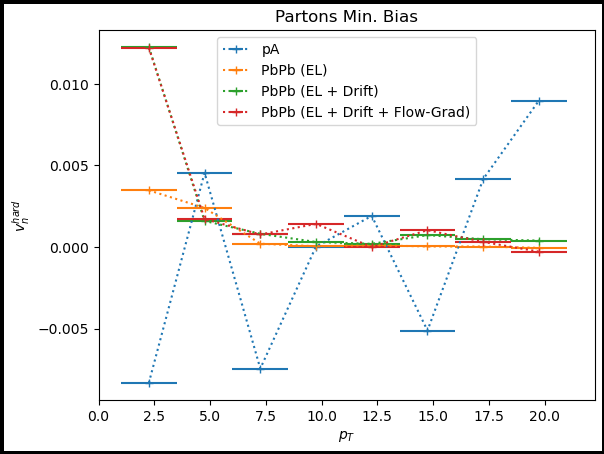

In [54]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$v_n^{hard}$')
axis.set_title('Hadrons Min. Bias')



total = partons
total['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
total['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)
n = 2


# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins
phi_res = 0.1
num_phi = int(np.ceil(2*np.pi/phi_res))

axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pA', 'PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pA':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pA':
            p_mask = p_mask #& ((total['cent'] == '20-30') | (total['cent'] == '30-40') | (total['cent'] == '40-50'))
            # Compute R_AA(phi) for this pt bin:
            counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'weight'], bins=num_phi)
            counts_f, bins_f = np.histogram(np.mod(total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=phi_bins)
            RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.

        else:
            counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=num_phi)
            RAA = counts_i

        # Get bin centers
        phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Do v0        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array_0 = RAA * np.exp(1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array_0 = RAA * np.exp(-1j * 0 * phi_centers) / (np.sum(RAA))
        # comp_harm_array_0 = comp_harm_p_array_0 + comp_harm_n_array_0

        
        # # Get real and imaginary parts
        # real_harm_array_0 = np.real(comp_harm_array_0)
        # imag_harm_array_0 = np.imag(comp_harm_array_0)
        
        # # sum real and imaginary parts separately
        # mean_real_harm_0 = np.sum(real_harm_array_0)
        # mean_imag_harm_0 = np.sum(imag_harm_array_0)

        # # Compute magnitude
        # mean_harm_0 = np.sqrt((mean_real_harm_0)**2 + (mean_imag_harm_0)**2)


        # Do vn
        # Compute complex harmonic for each jet
        comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # sum real and imaginary parts separately
        mean_real_harm = np.sum(real_harm_array)
        mean_imag_harm = np.sum(imag_harm_array)
    
        # Compute magnitude
        mean_harm = mean_real_harm#np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2) #/ mean_harm_0

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

Computing harmonics for PbPb (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


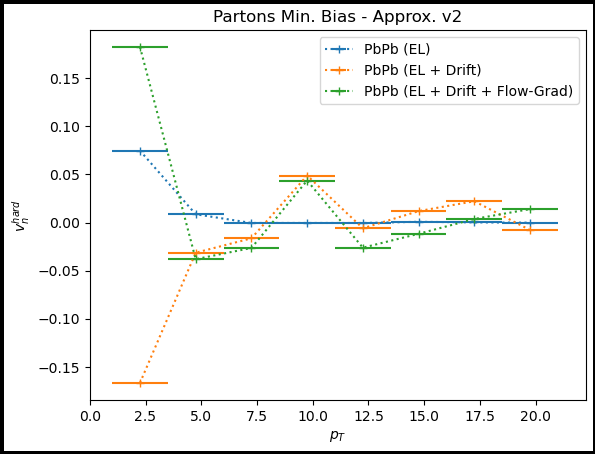

In [23]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$v_n^{hard}$')
axis.set_title('Partons Min. Bias - Approx. v2')

partons['fix_phi_0'] = np.mod(total['phi_0'] - total['psi_2'], 2*np.pi)
partons['fix_phi_f'] = np.mod(total['phi_f'] - total['psi_2'], 2*np.pi)

total = partons
n = 2

# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins
phi_res = 0.01
num_phi = int(np.ceil(2*np.pi/phi_res))

axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['PbPb (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'PbPb (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        if case != 'pp':
            p_mask = p_mask #& ((total['cent'] == '20-30') | (total['cent'] == '30-40') | (total['cent'] == '40-50'))
            # Compute R_AA(phi) for this pt bin:

            parts_i_0 = total[p_mask & (np.abs(total['fix_phi_0']- 0) < phi_res/2)]
            parts_i_hpi = total[p_mask & (np.abs(total['fix_phi_0'] - (np.pi/2)) < phi_res/2)]

            parts_f_0 = total[p_mask & (np.abs(total['fix_phi_f']- 0) < phi_res/2)]
            parts_f_hpi = total[p_mask & (np.abs(total['fix_phi_f'] - (np.pi/2)) < phi_res/2)]
            # counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'weight'], bins=num_phi)
            # counts_f, bins_f = np.histogram(np.mod(total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=phi_bins)
            RAA_0 = np.sum(parts_f_0['pA_weight'])/np.sum(parts_i_0['weight'])
            RAA_hpi = np.sum(parts_f_hpi['pA_weight'])/np.sum(parts_i_hpi['weight'])
            # try:
            #     RAA_0 = np.sum(parts_f_0['pA_weight'])/np.sum(parts_i_0['weight'])  # np.float64 gives nan for division by zero.
            # except:
            #     RAA_0 = np.nan
            # try:
            #     RAA_hpi = np.sum(parts_f_hpi['pA_weight'])/np.sum(parts_i_hpi['weight'])  # np.float64 gives nan for division by zero.
            # except:
            #     RAA_hpi = np.nan
                

        # else:
        #     counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=num_phi)
        #     RAA = counts_i
        
        # # Get bin centers
        # phi_centers = ((phi_bins[0:-1] + phi_bins[1:])/2).astype(np.float64)
        
        # # Compute complex harmonic for each jet
        # comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
        # comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
        # comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # # Get real and imaginary parts
        # real_harm_array = np.real(comp_harm_array)
        # imag_harm_array = np.imag(comp_harm_array)
        
        # # sum real and imaginary parts separately
        # mean_real_harm = np.sum(real_harm_array)
        # mean_imag_harm = np.sum(imag_harm_array)
    
        # Compute magnitude
        mean_harm = 0.5*(RAA_0 - RAA_hpi) / (RAA_hpi + RAA_0)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

Computing harmonics for pp


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * n

Computing harmonics for AA (EL)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * n

Computing harmonics for PbPb (EL + Drift)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA *

Computing harmonics for PbPb (EL + Drift + Flow-Grad)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:68: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2916357533.py:72: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA *

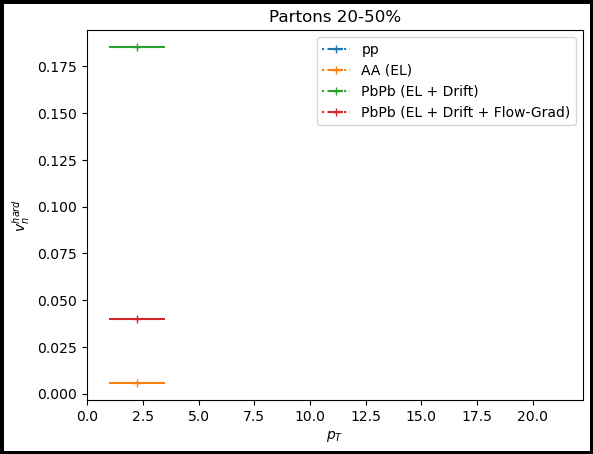

In [31]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$v_n^{hard}$')
axis.set_title('Partons 20-50%')
total = partons
n = 2

# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins
phi_res = 0.001
num_phi = int(np.ceil(2*np.pi/phi_res))

axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pp', 'AA (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'AA (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        p_mask = p_mask & ((total['cent'] == '20-30') | (total['cent'] == '30-40') | (total['cent'] == '40-50'))
        # Compute R_AA(phi) for this pt bin:
        counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'weight'], bins=num_phi)
        counts_f, bins_f = np.histogram(np.mod(total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=phi_bins)
        RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
        phi_centers = phi_bins[0:-1].astype(np.float64)
        
        # Compute complex harmonic for each jet
        comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # sum real and imaginary parts separately
        mean_real_harm = np.sum(real_harm_array)
        mean_imag_harm = np.sum(imag_harm_array)
    
        # Compute magnitude
        mean_harm = np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

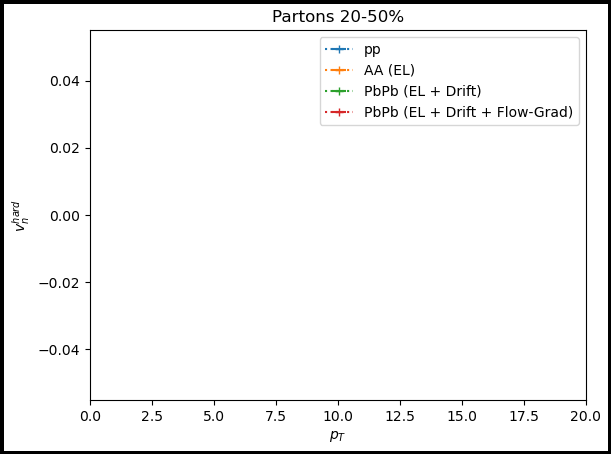

In [36]:
axis.set_xlim(0,20)
fig

Computing harmonics for pp


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:74: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * n

Computing harmonics for AA (EL)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:74: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * n

Computing harmonics for PbPb (EL + Drift)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:74: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.

Computing harmonics for PbPb (EL + Drift + Flow-Grad)


C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: invalid value encountered in divide
  RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:73: RuntimeWarning: invalid value encountered in divide
  comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:74: RuntimeWarning: invalid value encountered in divide
  comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
C:\Users\josep\AppData\Local\Temp\ipykernel_20180\2595518564.py:69: RuntimeWarning: divide by zero encountered in divide
  RAA = counts_f.astype(np.

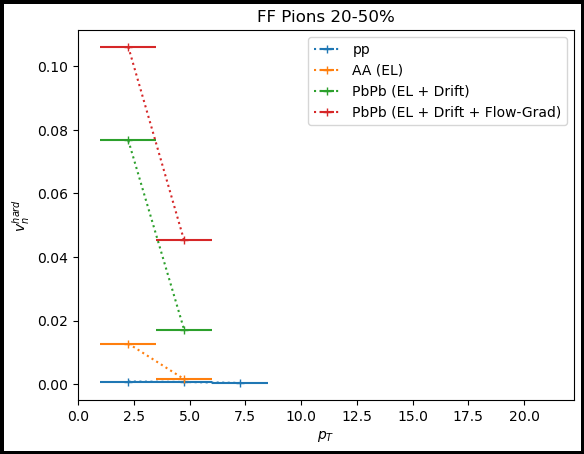

In [32]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$v_n^{hard}$')
axis.set_title(r'FF Pions 20-50%')
total = partons
n = 2

# Create pt bins
pt_res = 2.5
num_pt_points = 8
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])

# Create phi bins
phi_res = 0.001
num_phi = int(np.ceil(2*np.pi/phi_res))

axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pp', 'AA (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'AA (EL)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 

        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pion_pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pion_pt'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 


        p_mask = p_mask & ((total['cent'] == '20-30') | (total['cent'] == '30-40') | (total['cent'] == '40-50'))
        # Compute R_AA(phi) for this pt bin:
        counts_i, phi_bins = np.histogram(np.mod(total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'weight'], bins=num_phi)
        counts_f, bins_f = np.histogram(np.mod(total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_{}'.format(n)], 2*np.pi), weights=total.loc[p_mask, 'pA_weight'], bins=phi_bins)
        RAA = counts_f.astype(np.float64) / counts_i.astype(np.float64)  # np.float64 gives nan for division by zero.
        phi_centers = phi_bins[0:-1].astype(np.float64)  # np.float64 also supports 0 complex numbers for np.exp
        
        # Compute complex harmonic for each jet
        comp_harm_p_array = RAA * np.exp(1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_n_array = RAA * np.exp(-1j * n * phi_centers) / (np.sum(RAA))
        comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # sum real and imaginary parts separately
        mean_real_harm = np.sum(real_harm_array)
        mean_imag_harm = np.sum(imag_harm_array)
    
        # Compute magnitude
        mean_harm = np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

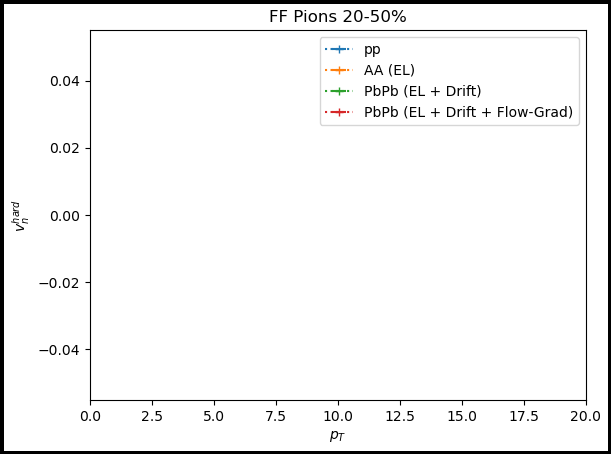

In [38]:
axis.set_xlim(0,20)
fig

0.1282282715750936
v_-8 = 27641.738312803318
v_-7 = 28179.586853588542
v_-6 = 30503.037991537905
v_-5 = 27978.410544376446
v_-4 = 28874.04734637201
v_-3 = 30694.392416358856
v_-2 = 32725.612305799707
v_-1 = 30865.940581740553
v_0 = 1484048.0260431312
v_1 = 30865.940581740553
v_2 = 32725.612305799707
v_3 = 30694.392416358856
v_4 = 28874.04734637201
v_5 = 27978.410544376446
v_6 = 30503.037991537905
v_7 = 28179.586853588542
v_8 = 27641.738312803318
v_2 = 0.04410317150322276


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


v_-8 = 25122.35712786368
v_-7 = 27904.869903607014
v_-6 = 31181.421123406508
v_-5 = 33321.38199054132
v_-4 = 29509.175842682143
v_-3 = 31823.105788363486
v_-2 = 11156.282935334895
v_-1 = 32351.839642269537
v_0 = 1481876.4787767262
v_1 = 32351.839642269537
v_2 = 11156.282935334895
v_3 = 31823.105788363486
v_4 = 29509.175842682143
v_5 = 33321.38199054132
v_6 = 31181.421123406508
v_7 = 27904.869903607014
v_8 = 25122.35712786368
v_2 = 0.015056967426251738


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


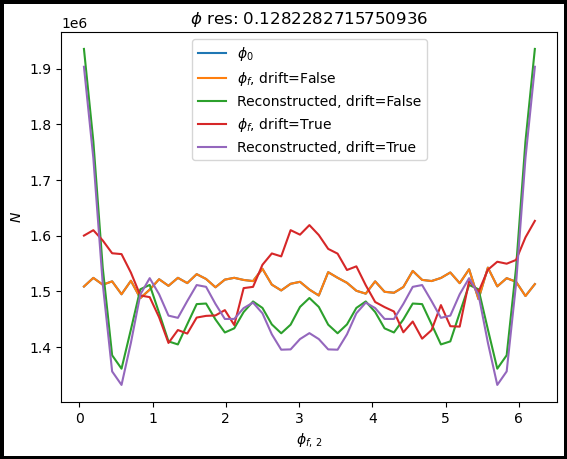

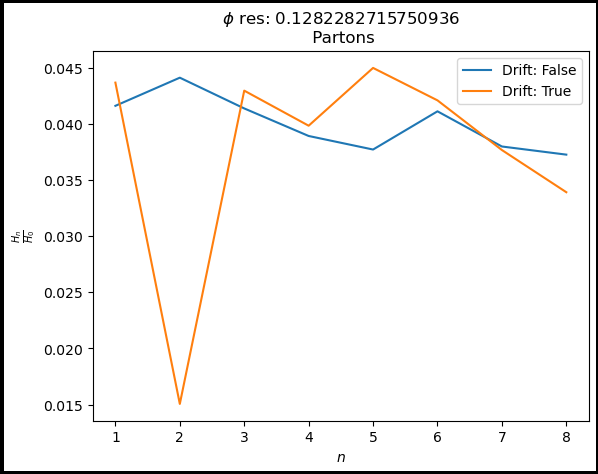

In [190]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$\phi_{f, \, 2}$')
axis.set_ylabel(r'$N$')

fig1, axis1 = plt.subplots(edgecolor='black', linewidth=5)
axis1.set_xlabel(r'$n$')
axis1.set_ylabel(r'$\frac{H_{n}}{H_{0}}$')
axis1.set_title('...')

weight_choice = 'pA_weight'
phi_bins, phi_res = np.linspace(0, 2*np.pi, num=50, retstep=True)
print(phi_res)
bin_labels = phi_bins[0:-1] + (phi_res/2)

axis.set_title(r'$\phi$ res: ' + str(phi_res))
axis1.set_title(r'$\phi$ res: ' + str(phi_res) + '\n Partons')
total = partons

for drift in [False, True]:
    p_mask = (total['drift'] == drift) & (total['el'] == True) & (total['fg'] == drift) #& (total['grad'] == False)
    #mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) #& (hadrons['grad'] == False)
    norm = np.sum(total['pA_weight'])
    # Did not inclue  - hadrons.loc[mask, 'psi_2'] for hadron final
    counts_0, bins_0 = np.histogram(np.mod((total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, weight_choice])
    counts_f, bins_f = np.histogram(np.mod((total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, 'pA_weight'])
    counts_0 = counts_0 #- np.mean(counts_0)
    counts_f = counts_f #- np.mean(counts_f)
    if not drift:
        axis.plot(bin_labels, counts_0, label=r'$\phi_0$')
    axis.plot(bin_labels, counts_f, label=r'$\phi_f$, drift={}'.format(drift))
    
    
    
    
    # Compute first five harmonics of distribution
    n_array = np.array([-8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8])
    mean_harm_array = np.zeros(9)
    recon_dist = np.zeros_like(bin_labels)
    for n in n_array:
    
        # Compute complex harmonic for each jet
        comp_harm = (1/(2*np.pi)) * integrate.trapezoid(y=counts_f * np.exp(- 1j * n * bin_labels), x=bin_labels)
    
        mean_harm = np.sqrt(np.real(comp_harm)**2 + np.imag(comp_harm)**2)  
    
        # Add to reconstructed function
        recon_dist = recon_dist + mean_harm * np.exp( - 1j * n * bin_labels)
        
        mean_harm_array[int(np.abs(n))] +=  mean_harm
        print('v_{} = {}'.format(n, mean_harm))
        if n == -2:
            v_2_n = mean_harm
        elif n == 2:
            v_2_p = mean_harm
        elif n == 0:
            v_0 = mean_harm
        
    
    # Plot reconstructed curve
    axis.plot(bin_labels, recon_dist, label='Reconstructed, drift={}'.format(drift))
    
    # Plot harmonics
    axis1.plot(np.arange(1, 9), mean_harm_array[1:]/v_0, label='Drift: {}'.format(drift))
    
    print('v_2 = {}'.format((v_2_n + v_2_p)/v_0))


axis1.legend()
axis.legend()

0.2026833970057931
Particles: 6752277.874895932
v_-8 = 0.0079901626977288
v_-7 = 3.8630824030139574e-17
v_-6 = 0.014818434686295711
v_-5 = 2.765020072382065e-17
v_-4 = 0.004986082872632469
v_-3 = 4.1879259531695004e-17
v_-2 = 0.008050691722000439
v_-1 = 4.5437105559652046e-17
v_0 = 0.9999999999999999
v_1 = 4.5437105559652046e-17
v_2 = 0.008050691722000439
v_3 = 4.1879259531695004e-17
v_4 = 0.004986082872632469
v_5 = 2.765020072382065e-17
v_6 = 0.014818434686295711
v_7 = 3.8630824030139574e-17
v_8 = 0.0079901626977288
v_2 = 0.01610138344400088


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Particles: 6748344.78523964
v_-8 = 0.005769984914053129
v_-7 = 0.0002600066497633525
v_-6 = 0.008838654837827243
v_-5 = 0.0038261895279835304
v_-4 = 0.00134158725494467
v_-3 = 0.003008313104605282
v_-2 = 0.030993106079678076
v_-1 = 0.0007685759925842099
v_0 = 1.0
v_1 = 0.0007685759925842099
v_2 = 0.030993106079678076
v_3 = 0.003008313104605282
v_4 = 0.00134158725494467
v_5 = 0.0038261895279835304
v_6 = 0.008838654837827243
v_7 = 0.0002600066497633525


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
No handles with labels found to put in legend.


v_8 = 0.005769984914053129
v_2 = 0.06198621215935615


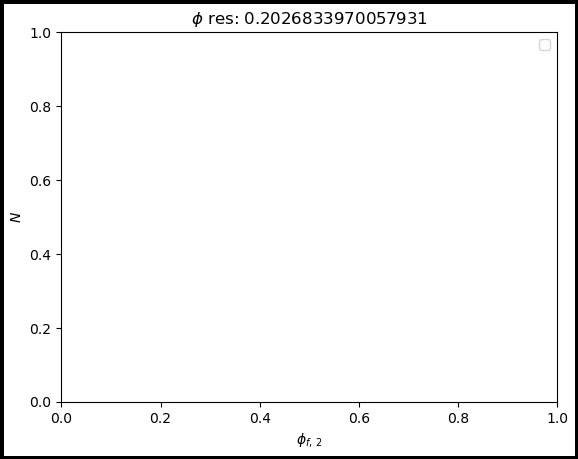

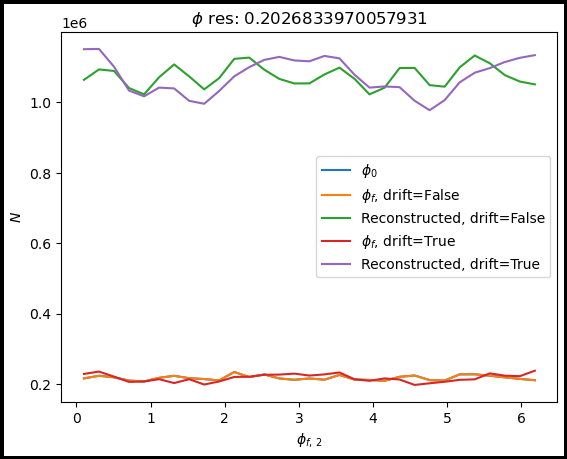

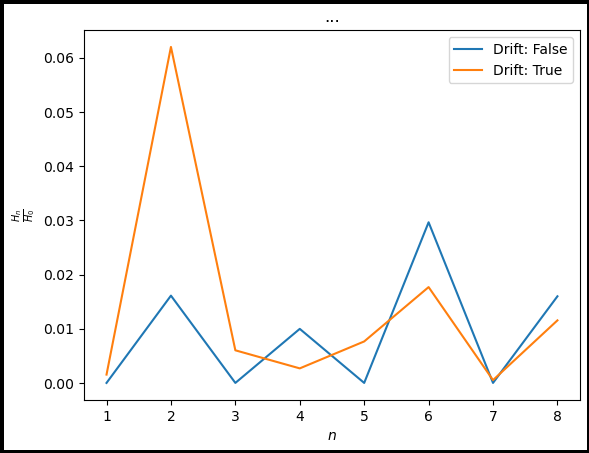

In [206]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$\phi_{f, \, 2}$')
axis.set_ylabel(r'$N$')

fig1, axis1 = plt.subplots(edgecolor='black', linewidth=5)
axis1.set_xlabel(r'$\phi_{f, \, 2}$')
axis1.set_ylabel(r'$N$')
axis1.set_title('...')

fig2, axis2 = plt.subplots(edgecolor='black', linewidth=5)
axis2.set_xlabel(r'$n$')
axis2.set_ylabel(r'$\frac{H_{n}}{H_{0}}$')
axis2.set_title('...')

weight_choice = 'pA_weight'
phi_bins, phi_res = np.linspace(0, 2*np.pi, num=32, retstep=True)
print(phi_res)
bin_labels = phi_bins[0:-1] + (phi_res/2)

axis.set_title(r'$\phi$ res: ' + str(phi_res))
axis1.set_title(r'$\phi$ res: ' + str(phi_res))
total = partons
pt_series = 'pion_pt_f'
binmin = 6
binmax = 11

for drift in [False, True]:
    p_mask = (total['drift'] == drift) & (total['el'] == True) & (total['fg'] == drift) #& (total['grad'] == False)
    #p_mask = p_mask & (total[pt_series] > binmin) & (total[pt_series] < binmax)
    angles_run = 1
    p_mask = p_mask & (total['process_run'] <= (3*angles_run - 1))
    #mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) #& (hadrons['grad'] == False)
    norm = np.sum(total.loc[p_mask, weight_choice])
    print('Particles: {}'.format(norm))
    # Did not inclue  - hadrons.loc[mask, 'psi_2'] for hadron final
    counts_0, bins_0 = np.histogram(np.mod((total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, weight_choice])
    counts_f, bins_f = np.histogram(np.mod((total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, weight_choice])
    counts_0 = counts_0 # - np.mean(counts_0)
    counts_f = counts_f # - np.mean(counts_f)
    if not drift:
        axis1.plot(bin_labels, counts_0, label=r'$\phi_0$')
    axis1.plot(bin_labels, counts_f, label=r'$\phi_f$, drift={}'.format(drift))
    
    
    
    
    # Compute first five harmonics of distribution
    n_array = np.array([-8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8])
    mean_harm_array = np.zeros(9)
    recon_dist = np.zeros_like(bin_labels)
    for n in n_array:
    
        # Compute complex harmonic for each jet
        #comp_harm = (1/(2*np.pi)) * integrate.trapezoid(y=counts_f * np.exp(- 1j * n * bin_labels), x=bin_labels)
        v_n =  np.sum(((np.exp(- 1j * n * np.mod((total.loc[p_mask, 'phi_f'] - total.loc[p_mask, 'psi_2']), 2*np.pi)) * total.loc[p_mask, weight_choice]))) / np.sum(total.loc[p_mask, weight_choice])
        
        mean_harm = np.sqrt(np.real(v_n)**2 + np.imag(v_n)**2)  
        comp_harm = (1/(2*np.pi)) * v_n * np.sum(total.loc[p_mask, weight_choice])
        
        # Add to reconstructed function
        recon_dist = recon_dist + (comp_harm * np.exp(1j * n * bin_labels))
        
        mean_harm_array[int(np.abs(n))] +=  mean_harm
        print('v_{} = {}'.format(n, mean_harm))
        if n == -2:
            v_2_n = mean_harm
        elif n == 2:
            v_2_p = mean_harm
        elif n == 0:
            v_0 = mean_harm
        
    
    # Plot reconstructed curve
    axis1.plot(bin_labels, recon_dist, label='Reconstructed, drift={}'.format(drift))
    
    # Plot harmonics
    axis2.plot(np.arange(1, 9), mean_harm_array[1:]/v_0, label='Drift: {}'.format(drift))
    
    print('v_2 = {}'.format((v_2_n + v_2_p)/v_0))

axis2.legend()
axis1.legend()
axis.legend()

In [124]:
from scipy import stats
stats.mode(partons.loc[p_mask, 'z'].to_numpy())

/tmp/jbahder-tmpdir-Apfg3X/ipykernel_3278817/3321458574.py:2: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  stats.mode(partons_b.loc[p_mask, 'z'].to_numpy())


ModeResult(mode=array([0.06722168]), count=array([2]))

Maximum at z = 0.4626459324332785
Mean at z = 0.46824878396977804


Text(0, 0.5, 'N')

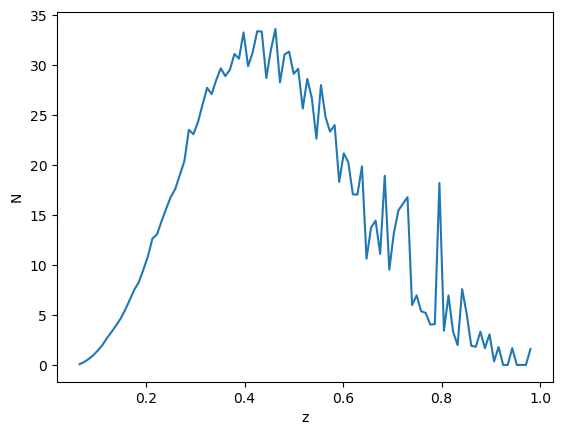

In [133]:
counts, bins = np.histogram(partons.loc[p_mask, 'z'], weights=partons.loc[p_mask, 'pA_weight'], bins=100)
bin_centers = (bins[1:] + bins[0:-1])/2
print('Maximum at z = {}'.format(bin_centers[counts == np.amax(counts)][0]))
print('Mean at z = {}'.format(np.average(partons.loc[p_mask, 'z'], weights=partons.loc[p_mask, 'pA_weight'])))
plt.plot(bin_centers, counts)
plt.xlabel('z')
plt.ylabel('N')

/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


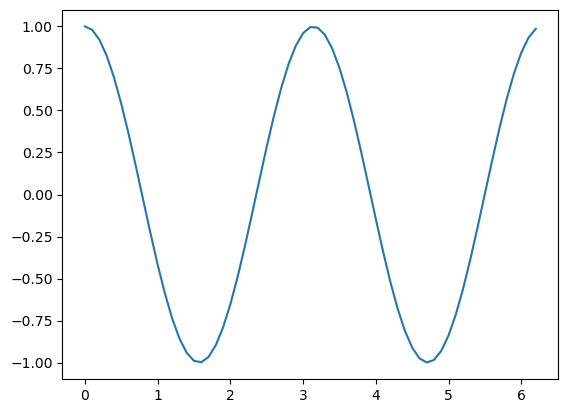

In [33]:
x = np.arange(0, 2*np.pi, 0.1)
y = np.exp(- 1j * 2 * x)
plt.plot(x, y)

Computing harmonics for pp
Computing harmonics for AA (EL)
Computing harmonics for PbPb (EL + Drift)
Computing harmonics for PbPb (EL + Drift + Flow-Grad)


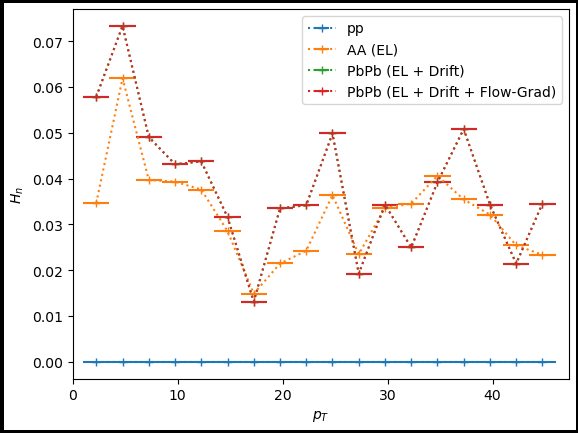

In [36]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$H_n$')
pt_tag = 'jet_pT_f'
phi_tag = 'phi_f'
weight_choice = 'pA_weight'
n = 2

pt_res = 2.5
num_pt_points = 18
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pp', 'AA (EL)', 'PbPb (EL + Drift)', 'PbPb (EL + Drift + Flow-Grad)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'AA (EL)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True)  & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)
            
        elif case == 'PbPb (EL + Drift + Flow-Grad)':
            phi_series = 'phi_f'
            pt_series = 'pt_f'
            p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == True) & (total[pt_series] > binmin) & (total[pt_series] < binmax)  # & (total['grad'] == False) 
        
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'pt'
            p_mask = (total['drift'] == False) & (total['el'] == False)  & (total['fg'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)

        cut_df = total[p_mask] #& (total['cent'] == cent)
        
        # Compute complex harmonic for each jet
        if n == 0:
            comp_harm_array = np.exp(1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
        else:
            comp_harm_p_array = np.exp(1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_n_array = np.exp(-1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # average real and imaginary parts separately
        if np.sum(cut_df[weight_choice]) == 0:
            mean_real_harm = 0
            mean_imag_harm = 0
        else:
            mean_real_harm = np.average(real_harm_array, weights=cut_df[weight_choice])
            mean_imag_harm = np.average(imag_harm_array, weights=cut_df[weight_choice])
    
        # Compute magnitude
        mean_harm = np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()

In [33]:
pt_tag = 'jet_pT_f'


2085236

Note: yield normalization will later rescale these distributions


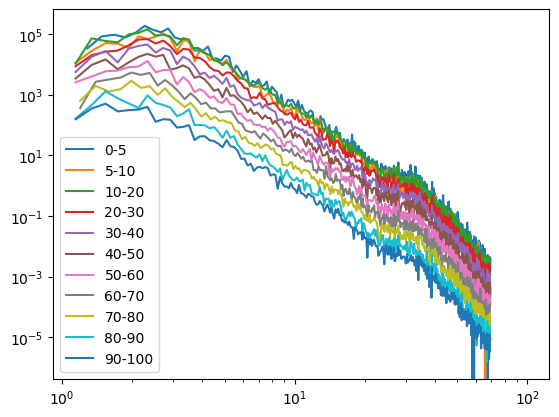

In [25]:
# Plot the pT number distribution of jets in pT
fig, axis = plt.subplots()
cent_bins = np.flip(np.array(['90-100', '80-90', '70-80', '60-70', '50-60', '40-50',
                      '30-40', '20-30', '10-20', '5-10', '0-5']))
for cent in cent_bins:
    vitev_counts, vitev_bins = np.histogram(total.loc[total['cent'] == cent]['jet_pT'], weights=total.loc[total['cent'] == cent]['jet_weight'], bins=500)
    new_counts, new_bins = np.histogram(total.loc[total['cent'] == cent]['jet_pT'], weights=total.loc[total['cent'] == cent]['new_weight'], bins=500)
    #axis.plot(vitev_bins[0:-1], vitev_counts, label='Vitev')
    axis.plot(new_bins[0:-1], new_counts, label=cent)
axis.legend()
axis.set_xscale('log')
axis.set_yscale('log')
print('Note: yield normalization will later rescale these distributions')

Note: yield normalization will later rescale these distributions


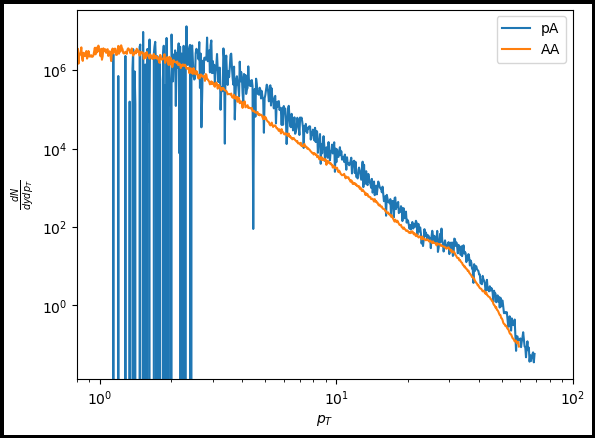

In [26]:
# Plot fragmentation effect on spectrum
fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$p_T$')
axis4.set_ylabel(r'$\frac{dN}{dy dp_T}$')

log_bins = np.logspace(-1, 2, 1000)
bin_res = log_bins[1:] - log_bins[0:-1]
initial_parton_counts, initial_parton_bins = np.histogram(total['jet_pT'].to_numpy(), weights=total['new_weight'].to_numpy(), bins=log_bins)
final_parton_counts, final_parton_bins = np.histogram(total['jet_pT_f'].to_numpy(), weights=total['new_weight'].to_numpy(), bins=log_bins)
axis4.plot(initial_parton_bins[0:-1], initial_parton_counts/bin_res, label='pA')
axis4.plot(final_parton_bins[0:-1], final_parton_counts/bin_res, label='AA')

axis4.set_xscale('log')
axis4.set_yscale('log') 
axis4.set_xlim(0.8, 100)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

Note: yield normalization will later rescale these distributions


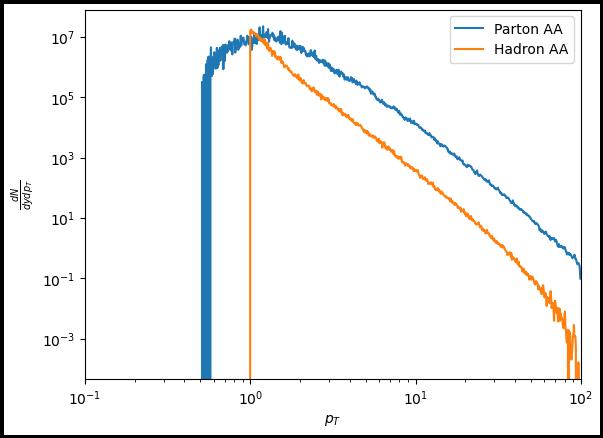

In [27]:
# Plot fragmentation effect on spectrum
fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$p_T$')
axis4.set_ylabel(r'$\frac{dN}{dy dp_T}$')

log_bins = np.logspace(-1, 2, 1000)
bin_res = log_bins[1:] - log_bins[0:-1]
final_parton_counts, final_parton_bins = np.histogram(total['jet_pT_f'], weights=total['jet_weight'], bins=log_bins)
final_hadron_counts, final_hadron_bins = np.histogram(hadrons['pt'], weights=hadrons['weight']/hadrons['num_hrz'], bins=log_bins)
axis4.plot(final_parton_bins[0:-1], final_parton_counts/bin_res, label='Parton AA')
axis4.plot(final_hadron_bins[0:-1], final_hadron_counts/bin_res, label='Hadron AA')

axis4.set_xscale('log')
axis4.set_yscale('log') 
axis4.set_xlim(0.1, 100)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

1 - 11 GeV
total jets: 452393111.00117487
Binned jets: 452393111.00117457
Mean value: 0.27753206143397846
11 - 21 GeV
total jets: 892820.9968749762
Binned jets: 892820.996874977
Mean value: 0.15301579847966335
21 - 31 GeV
total jets: 84005.93561588788
Binned jets: 84005.9356158882
Mean value: 0.1389070834525741
31 - 41 GeV
total jets: 17558.641635273987
Binned jets: 17558.64163527408
Mean value: 0.13246201302811178
41 - 51 GeV
total jets: 5344.152153795209
Binned jets: 5344.152153795213
Mean value: 0.12865701770043475
51 - 61 GeV
total jets: 2018.4462774203375
Binned jets: 2018.4462774203364
Mean value: 0.12565139707841066
Note: yield normalization will later rescale these distributions


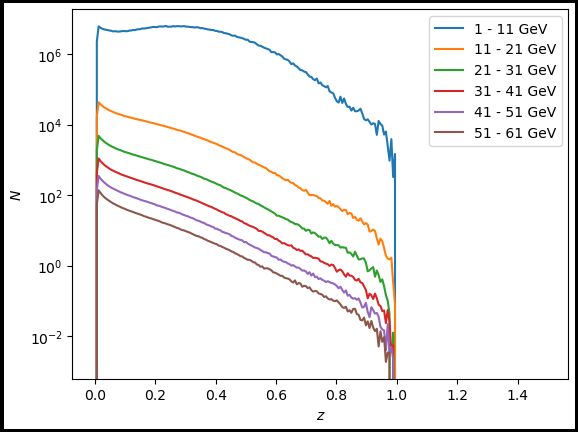

In [12]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z$')
axis4.set_ylabel(r'$N$')
lin_bins = np.linspace(0, 1.5, 250)
pt_res = 10
pt_bins = np.arange(1, 60, pt_res)
for pt in pt_bins:
    mask = (partons['jet_pT_f'] > pt) & (partons['jet_pT_f'] < pt+pt_res)
    print('{} - {} GeV'.format(pt, pt+pt_res))
    final_parton_counts, final_parton_bins = np.histogram(partons.loc[mask, 'z'], weights=partons.loc[mask, 'pA_weight'], bins=lin_bins)
    axis4.plot(final_parton_bins[0:-1], final_parton_counts, label='{} - {} GeV'.format(pt, pt+pt_res))
    try:
        mean_val = np.average(partons.loc[mask, 'z'], weights=partons.loc[mask, 'pA_weight'])
    except:
        mean_val = 0
    print('total jets: {}'.format(np.sum(partons.loc[mask, 'pA_weight'])))
    print('Binned jets: {}'.format(np.sum(final_parton_counts)))
    print('Mean value: {}'.format(mean_val))

#axis4.set_xscale('log')
axis4.set_yscale('log')
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

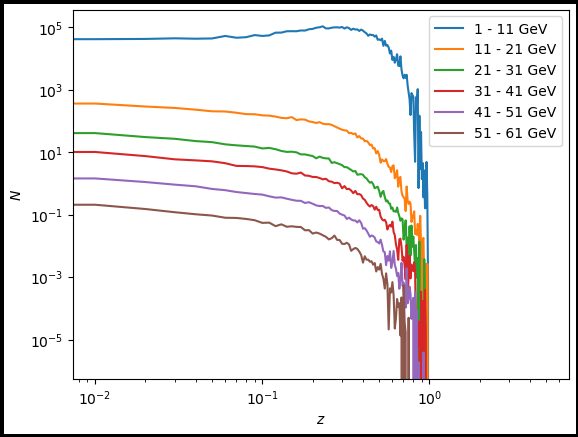

In [53]:
axis4.set_xscale('log')
fig4

1 - 11 GeV
total jets: 21851542.5479177
Binned jets: 21851542.54791773
Mean value: 0.6751636594976235
11 - 21 GeV
total jets: 437964.0611118611
Binned jets: 437964.06111185794
Mean value: 0.17136294194926688
21 - 31 GeV
total jets: 64498.57724375732
Binned jets: 64498.57724375699
Mean value: 0.1298446890151881
31 - 41 GeV
total jets: 16860.34232762741
Binned jets: 16860.342327627208
Mean value: 0.11162040210348587
41 - 51 GeV
total jets: 5623.655529775014
Binned jets: 5623.655529774995
Mean value: 0.10129544354727338
51 - 61 GeV
total jets: 2400.3925941765137
Binned jets: 2400.3925941764505
Mean value: 0.09439415614473123


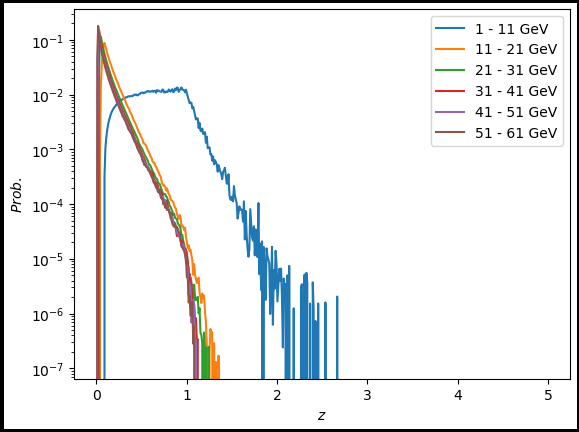

In [38]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z$')
axis4.set_ylabel(r'$Prob.$')
lin_bins = np.linspace(0, 5, 500)
pt_res = 10
pt_bins = np.arange(1, 60, pt_res)
for pt in pt_bins:
    # Shout
    print('{} - {} GeV'.format(pt, pt+pt_res))
    
    # Make cut
    mask = (hadrons['parent_pt_f'] > pt) & (hadrons['parent_pt_f'] < pt+pt_res)

    # Collect data
    current_weights = hadrons.loc[mask, 'weight']/hadrons.loc[mask, 'num_hrz']
    total_weights = np.sum(current_weights)
    current_values = hadrons.loc[mask, 'z']
    
    # Histogram
    final_counts, final_bins = np.histogram(current_values, weights=current_weights, bins=lin_bins)

    # Plot
    axis4.plot(final_bins[0:-1], final_counts/total_weights, label='{} - {} GeV'.format(pt, pt+pt_res))

    # Compute mean value
    try:
        mean_val = np.average(current_values, weights=current_weights)
    except:
        mean_val = 0

    # Shout some more
    print('total jets: {}'.format(total_weights))
    print('Binned jets: {}'.format(np.sum(final_counts)))
    print('Mean value: {}'.format(mean_val))

#axis4.set_xscale('log')
axis4.set_yscale('log')
axis4.legend()

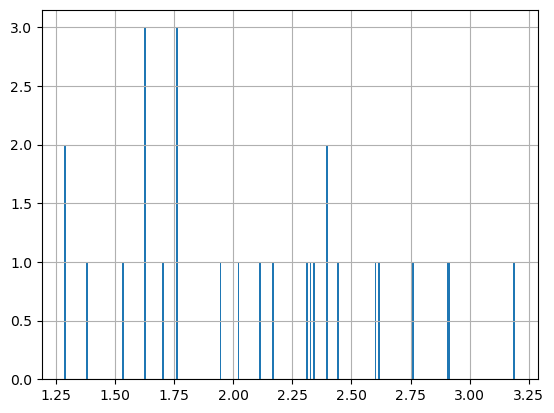

In [29]:
hadrons[hadrons['z'] > 2]['parent_pt'].hist(bins=250)

In [48]:
partons.columns

Index(['eventNo', 'jetNo', 'jet_tag', 'jet_weight', 'jet_particle', 'jet_mass',
       'jet_pT', 'jet_pT_f', 'q_el', 'q_drift', 'q_drift_abs', 'q_grad',
       'q_grad_abs', 'q_fg', 'q_fg_abs', 'extinguished', 'X0', 'Y0', 'phi_0',
       'phi_f', 't_qgp', 't_hrg', 't_unhydro', 'time_total_plasma',
       'time_total_hrg', 'time_total_unhydro', 'Tmax_jet', 'initial_time',
       'final_time', 'dx', 'dt', 'tau', 'Tmax_event', 'drift', 'grad', 'el',
       'fg', 'el_model', 'k_drift', 'k_BBMG', 'exit_code', 'process', 'b',
       'npart', 'ncoll', 'mult', 'e2_re', 'e2_im', 'psi_e2', 'e3_re', 'e3_im',
       'psi_e3', 'e4_re', 'e4_im', 'psi_e4', 'e5_re', 'e5_im', 'psi_e5',
       'seed', 'cmd', 'rmax', 'e2', 'e3', 'e4', 'e5', 'q_2_re', 'q_2_im',
       'psi_2', 'q_3_re', 'q_3_im', 'psi_3', 'v_2', 'v_3', 'z', 'pp_z',
       'pion_pt', 'cent', 'new_weight'],
      dtype='object')

In [50]:
partons.dropna(inplace=True)

1 - 11 GeV
total jets: 330869.4750446154
Binned jets: 330869.47504461574
Mean value: 0.44863323253920323
11 - 21 GeV
total jets: 23.571837951535215
Binned jets: 23.57183795153521
Mean value: 0.47746890319681257
21 - 31 GeV
total jets: 0.4375842633508232
Binned jets: 0.4375842633508224
Mean value: 0.5891717073943656
31 - 41 GeV
total jets: 0.012547622804869986
Binned jets: 0.012547622804869986
Mean value: 0.6722602825433376
41 - 51 GeV
total jets: 0.00024158943653603048
Binned jets: 0.00024158943653603042
Mean value: 0.694274437578444
51 - 61 GeV
total jets: 1.2167713844451885e-07
Binned jets: 1.2167713844451885e-07
Mean value: 0.7867785333289619
61 - 71 GeV
total jets: 0.0
Binned jets: 0.0
Mean value: nan
71 - 81 GeV
total jets: 0.0
Binned jets: 0.0
Mean value: nan
81 - 91 GeV
total jets: 0.0
Binned jets: 0.0
Mean value: nan
91 - 101 GeV
total jets: 0.0
Binned jets: 0.0
Mean value: nan
Note: yield normalization will later rescale these distributions


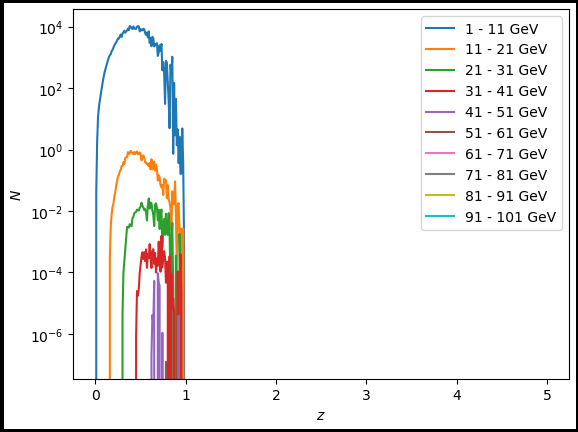

In [51]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z$')
axis4.set_ylabel(r'$N$')
lin_bins = np.linspace(0, 5, 500)
pt_res = 10
pt_bins = np.arange(1, 100, pt_res)

for pt in pt_bins:
    mask = (partons['pion_pt'] > pt) & (partons['pion_pt'] < pt+pt_res)
    print('{} - {} GeV'.format(pt, pt+pt_res))
    final_parton_counts, final_parton_bins = np.histogram(partons.loc[mask, 'z'], weights=partons.loc[mask, 'new_weight'], bins=lin_bins)
    axis4.plot(final_parton_bins[0:-1], final_parton_counts, label='{} - {} GeV'.format(pt, pt+pt_res))
    try:
        mean_val = np.average(partons.loc[mask, 'z'], weights=partons.loc[mask, 'new_weight'])
    except:
        mean_val = np.nan
    print('total jets: {}'.format(np.sum(partons.loc[mask, 'new_weight'])))
    print('Binned jets: {}'.format(np.sum(final_parton_counts)))
    print('Mean value: {}'.format(mean_val))

# axis4.set_xscale('log')
axis4.set_yscale('log') 
#axis4.set_xlim(0.009, 1)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

1 - 11 GeV
total jets: 4184333.201759048
Binned jets: 4184333.2017590515
Mean value: 0.6965380133071803
11 - 21 GeV
total jets: 648.145091856822
Binned jets: 648.1450918568194
Mean value: 0.5177242660642916
21 - 31 GeV
total jets: 47.95995745053153
Binned jets: 47.959957450531064
Mean value: 0.5716688755205888
31 - 41 GeV
total jets: 8.338451564611123
Binned jets: 8.33845156461111
Mean value: 0.6304258421147548
41 - 51 GeV
total jets: 1.8527843626369491
Binned jets: 1.8527843626369471
Mean value: 0.6692091859598703
51 - 61 GeV
total jets: 0.5672337005210435
Binned jets: 0.5672337005210433
Mean value: 0.72559432752251
61 - 71 GeV
total jets: 0.17797013894355787
Binned jets: 0.1779701389435581
Mean value: 0.8006574366524576
71 - 81 GeV
total jets: 0.05476491274285504
Binned jets: 0.05476491274285497
Mean value: 0.8682618595578455
81 - 91 GeV
total jets: 0.011156102447172845
Binned jets: 0.01115610244717285
Mean value: 0.9173085853162352
91 - 101 GeV
total jets: 0.003437879671116488
Binne

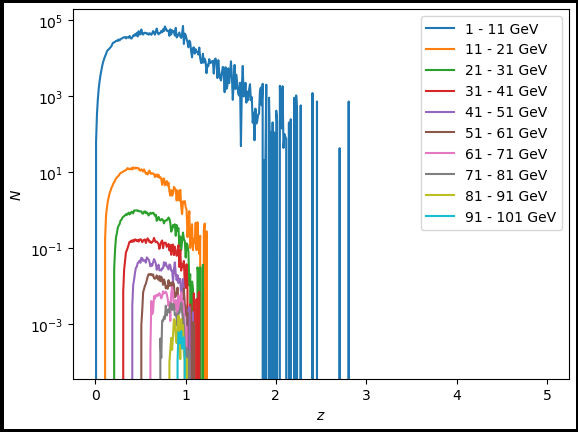

In [30]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z$')
axis4.set_ylabel(r'$N$')
lin_bins = np.linspace(0, 5, 500)
pt_res = 10
pt_bins = np.arange(1, 100, pt_res)
for pt in pt_bins:
    mask = (hadrons['pt'] > pt) & (hadrons['pt'] < pt+pt_res)
    print('{} - {} GeV'.format(pt, pt+pt_res))
    final_parton_counts, final_parton_bins = np.histogram(hadrons.loc[mask, 'z'], weights=hadrons.loc[mask, 'weight']/hadrons.loc[mask, 'num_hrz'], bins=lin_bins)
    axis4.plot(final_parton_bins[0:-1], final_parton_counts, label='{} - {} GeV'.format(pt, pt+pt_res))
    try:
        mean_val = np.average(hadrons.loc[mask, 'z'], weights=hadrons.loc[mask, 'weight']/hadrons.loc[mask, 'num_hrz'])
    except:
        mean_val = np.nan
    print('total jets: {}'.format(np.sum(hadrons.loc[mask, 'weight']/hadrons.loc[mask, 'num_hrz'])))
    print('Binned jets: {}'.format(np.sum(final_parton_counts)))
    print('Mean value: {}'.format(mean_val))

# axis4.set_xscale('log')
axis4.set_yscale('log') 
#axis4.set_xlim(0.009, 1)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

total jets: 4185040.312607018
Binned jets: 4185040.312607019
Mean value: nan
Note: yield normalization will later rescale these distributions


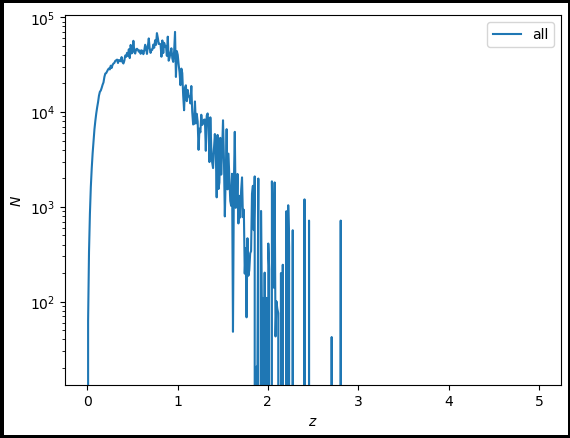

In [31]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z$')
axis4.set_ylabel(r'$N$')
lin_bins = np.linspace(0, 5, 500)
pt_res = 10
pt_bins = np.arange(1, 100, pt_res)
final_parton_counts, final_parton_bins = np.histogram(hadrons.loc[:, 'z'], weights=hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'], bins=lin_bins)
axis4.plot(final_parton_bins[0:-1], final_parton_counts, label='all')
try:
    mean_val = np.average(hadrons.loc[mask, 'z'], weights=hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'])
except:
    mean_val = np.nan
print('total jets: {}'.format(np.sum(hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'])))
print('Binned jets: {}'.format(np.sum(final_parton_counts)))
print('Mean value: {}'.format(mean_val))

# axis4.set_xscale('log')
axis4.set_yscale('log') 
#axis4.set_xlim(0.009, 1)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

total jets: 4185040.312607018
Binned jets: 4185040.31260702
Mean value: nan
Note: yield normalization will later rescale these distributions


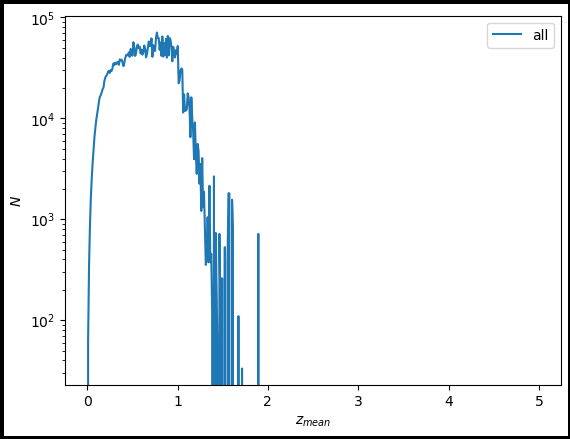

In [32]:

fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'$z_{mean}$')
axis4.set_ylabel(r'$N$')
lin_bins = np.linspace(0, 5, 500)
pt_res = 10
pt_bins = np.arange(1, 100, pt_res)
final_parton_counts, final_parton_bins = np.histogram(hadrons.loc[:, 'z_mean'], weights=hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'], bins=lin_bins)
axis4.plot(final_parton_bins[0:-1], final_parton_counts, label='all')
try:
    mean_val = np.average(hadrons.loc[mask, 'z_mean'], weights=hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'])
except:
    mean_val = np.nan
print('total jets: {}'.format(np.sum(hadrons.loc[:, 'weight']/hadrons.loc[:, 'num_hrz'])))
print('Binned jets: {}'.format(np.sum(final_parton_counts)))
print('Mean value: {}'.format(mean_val))

# axis4.set_xscale('log')
axis4.set_yscale('log') 
#axis4.set_xlim(0.009, 1)
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

total jets: 4185040.312607018
Binned jets: 4185040.3126069447
Mean value: 1.4400744096944715
Note: yield normalization will later rescale these distributions


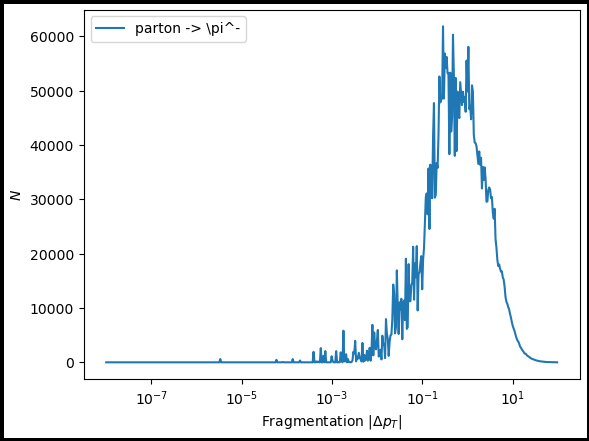

In [33]:
# Plot fragmentation effect on spectrum
fig4, axis4 = plt.subplots(edgecolor='black', linewidth=5)
axis4.set_xlabel(r'Fragmentation $|\Delta p_T|$')
axis4.set_ylabel(r'$N$')
log_bins = np.logspace(-8, 2, 500)
final_parton_counts, final_parton_bins = np.histogram(np.abs(hadrons['pt']/hadrons['z']-hadrons['pt']), weights=hadrons['weight']/hadrons['num_hrz'], bins=log_bins)
axis4.plot(final_parton_bins[0:-1], final_parton_counts, label=r'parton -> \pi^-')
mean_val = np.average(np.abs(hadrons['pt']/hadrons['z']-hadrons['pt']), weights=hadrons['weight']/hadrons['num_hrz'])
print('total jets: {}'.format(np.sum(hadrons['weight']/hadrons['num_hrz'])))
print('Binned jets: {}'.format(np.sum(final_parton_counts)))
print('Mean value: {}'.format(mean_val))

axis4.set_xscale('log')
axis4.legend()
print('Note: yield normalization will later rescale these distributions')

0.025233675932448137
v_-8 = 3132.561762366373
v_-7 = 103.99364334724359
v_-6 = 2198.7660802668993
v_-5 = 118.71399348252461
v_-4 = 1874.8613979421561
v_-3 = 135.34128959909054
v_-2 = 413.23930648468263
v_-1 = 158.79972192731762
v_0 = 18668.769345713892
v_1 = 158.79972192731762
v_2 = 413.23930648468263
v_3 = 135.34128959909054
v_4 = 1874.8613979421561
v_5 = 118.71399348252461
v_6 = 2198.7660802668993
v_7 = 103.99364334724359
v_8 = 3132.561762366373
v_2 = 0.04427065317827787
v_-8 = 1464.090259444429
v_-7 = 235.34985343177703
v_-6 = 1894.3562026673185
v_-5 = 306.37582836258775
v_-4 = 1249.2471144507706
v_-3 = 88.41326044339957
v_-2 = 1148.609161968395
v_-1 = 78.06508564160634
v_0 = 18720.432885314927
v_1 = 78.06508564160634
v_2 = 1148.609161968395
v_3 = 88.41326044339957
v_4 = 1249.2471144507706
v_5 = 306.37582836258775
v_6 = 1894.3562026673185
v_7 = 235.34985343177703
v_8 = 1464.090259444429
v_2 = 0.12271181644195964


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


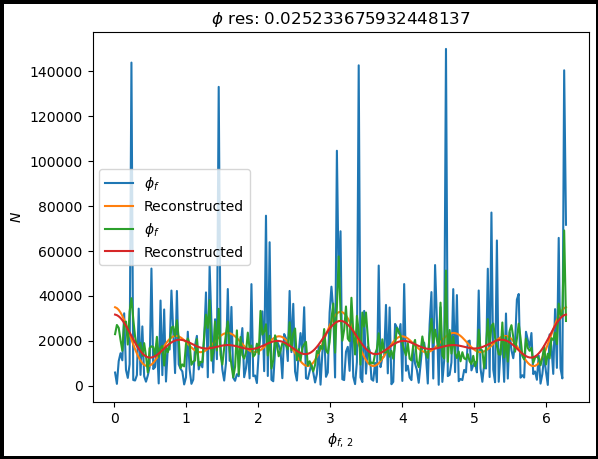

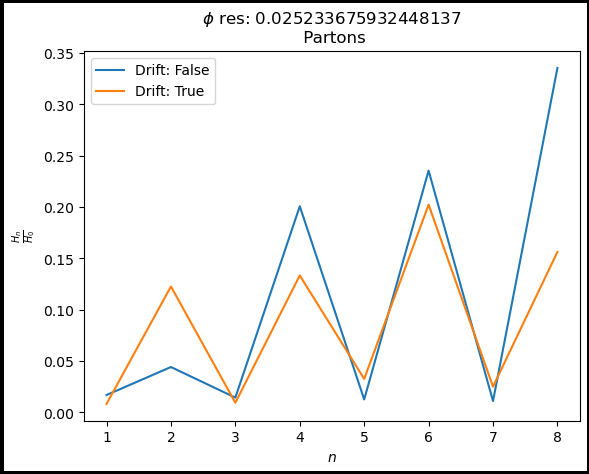

In [38]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$\phi_{f, \, 2}$')
axis.set_ylabel(r'$N$')

fig1, axis1 = plt.subplots(edgecolor='black', linewidth=5)
axis1.set_xlabel(r'$n$')
axis1.set_ylabel(r'$\frac{H_{n}}{H_{0}}$')
axis1.set_title('...')

weight_choice = 'new_weight'
phi_bins, phi_res = np.linspace(0, 2*np.pi, num=250, retstep=True)
print(phi_res)
bin_labels = phi_bins[0:-1] + (phi_res/2)

axis.set_title(r'$\phi$ res: ' + str(phi_res))
axis1.set_title(r'$\phi$ res: ' + str(phi_res) + '\n Partons')

for drift in [False, True]:
    p_mask = (total['drift'] == drift) & (total['el'] == True) & (total['fg'] == False) & (total['grad'] == False)
    mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) & (hadrons['grad'] == False)
    
    # Did not inclue  - hadrons.loc[mask, 'psi_2'] for hadron final
    #counts_0, bins_0 = np.histogram(np.mod((total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, weight_choice])
    counts_f, bins_f = np.histogram(np.mod((total.loc[p_mask, 'phi_f']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, 'jet_weight'])
    #axis.plot(bin_labels, counts_0, label=r'$\phi_0$')
    axis.plot(bin_labels, counts_f, label=r'$\phi_f$')
    
    
    
    
    # Compute first five harmonics of distribution
    n_array = np.array([-8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8])
    mean_harm_array = np.zeros(9)
    recon_dist = np.zeros_like(bin_labels)
    for n in n_array:
    
        # Compute complex harmonic for each jet
        comp_harm = (1/(2*np.pi)) * integrate.trapezoid(y=counts_f * np.exp(1j * n * bin_labels), x=bin_labels)
    
        mean_harm = np.abs(comp_harm)
    
        # Add to reconstructed function
        recon_dist = recon_dist + mean_harm * np.exp( - 1j * n * bin_labels)
        
        mean_harm_array[int(np.abs(n))] +=  mean_harm
        print('v_{} = {}'.format(n, mean_harm))
        if n == -2:
            v_2_n = mean_harm
        elif n == 2:
            v_2_p = mean_harm
        elif n == 0:
            v_0 = mean_harm
        
    
    # Plot reconstructed curve
    axis.plot(bin_labels, recon_dist, label='Reconstructed')
    
    # Plot harmonics
    axis1.plot(np.arange(1, 9), mean_harm_array[1:]/v_0, label='Drift: {}'.format(drift))
    
    print('v_2 = {}'.format((v_2_n + v_2_p)/v_0))


axis1.legend()
axis.legend()

0.025233675932448137
v_-8 = 51.04432111432607
v_-7 = 65.47492580900811
v_-6 = 221.88363380003184
v_-5 = 84.44300835765937
v_-4 = 152.09824823491732
v_-3 = 70.81099001152101
v_-2 = 187.29880952100106
v_-1 = 81.94574926448243
v_0 = 5477.523893537024
v_1 = 81.94574926448243
v_2 = 187.29880952100106
v_3 = 70.81099001152101
v_4 = 152.09824823491732
v_5 = 84.44300835765937
v_6 = 221.88363380003184
v_7 = 65.47492580900811
v_8 = 51.04432111432607
v_2 = 0.06838813053540359


/fs1/home/jbahder/.conda/envs/jma_analysis/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


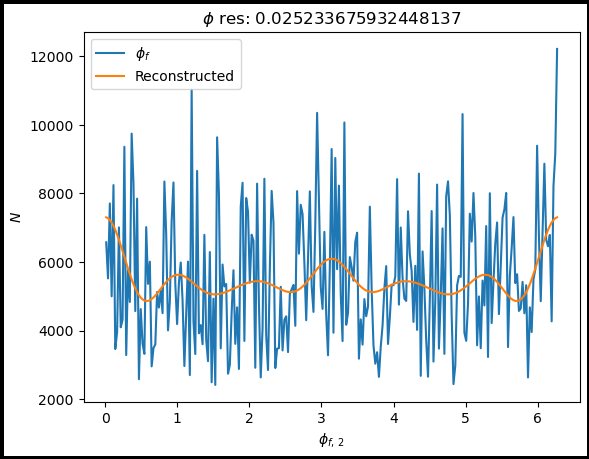

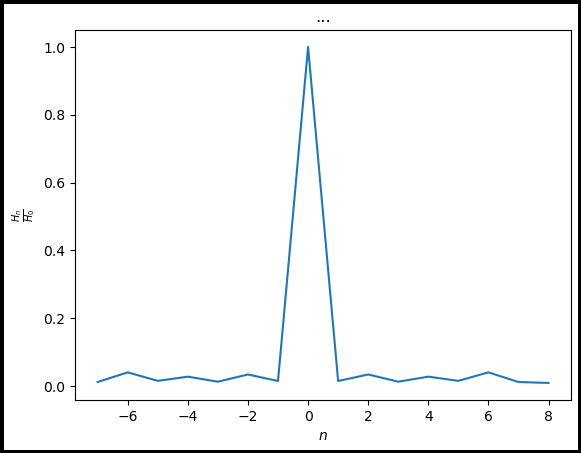

In [40]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$\phi_{f, \, 2}$')
axis.set_ylabel(r'$N$')

fig1, axis1 = plt.subplots(edgecolor='black', linewidth=5)
axis1.set_xlabel(r'$n$')
axis1.set_ylabel(r'$\frac{H_{n}}{H_{0}}$')
axis1.set_title('...')

weight_choice = 'new_weight'
phi_bins, phi_res = np.linspace(0, 2*np.pi, num=250, retstep=True)
print(phi_res)
bin_labels = phi_bins[0:-1] + (phi_res/2)

axis.set_title(r'$\phi$ res: ' + str(phi_res))

p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['grad'] == False)
mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) & (hadrons['grad'] == False)

# Did not inclue  - hadrons.loc[mask, 'psi_2'] for hadron final
#counts_0, bins_0 = np.histogram(np.mod((total.loc[p_mask, 'phi_0'] - total.loc[p_mask, 'psi_2']), 2*np.pi), bins=phi_bins, weights=total.loc[p_mask, weight_choice])
counts_f, bins_f = np.histogram(np.mod((hadrons.loc[mask, 'phi_f']), 2*np.pi), bins=phi_bins, weights=hadrons.loc[mask, 'weight']/hadrons.loc[mask, 'num_hrz'])
#axis.plot(bin_labels, counts_0, label=r'$\phi_0$')
axis.plot(bin_labels, counts_f, label=r'$\phi_f$')




# Compute first five harmonics of distribution
n_array = np.array([-8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8])
mean_harm_array = np.array([])
recon_dist = np.zeros_like(bin_labels)
for n in n_array:

    # Compute complex harmonic for each jet
    comp_harm = (1/(2*np.pi)) * integrate.trapezoid(y=counts_f * np.exp(1j * n * bin_labels), x=bin_labels)

    mean_harm = np.abs(comp_harm)

    # Add to reconstructed function
    recon_dist = recon_dist + mean_harm * np.exp( - 1j * n * bin_labels)
    
    mean_harm_array = np.append(mean_harm_array, mean_harm)
    print('v_{} = {}'.format(n, mean_harm))
    if n == -2:
        v_2_n = mean_harm
    elif n == 2:
        v_2_p = mean_harm
    elif n == 0:
        v_0 = mean_harm
    

# Plot reconstructed curve
axis.plot(bin_labels, recon_dist, label='Reconstructed')

# Plot harmonics
axis1.plot(n_array[1:], mean_harm_array[1:]/v_0)

print('v_2 = {}'.format((v_2_n + v_2_p)/v_0))


axis.legend()

Computing harmonics for 0-5% Centrality
Computing harmonics for 30-40% Centrality
Computing harmonics for 60-70% Centrality


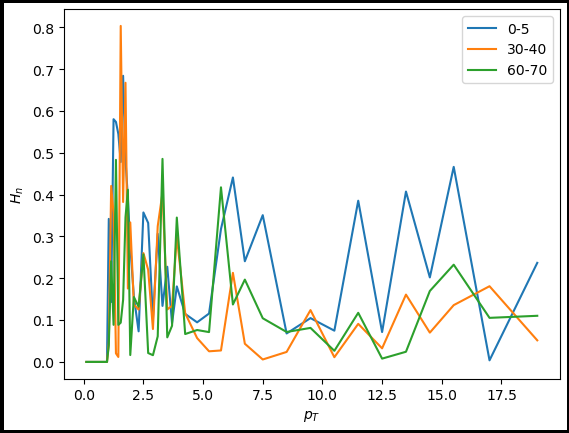

In [41]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$H_n$')
pt_tag = 'pt'
phi_tag = 'phi_f'
weight_choice = 'weight'
n = 2

pt_res = 0.1
pt_domain = np.arange(1, 20, pt_res)


p_mask = (total['drift'] == True) & (total['el'] == True) & (total['fg'] == False) & (total['grad'] == False)
mask = (hadrons['drift'] == True) & (hadrons['el'] == True) & (hadrons['fg'] == False) & (hadrons['grad'] == False)


for cent in np.array(['0-5', '30-40', '60-70']):
    alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    mean_harm_array = np.array([])
    print('Computing harmonics for {}% Centrality'.format(cent))

    
    for i in np.arange(0, len(alice_pbpb_pt_array)):
        pt = alice_pbpb_pt_array[i]
        pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        #pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        cut_df = hadrons[(hadrons[pt_tag] >= binmin) & (hadrons[pt_tag] < binmax) & (hadrons['cent'] == cent) & mask]
        
        # Compute complex harmonic for each jet
        if n == 0:
            comp_harm_array = np.exp(1j * n * np.mod((cut_df['phi_f'] - cut_df['psi_{}'.format(n)]), 2*np.pi))
        else:
            comp_harm_p_array = np.exp(1j * n * np.mod((cut_df['phi_f'] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_n_array = np.exp(-1j * n * np.mod((cut_df['phi_f'] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # average real and imaginary parts separately
        if np.sum(cut_df[weight_choice]) == 0:
            mean_real_harm = 0
            mean_imag_harm = 0
        else:
            mean_real_harm = np.average(real_harm_array, weights=cut_df[weight_choice])
            mean_imag_harm = np.average(imag_harm_array, weights=cut_df[weight_choice])
    
        # Compute magnitude
        mean_harm = np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.plot(alice_pbpb_pt_array, mean_harm_array, label=cent)
axis.legend()

Computing harmonics for pp
Computing harmonics for AA (EL)
Computing harmonics for PbPb (EL + Drift)


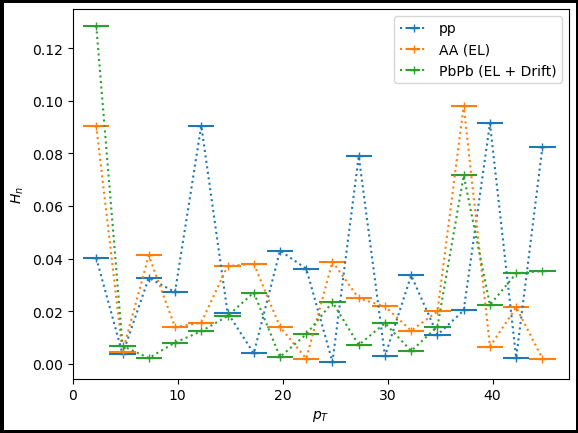

In [42]:
fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.set_xlabel(r'$p_T$')
axis.set_ylabel(r'$H_n$')
pt_tag = 'jet_pT_f'
phi_tag = 'phi_f'
weight_choice = 'new_weight'
n = 2

pt_res = 2.5
num_pt_points = 18
pt_domain = np.array([1+((point+0.5)*pt_res) for point in np.arange(0, num_pt_points)])
axis.set_xlim(0, pt_domain[-1]+pt_res)




for case in np.array(['pp', 'AA (EL)', 'PbPb (EL + Drift)']):
    # alice_pbpb_pt_array = PbPb_data[PbPb_data['cent'] == cent]['pt'].to_numpy()
    # alice_pbpb_pt_top_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_1'].to_numpy()
    # alice_pbpb_pt_bottom_array = PbPb_data[PbPb_data['cent'] == cent]['bin_edge_0'].to_numpy()
    


    
    mean_harm_array = np.array([])
    print('Computing harmonics for {}'.format(case))
    
    for i in np.arange(0, len(pt_domain)):
        # pt = alice_pbpb_pt_array[i]
        # pt_res = alice_pbpb_pt_top_array[i] - alice_pbpb_pt_bottom_array[i]
        pt = pt_domain[i]
        # Determine current p_T bin bounds
        # !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        # Probably not good
        binmin = pt - (pt_res/2)
        binmax = pt + (pt_res/2)
        

        if case == 'AA (EL)':
            phi_series = 'phi_f'
            pt_series = 'jet_pT_f'
            p_mask = (total['drift'] == False) & (total['el'] == True) & (total['grad'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)
        
        elif case == 'PbPb (EL + Drift)':
            phi_series = 'phi_f'
            pt_series = 'jet_pT_f'
            p_mask = (total['drift'] == True) & (total['el'] == True)  & (total['grad'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)
            
        elif case == 'pp':
            phi_series = 'phi_0'
            pt_series = 'jet_pT'
            p_mask = (total['drift'] == False) & (total['el'] == True)  & (total['grad'] == False) & (total[pt_series] > binmin) & (total[pt_series] < binmax)

        cut_df = total[p_mask] #& (total['cent'] == cent)
        
        # Compute complex harmonic for each jet
        if n == 0:
            comp_harm_array = np.exp(1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
        else:
            comp_harm_p_array = np.exp(1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_n_array = np.exp(-1j * n * np.mod((cut_df[phi_series] - cut_df['psi_{}'.format(n)]), 2*np.pi))
            comp_harm_array = comp_harm_p_array + comp_harm_n_array

        
        # Get real and imaginary parts
        real_harm_array = np.real(comp_harm_array)
        imag_harm_array = np.imag(comp_harm_array)
        
        # average real and imaginary parts separately
        if np.sum(cut_df[weight_choice]) == 0:
            mean_real_harm = 0
            mean_imag_harm = 0
        else:
            mean_real_harm = np.average(real_harm_array, weights=cut_df[weight_choice])
            mean_imag_harm = np.average(imag_harm_array, weights=cut_df[weight_choice])
    
        # Compute magnitude
        mean_harm = np.sqrt((mean_real_harm)**2 + (mean_imag_harm)**2)

        mean_harm_array = np.append(mean_harm_array, mean_harm)
    axis.errorbar(pt_domain, mean_harm_array, label=case, linestyle=':', marker='+', xerr=(pt_res/2))
axis.legend()